## Fashion GAN

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Import necessary libraries**

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

Using TensorFlow backend.


**Load data**

In [3]:
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


Check data content

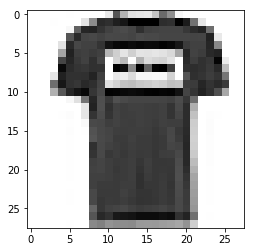

In [4]:
# Choose arbitrary image to load
plt.imshow(X_train[1], cmap='Greys')

Rescale data

In [0]:
# Rescale -1 to 1
X_train = X_train/127.5-1
X_train = np.expand_dims(X_train, axis=3)

**Define functions**

In [0]:
def build_generator():
  model = Sequential()

  model.add(Dense(256, input_dim=100))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))
  
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(1024))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(np.prod((28, 28, 1)), activation='tanh'))
  model.add(Reshape((28, 28, 1)))

  model.summary()

  noise = Input(shape=(100,))
  img = model(noise)

  return Model(noise, img)

In [0]:
def build_discriminator():
  model = Sequential()

  model.add(Flatten(input_shape=(28, 28, 1)))
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(Dense(256))
  model.add(LeakyReLU(0.2))
  model.add(Dense(1, activation='sigmoid'))
  model.summary()

  img = Input(shape=(28, 28, 1))
  validity = model(img)

  return Model(img, validity)

In [0]:
def sample_images(epoch):
  r, c = 5, 5
  noise = np.random.normal(0, 1, (r*c, 100))
  gen_imgs = generator.predict(noise)

  # Rescale images 0 - 1
  gen_imgs = 0.5*gen_imgs+0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
      axs[i, j].axis('off')
      cnt += 1
  #fig.savefig("images/%d.png" % epoch)
  plt.show()
  plt.close()

**Create both generator and discriminator**

In [9]:
# Build the generator
generator = build_generator()

# Generator: takes noise as input and generates images
z = Input(shape=(100,))
img = generator(z)

# Build and compile the discriminator
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])

discriminator.trainable = False

# Discriminator: takes generated images as input and determines validity
validity = discriminator(img)

# The combined model
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))





Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 1024)         

**Train generator and discriminator**

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'



0 [D loss: 0.675882, acc.: 43.75%] [G loss: 0.500580]


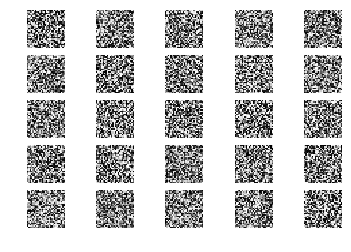

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.596336, acc.: 59.38%] [G loss: 0.579159]
2 [D loss: 0.430536, acc.: 70.31%] [G loss: 0.639343]
3 [D loss: 0.418820, acc.: 67.19%] [G loss: 0.795591]
4 [D loss: 0.339935, acc.: 89.06%] [G loss: 0.939983]
5 [D loss: 0.294779, acc.: 89.06%] [G loss: 1.022647]
6 [D loss: 0.248171, acc.: 100.00%] [G loss: 1.190326]
7 [D loss: 0.216026, acc.: 96.88%] [G loss: 1.185995]
8 [D loss: 0.184765, acc.: 98.44%] [G loss: 1.411005]
9 [D loss: 0.188971, acc.: 100.00%] [G loss: 1.446354]
10 [D loss: 0.160318, acc.: 100.00%] [G loss: 1.482717]
11 [D loss: 0.132169, acc.: 100.00%] [G loss: 1.691868]
12 [D loss: 0.142357, acc.: 100.00%] [G loss: 1.770129]
13 [D loss: 0.146522, acc.: 98.44%] [G loss: 1.812674]
14 [D loss: 0.131404, acc.: 100.00%] [G loss: 1.871228]
15 [D loss: 0.089491, acc.: 100.00%] [G loss: 1.915205]
16 [D loss: 0.118074, acc.: 98.44%] [G loss: 2.062589]
17 [D loss: 0.108382, acc.: 100.00%] [G loss: 2.194648]
18 [D loss: 0.090245, acc.: 100.00%] [G loss: 2.191254]
19 [D loss

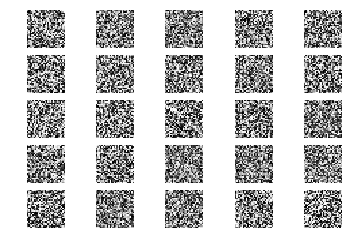

51 [D loss: 0.023365, acc.: 100.00%] [G loss: 3.531897]
52 [D loss: 0.021150, acc.: 100.00%] [G loss: 3.632788]
53 [D loss: 0.057602, acc.: 98.44%] [G loss: 3.613421]
54 [D loss: 0.024152, acc.: 100.00%] [G loss: 3.597664]
55 [D loss: 0.019305, acc.: 100.00%] [G loss: 3.419672]
56 [D loss: 0.021297, acc.: 100.00%] [G loss: 3.734015]
57 [D loss: 0.021655, acc.: 100.00%] [G loss: 3.555145]
58 [D loss: 0.026413, acc.: 100.00%] [G loss: 3.727187]
59 [D loss: 0.019371, acc.: 100.00%] [G loss: 3.565783]
60 [D loss: 0.018097, acc.: 100.00%] [G loss: 3.659982]
61 [D loss: 0.021156, acc.: 100.00%] [G loss: 3.658464]
62 [D loss: 0.020446, acc.: 100.00%] [G loss: 3.688996]
63 [D loss: 0.027389, acc.: 100.00%] [G loss: 3.670407]
64 [D loss: 0.018007, acc.: 100.00%] [G loss: 3.772256]
65 [D loss: 0.027391, acc.: 100.00%] [G loss: 3.821433]
66 [D loss: 0.019682, acc.: 100.00%] [G loss: 3.775916]
67 [D loss: 0.020201, acc.: 100.00%] [G loss: 3.855638]
68 [D loss: 0.016159, acc.: 100.00%] [G loss: 3.9

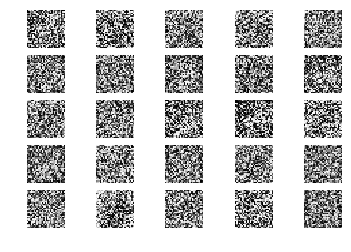

101 [D loss: 0.016517, acc.: 100.00%] [G loss: 4.457003]
102 [D loss: 0.021158, acc.: 100.00%] [G loss: 4.266434]
103 [D loss: 0.015209, acc.: 100.00%] [G loss: 4.383103]
104 [D loss: 0.013825, acc.: 100.00%] [G loss: 4.532175]
105 [D loss: 0.013093, acc.: 100.00%] [G loss: 4.436035]
106 [D loss: 0.016042, acc.: 100.00%] [G loss: 4.499942]
107 [D loss: 0.027873, acc.: 100.00%] [G loss: 4.335712]
108 [D loss: 0.013328, acc.: 100.00%] [G loss: 4.339503]
109 [D loss: 0.017540, acc.: 100.00%] [G loss: 4.523301]
110 [D loss: 0.028314, acc.: 100.00%] [G loss: 4.408511]
111 [D loss: 0.012665, acc.: 100.00%] [G loss: 4.499838]
112 [D loss: 0.014602, acc.: 100.00%] [G loss: 4.641814]
113 [D loss: 0.017106, acc.: 100.00%] [G loss: 4.656717]
114 [D loss: 0.017170, acc.: 100.00%] [G loss: 4.554298]
115 [D loss: 0.024052, acc.: 100.00%] [G loss: 4.410728]
116 [D loss: 0.013495, acc.: 100.00%] [G loss: 4.564353]
117 [D loss: 0.020425, acc.: 100.00%] [G loss: 4.674614]
118 [D loss: 0.014964, acc.: 10

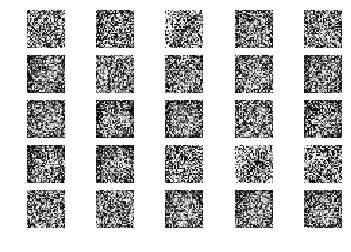

151 [D loss: 0.050765, acc.: 98.44%] [G loss: 4.451891]
152 [D loss: 0.022772, acc.: 100.00%] [G loss: 4.224948]
153 [D loss: 0.018221, acc.: 100.00%] [G loss: 4.180040]
154 [D loss: 0.033796, acc.: 100.00%] [G loss: 4.264286]
155 [D loss: 0.049296, acc.: 100.00%] [G loss: 5.007711]
156 [D loss: 0.127300, acc.: 95.31%] [G loss: 3.746118]
157 [D loss: 0.109187, acc.: 93.75%] [G loss: 4.397705]
158 [D loss: 0.022785, acc.: 100.00%] [G loss: 5.161609]
159 [D loss: 0.187037, acc.: 92.19%] [G loss: 4.144216]
160 [D loss: 0.046678, acc.: 96.88%] [G loss: 4.330039]
161 [D loss: 0.075086, acc.: 96.88%] [G loss: 4.228233]
162 [D loss: 0.025338, acc.: 100.00%] [G loss: 4.357993]
163 [D loss: 0.074862, acc.: 98.44%] [G loss: 4.180083]
164 [D loss: 0.080837, acc.: 96.88%] [G loss: 4.001958]
165 [D loss: 0.113538, acc.: 95.31%] [G loss: 4.966047]
166 [D loss: 0.088812, acc.: 96.88%] [G loss: 5.126138]
167 [D loss: 0.049754, acc.: 98.44%] [G loss: 4.684106]
168 [D loss: 0.084048, acc.: 95.31%] [G lo

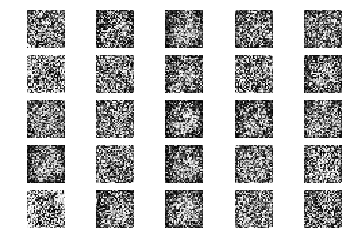

201 [D loss: 0.201421, acc.: 90.62%] [G loss: 4.110641]
202 [D loss: 0.088779, acc.: 98.44%] [G loss: 4.456466]
203 [D loss: 0.162408, acc.: 95.31%] [G loss: 3.608524]
204 [D loss: 0.087090, acc.: 96.88%] [G loss: 3.959632]
205 [D loss: 0.074131, acc.: 96.88%] [G loss: 4.432850]
206 [D loss: 0.122842, acc.: 98.44%] [G loss: 3.826722]
207 [D loss: 0.103786, acc.: 96.88%] [G loss: 4.717952]
208 [D loss: 0.229802, acc.: 92.19%] [G loss: 3.551637]
209 [D loss: 0.258368, acc.: 92.19%] [G loss: 4.050497]
210 [D loss: 0.059213, acc.: 98.44%] [G loss: 4.595824]
211 [D loss: 0.106754, acc.: 98.44%] [G loss: 3.598848]
212 [D loss: 0.090627, acc.: 96.88%] [G loss: 4.087385]
213 [D loss: 0.149614, acc.: 90.62%] [G loss: 3.469059]
214 [D loss: 0.067005, acc.: 96.88%] [G loss: 3.346113]
215 [D loss: 0.155809, acc.: 92.19%] [G loss: 3.875306]
216 [D loss: 0.064148, acc.: 100.00%] [G loss: 4.228277]
217 [D loss: 0.241878, acc.: 92.19%] [G loss: 3.587459]
218 [D loss: 0.134541, acc.: 95.31%] [G loss: 3

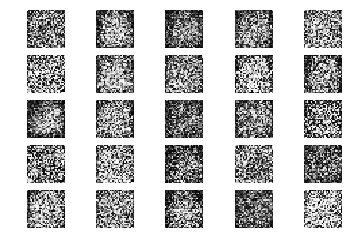

251 [D loss: 0.290575, acc.: 89.06%] [G loss: 2.835749]
252 [D loss: 0.103895, acc.: 96.88%] [G loss: 3.703902]
253 [D loss: 0.195213, acc.: 95.31%] [G loss: 4.281684]
254 [D loss: 0.305017, acc.: 89.06%] [G loss: 3.194576]
255 [D loss: 0.209120, acc.: 90.62%] [G loss: 3.296202]
256 [D loss: 0.144538, acc.: 93.75%] [G loss: 4.415359]
257 [D loss: 0.161681, acc.: 92.19%] [G loss: 3.978117]
258 [D loss: 0.081113, acc.: 96.88%] [G loss: 3.999124]
259 [D loss: 0.150006, acc.: 95.31%] [G loss: 4.067122]
260 [D loss: 0.369979, acc.: 87.50%] [G loss: 3.247465]
261 [D loss: 0.217510, acc.: 92.19%] [G loss: 3.246006]
262 [D loss: 0.182059, acc.: 95.31%] [G loss: 3.392197]
263 [D loss: 0.232135, acc.: 85.94%] [G loss: 3.256658]
264 [D loss: 0.403946, acc.: 79.69%] [G loss: 3.106055]
265 [D loss: 0.181187, acc.: 92.19%] [G loss: 4.498003]
266 [D loss: 0.186096, acc.: 95.31%] [G loss: 4.061733]
267 [D loss: 0.467392, acc.: 78.12%] [G loss: 3.883115]
268 [D loss: 0.256748, acc.: 85.94%] [G loss: 3.

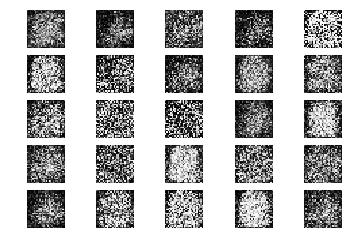

301 [D loss: 0.203213, acc.: 90.62%] [G loss: 3.278801]
302 [D loss: 0.087087, acc.: 98.44%] [G loss: 3.802603]
303 [D loss: 0.436395, acc.: 79.69%] [G loss: 2.928027]
304 [D loss: 0.246128, acc.: 87.50%] [G loss: 3.387584]
305 [D loss: 0.268357, acc.: 87.50%] [G loss: 3.952255]
306 [D loss: 0.346801, acc.: 85.94%] [G loss: 2.968910]
307 [D loss: 0.261625, acc.: 92.19%] [G loss: 3.108494]
308 [D loss: 0.394246, acc.: 84.38%] [G loss: 3.880402]
309 [D loss: 0.711773, acc.: 68.75%] [G loss: 2.166050]
310 [D loss: 0.392612, acc.: 82.81%] [G loss: 3.273239]
311 [D loss: 0.572796, acc.: 79.69%] [G loss: 3.428266]
312 [D loss: 0.402866, acc.: 79.69%] [G loss: 3.003603]
313 [D loss: 0.235354, acc.: 89.06%] [G loss: 2.699282]
314 [D loss: 0.237908, acc.: 85.94%] [G loss: 2.706293]
315 [D loss: 0.186844, acc.: 96.88%] [G loss: 3.492965]
316 [D loss: 0.199119, acc.: 95.31%] [G loss: 3.163759]
317 [D loss: 0.492646, acc.: 78.12%] [G loss: 2.439042]
318 [D loss: 0.200282, acc.: 92.19%] [G loss: 3.

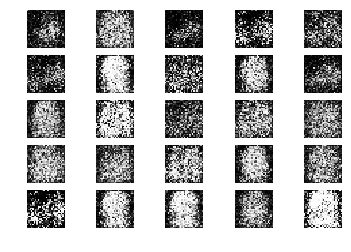

351 [D loss: 0.568517, acc.: 75.00%] [G loss: 3.526750]
352 [D loss: 0.460434, acc.: 82.81%] [G loss: 2.670977]
353 [D loss: 0.311504, acc.: 85.94%] [G loss: 3.477132]
354 [D loss: 0.334420, acc.: 85.94%] [G loss: 3.352400]
355 [D loss: 0.238955, acc.: 92.19%] [G loss: 3.257965]
356 [D loss: 0.550164, acc.: 76.56%] [G loss: 1.727446]
357 [D loss: 0.279817, acc.: 85.94%] [G loss: 2.927845]
358 [D loss: 0.467599, acc.: 84.38%] [G loss: 2.597277]
359 [D loss: 0.523231, acc.: 78.12%] [G loss: 2.155921]
360 [D loss: 0.305320, acc.: 90.62%] [G loss: 2.503412]
361 [D loss: 0.617743, acc.: 73.44%] [G loss: 2.048648]
362 [D loss: 0.515017, acc.: 76.56%] [G loss: 2.622953]
363 [D loss: 0.361141, acc.: 92.19%] [G loss: 2.664677]
364 [D loss: 0.805290, acc.: 70.31%] [G loss: 2.435037]
365 [D loss: 0.488459, acc.: 81.25%] [G loss: 2.628439]
366 [D loss: 0.416924, acc.: 89.06%] [G loss: 2.611992]
367 [D loss: 0.609893, acc.: 68.75%] [G loss: 1.925230]
368 [D loss: 0.461769, acc.: 81.25%] [G loss: 2.

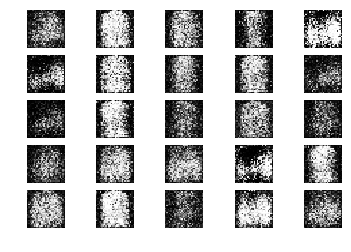

401 [D loss: 0.552905, acc.: 70.31%] [G loss: 1.984705]
402 [D loss: 0.666308, acc.: 62.50%] [G loss: 1.768522]
403 [D loss: 0.683089, acc.: 73.44%] [G loss: 2.020641]
404 [D loss: 0.605350, acc.: 68.75%] [G loss: 1.656088]
405 [D loss: 0.597346, acc.: 60.94%] [G loss: 1.900638]
406 [D loss: 0.560103, acc.: 65.62%] [G loss: 2.078672]
407 [D loss: 0.903010, acc.: 40.62%] [G loss: 1.492697]
408 [D loss: 0.792284, acc.: 59.38%] [G loss: 1.648992]
409 [D loss: 0.463135, acc.: 79.69%] [G loss: 1.720348]
410 [D loss: 0.480543, acc.: 82.81%] [G loss: 1.709736]
411 [D loss: 0.750993, acc.: 60.94%] [G loss: 1.687693]
412 [D loss: 0.660437, acc.: 71.88%] [G loss: 1.912704]
413 [D loss: 0.592547, acc.: 67.19%] [G loss: 1.580922]
414 [D loss: 0.355387, acc.: 89.06%] [G loss: 2.076529]
415 [D loss: 0.744758, acc.: 60.94%] [G loss: 1.542300]
416 [D loss: 0.689322, acc.: 65.62%] [G loss: 1.384248]
417 [D loss: 0.411478, acc.: 85.94%] [G loss: 1.859725]
418 [D loss: 0.576820, acc.: 75.00%] [G loss: 1.

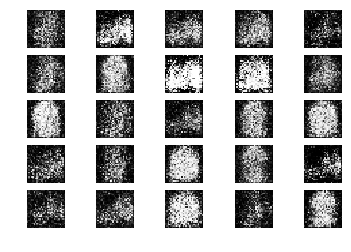

451 [D loss: 0.750378, acc.: 56.25%] [G loss: 1.260081]
452 [D loss: 0.733995, acc.: 62.50%] [G loss: 1.323760]
453 [D loss: 0.700728, acc.: 65.62%] [G loss: 1.297666]
454 [D loss: 0.596791, acc.: 67.19%] [G loss: 1.459532]
455 [D loss: 0.717553, acc.: 59.38%] [G loss: 1.478613]
456 [D loss: 0.668601, acc.: 67.19%] [G loss: 1.345007]
457 [D loss: 0.713775, acc.: 64.06%] [G loss: 1.148540]
458 [D loss: 0.661471, acc.: 60.94%] [G loss: 1.202476]
459 [D loss: 0.883593, acc.: 57.81%] [G loss: 1.227147]
460 [D loss: 0.690435, acc.: 56.25%] [G loss: 1.223439]
461 [D loss: 0.566027, acc.: 76.56%] [G loss: 1.150243]
462 [D loss: 0.780975, acc.: 60.94%] [G loss: 1.178193]
463 [D loss: 0.499158, acc.: 82.81%] [G loss: 1.338089]
464 [D loss: 0.816310, acc.: 56.25%] [G loss: 1.253440]
465 [D loss: 0.646405, acc.: 67.19%] [G loss: 1.342599]
466 [D loss: 0.726065, acc.: 60.94%] [G loss: 1.198312]
467 [D loss: 0.632433, acc.: 60.94%] [G loss: 1.261220]
468 [D loss: 0.703533, acc.: 62.50%] [G loss: 1.

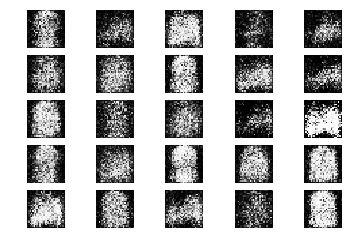

501 [D loss: 0.635231, acc.: 68.75%] [G loss: 1.289929]
502 [D loss: 0.565993, acc.: 78.12%] [G loss: 1.221906]
503 [D loss: 0.615824, acc.: 73.44%] [G loss: 1.351440]
504 [D loss: 0.644886, acc.: 68.75%] [G loss: 1.313740]
505 [D loss: 0.635359, acc.: 60.94%] [G loss: 1.201890]
506 [D loss: 0.654464, acc.: 71.88%] [G loss: 1.289183]
507 [D loss: 0.645930, acc.: 64.06%] [G loss: 1.152143]
508 [D loss: 0.637548, acc.: 64.06%] [G loss: 1.109530]
509 [D loss: 0.633990, acc.: 65.62%] [G loss: 1.134499]
510 [D loss: 0.633100, acc.: 68.75%] [G loss: 1.195313]
511 [D loss: 0.660670, acc.: 68.75%] [G loss: 1.190931]
512 [D loss: 0.530857, acc.: 73.44%] [G loss: 1.329303]
513 [D loss: 0.639309, acc.: 73.44%] [G loss: 1.317726]
514 [D loss: 0.610546, acc.: 71.88%] [G loss: 1.096619]
515 [D loss: 0.592986, acc.: 68.75%] [G loss: 1.135327]
516 [D loss: 0.588891, acc.: 78.12%] [G loss: 1.144365]
517 [D loss: 0.560660, acc.: 68.75%] [G loss: 1.337216]
518 [D loss: 0.692709, acc.: 65.62%] [G loss: 1.

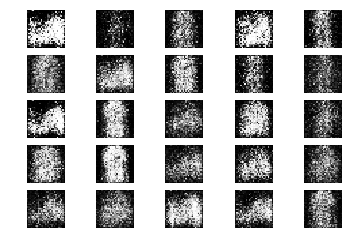

551 [D loss: 0.610170, acc.: 68.75%] [G loss: 1.039689]
552 [D loss: 0.565168, acc.: 73.44%] [G loss: 1.013887]
553 [D loss: 0.513172, acc.: 79.69%] [G loss: 1.208358]
554 [D loss: 0.704705, acc.: 53.12%] [G loss: 1.034175]
555 [D loss: 0.551357, acc.: 75.00%] [G loss: 0.971452]
556 [D loss: 0.591590, acc.: 70.31%] [G loss: 1.054395]
557 [D loss: 0.592778, acc.: 73.44%] [G loss: 1.147375]
558 [D loss: 0.644928, acc.: 60.94%] [G loss: 1.105847]
559 [D loss: 0.581816, acc.: 68.75%] [G loss: 1.235073]
560 [D loss: 0.509550, acc.: 82.81%] [G loss: 1.198334]
561 [D loss: 0.655928, acc.: 67.19%] [G loss: 1.078007]
562 [D loss: 0.561151, acc.: 79.69%] [G loss: 1.056499]
563 [D loss: 0.685932, acc.: 62.50%] [G loss: 1.090563]
564 [D loss: 0.619078, acc.: 68.75%] [G loss: 0.970237]
565 [D loss: 0.652151, acc.: 62.50%] [G loss: 1.042053]
566 [D loss: 0.581431, acc.: 78.12%] [G loss: 1.113078]
567 [D loss: 0.628763, acc.: 64.06%] [G loss: 1.011923]
568 [D loss: 0.638049, acc.: 64.06%] [G loss: 1.

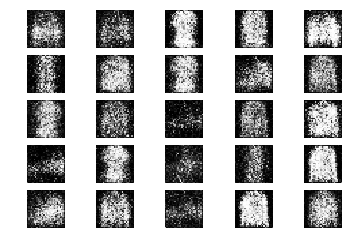

601 [D loss: 0.588660, acc.: 79.69%] [G loss: 1.062379]
602 [D loss: 0.516341, acc.: 73.44%] [G loss: 1.100388]
603 [D loss: 0.590034, acc.: 64.06%] [G loss: 1.072300]
604 [D loss: 0.584002, acc.: 70.31%] [G loss: 1.102894]
605 [D loss: 0.568416, acc.: 76.56%] [G loss: 1.151336]
606 [D loss: 0.620066, acc.: 67.19%] [G loss: 1.117795]
607 [D loss: 0.604839, acc.: 65.62%] [G loss: 1.027934]
608 [D loss: 0.624192, acc.: 65.62%] [G loss: 1.063172]
609 [D loss: 0.691257, acc.: 57.81%] [G loss: 1.013714]
610 [D loss: 0.663827, acc.: 59.38%] [G loss: 0.915739]
611 [D loss: 0.510189, acc.: 79.69%] [G loss: 0.993788]
612 [D loss: 0.671227, acc.: 59.38%] [G loss: 1.156950]
613 [D loss: 0.736607, acc.: 64.06%] [G loss: 1.041245]
614 [D loss: 0.586107, acc.: 71.88%] [G loss: 0.903853]
615 [D loss: 0.560534, acc.: 70.31%] [G loss: 1.071986]
616 [D loss: 0.549813, acc.: 68.75%] [G loss: 1.128497]
617 [D loss: 0.646516, acc.: 71.88%] [G loss: 1.054352]
618 [D loss: 0.665697, acc.: 71.88%] [G loss: 1.

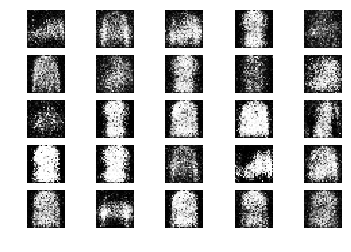

651 [D loss: 0.669055, acc.: 59.38%] [G loss: 1.011551]
652 [D loss: 0.564842, acc.: 76.56%] [G loss: 0.973581]
653 [D loss: 0.522328, acc.: 79.69%] [G loss: 1.099759]
654 [D loss: 0.592262, acc.: 78.12%] [G loss: 1.130011]
655 [D loss: 0.577660, acc.: 71.88%] [G loss: 0.996311]
656 [D loss: 0.592325, acc.: 68.75%] [G loss: 1.057451]
657 [D loss: 0.674810, acc.: 56.25%] [G loss: 0.929235]
658 [D loss: 0.632783, acc.: 62.50%] [G loss: 0.994170]
659 [D loss: 0.567105, acc.: 78.12%] [G loss: 1.009262]
660 [D loss: 0.561449, acc.: 78.12%] [G loss: 1.062289]
661 [D loss: 0.680028, acc.: 60.94%] [G loss: 1.009093]
662 [D loss: 0.612868, acc.: 71.88%] [G loss: 1.065338]
663 [D loss: 0.494369, acc.: 79.69%] [G loss: 1.120063]
664 [D loss: 0.596434, acc.: 64.06%] [G loss: 1.095337]
665 [D loss: 0.548987, acc.: 78.12%] [G loss: 1.093682]
666 [D loss: 0.642268, acc.: 57.81%] [G loss: 1.053836]
667 [D loss: 0.632565, acc.: 64.06%] [G loss: 0.970960]
668 [D loss: 0.565569, acc.: 73.44%] [G loss: 0.

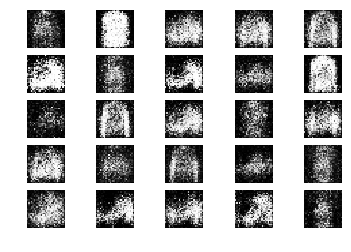

701 [D loss: 0.633065, acc.: 59.38%] [G loss: 0.988841]
702 [D loss: 0.611412, acc.: 65.62%] [G loss: 1.041780]
703 [D loss: 0.627016, acc.: 73.44%] [G loss: 0.892494]
704 [D loss: 0.609887, acc.: 75.00%] [G loss: 0.944437]
705 [D loss: 0.497076, acc.: 82.81%] [G loss: 1.044572]
706 [D loss: 0.635791, acc.: 62.50%] [G loss: 0.967234]
707 [D loss: 0.611055, acc.: 64.06%] [G loss: 0.967043]
708 [D loss: 0.665800, acc.: 65.62%] [G loss: 0.998331]
709 [D loss: 0.542034, acc.: 76.56%] [G loss: 1.039796]
710 [D loss: 0.579998, acc.: 75.00%] [G loss: 0.982718]
711 [D loss: 0.553945, acc.: 73.44%] [G loss: 1.024799]
712 [D loss: 0.620854, acc.: 65.62%] [G loss: 1.044478]
713 [D loss: 0.695260, acc.: 48.44%] [G loss: 1.015018]
714 [D loss: 0.629097, acc.: 65.62%] [G loss: 1.049172]
715 [D loss: 0.629240, acc.: 71.88%] [G loss: 1.029739]
716 [D loss: 0.675102, acc.: 60.94%] [G loss: 0.989003]
717 [D loss: 0.566154, acc.: 76.56%] [G loss: 1.044561]
718 [D loss: 0.594021, acc.: 73.44%] [G loss: 0.

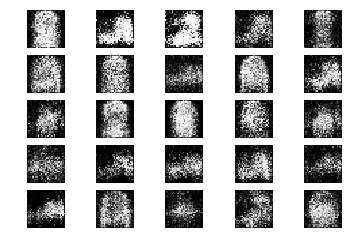

751 [D loss: 0.558521, acc.: 73.44%] [G loss: 1.069073]
752 [D loss: 0.634045, acc.: 62.50%] [G loss: 1.081652]
753 [D loss: 0.621341, acc.: 70.31%] [G loss: 1.123601]
754 [D loss: 0.535468, acc.: 75.00%] [G loss: 1.058154]
755 [D loss: 0.589190, acc.: 65.62%] [G loss: 1.101201]
756 [D loss: 0.679606, acc.: 59.38%] [G loss: 1.034611]
757 [D loss: 0.628407, acc.: 70.31%] [G loss: 1.027936]
758 [D loss: 0.547985, acc.: 75.00%] [G loss: 1.005136]
759 [D loss: 0.565222, acc.: 78.12%] [G loss: 1.012809]
760 [D loss: 0.621653, acc.: 62.50%] [G loss: 0.972812]
761 [D loss: 0.587515, acc.: 70.31%] [G loss: 0.996298]
762 [D loss: 0.689097, acc.: 56.25%] [G loss: 1.019506]
763 [D loss: 0.532167, acc.: 81.25%] [G loss: 1.120278]
764 [D loss: 0.628296, acc.: 60.94%] [G loss: 0.982219]
765 [D loss: 0.664115, acc.: 56.25%] [G loss: 1.054561]
766 [D loss: 0.593764, acc.: 73.44%] [G loss: 1.000013]
767 [D loss: 0.614937, acc.: 65.62%] [G loss: 0.982047]
768 [D loss: 0.600945, acc.: 68.75%] [G loss: 1.

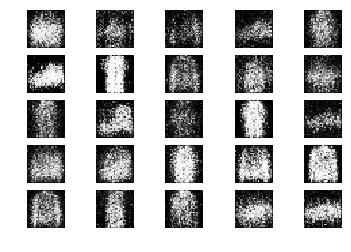

801 [D loss: 0.572209, acc.: 68.75%] [G loss: 1.051434]
802 [D loss: 0.628151, acc.: 62.50%] [G loss: 1.035983]
803 [D loss: 0.637400, acc.: 64.06%] [G loss: 1.041527]
804 [D loss: 0.564823, acc.: 73.44%] [G loss: 0.980509]
805 [D loss: 0.450245, acc.: 84.38%] [G loss: 1.023320]
806 [D loss: 0.600916, acc.: 67.19%] [G loss: 1.106022]
807 [D loss: 0.521994, acc.: 71.88%] [G loss: 1.080945]
808 [D loss: 0.590754, acc.: 65.62%] [G loss: 1.127306]
809 [D loss: 0.604136, acc.: 64.06%] [G loss: 1.072499]
810 [D loss: 0.584507, acc.: 71.88%] [G loss: 1.023343]
811 [D loss: 0.597310, acc.: 64.06%] [G loss: 1.046993]
812 [D loss: 0.551759, acc.: 71.88%] [G loss: 0.981063]
813 [D loss: 0.554246, acc.: 62.50%] [G loss: 1.064613]
814 [D loss: 0.620452, acc.: 67.19%] [G loss: 1.236089]
815 [D loss: 0.651384, acc.: 60.94%] [G loss: 1.168818]
816 [D loss: 0.655000, acc.: 59.38%] [G loss: 1.027821]
817 [D loss: 0.601307, acc.: 68.75%] [G loss: 1.073409]
818 [D loss: 0.691493, acc.: 59.38%] [G loss: 0.

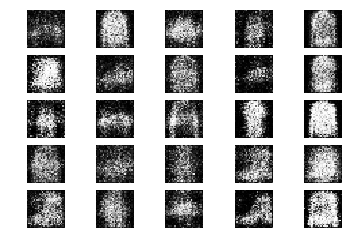

851 [D loss: 0.667251, acc.: 57.81%] [G loss: 1.018892]
852 [D loss: 0.609585, acc.: 65.62%] [G loss: 1.140532]
853 [D loss: 0.663517, acc.: 64.06%] [G loss: 0.993807]
854 [D loss: 0.572999, acc.: 68.75%] [G loss: 1.042958]
855 [D loss: 0.678270, acc.: 60.94%] [G loss: 0.934012]
856 [D loss: 0.627466, acc.: 62.50%] [G loss: 0.885284]
857 [D loss: 0.646910, acc.: 57.81%] [G loss: 1.084958]
858 [D loss: 0.611994, acc.: 67.19%] [G loss: 1.086449]
859 [D loss: 0.594444, acc.: 70.31%] [G loss: 1.048233]
860 [D loss: 0.585790, acc.: 67.19%] [G loss: 1.014591]
861 [D loss: 0.650465, acc.: 62.50%] [G loss: 0.929542]
862 [D loss: 0.591080, acc.: 73.44%] [G loss: 1.019379]
863 [D loss: 0.612501, acc.: 59.38%] [G loss: 0.907570]
864 [D loss: 0.633809, acc.: 67.19%] [G loss: 0.862754]
865 [D loss: 0.590229, acc.: 73.44%] [G loss: 0.829593]
866 [D loss: 0.638220, acc.: 64.06%] [G loss: 0.850785]
867 [D loss: 0.597653, acc.: 70.31%] [G loss: 1.051701]
868 [D loss: 0.629717, acc.: 65.62%] [G loss: 0.

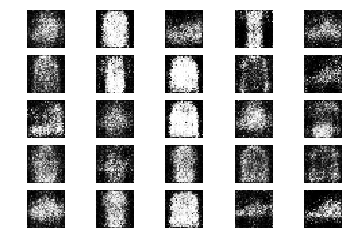

901 [D loss: 0.611209, acc.: 64.06%] [G loss: 0.958337]
902 [D loss: 0.693967, acc.: 54.69%] [G loss: 1.009863]
903 [D loss: 0.678587, acc.: 60.94%] [G loss: 1.083175]
904 [D loss: 0.643983, acc.: 60.94%] [G loss: 0.930324]
905 [D loss: 0.621927, acc.: 60.94%] [G loss: 0.939977]
906 [D loss: 0.563286, acc.: 71.88%] [G loss: 0.941336]
907 [D loss: 0.613094, acc.: 65.62%] [G loss: 0.889676]
908 [D loss: 0.570261, acc.: 73.44%] [G loss: 0.940876]
909 [D loss: 0.673571, acc.: 60.94%] [G loss: 0.920390]
910 [D loss: 0.642965, acc.: 53.12%] [G loss: 0.900570]
911 [D loss: 0.562401, acc.: 75.00%] [G loss: 0.918448]
912 [D loss: 0.570346, acc.: 73.44%] [G loss: 0.953943]
913 [D loss: 0.666571, acc.: 64.06%] [G loss: 1.129950]
914 [D loss: 0.625072, acc.: 64.06%] [G loss: 0.930730]
915 [D loss: 0.509054, acc.: 81.25%] [G loss: 1.067037]
916 [D loss: 0.660317, acc.: 62.50%] [G loss: 1.064170]
917 [D loss: 0.587159, acc.: 68.75%] [G loss: 0.929168]
918 [D loss: 0.530192, acc.: 76.56%] [G loss: 0.

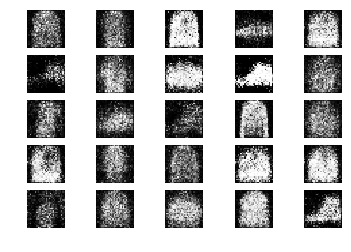

951 [D loss: 0.585739, acc.: 70.31%] [G loss: 0.874616]
952 [D loss: 0.634830, acc.: 68.75%] [G loss: 0.987341]
953 [D loss: 0.588107, acc.: 62.50%] [G loss: 0.949288]
954 [D loss: 0.525713, acc.: 78.12%] [G loss: 1.028756]
955 [D loss: 0.581640, acc.: 65.62%] [G loss: 0.966633]
956 [D loss: 0.604738, acc.: 73.44%] [G loss: 0.958034]
957 [D loss: 0.555436, acc.: 76.56%] [G loss: 0.970446]
958 [D loss: 0.681232, acc.: 51.56%] [G loss: 1.002079]
959 [D loss: 0.552190, acc.: 73.44%] [G loss: 0.949181]
960 [D loss: 0.627899, acc.: 65.62%] [G loss: 0.891135]
961 [D loss: 0.633401, acc.: 65.62%] [G loss: 0.960110]
962 [D loss: 0.635410, acc.: 62.50%] [G loss: 0.885406]
963 [D loss: 0.521873, acc.: 71.88%] [G loss: 0.995025]
964 [D loss: 0.677769, acc.: 56.25%] [G loss: 0.926352]
965 [D loss: 0.609170, acc.: 70.31%] [G loss: 0.939230]
966 [D loss: 0.628721, acc.: 65.62%] [G loss: 0.841730]
967 [D loss: 0.688270, acc.: 56.25%] [G loss: 0.921112]
968 [D loss: 0.528941, acc.: 78.12%] [G loss: 0.

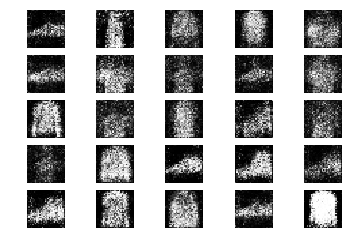

1001 [D loss: 0.578027, acc.: 70.31%] [G loss: 0.849896]
1002 [D loss: 0.595794, acc.: 65.62%] [G loss: 0.872026]
1003 [D loss: 0.605963, acc.: 68.75%] [G loss: 1.015318]
1004 [D loss: 0.619392, acc.: 67.19%] [G loss: 0.850894]
1005 [D loss: 0.679125, acc.: 57.81%] [G loss: 0.969150]
1006 [D loss: 0.593751, acc.: 70.31%] [G loss: 0.975475]
1007 [D loss: 0.624752, acc.: 60.94%] [G loss: 1.011484]
1008 [D loss: 0.601305, acc.: 65.62%] [G loss: 0.973139]
1009 [D loss: 0.589506, acc.: 71.88%] [G loss: 0.990446]
1010 [D loss: 0.682276, acc.: 62.50%] [G loss: 1.016822]
1011 [D loss: 0.598420, acc.: 73.44%] [G loss: 0.964708]
1012 [D loss: 0.585970, acc.: 71.88%] [G loss: 1.008548]
1013 [D loss: 0.535191, acc.: 76.56%] [G loss: 1.062316]
1014 [D loss: 0.633191, acc.: 62.50%] [G loss: 0.951004]
1015 [D loss: 0.597288, acc.: 67.19%] [G loss: 0.962296]
1016 [D loss: 0.661055, acc.: 57.81%] [G loss: 0.879193]
1017 [D loss: 0.589959, acc.: 67.19%] [G loss: 1.023977]
1018 [D loss: 0.601616, acc.: 7

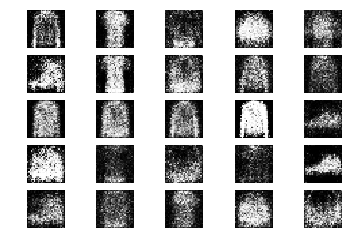

1051 [D loss: 0.527382, acc.: 73.44%] [G loss: 1.135911]
1052 [D loss: 0.700523, acc.: 54.69%] [G loss: 0.991522]
1053 [D loss: 0.562844, acc.: 70.31%] [G loss: 0.958742]
1054 [D loss: 0.608217, acc.: 67.19%] [G loss: 0.887729]
1055 [D loss: 0.564778, acc.: 68.75%] [G loss: 0.876028]
1056 [D loss: 0.628733, acc.: 67.19%] [G loss: 0.942626]
1057 [D loss: 0.571061, acc.: 70.31%] [G loss: 0.893875]
1058 [D loss: 0.637351, acc.: 62.50%] [G loss: 0.778982]
1059 [D loss: 0.534113, acc.: 70.31%] [G loss: 0.891172]
1060 [D loss: 0.632314, acc.: 59.38%] [G loss: 0.973155]
1061 [D loss: 0.540400, acc.: 68.75%] [G loss: 1.039076]
1062 [D loss: 0.546408, acc.: 68.75%] [G loss: 0.941582]
1063 [D loss: 0.576309, acc.: 71.88%] [G loss: 0.990641]
1064 [D loss: 0.574246, acc.: 71.88%] [G loss: 0.871630]
1065 [D loss: 0.565419, acc.: 64.06%] [G loss: 0.986980]
1066 [D loss: 0.602845, acc.: 68.75%] [G loss: 1.054078]
1067 [D loss: 0.614114, acc.: 68.75%] [G loss: 0.976845]
1068 [D loss: 0.597284, acc.: 6

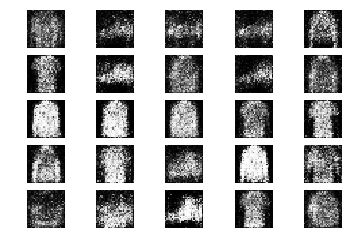

1101 [D loss: 0.576168, acc.: 71.88%] [G loss: 0.978785]
1102 [D loss: 0.610007, acc.: 71.88%] [G loss: 1.002246]
1103 [D loss: 0.665616, acc.: 53.12%] [G loss: 1.017829]
1104 [D loss: 0.538257, acc.: 76.56%] [G loss: 0.960390]
1105 [D loss: 0.594410, acc.: 60.94%] [G loss: 0.978413]
1106 [D loss: 0.638069, acc.: 60.94%] [G loss: 1.030411]
1107 [D loss: 0.518142, acc.: 79.69%] [G loss: 1.007843]
1108 [D loss: 0.527633, acc.: 75.00%] [G loss: 0.991444]
1109 [D loss: 0.547857, acc.: 73.44%] [G loss: 0.963972]
1110 [D loss: 0.591688, acc.: 70.31%] [G loss: 1.034816]
1111 [D loss: 0.556079, acc.: 75.00%] [G loss: 1.008232]
1112 [D loss: 0.608707, acc.: 67.19%] [G loss: 0.967741]
1113 [D loss: 0.585756, acc.: 68.75%] [G loss: 1.149802]
1114 [D loss: 0.633107, acc.: 64.06%] [G loss: 1.036201]
1115 [D loss: 0.588036, acc.: 68.75%] [G loss: 1.023791]
1116 [D loss: 0.652259, acc.: 62.50%] [G loss: 0.980918]
1117 [D loss: 0.607876, acc.: 65.62%] [G loss: 1.016836]
1118 [D loss: 0.585031, acc.: 7

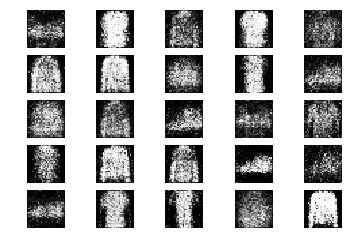

1151 [D loss: 0.602043, acc.: 65.62%] [G loss: 1.001889]
1152 [D loss: 0.617003, acc.: 67.19%] [G loss: 0.929626]
1153 [D loss: 0.678870, acc.: 67.19%] [G loss: 0.894985]
1154 [D loss: 0.636229, acc.: 62.50%] [G loss: 0.912435]
1155 [D loss: 0.608511, acc.: 67.19%] [G loss: 0.976040]
1156 [D loss: 0.647718, acc.: 68.75%] [G loss: 0.985891]
1157 [D loss: 0.625614, acc.: 65.62%] [G loss: 0.965561]
1158 [D loss: 0.617876, acc.: 67.19%] [G loss: 0.854754]
1159 [D loss: 0.698653, acc.: 59.38%] [G loss: 0.984044]
1160 [D loss: 0.705967, acc.: 51.56%] [G loss: 0.851570]
1161 [D loss: 0.631384, acc.: 65.62%] [G loss: 0.875584]
1162 [D loss: 0.575818, acc.: 65.62%] [G loss: 0.908689]
1163 [D loss: 0.610126, acc.: 64.06%] [G loss: 0.950514]
1164 [D loss: 0.531879, acc.: 75.00%] [G loss: 0.946264]
1165 [D loss: 0.601283, acc.: 67.19%] [G loss: 1.022804]
1166 [D loss: 0.583267, acc.: 68.75%] [G loss: 0.934977]
1167 [D loss: 0.551542, acc.: 68.75%] [G loss: 1.019453]
1168 [D loss: 0.618555, acc.: 7

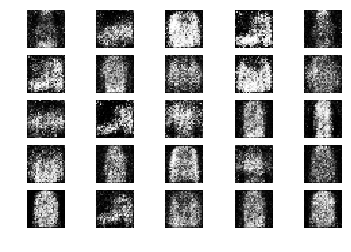

1201 [D loss: 0.654504, acc.: 62.50%] [G loss: 0.832044]
1202 [D loss: 0.629525, acc.: 67.19%] [G loss: 0.973300]
1203 [D loss: 0.741712, acc.: 59.38%] [G loss: 0.868357]
1204 [D loss: 0.560046, acc.: 68.75%] [G loss: 0.996438]
1205 [D loss: 0.651229, acc.: 57.81%] [G loss: 0.976210]
1206 [D loss: 0.671737, acc.: 60.94%] [G loss: 0.965515]
1207 [D loss: 0.545271, acc.: 73.44%] [G loss: 0.930333]
1208 [D loss: 0.651313, acc.: 64.06%] [G loss: 0.884251]
1209 [D loss: 0.639826, acc.: 64.06%] [G loss: 0.995236]
1210 [D loss: 0.631530, acc.: 64.06%] [G loss: 0.925459]
1211 [D loss: 0.632728, acc.: 71.88%] [G loss: 0.918444]
1212 [D loss: 0.661775, acc.: 62.50%] [G loss: 0.898224]
1213 [D loss: 0.622948, acc.: 67.19%] [G loss: 0.854769]
1214 [D loss: 0.625806, acc.: 57.81%] [G loss: 0.966073]
1215 [D loss: 0.636588, acc.: 65.62%] [G loss: 1.008242]
1216 [D loss: 0.641678, acc.: 64.06%] [G loss: 1.014883]
1217 [D loss: 0.609034, acc.: 68.75%] [G loss: 0.926748]
1218 [D loss: 0.584266, acc.: 7

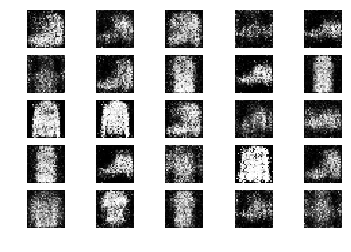

1251 [D loss: 0.576670, acc.: 71.88%] [G loss: 1.037482]
1252 [D loss: 0.662941, acc.: 68.75%] [G loss: 1.005188]
1253 [D loss: 0.545304, acc.: 81.25%] [G loss: 1.001457]
1254 [D loss: 0.647590, acc.: 60.94%] [G loss: 1.028708]
1255 [D loss: 0.694004, acc.: 64.06%] [G loss: 0.926602]
1256 [D loss: 0.609885, acc.: 68.75%] [G loss: 0.861045]
1257 [D loss: 0.554523, acc.: 64.06%] [G loss: 0.957869]
1258 [D loss: 0.604066, acc.: 65.62%] [G loss: 0.888048]
1259 [D loss: 0.606207, acc.: 68.75%] [G loss: 0.912821]
1260 [D loss: 0.642442, acc.: 64.06%] [G loss: 0.953272]
1261 [D loss: 0.611407, acc.: 57.81%] [G loss: 0.904000]
1262 [D loss: 0.585894, acc.: 71.88%] [G loss: 1.047659]
1263 [D loss: 0.620927, acc.: 65.62%] [G loss: 0.875992]
1264 [D loss: 0.677577, acc.: 59.38%] [G loss: 0.968669]
1265 [D loss: 0.645487, acc.: 59.38%] [G loss: 0.975418]
1266 [D loss: 0.631656, acc.: 60.94%] [G loss: 1.025614]
1267 [D loss: 0.671760, acc.: 57.81%] [G loss: 1.005232]
1268 [D loss: 0.610036, acc.: 6

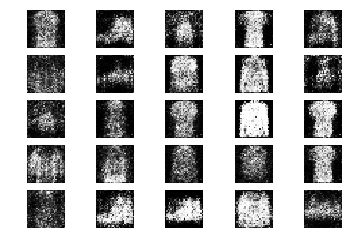

1301 [D loss: 0.622552, acc.: 67.19%] [G loss: 0.906901]
1302 [D loss: 0.584663, acc.: 73.44%] [G loss: 0.965801]
1303 [D loss: 0.612335, acc.: 64.06%] [G loss: 0.936223]
1304 [D loss: 0.591473, acc.: 67.19%] [G loss: 0.953710]
1305 [D loss: 0.662942, acc.: 67.19%] [G loss: 0.942361]
1306 [D loss: 0.646475, acc.: 62.50%] [G loss: 0.895508]
1307 [D loss: 0.548281, acc.: 71.88%] [G loss: 0.935399]
1308 [D loss: 0.622389, acc.: 60.94%] [G loss: 0.913350]
1309 [D loss: 0.526404, acc.: 73.44%] [G loss: 0.970559]
1310 [D loss: 0.603172, acc.: 70.31%] [G loss: 0.978304]
1311 [D loss: 0.628252, acc.: 59.38%] [G loss: 0.991602]
1312 [D loss: 0.623052, acc.: 64.06%] [G loss: 0.881505]
1313 [D loss: 0.647882, acc.: 56.25%] [G loss: 0.912814]
1314 [D loss: 0.625845, acc.: 64.06%] [G loss: 0.909664]
1315 [D loss: 0.593296, acc.: 68.75%] [G loss: 0.917351]
1316 [D loss: 0.636987, acc.: 59.38%] [G loss: 0.986376]
1317 [D loss: 0.638586, acc.: 64.06%] [G loss: 0.993760]
1318 [D loss: 0.661326, acc.: 5

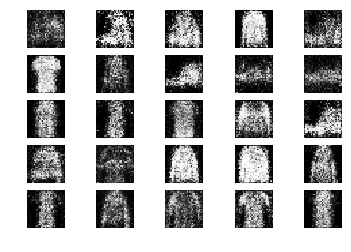

1351 [D loss: 0.647103, acc.: 56.25%] [G loss: 0.911196]
1352 [D loss: 0.546065, acc.: 71.88%] [G loss: 0.908223]
1353 [D loss: 0.552635, acc.: 73.44%] [G loss: 1.037748]
1354 [D loss: 0.681444, acc.: 56.25%] [G loss: 1.013758]
1355 [D loss: 0.667228, acc.: 57.81%] [G loss: 1.027778]
1356 [D loss: 0.570201, acc.: 71.88%] [G loss: 1.025658]
1357 [D loss: 0.588001, acc.: 70.31%] [G loss: 0.970718]
1358 [D loss: 0.573828, acc.: 73.44%] [G loss: 1.036158]
1359 [D loss: 0.634793, acc.: 59.38%] [G loss: 0.944739]
1360 [D loss: 0.518450, acc.: 75.00%] [G loss: 0.939895]
1361 [D loss: 0.608141, acc.: 75.00%] [G loss: 0.948270]
1362 [D loss: 0.633148, acc.: 64.06%] [G loss: 0.976309]
1363 [D loss: 0.594074, acc.: 67.19%] [G loss: 0.930432]
1364 [D loss: 0.646140, acc.: 64.06%] [G loss: 0.901592]
1365 [D loss: 0.648281, acc.: 53.12%] [G loss: 0.903185]
1366 [D loss: 0.588071, acc.: 67.19%] [G loss: 0.943002]
1367 [D loss: 0.659252, acc.: 59.38%] [G loss: 0.958834]
1368 [D loss: 0.618541, acc.: 7

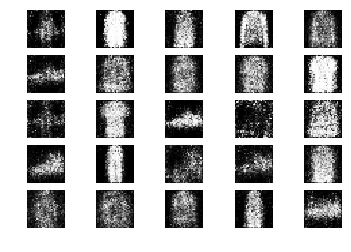

1401 [D loss: 0.658058, acc.: 53.12%] [G loss: 0.956287]
1402 [D loss: 0.533258, acc.: 73.44%] [G loss: 0.924892]
1403 [D loss: 0.516616, acc.: 78.12%] [G loss: 0.914518]
1404 [D loss: 0.711420, acc.: 54.69%] [G loss: 0.967324]
1405 [D loss: 0.561205, acc.: 75.00%] [G loss: 0.920747]
1406 [D loss: 0.589703, acc.: 68.75%] [G loss: 0.864250]
1407 [D loss: 0.642773, acc.: 62.50%] [G loss: 0.828579]
1408 [D loss: 0.563332, acc.: 73.44%] [G loss: 0.789143]
1409 [D loss: 0.704019, acc.: 57.81%] [G loss: 0.923110]
1410 [D loss: 0.631123, acc.: 64.06%] [G loss: 0.959740]
1411 [D loss: 0.614021, acc.: 62.50%] [G loss: 0.946519]
1412 [D loss: 0.594909, acc.: 68.75%] [G loss: 1.001472]
1413 [D loss: 0.587062, acc.: 65.62%] [G loss: 0.938903]
1414 [D loss: 0.569551, acc.: 73.44%] [G loss: 0.895984]
1415 [D loss: 0.614309, acc.: 71.88%] [G loss: 0.959948]
1416 [D loss: 0.687901, acc.: 57.81%] [G loss: 0.946947]
1417 [D loss: 0.605921, acc.: 67.19%] [G loss: 0.955464]
1418 [D loss: 0.605847, acc.: 6

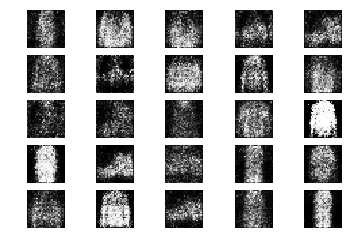

1451 [D loss: 0.602018, acc.: 68.75%] [G loss: 0.942388]
1452 [D loss: 0.619010, acc.: 64.06%] [G loss: 1.062354]
1453 [D loss: 0.564732, acc.: 68.75%] [G loss: 0.929155]
1454 [D loss: 0.603418, acc.: 65.62%] [G loss: 0.976546]
1455 [D loss: 0.636851, acc.: 67.19%] [G loss: 1.021557]
1456 [D loss: 0.626925, acc.: 64.06%] [G loss: 0.924130]
1457 [D loss: 0.636797, acc.: 62.50%] [G loss: 0.986374]
1458 [D loss: 0.618129, acc.: 64.06%] [G loss: 0.951051]
1459 [D loss: 0.639845, acc.: 67.19%] [G loss: 0.906719]
1460 [D loss: 0.633968, acc.: 64.06%] [G loss: 0.897921]
1461 [D loss: 0.686516, acc.: 59.38%] [G loss: 0.924811]
1462 [D loss: 0.584870, acc.: 67.19%] [G loss: 0.896188]
1463 [D loss: 0.637516, acc.: 65.62%] [G loss: 0.914245]
1464 [D loss: 0.650890, acc.: 59.38%] [G loss: 1.016140]
1465 [D loss: 0.642369, acc.: 60.94%] [G loss: 0.958004]
1466 [D loss: 0.619284, acc.: 68.75%] [G loss: 0.991099]
1467 [D loss: 0.509742, acc.: 75.00%] [G loss: 0.928723]
1468 [D loss: 0.659366, acc.: 5

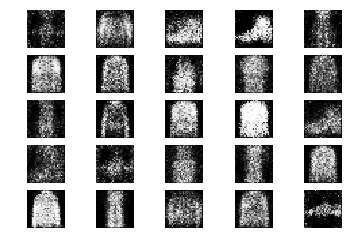

1501 [D loss: 0.593293, acc.: 68.75%] [G loss: 1.008866]
1502 [D loss: 0.641630, acc.: 65.62%] [G loss: 0.928302]
1503 [D loss: 0.672758, acc.: 62.50%] [G loss: 0.812618]
1504 [D loss: 0.653402, acc.: 60.94%] [G loss: 0.808670]
1505 [D loss: 0.619998, acc.: 59.38%] [G loss: 0.809367]
1506 [D loss: 0.568281, acc.: 75.00%] [G loss: 0.866693]
1507 [D loss: 0.601957, acc.: 68.75%] [G loss: 0.856387]
1508 [D loss: 0.702895, acc.: 53.12%] [G loss: 0.933614]
1509 [D loss: 0.520028, acc.: 81.25%] [G loss: 0.916727]
1510 [D loss: 0.670032, acc.: 57.81%] [G loss: 1.004500]
1511 [D loss: 0.652788, acc.: 53.12%] [G loss: 0.952957]
1512 [D loss: 0.631795, acc.: 64.06%] [G loss: 0.938569]
1513 [D loss: 0.657319, acc.: 70.31%] [G loss: 0.871837]
1514 [D loss: 0.637896, acc.: 57.81%] [G loss: 0.894600]
1515 [D loss: 0.617753, acc.: 57.81%] [G loss: 0.923477]
1516 [D loss: 0.651003, acc.: 59.38%] [G loss: 0.938679]
1517 [D loss: 0.727787, acc.: 56.25%] [G loss: 0.871050]
1518 [D loss: 0.624980, acc.: 6

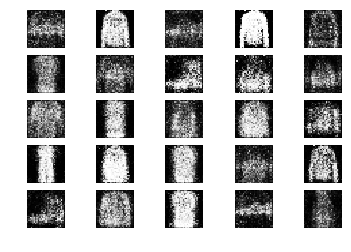

1551 [D loss: 0.649742, acc.: 62.50%] [G loss: 0.943859]
1552 [D loss: 0.631158, acc.: 60.94%] [G loss: 0.938222]
1553 [D loss: 0.647493, acc.: 65.62%] [G loss: 0.879816]
1554 [D loss: 0.624525, acc.: 65.62%] [G loss: 1.012525]
1555 [D loss: 0.560519, acc.: 71.88%] [G loss: 0.971115]
1556 [D loss: 0.600233, acc.: 60.94%] [G loss: 0.955078]
1557 [D loss: 0.588967, acc.: 67.19%] [G loss: 0.910073]
1558 [D loss: 0.615327, acc.: 65.62%] [G loss: 0.816584]
1559 [D loss: 0.617110, acc.: 70.31%] [G loss: 0.932602]
1560 [D loss: 0.585404, acc.: 62.50%] [G loss: 0.827919]
1561 [D loss: 0.652613, acc.: 60.94%] [G loss: 0.862003]
1562 [D loss: 0.609459, acc.: 60.94%] [G loss: 0.845691]
1563 [D loss: 0.621045, acc.: 67.19%] [G loss: 0.866628]
1564 [D loss: 0.675415, acc.: 53.12%] [G loss: 0.942733]
1565 [D loss: 0.607668, acc.: 67.19%] [G loss: 0.947058]
1566 [D loss: 0.668420, acc.: 56.25%] [G loss: 1.009231]
1567 [D loss: 0.630685, acc.: 68.75%] [G loss: 0.924428]
1568 [D loss: 0.657957, acc.: 6

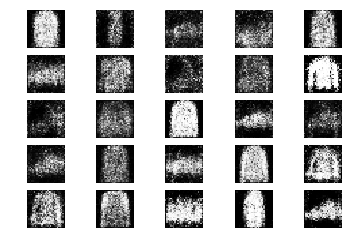

1601 [D loss: 0.649849, acc.: 59.38%] [G loss: 0.845836]
1602 [D loss: 0.634254, acc.: 67.19%] [G loss: 0.749069]
1603 [D loss: 0.580029, acc.: 73.44%] [G loss: 0.912439]
1604 [D loss: 0.655563, acc.: 64.06%] [G loss: 0.856530]
1605 [D loss: 0.552458, acc.: 81.25%] [G loss: 0.989934]
1606 [D loss: 0.624577, acc.: 62.50%] [G loss: 0.919386]
1607 [D loss: 0.702730, acc.: 54.69%] [G loss: 0.901399]
1608 [D loss: 0.665231, acc.: 51.56%] [G loss: 0.890882]
1609 [D loss: 0.604232, acc.: 70.31%] [G loss: 0.904687]
1610 [D loss: 0.622406, acc.: 64.06%] [G loss: 0.951851]
1611 [D loss: 0.545778, acc.: 75.00%] [G loss: 0.894608]
1612 [D loss: 0.621410, acc.: 62.50%] [G loss: 1.041914]
1613 [D loss: 0.583404, acc.: 71.88%] [G loss: 0.916995]
1614 [D loss: 0.587519, acc.: 68.75%] [G loss: 1.020707]
1615 [D loss: 0.624264, acc.: 67.19%] [G loss: 0.847249]
1616 [D loss: 0.561971, acc.: 79.69%] [G loss: 0.902841]
1617 [D loss: 0.603284, acc.: 64.06%] [G loss: 0.821959]
1618 [D loss: 0.668500, acc.: 6

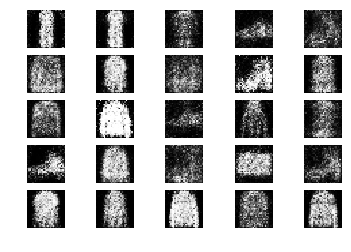

1651 [D loss: 0.596597, acc.: 62.50%] [G loss: 1.028969]
1652 [D loss: 0.702343, acc.: 53.12%] [G loss: 0.864773]
1653 [D loss: 0.652639, acc.: 64.06%] [G loss: 0.881010]
1654 [D loss: 0.592382, acc.: 71.88%] [G loss: 0.908579]
1655 [D loss: 0.540102, acc.: 79.69%] [G loss: 0.936913]
1656 [D loss: 0.578046, acc.: 75.00%] [G loss: 0.928643]
1657 [D loss: 0.633824, acc.: 62.50%] [G loss: 0.958128]
1658 [D loss: 0.590410, acc.: 70.31%] [G loss: 0.845834]
1659 [D loss: 0.629629, acc.: 65.62%] [G loss: 0.914012]
1660 [D loss: 0.589765, acc.: 67.19%] [G loss: 0.857565]
1661 [D loss: 0.615742, acc.: 70.31%] [G loss: 0.856977]
1662 [D loss: 0.660387, acc.: 57.81%] [G loss: 1.003087]
1663 [D loss: 0.599893, acc.: 68.75%] [G loss: 0.832591]
1664 [D loss: 0.602571, acc.: 68.75%] [G loss: 0.798211]
1665 [D loss: 0.612049, acc.: 68.75%] [G loss: 0.885386]
1666 [D loss: 0.599303, acc.: 78.12%] [G loss: 0.851196]
1667 [D loss: 0.697785, acc.: 57.81%] [G loss: 0.889355]
1668 [D loss: 0.688551, acc.: 5

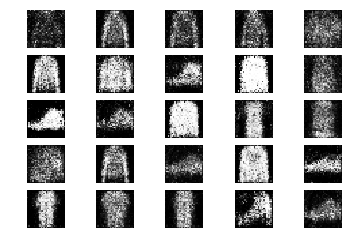

1701 [D loss: 0.654573, acc.: 57.81%] [G loss: 0.930305]
1702 [D loss: 0.664759, acc.: 60.94%] [G loss: 0.870711]
1703 [D loss: 0.595692, acc.: 68.75%] [G loss: 0.846530]
1704 [D loss: 0.654600, acc.: 65.62%] [G loss: 0.845263]
1705 [D loss: 0.665400, acc.: 65.62%] [G loss: 0.890279]
1706 [D loss: 0.601578, acc.: 68.75%] [G loss: 0.836811]
1707 [D loss: 0.594069, acc.: 62.50%] [G loss: 0.949026]
1708 [D loss: 0.638544, acc.: 67.19%] [G loss: 0.883764]
1709 [D loss: 0.596340, acc.: 70.31%] [G loss: 0.945497]
1710 [D loss: 0.589036, acc.: 75.00%] [G loss: 0.908936]
1711 [D loss: 0.596587, acc.: 64.06%] [G loss: 0.914912]
1712 [D loss: 0.665185, acc.: 60.94%] [G loss: 0.954750]
1713 [D loss: 0.603590, acc.: 70.31%] [G loss: 0.817867]
1714 [D loss: 0.600353, acc.: 62.50%] [G loss: 0.864840]
1715 [D loss: 0.582309, acc.: 68.75%] [G loss: 0.904534]
1716 [D loss: 0.607249, acc.: 67.19%] [G loss: 0.843853]
1717 [D loss: 0.603516, acc.: 75.00%] [G loss: 0.802593]
1718 [D loss: 0.603490, acc.: 7

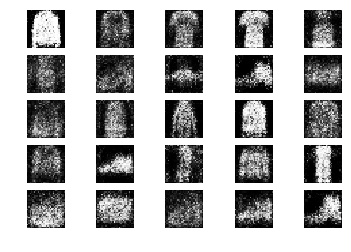

1751 [D loss: 0.646056, acc.: 65.62%] [G loss: 0.915534]
1752 [D loss: 0.632050, acc.: 65.62%] [G loss: 0.894022]
1753 [D loss: 0.568671, acc.: 71.88%] [G loss: 1.027164]
1754 [D loss: 0.627130, acc.: 59.38%] [G loss: 0.932001]
1755 [D loss: 0.656195, acc.: 68.75%] [G loss: 0.911692]
1756 [D loss: 0.598346, acc.: 62.50%] [G loss: 0.971424]
1757 [D loss: 0.676555, acc.: 51.56%] [G loss: 0.900631]
1758 [D loss: 0.637700, acc.: 64.06%] [G loss: 0.989461]
1759 [D loss: 0.612468, acc.: 62.50%] [G loss: 0.886670]
1760 [D loss: 0.618482, acc.: 65.62%] [G loss: 1.032345]
1761 [D loss: 0.594711, acc.: 73.44%] [G loss: 0.978176]
1762 [D loss: 0.608221, acc.: 60.94%] [G loss: 0.912627]
1763 [D loss: 0.579479, acc.: 73.44%] [G loss: 0.841222]
1764 [D loss: 0.624553, acc.: 70.31%] [G loss: 0.951447]
1765 [D loss: 0.526549, acc.: 78.12%] [G loss: 0.964904]
1766 [D loss: 0.602057, acc.: 65.62%] [G loss: 0.973033]
1767 [D loss: 0.589132, acc.: 70.31%] [G loss: 0.993351]
1768 [D loss: 0.674296, acc.: 6

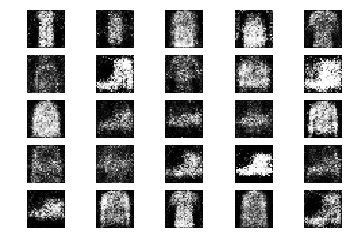

1801 [D loss: 0.651565, acc.: 59.38%] [G loss: 0.844941]
1802 [D loss: 0.607454, acc.: 70.31%] [G loss: 0.898075]
1803 [D loss: 0.585793, acc.: 71.88%] [G loss: 0.896526]
1804 [D loss: 0.608688, acc.: 62.50%] [G loss: 0.985702]
1805 [D loss: 0.643800, acc.: 59.38%] [G loss: 0.920586]
1806 [D loss: 0.650134, acc.: 64.06%] [G loss: 0.907224]
1807 [D loss: 0.596108, acc.: 71.88%] [G loss: 1.035249]
1808 [D loss: 0.672218, acc.: 56.25%] [G loss: 0.870695]
1809 [D loss: 0.663888, acc.: 57.81%] [G loss: 0.861860]
1810 [D loss: 0.640099, acc.: 59.38%] [G loss: 0.929334]
1811 [D loss: 0.591431, acc.: 71.88%] [G loss: 1.034509]
1812 [D loss: 0.605529, acc.: 67.19%] [G loss: 0.932233]
1813 [D loss: 0.641744, acc.: 62.50%] [G loss: 0.887142]
1814 [D loss: 0.589412, acc.: 68.75%] [G loss: 0.934463]
1815 [D loss: 0.589508, acc.: 68.75%] [G loss: 0.981036]
1816 [D loss: 0.605460, acc.: 67.19%] [G loss: 0.867642]
1817 [D loss: 0.608636, acc.: 65.62%] [G loss: 1.047953]
1818 [D loss: 0.630581, acc.: 7

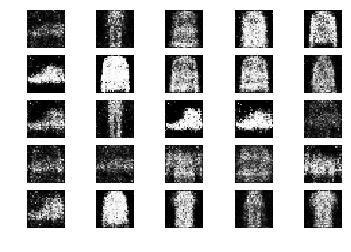

1851 [D loss: 0.629789, acc.: 62.50%] [G loss: 0.969157]
1852 [D loss: 0.577913, acc.: 64.06%] [G loss: 0.867352]
1853 [D loss: 0.626830, acc.: 60.94%] [G loss: 0.876048]
1854 [D loss: 0.660121, acc.: 65.62%] [G loss: 0.858627]
1855 [D loss: 0.603011, acc.: 60.94%] [G loss: 0.839978]
1856 [D loss: 0.634157, acc.: 65.62%] [G loss: 0.910927]
1857 [D loss: 0.581381, acc.: 71.88%] [G loss: 0.934895]
1858 [D loss: 0.629330, acc.: 67.19%] [G loss: 0.971735]
1859 [D loss: 0.580347, acc.: 71.88%] [G loss: 1.016425]
1860 [D loss: 0.620380, acc.: 67.19%] [G loss: 0.887631]
1861 [D loss: 0.528468, acc.: 78.12%] [G loss: 0.874160]
1862 [D loss: 0.679690, acc.: 54.69%] [G loss: 0.918314]
1863 [D loss: 0.585366, acc.: 70.31%] [G loss: 1.025418]
1864 [D loss: 0.595897, acc.: 68.75%] [G loss: 0.904785]
1865 [D loss: 0.620310, acc.: 62.50%] [G loss: 0.849291]
1866 [D loss: 0.531324, acc.: 70.31%] [G loss: 0.930137]
1867 [D loss: 0.609817, acc.: 64.06%] [G loss: 0.879253]
1868 [D loss: 0.712035, acc.: 5

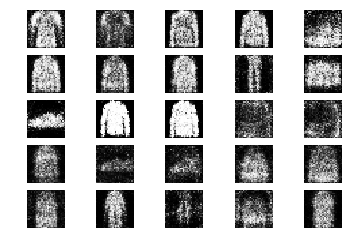

1901 [D loss: 0.637695, acc.: 60.94%] [G loss: 0.984876]
1902 [D loss: 0.600566, acc.: 70.31%] [G loss: 0.905342]
1903 [D loss: 0.561401, acc.: 70.31%] [G loss: 0.933502]
1904 [D loss: 0.612219, acc.: 67.19%] [G loss: 0.963208]
1905 [D loss: 0.694977, acc.: 60.94%] [G loss: 0.974203]
1906 [D loss: 0.563508, acc.: 75.00%] [G loss: 1.041006]
1907 [D loss: 0.618476, acc.: 68.75%] [G loss: 1.019833]
1908 [D loss: 0.699266, acc.: 51.56%] [G loss: 0.908697]
1909 [D loss: 0.593767, acc.: 65.62%] [G loss: 0.954145]
1910 [D loss: 0.614504, acc.: 65.62%] [G loss: 0.888497]
1911 [D loss: 0.623935, acc.: 59.38%] [G loss: 0.893095]
1912 [D loss: 0.594559, acc.: 67.19%] [G loss: 0.896071]
1913 [D loss: 0.626289, acc.: 68.75%] [G loss: 0.880507]
1914 [D loss: 0.533098, acc.: 78.12%] [G loss: 0.967721]
1915 [D loss: 0.628236, acc.: 67.19%] [G loss: 1.005039]
1916 [D loss: 0.720126, acc.: 60.94%] [G loss: 0.906457]
1917 [D loss: 0.617118, acc.: 65.62%] [G loss: 0.961892]
1918 [D loss: 0.611934, acc.: 7

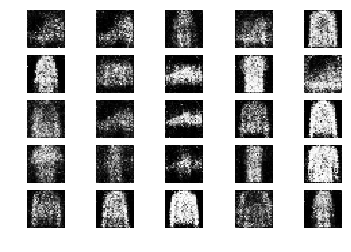

1951 [D loss: 0.579033, acc.: 70.31%] [G loss: 0.847490]
1952 [D loss: 0.626907, acc.: 68.75%] [G loss: 0.972657]
1953 [D loss: 0.634388, acc.: 60.94%] [G loss: 0.919300]
1954 [D loss: 0.589300, acc.: 65.62%] [G loss: 0.844889]
1955 [D loss: 0.668229, acc.: 56.25%] [G loss: 0.908515]
1956 [D loss: 0.562708, acc.: 70.31%] [G loss: 0.876091]
1957 [D loss: 0.659919, acc.: 67.19%] [G loss: 0.924310]
1958 [D loss: 0.611843, acc.: 70.31%] [G loss: 0.938011]
1959 [D loss: 0.705090, acc.: 59.38%] [G loss: 0.966073]
1960 [D loss: 0.669047, acc.: 62.50%] [G loss: 0.970715]
1961 [D loss: 0.618846, acc.: 65.62%] [G loss: 0.856455]
1962 [D loss: 0.627843, acc.: 67.19%] [G loss: 0.890503]
1963 [D loss: 0.649416, acc.: 57.81%] [G loss: 0.953640]
1964 [D loss: 0.609274, acc.: 67.19%] [G loss: 0.838595]
1965 [D loss: 0.617637, acc.: 64.06%] [G loss: 0.892761]
1966 [D loss: 0.565957, acc.: 70.31%] [G loss: 0.828076]
1967 [D loss: 0.684180, acc.: 54.69%] [G loss: 0.870857]
1968 [D loss: 0.593617, acc.: 6

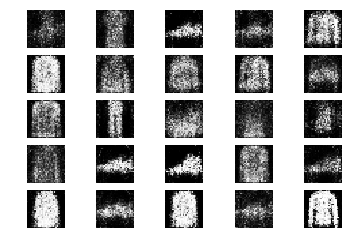

2001 [D loss: 0.629751, acc.: 67.19%] [G loss: 0.922697]
2002 [D loss: 0.573042, acc.: 73.44%] [G loss: 0.900773]
2003 [D loss: 0.651114, acc.: 59.38%] [G loss: 0.844696]
2004 [D loss: 0.594713, acc.: 73.44%] [G loss: 0.882913]
2005 [D loss: 0.625536, acc.: 70.31%] [G loss: 0.863358]
2006 [D loss: 0.629699, acc.: 60.94%] [G loss: 0.888869]
2007 [D loss: 0.631176, acc.: 65.62%] [G loss: 0.889925]
2008 [D loss: 0.608215, acc.: 71.88%] [G loss: 0.894661]
2009 [D loss: 0.626202, acc.: 70.31%] [G loss: 0.925543]
2010 [D loss: 0.633748, acc.: 57.81%] [G loss: 0.831099]
2011 [D loss: 0.591088, acc.: 68.75%] [G loss: 0.849486]
2012 [D loss: 0.595596, acc.: 68.75%] [G loss: 0.865818]
2013 [D loss: 0.623837, acc.: 64.06%] [G loss: 0.793492]
2014 [D loss: 0.712699, acc.: 56.25%] [G loss: 0.826244]
2015 [D loss: 0.625751, acc.: 68.75%] [G loss: 1.009633]
2016 [D loss: 0.573052, acc.: 76.56%] [G loss: 0.957532]
2017 [D loss: 0.602558, acc.: 68.75%] [G loss: 0.854619]
2018 [D loss: 0.611763, acc.: 6

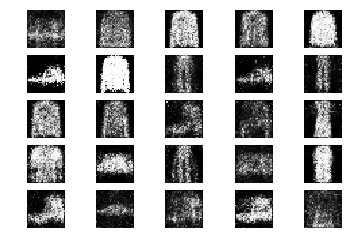

2051 [D loss: 0.624391, acc.: 60.94%] [G loss: 0.947220]
2052 [D loss: 0.634773, acc.: 65.62%] [G loss: 0.982154]
2053 [D loss: 0.607246, acc.: 70.31%] [G loss: 0.865054]
2054 [D loss: 0.648173, acc.: 60.94%] [G loss: 0.847799]
2055 [D loss: 0.630307, acc.: 65.62%] [G loss: 0.935570]
2056 [D loss: 0.610343, acc.: 68.75%] [G loss: 0.861409]
2057 [D loss: 0.644536, acc.: 64.06%] [G loss: 0.914992]
2058 [D loss: 0.601999, acc.: 65.62%] [G loss: 0.874624]
2059 [D loss: 0.683056, acc.: 57.81%] [G loss: 0.902547]
2060 [D loss: 0.618553, acc.: 67.19%] [G loss: 0.889329]
2061 [D loss: 0.619520, acc.: 64.06%] [G loss: 0.812922]
2062 [D loss: 0.617711, acc.: 68.75%] [G loss: 0.994487]
2063 [D loss: 0.673589, acc.: 56.25%] [G loss: 0.912370]
2064 [D loss: 0.680873, acc.: 56.25%] [G loss: 0.954469]
2065 [D loss: 0.602738, acc.: 65.62%] [G loss: 0.956959]
2066 [D loss: 0.686808, acc.: 54.69%] [G loss: 0.962902]
2067 [D loss: 0.667786, acc.: 59.38%] [G loss: 0.974070]
2068 [D loss: 0.612684, acc.: 7

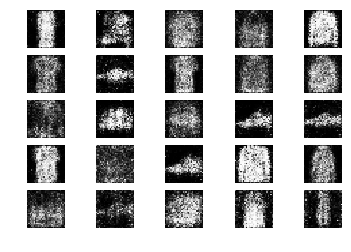

2101 [D loss: 0.604916, acc.: 68.75%] [G loss: 0.915450]
2102 [D loss: 0.635085, acc.: 60.94%] [G loss: 0.887504]
2103 [D loss: 0.661048, acc.: 54.69%] [G loss: 0.885405]
2104 [D loss: 0.667621, acc.: 57.81%] [G loss: 0.997920]
2105 [D loss: 0.566318, acc.: 73.44%] [G loss: 0.843949]
2106 [D loss: 0.583458, acc.: 70.31%] [G loss: 0.997962]
2107 [D loss: 0.595164, acc.: 62.50%] [G loss: 0.892196]
2108 [D loss: 0.610038, acc.: 65.62%] [G loss: 0.859010]
2109 [D loss: 0.570391, acc.: 67.19%] [G loss: 0.893969]
2110 [D loss: 0.644073, acc.: 68.75%] [G loss: 0.905886]
2111 [D loss: 0.647266, acc.: 62.50%] [G loss: 0.913599]
2112 [D loss: 0.570109, acc.: 68.75%] [G loss: 0.937555]
2113 [D loss: 0.676533, acc.: 56.25%] [G loss: 1.009608]
2114 [D loss: 0.617776, acc.: 64.06%] [G loss: 1.007178]
2115 [D loss: 0.588814, acc.: 75.00%] [G loss: 0.870341]
2116 [D loss: 0.687773, acc.: 53.12%] [G loss: 0.945227]
2117 [D loss: 0.669151, acc.: 50.00%] [G loss: 0.893968]
2118 [D loss: 0.712983, acc.: 5

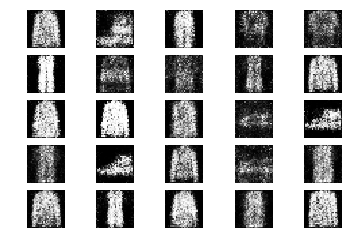

2151 [D loss: 0.617206, acc.: 75.00%] [G loss: 0.913773]
2152 [D loss: 0.615032, acc.: 65.62%] [G loss: 1.017735]
2153 [D loss: 0.654257, acc.: 60.94%] [G loss: 0.941636]
2154 [D loss: 0.620687, acc.: 67.19%] [G loss: 0.937923]
2155 [D loss: 0.545702, acc.: 76.56%] [G loss: 1.000494]
2156 [D loss: 0.600812, acc.: 70.31%] [G loss: 0.994200]
2157 [D loss: 0.600428, acc.: 67.19%] [G loss: 0.983696]
2158 [D loss: 0.608700, acc.: 68.75%] [G loss: 0.926662]
2159 [D loss: 0.724518, acc.: 51.56%] [G loss: 0.817033]
2160 [D loss: 0.663832, acc.: 54.69%] [G loss: 0.953263]
2161 [D loss: 0.557500, acc.: 81.25%] [G loss: 0.906688]
2162 [D loss: 0.606733, acc.: 59.38%] [G loss: 0.962646]
2163 [D loss: 0.638788, acc.: 60.94%] [G loss: 0.924495]
2164 [D loss: 0.563576, acc.: 71.88%] [G loss: 0.858403]
2165 [D loss: 0.563354, acc.: 78.12%] [G loss: 0.906858]
2166 [D loss: 0.647698, acc.: 59.38%] [G loss: 0.930466]
2167 [D loss: 0.607686, acc.: 65.62%] [G loss: 0.844325]
2168 [D loss: 0.628404, acc.: 6

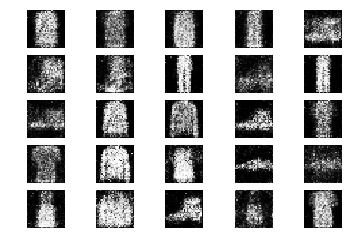

2201 [D loss: 0.654878, acc.: 56.25%] [G loss: 0.930029]
2202 [D loss: 0.662280, acc.: 54.69%] [G loss: 0.785190]
2203 [D loss: 0.607183, acc.: 70.31%] [G loss: 0.902787]
2204 [D loss: 0.574495, acc.: 68.75%] [G loss: 0.847496]
2205 [D loss: 0.685570, acc.: 53.12%] [G loss: 0.903163]
2206 [D loss: 0.598538, acc.: 70.31%] [G loss: 0.922954]
2207 [D loss: 0.626347, acc.: 68.75%] [G loss: 0.973474]
2208 [D loss: 0.695914, acc.: 45.31%] [G loss: 0.956566]
2209 [D loss: 0.617554, acc.: 65.62%] [G loss: 1.032325]
2210 [D loss: 0.656957, acc.: 59.38%] [G loss: 1.022746]
2211 [D loss: 0.632749, acc.: 57.81%] [G loss: 0.988786]
2212 [D loss: 0.512941, acc.: 75.00%] [G loss: 1.061443]
2213 [D loss: 0.620367, acc.: 67.19%] [G loss: 1.017551]
2214 [D loss: 0.652422, acc.: 64.06%] [G loss: 0.969754]
2215 [D loss: 0.609070, acc.: 67.19%] [G loss: 0.965067]
2216 [D loss: 0.663722, acc.: 60.94%] [G loss: 1.046247]
2217 [D loss: 0.633183, acc.: 68.75%] [G loss: 0.932401]
2218 [D loss: 0.588085, acc.: 7

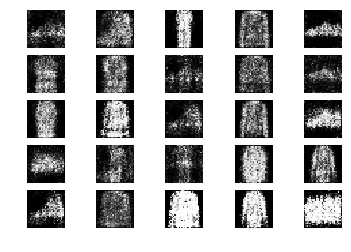

2251 [D loss: 0.654274, acc.: 62.50%] [G loss: 0.991799]
2252 [D loss: 0.582964, acc.: 73.44%] [G loss: 0.964085]
2253 [D loss: 0.575635, acc.: 68.75%] [G loss: 0.917961]
2254 [D loss: 0.655482, acc.: 60.94%] [G loss: 0.960282]
2255 [D loss: 0.584154, acc.: 71.88%] [G loss: 0.933448]
2256 [D loss: 0.628033, acc.: 68.75%] [G loss: 0.972335]
2257 [D loss: 0.635674, acc.: 56.25%] [G loss: 0.882887]
2258 [D loss: 0.614335, acc.: 68.75%] [G loss: 0.913809]
2259 [D loss: 0.636803, acc.: 60.94%] [G loss: 0.956181]
2260 [D loss: 0.634915, acc.: 59.38%] [G loss: 0.961789]
2261 [D loss: 0.623344, acc.: 64.06%] [G loss: 1.002346]
2262 [D loss: 0.591638, acc.: 73.44%] [G loss: 0.943210]
2263 [D loss: 0.654772, acc.: 59.38%] [G loss: 0.973695]
2264 [D loss: 0.603968, acc.: 64.06%] [G loss: 0.866857]
2265 [D loss: 0.641913, acc.: 60.94%] [G loss: 0.999056]
2266 [D loss: 0.604270, acc.: 67.19%] [G loss: 0.995962]
2267 [D loss: 0.594513, acc.: 65.62%] [G loss: 0.930709]
2268 [D loss: 0.556802, acc.: 7

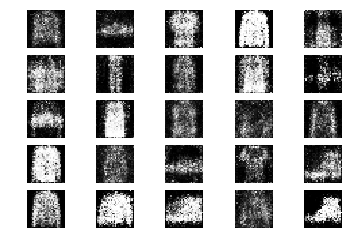

2301 [D loss: 0.693929, acc.: 64.06%] [G loss: 0.911357]
2302 [D loss: 0.593774, acc.: 62.50%] [G loss: 1.017095]
2303 [D loss: 0.641291, acc.: 57.81%] [G loss: 0.888480]
2304 [D loss: 0.610636, acc.: 62.50%] [G loss: 0.969386]
2305 [D loss: 0.577654, acc.: 67.19%] [G loss: 0.864032]
2306 [D loss: 0.628846, acc.: 60.94%] [G loss: 0.938211]
2307 [D loss: 0.604330, acc.: 67.19%] [G loss: 0.983427]
2308 [D loss: 0.589823, acc.: 75.00%] [G loss: 0.867162]
2309 [D loss: 0.544994, acc.: 75.00%] [G loss: 0.802388]
2310 [D loss: 0.621691, acc.: 71.88%] [G loss: 0.901194]
2311 [D loss: 0.555773, acc.: 65.62%] [G loss: 1.043639]
2312 [D loss: 0.597374, acc.: 62.50%] [G loss: 0.999978]
2313 [D loss: 0.614262, acc.: 71.88%] [G loss: 0.952693]
2314 [D loss: 0.641861, acc.: 60.94%] [G loss: 0.974845]
2315 [D loss: 0.576779, acc.: 60.94%] [G loss: 1.019610]
2316 [D loss: 0.636587, acc.: 64.06%] [G loss: 0.955690]
2317 [D loss: 0.584187, acc.: 70.31%] [G loss: 1.006337]
2318 [D loss: 0.599245, acc.: 6

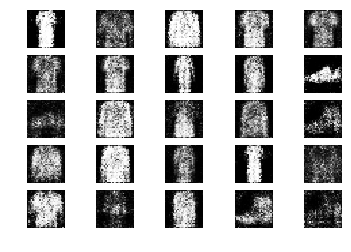

2351 [D loss: 0.577601, acc.: 73.44%] [G loss: 1.060717]
2352 [D loss: 0.621468, acc.: 65.62%] [G loss: 0.907390]
2353 [D loss: 0.582751, acc.: 70.31%] [G loss: 1.014835]
2354 [D loss: 0.610768, acc.: 70.31%] [G loss: 0.928597]
2355 [D loss: 0.630109, acc.: 57.81%] [G loss: 0.943389]
2356 [D loss: 0.563810, acc.: 65.62%] [G loss: 1.016932]
2357 [D loss: 0.653556, acc.: 56.25%] [G loss: 0.938474]
2358 [D loss: 0.592842, acc.: 68.75%] [G loss: 1.078446]
2359 [D loss: 0.575178, acc.: 70.31%] [G loss: 1.067136]
2360 [D loss: 0.555321, acc.: 75.00%] [G loss: 1.059316]
2361 [D loss: 0.665279, acc.: 57.81%] [G loss: 0.962427]
2362 [D loss: 0.570178, acc.: 64.06%] [G loss: 0.944552]
2363 [D loss: 0.604071, acc.: 64.06%] [G loss: 0.819648]
2364 [D loss: 0.603590, acc.: 65.62%] [G loss: 0.880072]
2365 [D loss: 0.560943, acc.: 70.31%] [G loss: 0.974335]
2366 [D loss: 0.627010, acc.: 60.94%] [G loss: 0.955126]
2367 [D loss: 0.626942, acc.: 65.62%] [G loss: 1.009882]
2368 [D loss: 0.601263, acc.: 6

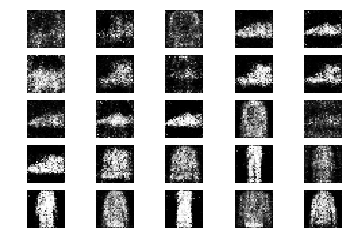

2401 [D loss: 0.677335, acc.: 65.62%] [G loss: 0.951752]
2402 [D loss: 0.561277, acc.: 76.56%] [G loss: 0.991167]
2403 [D loss: 0.622682, acc.: 68.75%] [G loss: 0.953460]
2404 [D loss: 0.702521, acc.: 53.12%] [G loss: 0.842229]
2405 [D loss: 0.637824, acc.: 62.50%] [G loss: 0.942073]
2406 [D loss: 0.633288, acc.: 68.75%] [G loss: 0.972817]
2407 [D loss: 0.637152, acc.: 64.06%] [G loss: 1.014907]
2408 [D loss: 0.591008, acc.: 68.75%] [G loss: 0.953529]
2409 [D loss: 0.615443, acc.: 64.06%] [G loss: 0.959234]
2410 [D loss: 0.654366, acc.: 54.69%] [G loss: 0.995984]
2411 [D loss: 0.600698, acc.: 68.75%] [G loss: 0.964488]
2412 [D loss: 0.573041, acc.: 73.44%] [G loss: 1.018453]
2413 [D loss: 0.623352, acc.: 64.06%] [G loss: 0.909183]
2414 [D loss: 0.562770, acc.: 70.31%] [G loss: 0.885102]
2415 [D loss: 0.635603, acc.: 65.62%] [G loss: 0.940838]
2416 [D loss: 0.637557, acc.: 62.50%] [G loss: 1.009675]
2417 [D loss: 0.579564, acc.: 71.88%] [G loss: 0.890227]
2418 [D loss: 0.536938, acc.: 7

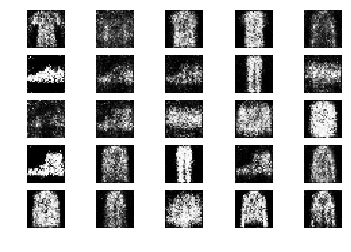

2451 [D loss: 0.630760, acc.: 64.06%] [G loss: 0.914875]
2452 [D loss: 0.546442, acc.: 78.12%] [G loss: 0.974203]
2453 [D loss: 0.679762, acc.: 50.00%] [G loss: 0.959463]
2454 [D loss: 0.612637, acc.: 65.62%] [G loss: 0.903274]
2455 [D loss: 0.612273, acc.: 67.19%] [G loss: 0.984969]
2456 [D loss: 0.545387, acc.: 73.44%] [G loss: 0.937819]
2457 [D loss: 0.622762, acc.: 65.62%] [G loss: 0.921576]
2458 [D loss: 0.572302, acc.: 64.06%] [G loss: 0.978519]
2459 [D loss: 0.660544, acc.: 59.38%] [G loss: 0.862688]
2460 [D loss: 0.627216, acc.: 54.69%] [G loss: 0.983318]
2461 [D loss: 0.674703, acc.: 65.62%] [G loss: 1.025910]
2462 [D loss: 0.591323, acc.: 68.75%] [G loss: 0.976403]
2463 [D loss: 0.618800, acc.: 68.75%] [G loss: 0.962298]
2464 [D loss: 0.546236, acc.: 78.12%] [G loss: 0.900463]
2465 [D loss: 0.585477, acc.: 65.62%] [G loss: 0.965253]
2466 [D loss: 0.648902, acc.: 54.69%] [G loss: 1.016249]
2467 [D loss: 0.568612, acc.: 71.88%] [G loss: 0.938973]
2468 [D loss: 0.561550, acc.: 7

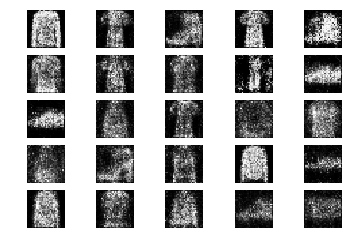

2501 [D loss: 0.647408, acc.: 60.94%] [G loss: 0.991660]
2502 [D loss: 0.635545, acc.: 64.06%] [G loss: 0.931807]
2503 [D loss: 0.567267, acc.: 71.88%] [G loss: 1.019516]
2504 [D loss: 0.691001, acc.: 54.69%] [G loss: 0.918864]
2505 [D loss: 0.656284, acc.: 53.12%] [G loss: 0.863804]
2506 [D loss: 0.652507, acc.: 65.62%] [G loss: 0.994845]
2507 [D loss: 0.597783, acc.: 67.19%] [G loss: 0.972693]
2508 [D loss: 0.680287, acc.: 60.94%] [G loss: 0.882282]
2509 [D loss: 0.676100, acc.: 56.25%] [G loss: 0.891024]
2510 [D loss: 0.607602, acc.: 67.19%] [G loss: 0.965241]
2511 [D loss: 0.656331, acc.: 59.38%] [G loss: 0.882571]
2512 [D loss: 0.636326, acc.: 68.75%] [G loss: 0.869882]
2513 [D loss: 0.638629, acc.: 65.62%] [G loss: 0.928445]
2514 [D loss: 0.567260, acc.: 68.75%] [G loss: 1.021630]
2515 [D loss: 0.620094, acc.: 62.50%] [G loss: 1.025022]
2516 [D loss: 0.583527, acc.: 68.75%] [G loss: 0.925052]
2517 [D loss: 0.614609, acc.: 67.19%] [G loss: 1.024445]
2518 [D loss: 0.615354, acc.: 6

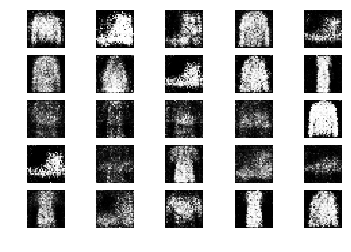

2551 [D loss: 0.573905, acc.: 65.62%] [G loss: 0.926418]
2552 [D loss: 0.638756, acc.: 65.62%] [G loss: 0.943974]
2553 [D loss: 0.665928, acc.: 57.81%] [G loss: 0.907046]
2554 [D loss: 0.645966, acc.: 62.50%] [G loss: 0.896230]
2555 [D loss: 0.635194, acc.: 64.06%] [G loss: 0.873864]
2556 [D loss: 0.644633, acc.: 62.50%] [G loss: 0.971174]
2557 [D loss: 0.665608, acc.: 64.06%] [G loss: 0.870020]
2558 [D loss: 0.595312, acc.: 65.62%] [G loss: 0.931045]
2559 [D loss: 0.623243, acc.: 57.81%] [G loss: 0.921458]
2560 [D loss: 0.569607, acc.: 71.88%] [G loss: 0.935052]
2561 [D loss: 0.571958, acc.: 73.44%] [G loss: 0.872291]
2562 [D loss: 0.589497, acc.: 65.62%] [G loss: 0.898503]
2563 [D loss: 0.616765, acc.: 67.19%] [G loss: 0.986751]
2564 [D loss: 0.657000, acc.: 60.94%] [G loss: 0.881174]
2565 [D loss: 0.603780, acc.: 68.75%] [G loss: 0.928525]
2566 [D loss: 0.632330, acc.: 62.50%] [G loss: 0.861429]
2567 [D loss: 0.603306, acc.: 62.50%] [G loss: 1.016351]
2568 [D loss: 0.644911, acc.: 6

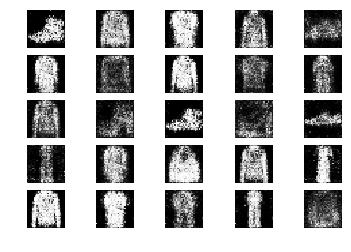

2601 [D loss: 0.590914, acc.: 68.75%] [G loss: 1.062502]
2602 [D loss: 0.604748, acc.: 73.44%] [G loss: 0.904680]
2603 [D loss: 0.634921, acc.: 57.81%] [G loss: 0.909252]
2604 [D loss: 0.535476, acc.: 78.12%] [G loss: 0.889293]
2605 [D loss: 0.685956, acc.: 51.56%] [G loss: 0.930697]
2606 [D loss: 0.673263, acc.: 50.00%] [G loss: 1.028557]
2607 [D loss: 0.629227, acc.: 65.62%] [G loss: 1.040412]
2608 [D loss: 0.626741, acc.: 67.19%] [G loss: 0.944204]
2609 [D loss: 0.567432, acc.: 78.12%] [G loss: 0.947391]
2610 [D loss: 0.661307, acc.: 68.75%] [G loss: 0.946796]
2611 [D loss: 0.599081, acc.: 73.44%] [G loss: 0.972807]
2612 [D loss: 0.607090, acc.: 67.19%] [G loss: 0.921046]
2613 [D loss: 0.658263, acc.: 62.50%] [G loss: 0.896247]
2614 [D loss: 0.586152, acc.: 67.19%] [G loss: 0.979934]
2615 [D loss: 0.554975, acc.: 70.31%] [G loss: 0.894139]
2616 [D loss: 0.585354, acc.: 68.75%] [G loss: 0.967318]
2617 [D loss: 0.618026, acc.: 57.81%] [G loss: 0.872730]
2618 [D loss: 0.555470, acc.: 7

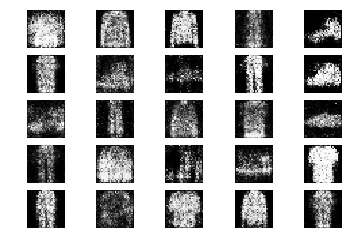

2651 [D loss: 0.618229, acc.: 71.88%] [G loss: 0.895838]
2652 [D loss: 0.645025, acc.: 59.38%] [G loss: 0.966244]
2653 [D loss: 0.673523, acc.: 56.25%] [G loss: 0.936770]
2654 [D loss: 0.581019, acc.: 68.75%] [G loss: 1.008663]
2655 [D loss: 0.705524, acc.: 54.69%] [G loss: 0.959811]
2656 [D loss: 0.625995, acc.: 68.75%] [G loss: 0.912859]
2657 [D loss: 0.629673, acc.: 68.75%] [G loss: 0.921634]
2658 [D loss: 0.593622, acc.: 68.75%] [G loss: 0.905518]
2659 [D loss: 0.574232, acc.: 68.75%] [G loss: 0.993847]
2660 [D loss: 0.588524, acc.: 65.62%] [G loss: 1.064963]
2661 [D loss: 0.611338, acc.: 62.50%] [G loss: 0.922021]
2662 [D loss: 0.591687, acc.: 71.88%] [G loss: 0.984445]
2663 [D loss: 0.624866, acc.: 71.88%] [G loss: 0.815117]
2664 [D loss: 0.607180, acc.: 62.50%] [G loss: 1.065136]
2665 [D loss: 0.604457, acc.: 65.62%] [G loss: 0.885644]
2666 [D loss: 0.635204, acc.: 64.06%] [G loss: 0.942461]
2667 [D loss: 0.578263, acc.: 75.00%] [G loss: 0.909863]
2668 [D loss: 0.613924, acc.: 6

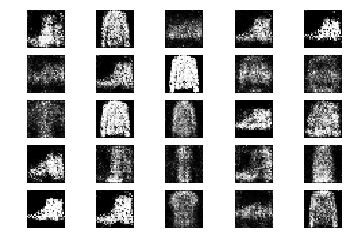

2701 [D loss: 0.637887, acc.: 60.94%] [G loss: 0.991956]
2702 [D loss: 0.600247, acc.: 71.88%] [G loss: 0.992565]
2703 [D loss: 0.651613, acc.: 59.38%] [G loss: 1.004842]
2704 [D loss: 0.664860, acc.: 56.25%] [G loss: 0.922053]
2705 [D loss: 0.561832, acc.: 67.19%] [G loss: 1.020257]
2706 [D loss: 0.588132, acc.: 65.62%] [G loss: 1.128787]
2707 [D loss: 0.609278, acc.: 62.50%] [G loss: 0.954037]
2708 [D loss: 0.626949, acc.: 68.75%] [G loss: 0.907392]
2709 [D loss: 0.560064, acc.: 75.00%] [G loss: 0.863911]
2710 [D loss: 0.653957, acc.: 60.94%] [G loss: 0.926004]
2711 [D loss: 0.533430, acc.: 73.44%] [G loss: 0.965129]
2712 [D loss: 0.630054, acc.: 60.94%] [G loss: 0.949133]
2713 [D loss: 0.570067, acc.: 75.00%] [G loss: 1.013654]
2714 [D loss: 0.634988, acc.: 65.62%] [G loss: 1.068914]
2715 [D loss: 0.641262, acc.: 59.38%] [G loss: 0.794533]
2716 [D loss: 0.567125, acc.: 67.19%] [G loss: 0.973199]
2717 [D loss: 0.605879, acc.: 68.75%] [G loss: 1.153159]
2718 [D loss: 0.567167, acc.: 7

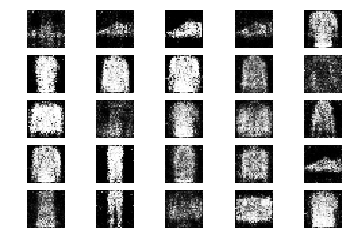

2751 [D loss: 0.676922, acc.: 54.69%] [G loss: 0.901191]
2752 [D loss: 0.557300, acc.: 78.12%] [G loss: 0.941071]
2753 [D loss: 0.671697, acc.: 51.56%] [G loss: 1.011719]
2754 [D loss: 0.555897, acc.: 78.12%] [G loss: 0.987623]
2755 [D loss: 0.618500, acc.: 60.94%] [G loss: 0.993142]
2756 [D loss: 0.660454, acc.: 60.94%] [G loss: 0.878513]
2757 [D loss: 0.615186, acc.: 68.75%] [G loss: 0.937994]
2758 [D loss: 0.601910, acc.: 68.75%] [G loss: 0.843121]
2759 [D loss: 0.644009, acc.: 62.50%] [G loss: 0.869989]
2760 [D loss: 0.610637, acc.: 67.19%] [G loss: 0.911467]
2761 [D loss: 0.669535, acc.: 60.94%] [G loss: 0.837589]
2762 [D loss: 0.570283, acc.: 70.31%] [G loss: 0.951638]
2763 [D loss: 0.612716, acc.: 64.06%] [G loss: 0.983952]
2764 [D loss: 0.661045, acc.: 54.69%] [G loss: 0.939310]
2765 [D loss: 0.600199, acc.: 71.88%] [G loss: 0.981852]
2766 [D loss: 0.653340, acc.: 64.06%] [G loss: 0.983742]
2767 [D loss: 0.658871, acc.: 50.00%] [G loss: 0.894931]
2768 [D loss: 0.643157, acc.: 6

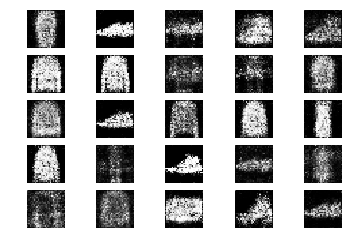

2801 [D loss: 0.594571, acc.: 75.00%] [G loss: 0.934256]
2802 [D loss: 0.691890, acc.: 54.69%] [G loss: 0.935664]
2803 [D loss: 0.642566, acc.: 64.06%] [G loss: 0.921629]
2804 [D loss: 0.635095, acc.: 71.88%] [G loss: 0.900097]
2805 [D loss: 0.591127, acc.: 73.44%] [G loss: 0.900023]
2806 [D loss: 0.607840, acc.: 67.19%] [G loss: 1.001684]
2807 [D loss: 0.634325, acc.: 64.06%] [G loss: 0.862299]
2808 [D loss: 0.581559, acc.: 64.06%] [G loss: 0.995821]
2809 [D loss: 0.624980, acc.: 60.94%] [G loss: 1.042429]
2810 [D loss: 0.607714, acc.: 65.62%] [G loss: 0.998952]
2811 [D loss: 0.621181, acc.: 70.31%] [G loss: 0.953739]
2812 [D loss: 0.613994, acc.: 60.94%] [G loss: 0.987385]
2813 [D loss: 0.582590, acc.: 68.75%] [G loss: 0.961084]
2814 [D loss: 0.618426, acc.: 62.50%] [G loss: 0.961999]
2815 [D loss: 0.677291, acc.: 59.38%] [G loss: 0.901966]
2816 [D loss: 0.613044, acc.: 68.75%] [G loss: 0.886117]
2817 [D loss: 0.633613, acc.: 62.50%] [G loss: 0.926430]
2818 [D loss: 0.614928, acc.: 7

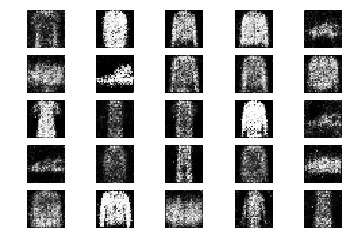

2851 [D loss: 0.719602, acc.: 50.00%] [G loss: 0.850383]
2852 [D loss: 0.615742, acc.: 60.94%] [G loss: 1.018294]
2853 [D loss: 0.593680, acc.: 71.88%] [G loss: 0.885078]
2854 [D loss: 0.600552, acc.: 64.06%] [G loss: 0.938568]
2855 [D loss: 0.534615, acc.: 71.88%] [G loss: 1.048675]
2856 [D loss: 0.659418, acc.: 57.81%] [G loss: 0.892081]
2857 [D loss: 0.532774, acc.: 79.69%] [G loss: 0.975965]
2858 [D loss: 0.641620, acc.: 65.62%] [G loss: 0.857322]
2859 [D loss: 0.643971, acc.: 59.38%] [G loss: 0.969511]
2860 [D loss: 0.544734, acc.: 76.56%] [G loss: 0.911706]
2861 [D loss: 0.625539, acc.: 64.06%] [G loss: 0.915765]
2862 [D loss: 0.561924, acc.: 71.88%] [G loss: 1.033235]
2863 [D loss: 0.639785, acc.: 65.62%] [G loss: 1.052108]
2864 [D loss: 0.602217, acc.: 68.75%] [G loss: 0.925510]
2865 [D loss: 0.533403, acc.: 73.44%] [G loss: 0.966886]
2866 [D loss: 0.585445, acc.: 76.56%] [G loss: 1.032466]
2867 [D loss: 0.645395, acc.: 62.50%] [G loss: 0.855606]
2868 [D loss: 0.609129, acc.: 7

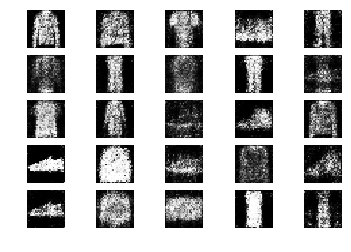

2901 [D loss: 0.697256, acc.: 57.81%] [G loss: 0.935961]
2902 [D loss: 0.583611, acc.: 71.88%] [G loss: 0.868980]
2903 [D loss: 0.593252, acc.: 75.00%] [G loss: 0.970272]
2904 [D loss: 0.674441, acc.: 57.81%] [G loss: 1.017568]
2905 [D loss: 0.613655, acc.: 67.19%] [G loss: 1.007028]
2906 [D loss: 0.651901, acc.: 64.06%] [G loss: 0.967181]
2907 [D loss: 0.614826, acc.: 51.56%] [G loss: 0.939883]
2908 [D loss: 0.675378, acc.: 57.81%] [G loss: 0.873575]
2909 [D loss: 0.654554, acc.: 56.25%] [G loss: 0.945226]
2910 [D loss: 0.610537, acc.: 70.31%] [G loss: 0.998348]
2911 [D loss: 0.615087, acc.: 59.38%] [G loss: 0.957282]
2912 [D loss: 0.620935, acc.: 62.50%] [G loss: 0.987112]
2913 [D loss: 0.597887, acc.: 64.06%] [G loss: 0.982216]
2914 [D loss: 0.577369, acc.: 65.62%] [G loss: 0.895755]
2915 [D loss: 0.648564, acc.: 64.06%] [G loss: 0.999924]
2916 [D loss: 0.719550, acc.: 56.25%] [G loss: 1.000479]
2917 [D loss: 0.593447, acc.: 67.19%] [G loss: 1.032074]
2918 [D loss: 0.655100, acc.: 6

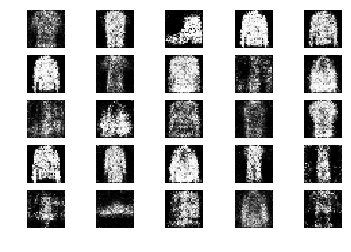

2951 [D loss: 0.650802, acc.: 57.81%] [G loss: 0.953713]
2952 [D loss: 0.605768, acc.: 67.19%] [G loss: 0.961880]
2953 [D loss: 0.567857, acc.: 75.00%] [G loss: 1.001647]
2954 [D loss: 0.666062, acc.: 56.25%] [G loss: 0.939595]
2955 [D loss: 0.668249, acc.: 56.25%] [G loss: 0.896833]
2956 [D loss: 0.575601, acc.: 73.44%] [G loss: 0.873569]
2957 [D loss: 0.628094, acc.: 62.50%] [G loss: 1.050115]
2958 [D loss: 0.610195, acc.: 67.19%] [G loss: 1.012263]
2959 [D loss: 0.700406, acc.: 64.06%] [G loss: 1.076523]
2960 [D loss: 0.626373, acc.: 62.50%] [G loss: 0.973590]
2961 [D loss: 0.605343, acc.: 65.62%] [G loss: 0.897482]
2962 [D loss: 0.629250, acc.: 67.19%] [G loss: 0.927887]
2963 [D loss: 0.672456, acc.: 53.12%] [G loss: 0.896563]
2964 [D loss: 0.667197, acc.: 59.38%] [G loss: 0.965365]
2965 [D loss: 0.575395, acc.: 71.88%] [G loss: 0.997575]
2966 [D loss: 0.582734, acc.: 68.75%] [G loss: 0.965314]
2967 [D loss: 0.606400, acc.: 73.44%] [G loss: 0.962021]
2968 [D loss: 0.587378, acc.: 6

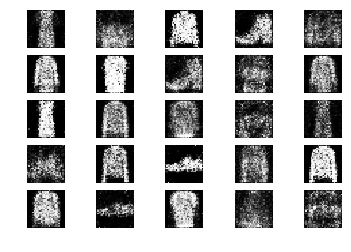

3001 [D loss: 0.601062, acc.: 70.31%] [G loss: 0.986519]
3002 [D loss: 0.634639, acc.: 60.94%] [G loss: 0.951709]
3003 [D loss: 0.546274, acc.: 76.56%] [G loss: 0.991445]
3004 [D loss: 0.586086, acc.: 65.62%] [G loss: 0.908284]
3005 [D loss: 0.619289, acc.: 71.88%] [G loss: 0.954996]
3006 [D loss: 0.631848, acc.: 62.50%] [G loss: 0.819224]
3007 [D loss: 0.734822, acc.: 51.56%] [G loss: 0.939412]
3008 [D loss: 0.580533, acc.: 71.88%] [G loss: 0.980314]
3009 [D loss: 0.625735, acc.: 64.06%] [G loss: 0.948565]
3010 [D loss: 0.664846, acc.: 59.38%] [G loss: 0.871446]
3011 [D loss: 0.634058, acc.: 67.19%] [G loss: 0.892229]
3012 [D loss: 0.644924, acc.: 60.94%] [G loss: 0.955901]
3013 [D loss: 0.662332, acc.: 51.56%] [G loss: 0.931445]
3014 [D loss: 0.619398, acc.: 54.69%] [G loss: 0.922040]
3015 [D loss: 0.635153, acc.: 67.19%] [G loss: 0.964351]
3016 [D loss: 0.624705, acc.: 62.50%] [G loss: 0.943982]
3017 [D loss: 0.702110, acc.: 65.62%] [G loss: 0.958013]
3018 [D loss: 0.585686, acc.: 6

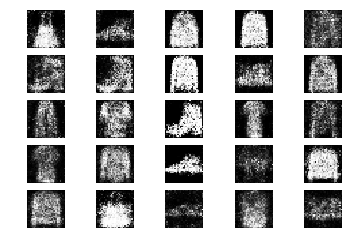

3051 [D loss: 0.670263, acc.: 57.81%] [G loss: 0.995702]
3052 [D loss: 0.681313, acc.: 59.38%] [G loss: 1.048982]
3053 [D loss: 0.573040, acc.: 68.75%] [G loss: 0.939480]
3054 [D loss: 0.603283, acc.: 67.19%] [G loss: 0.983178]
3055 [D loss: 0.677908, acc.: 56.25%] [G loss: 0.906576]
3056 [D loss: 0.650942, acc.: 62.50%] [G loss: 0.865750]
3057 [D loss: 0.700281, acc.: 56.25%] [G loss: 1.022988]
3058 [D loss: 0.669105, acc.: 64.06%] [G loss: 0.913794]
3059 [D loss: 0.552280, acc.: 75.00%] [G loss: 0.963638]
3060 [D loss: 0.616600, acc.: 67.19%] [G loss: 0.963987]
3061 [D loss: 0.647735, acc.: 65.62%] [G loss: 0.949656]
3062 [D loss: 0.605714, acc.: 75.00%] [G loss: 0.906716]
3063 [D loss: 0.604308, acc.: 65.62%] [G loss: 1.023838]
3064 [D loss: 0.622669, acc.: 60.94%] [G loss: 0.972169]
3065 [D loss: 0.578962, acc.: 67.19%] [G loss: 0.979298]
3066 [D loss: 0.585312, acc.: 65.62%] [G loss: 0.894202]
3067 [D loss: 0.640345, acc.: 60.94%] [G loss: 0.877072]
3068 [D loss: 0.709844, acc.: 4

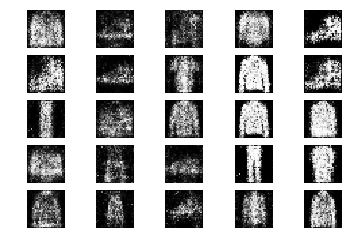

3101 [D loss: 0.609542, acc.: 62.50%] [G loss: 0.971618]
3102 [D loss: 0.670401, acc.: 64.06%] [G loss: 0.970086]
3103 [D loss: 0.602507, acc.: 65.62%] [G loss: 0.904382]
3104 [D loss: 0.606194, acc.: 67.19%] [G loss: 0.919733]
3105 [D loss: 0.566114, acc.: 73.44%] [G loss: 0.864323]
3106 [D loss: 0.673613, acc.: 56.25%] [G loss: 0.961005]
3107 [D loss: 0.622598, acc.: 59.38%] [G loss: 0.838413]
3108 [D loss: 0.613311, acc.: 67.19%] [G loss: 0.934849]
3109 [D loss: 0.557190, acc.: 70.31%] [G loss: 1.040688]
3110 [D loss: 0.674407, acc.: 65.62%] [G loss: 0.894510]
3111 [D loss: 0.614494, acc.: 65.62%] [G loss: 0.868123]
3112 [D loss: 0.641795, acc.: 67.19%] [G loss: 0.873308]
3113 [D loss: 0.615636, acc.: 67.19%] [G loss: 0.882100]
3114 [D loss: 0.693196, acc.: 59.38%] [G loss: 0.917055]
3115 [D loss: 0.626497, acc.: 68.75%] [G loss: 0.883514]
3116 [D loss: 0.640326, acc.: 56.25%] [G loss: 0.856103]
3117 [D loss: 0.697812, acc.: 59.38%] [G loss: 0.862686]
3118 [D loss: 0.687617, acc.: 6

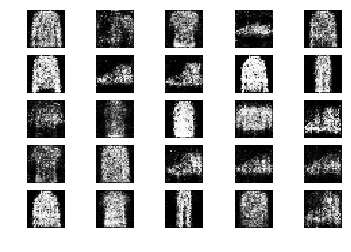

3151 [D loss: 0.561255, acc.: 73.44%] [G loss: 1.023424]
3152 [D loss: 0.575177, acc.: 73.44%] [G loss: 1.115148]
3153 [D loss: 0.569966, acc.: 76.56%] [G loss: 0.981359]
3154 [D loss: 0.640485, acc.: 60.94%] [G loss: 1.000024]
3155 [D loss: 0.554635, acc.: 73.44%] [G loss: 1.004930]
3156 [D loss: 0.645928, acc.: 60.94%] [G loss: 1.033099]
3157 [D loss: 0.595404, acc.: 73.44%] [G loss: 1.041617]
3158 [D loss: 0.669431, acc.: 59.38%] [G loss: 1.057815]
3159 [D loss: 0.623248, acc.: 64.06%] [G loss: 0.947144]
3160 [D loss: 0.649497, acc.: 67.19%] [G loss: 0.955747]
3161 [D loss: 0.678326, acc.: 60.94%] [G loss: 0.883194]
3162 [D loss: 0.622205, acc.: 65.62%] [G loss: 1.013399]
3163 [D loss: 0.584233, acc.: 71.88%] [G loss: 0.990623]
3164 [D loss: 0.542475, acc.: 75.00%] [G loss: 1.070433]
3165 [D loss: 0.693413, acc.: 53.12%] [G loss: 0.892027]
3166 [D loss: 0.607688, acc.: 67.19%] [G loss: 0.920850]
3167 [D loss: 0.593808, acc.: 65.62%] [G loss: 0.872369]
3168 [D loss: 0.677297, acc.: 5

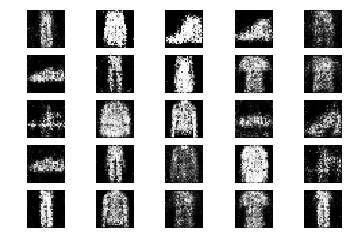

3201 [D loss: 0.589971, acc.: 65.62%] [G loss: 0.868271]
3202 [D loss: 0.672158, acc.: 57.81%] [G loss: 0.900163]
3203 [D loss: 0.674786, acc.: 57.81%] [G loss: 0.803496]
3204 [D loss: 0.549808, acc.: 71.88%] [G loss: 1.001097]
3205 [D loss: 0.589307, acc.: 67.19%] [G loss: 0.985043]
3206 [D loss: 0.688789, acc.: 51.56%] [G loss: 1.034377]
3207 [D loss: 0.682632, acc.: 54.69%] [G loss: 0.976636]
3208 [D loss: 0.625748, acc.: 64.06%] [G loss: 0.945652]
3209 [D loss: 0.653065, acc.: 60.94%] [G loss: 0.928756]
3210 [D loss: 0.587944, acc.: 71.88%] [G loss: 1.028043]
3211 [D loss: 0.647305, acc.: 62.50%] [G loss: 1.014988]
3212 [D loss: 0.602496, acc.: 64.06%] [G loss: 1.100136]
3213 [D loss: 0.597596, acc.: 68.75%] [G loss: 1.024805]
3214 [D loss: 0.673082, acc.: 54.69%] [G loss: 0.920918]
3215 [D loss: 0.571977, acc.: 76.56%] [G loss: 0.958745]
3216 [D loss: 0.641528, acc.: 65.62%] [G loss: 0.897831]
3217 [D loss: 0.735184, acc.: 48.44%] [G loss: 0.872586]
3218 [D loss: 0.629366, acc.: 6

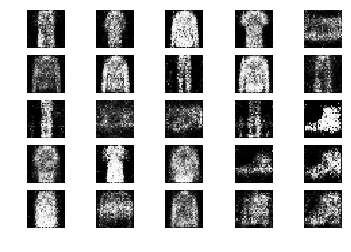

3251 [D loss: 0.580607, acc.: 70.31%] [G loss: 0.768051]
3252 [D loss: 0.576614, acc.: 70.31%] [G loss: 0.936049]
3253 [D loss: 0.617331, acc.: 65.62%] [G loss: 0.900470]
3254 [D loss: 0.586840, acc.: 76.56%] [G loss: 0.984590]
3255 [D loss: 0.644296, acc.: 54.69%] [G loss: 0.975828]
3256 [D loss: 0.640450, acc.: 65.62%] [G loss: 1.030777]
3257 [D loss: 0.590164, acc.: 70.31%] [G loss: 0.888769]
3258 [D loss: 0.621755, acc.: 67.19%] [G loss: 1.043141]
3259 [D loss: 0.619169, acc.: 65.62%] [G loss: 0.983912]
3260 [D loss: 0.626230, acc.: 70.31%] [G loss: 0.979374]
3261 [D loss: 0.718013, acc.: 46.88%] [G loss: 1.005111]
3262 [D loss: 0.603006, acc.: 59.38%] [G loss: 0.981724]
3263 [D loss: 0.706024, acc.: 54.69%] [G loss: 1.074569]
3264 [D loss: 0.672583, acc.: 57.81%] [G loss: 0.929498]
3265 [D loss: 0.632112, acc.: 67.19%] [G loss: 0.927619]
3266 [D loss: 0.625501, acc.: 64.06%] [G loss: 0.992003]
3267 [D loss: 0.594982, acc.: 67.19%] [G loss: 1.009856]
3268 [D loss: 0.657543, acc.: 5

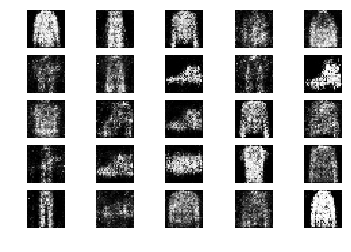

3301 [D loss: 0.634379, acc.: 64.06%] [G loss: 0.980022]
3302 [D loss: 0.577900, acc.: 73.44%] [G loss: 0.952411]
3303 [D loss: 0.622129, acc.: 64.06%] [G loss: 0.942946]
3304 [D loss: 0.625387, acc.: 67.19%] [G loss: 0.996514]
3305 [D loss: 0.585166, acc.: 70.31%] [G loss: 0.981828]
3306 [D loss: 0.544251, acc.: 68.75%] [G loss: 0.883841]
3307 [D loss: 0.697782, acc.: 54.69%] [G loss: 0.832179]
3308 [D loss: 0.609562, acc.: 60.94%] [G loss: 0.890247]
3309 [D loss: 0.646872, acc.: 50.00%] [G loss: 0.812144]
3310 [D loss: 0.559476, acc.: 76.56%] [G loss: 0.959514]
3311 [D loss: 0.541780, acc.: 73.44%] [G loss: 1.040510]
3312 [D loss: 0.568783, acc.: 71.88%] [G loss: 0.907716]
3313 [D loss: 0.695452, acc.: 56.25%] [G loss: 0.864540]
3314 [D loss: 0.620772, acc.: 67.19%] [G loss: 0.940326]
3315 [D loss: 0.635265, acc.: 60.94%] [G loss: 0.867462]
3316 [D loss: 0.657584, acc.: 56.25%] [G loss: 0.953450]
3317 [D loss: 0.580049, acc.: 71.88%] [G loss: 1.021363]
3318 [D loss: 0.623118, acc.: 7

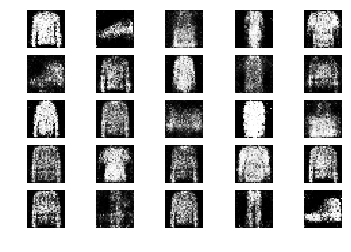

3351 [D loss: 0.555405, acc.: 70.31%] [G loss: 1.122729]
3352 [D loss: 0.618550, acc.: 59.38%] [G loss: 0.882976]
3353 [D loss: 0.647310, acc.: 64.06%] [G loss: 0.954670]
3354 [D loss: 0.742753, acc.: 56.25%] [G loss: 0.887303]
3355 [D loss: 0.661393, acc.: 59.38%] [G loss: 0.945659]
3356 [D loss: 0.598868, acc.: 67.19%] [G loss: 0.991073]
3357 [D loss: 0.563746, acc.: 78.12%] [G loss: 1.027817]
3358 [D loss: 0.619248, acc.: 64.06%] [G loss: 0.863472]
3359 [D loss: 0.580292, acc.: 70.31%] [G loss: 0.855448]
3360 [D loss: 0.700101, acc.: 53.12%] [G loss: 0.893650]
3361 [D loss: 0.692832, acc.: 59.38%] [G loss: 0.918031]
3362 [D loss: 0.643208, acc.: 64.06%] [G loss: 0.957862]
3363 [D loss: 0.607518, acc.: 62.50%] [G loss: 0.879269]
3364 [D loss: 0.600480, acc.: 68.75%] [G loss: 0.951225]
3365 [D loss: 0.589588, acc.: 76.56%] [G loss: 0.941083]
3366 [D loss: 0.727470, acc.: 57.81%] [G loss: 0.996572]
3367 [D loss: 0.565714, acc.: 76.56%] [G loss: 1.002730]
3368 [D loss: 0.620716, acc.: 6

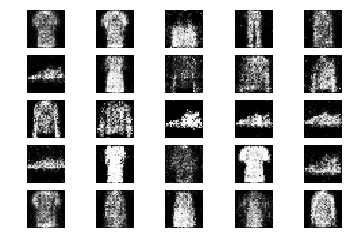

3401 [D loss: 0.701535, acc.: 53.12%] [G loss: 0.926514]
3402 [D loss: 0.573710, acc.: 73.44%] [G loss: 1.025125]
3403 [D loss: 0.658610, acc.: 62.50%] [G loss: 0.913826]
3404 [D loss: 0.652369, acc.: 62.50%] [G loss: 0.959808]
3405 [D loss: 0.681288, acc.: 57.81%] [G loss: 0.988861]
3406 [D loss: 0.608411, acc.: 70.31%] [G loss: 1.024640]
3407 [D loss: 0.620286, acc.: 65.62%] [G loss: 0.972137]
3408 [D loss: 0.695167, acc.: 54.69%] [G loss: 0.984039]
3409 [D loss: 0.617985, acc.: 67.19%] [G loss: 1.015881]
3410 [D loss: 0.597058, acc.: 70.31%] [G loss: 0.990365]
3411 [D loss: 0.650304, acc.: 59.38%] [G loss: 1.033683]
3412 [D loss: 0.661983, acc.: 62.50%] [G loss: 1.044381]
3413 [D loss: 0.692411, acc.: 62.50%] [G loss: 0.973805]
3414 [D loss: 0.619407, acc.: 62.50%] [G loss: 0.985428]
3415 [D loss: 0.531717, acc.: 79.69%] [G loss: 0.911737]
3416 [D loss: 0.620879, acc.: 67.19%] [G loss: 0.939387]
3417 [D loss: 0.635926, acc.: 64.06%] [G loss: 0.965520]
3418 [D loss: 0.595645, acc.: 6

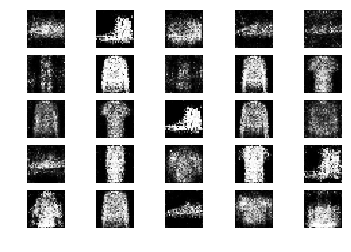

3451 [D loss: 0.648277, acc.: 60.94%] [G loss: 0.981383]
3452 [D loss: 0.558513, acc.: 73.44%] [G loss: 0.876605]
3453 [D loss: 0.654825, acc.: 59.38%] [G loss: 1.047261]
3454 [D loss: 0.706458, acc.: 57.81%] [G loss: 0.936197]
3455 [D loss: 0.627257, acc.: 71.88%] [G loss: 0.994907]
3456 [D loss: 0.638871, acc.: 64.06%] [G loss: 0.874136]
3457 [D loss: 0.653374, acc.: 64.06%] [G loss: 0.876866]
3458 [D loss: 0.653391, acc.: 62.50%] [G loss: 0.901450]
3459 [D loss: 0.619164, acc.: 64.06%] [G loss: 0.929111]
3460 [D loss: 0.596497, acc.: 68.75%] [G loss: 0.955734]
3461 [D loss: 0.668780, acc.: 65.62%] [G loss: 1.051514]
3462 [D loss: 0.604122, acc.: 56.25%] [G loss: 1.000059]
3463 [D loss: 0.618534, acc.: 71.88%] [G loss: 0.980416]
3464 [D loss: 0.650235, acc.: 59.38%] [G loss: 0.935096]
3465 [D loss: 0.635071, acc.: 56.25%] [G loss: 0.940505]
3466 [D loss: 0.620900, acc.: 70.31%] [G loss: 0.970553]
3467 [D loss: 0.612665, acc.: 68.75%] [G loss: 0.953831]
3468 [D loss: 0.623657, acc.: 6

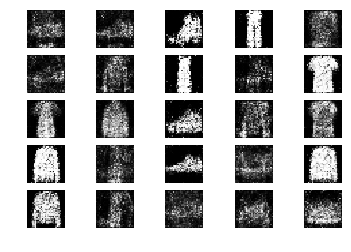

3501 [D loss: 0.588543, acc.: 67.19%] [G loss: 0.938828]
3502 [D loss: 0.688571, acc.: 60.94%] [G loss: 0.944040]
3503 [D loss: 0.644757, acc.: 62.50%] [G loss: 0.903421]
3504 [D loss: 0.683378, acc.: 62.50%] [G loss: 0.930554]
3505 [D loss: 0.620383, acc.: 67.19%] [G loss: 0.889376]
3506 [D loss: 0.645356, acc.: 64.06%] [G loss: 0.950263]
3507 [D loss: 0.733266, acc.: 65.62%] [G loss: 0.930524]
3508 [D loss: 0.619618, acc.: 64.06%] [G loss: 0.966643]
3509 [D loss: 0.704602, acc.: 60.94%] [G loss: 0.905860]
3510 [D loss: 0.608948, acc.: 65.62%] [G loss: 0.898905]
3511 [D loss: 0.582723, acc.: 68.75%] [G loss: 1.018139]
3512 [D loss: 0.614794, acc.: 65.62%] [G loss: 0.945395]
3513 [D loss: 0.640832, acc.: 57.81%] [G loss: 0.909601]
3514 [D loss: 0.693851, acc.: 50.00%] [G loss: 0.902914]
3515 [D loss: 0.605312, acc.: 67.19%] [G loss: 0.968762]
3516 [D loss: 0.651466, acc.: 59.38%] [G loss: 0.996388]
3517 [D loss: 0.572487, acc.: 76.56%] [G loss: 0.951267]
3518 [D loss: 0.611313, acc.: 6

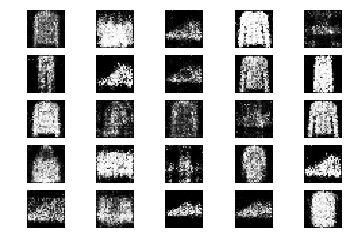

3551 [D loss: 0.583064, acc.: 73.44%] [G loss: 0.952606]
3552 [D loss: 0.621916, acc.: 59.38%] [G loss: 0.892127]
3553 [D loss: 0.576168, acc.: 65.62%] [G loss: 0.960013]
3554 [D loss: 0.619884, acc.: 62.50%] [G loss: 0.883329]
3555 [D loss: 0.560276, acc.: 70.31%] [G loss: 0.960935]
3556 [D loss: 0.683774, acc.: 57.81%] [G loss: 0.934682]
3557 [D loss: 0.672274, acc.: 57.81%] [G loss: 0.891193]
3558 [D loss: 0.655142, acc.: 71.88%] [G loss: 1.031871]
3559 [D loss: 0.618436, acc.: 62.50%] [G loss: 0.986790]
3560 [D loss: 0.634577, acc.: 67.19%] [G loss: 0.968748]
3561 [D loss: 0.611571, acc.: 71.88%] [G loss: 0.924959]
3562 [D loss: 0.570176, acc.: 73.44%] [G loss: 0.968109]
3563 [D loss: 0.674377, acc.: 64.06%] [G loss: 0.954284]
3564 [D loss: 0.654918, acc.: 62.50%] [G loss: 0.932138]
3565 [D loss: 0.604879, acc.: 68.75%] [G loss: 0.999974]
3566 [D loss: 0.583002, acc.: 70.31%] [G loss: 0.856069]
3567 [D loss: 0.681762, acc.: 65.62%] [G loss: 0.885292]
3568 [D loss: 0.634144, acc.: 6

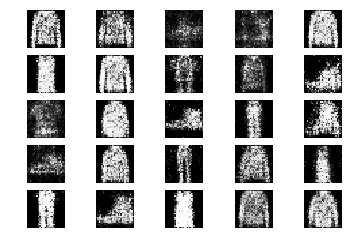

3601 [D loss: 0.585935, acc.: 65.62%] [G loss: 0.949317]
3602 [D loss: 0.645915, acc.: 62.50%] [G loss: 0.945932]
3603 [D loss: 0.583244, acc.: 75.00%] [G loss: 0.945848]
3604 [D loss: 0.572897, acc.: 71.88%] [G loss: 1.007420]
3605 [D loss: 0.609643, acc.: 70.31%] [G loss: 0.922338]
3606 [D loss: 0.602066, acc.: 71.88%] [G loss: 0.989250]
3607 [D loss: 0.637085, acc.: 62.50%] [G loss: 0.883145]
3608 [D loss: 0.659968, acc.: 54.69%] [G loss: 1.044600]
3609 [D loss: 0.629269, acc.: 67.19%] [G loss: 0.986700]
3610 [D loss: 0.571434, acc.: 67.19%] [G loss: 0.953554]
3611 [D loss: 0.672823, acc.: 53.12%] [G loss: 1.059054]
3612 [D loss: 0.638059, acc.: 70.31%] [G loss: 0.977165]
3613 [D loss: 0.630278, acc.: 71.88%] [G loss: 0.863269]
3614 [D loss: 0.626599, acc.: 57.81%] [G loss: 0.938793]
3615 [D loss: 0.632732, acc.: 57.81%] [G loss: 0.970986]
3616 [D loss: 0.645828, acc.: 57.81%] [G loss: 0.907959]
3617 [D loss: 0.555645, acc.: 78.12%] [G loss: 0.925072]
3618 [D loss: 0.595927, acc.: 6

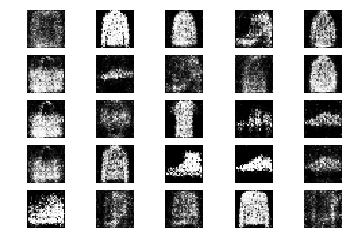

3651 [D loss: 0.641762, acc.: 60.94%] [G loss: 0.945813]
3652 [D loss: 0.644146, acc.: 64.06%] [G loss: 0.976261]
3653 [D loss: 0.593920, acc.: 67.19%] [G loss: 0.898950]
3654 [D loss: 0.656707, acc.: 60.94%] [G loss: 0.989808]
3655 [D loss: 0.646917, acc.: 62.50%] [G loss: 1.052463]
3656 [D loss: 0.589545, acc.: 71.88%] [G loss: 1.010117]
3657 [D loss: 0.656578, acc.: 67.19%] [G loss: 1.052079]
3658 [D loss: 0.567049, acc.: 70.31%] [G loss: 0.882839]
3659 [D loss: 0.647217, acc.: 65.62%] [G loss: 0.872118]
3660 [D loss: 0.733396, acc.: 56.25%] [G loss: 0.865463]
3661 [D loss: 0.608212, acc.: 60.94%] [G loss: 0.856217]
3662 [D loss: 0.620721, acc.: 68.75%] [G loss: 0.800277]
3663 [D loss: 0.563665, acc.: 71.88%] [G loss: 0.918612]
3664 [D loss: 0.634945, acc.: 62.50%] [G loss: 0.883377]
3665 [D loss: 0.582173, acc.: 65.62%] [G loss: 0.955171]
3666 [D loss: 0.654760, acc.: 59.38%] [G loss: 0.915206]
3667 [D loss: 0.576746, acc.: 67.19%] [G loss: 0.921319]
3668 [D loss: 0.630863, acc.: 6

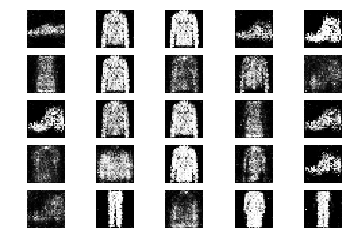

3701 [D loss: 0.605838, acc.: 60.94%] [G loss: 0.950853]
3702 [D loss: 0.587492, acc.: 67.19%] [G loss: 1.026046]
3703 [D loss: 0.620066, acc.: 57.81%] [G loss: 0.986263]
3704 [D loss: 0.646472, acc.: 64.06%] [G loss: 0.966877]
3705 [D loss: 0.594260, acc.: 65.62%] [G loss: 0.856397]
3706 [D loss: 0.684767, acc.: 53.12%] [G loss: 0.832031]
3707 [D loss: 0.591924, acc.: 71.88%] [G loss: 0.959072]
3708 [D loss: 0.613398, acc.: 71.88%] [G loss: 0.952096]
3709 [D loss: 0.657717, acc.: 59.38%] [G loss: 0.972779]
3710 [D loss: 0.633116, acc.: 60.94%] [G loss: 0.922796]
3711 [D loss: 0.565890, acc.: 68.75%] [G loss: 0.938089]
3712 [D loss: 0.591540, acc.: 70.31%] [G loss: 0.943913]
3713 [D loss: 0.554036, acc.: 67.19%] [G loss: 0.937044]
3714 [D loss: 0.566247, acc.: 70.31%] [G loss: 0.947194]
3715 [D loss: 0.650615, acc.: 64.06%] [G loss: 0.991567]
3716 [D loss: 0.699231, acc.: 56.25%] [G loss: 0.998735]
3717 [D loss: 0.637238, acc.: 60.94%] [G loss: 0.944092]
3718 [D loss: 0.690824, acc.: 5

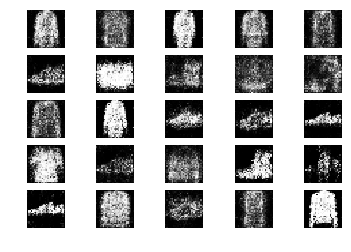

3751 [D loss: 0.661083, acc.: 57.81%] [G loss: 0.996058]
3752 [D loss: 0.666737, acc.: 57.81%] [G loss: 0.926909]
3753 [D loss: 0.599311, acc.: 70.31%] [G loss: 0.965810]
3754 [D loss: 0.596982, acc.: 70.31%] [G loss: 0.917378]
3755 [D loss: 0.580698, acc.: 75.00%] [G loss: 0.905943]
3756 [D loss: 0.656192, acc.: 60.94%] [G loss: 0.946708]
3757 [D loss: 0.656554, acc.: 54.69%] [G loss: 0.986212]
3758 [D loss: 0.667992, acc.: 67.19%] [G loss: 0.928133]
3759 [D loss: 0.551419, acc.: 76.56%] [G loss: 1.025414]
3760 [D loss: 0.640794, acc.: 65.62%] [G loss: 1.055706]
3761 [D loss: 0.692127, acc.: 54.69%] [G loss: 0.919681]
3762 [D loss: 0.656235, acc.: 59.38%] [G loss: 0.920639]
3763 [D loss: 0.603605, acc.: 70.31%] [G loss: 0.958771]
3764 [D loss: 0.767413, acc.: 39.06%] [G loss: 0.938682]
3765 [D loss: 0.648958, acc.: 56.25%] [G loss: 0.945244]
3766 [D loss: 0.569800, acc.: 75.00%] [G loss: 1.017521]
3767 [D loss: 0.648097, acc.: 62.50%] [G loss: 0.982261]
3768 [D loss: 0.660138, acc.: 6

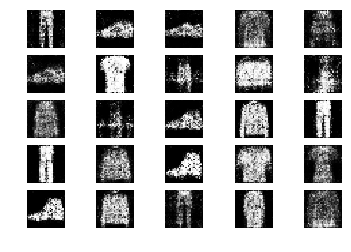

3801 [D loss: 0.665379, acc.: 60.94%] [G loss: 0.945897]
3802 [D loss: 0.697968, acc.: 56.25%] [G loss: 0.835050]
3803 [D loss: 0.670389, acc.: 57.81%] [G loss: 0.889058]
3804 [D loss: 0.659505, acc.: 56.25%] [G loss: 1.077569]
3805 [D loss: 0.633311, acc.: 62.50%] [G loss: 0.917488]
3806 [D loss: 0.611520, acc.: 62.50%] [G loss: 0.971439]
3807 [D loss: 0.696633, acc.: 62.50%] [G loss: 0.979718]
3808 [D loss: 0.580147, acc.: 70.31%] [G loss: 0.903311]
3809 [D loss: 0.676441, acc.: 59.38%] [G loss: 0.844010]
3810 [D loss: 0.610704, acc.: 62.50%] [G loss: 0.866210]
3811 [D loss: 0.700601, acc.: 53.12%] [G loss: 0.902390]
3812 [D loss: 0.618229, acc.: 62.50%] [G loss: 0.928853]
3813 [D loss: 0.642779, acc.: 59.38%] [G loss: 0.889682]
3814 [D loss: 0.613728, acc.: 68.75%] [G loss: 0.933447]
3815 [D loss: 0.631426, acc.: 65.62%] [G loss: 0.957728]
3816 [D loss: 0.621695, acc.: 62.50%] [G loss: 0.977286]
3817 [D loss: 0.699547, acc.: 59.38%] [G loss: 0.860695]
3818 [D loss: 0.728442, acc.: 5

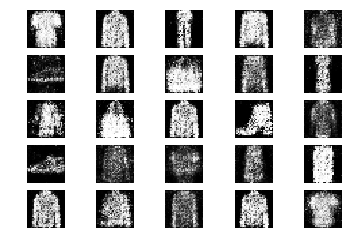

3851 [D loss: 0.563342, acc.: 75.00%] [G loss: 0.940520]
3852 [D loss: 0.614644, acc.: 70.31%] [G loss: 0.939741]
3853 [D loss: 0.593732, acc.: 75.00%] [G loss: 0.841807]
3854 [D loss: 0.628341, acc.: 65.62%] [G loss: 0.821779]
3855 [D loss: 0.697918, acc.: 60.94%] [G loss: 0.898065]
3856 [D loss: 0.676496, acc.: 54.69%] [G loss: 0.826213]
3857 [D loss: 0.626884, acc.: 57.81%] [G loss: 0.889247]
3858 [D loss: 0.566392, acc.: 70.31%] [G loss: 0.973613]
3859 [D loss: 0.624995, acc.: 68.75%] [G loss: 1.003039]
3860 [D loss: 0.669681, acc.: 59.38%] [G loss: 0.907694]
3861 [D loss: 0.542797, acc.: 67.19%] [G loss: 1.038428]
3862 [D loss: 0.628895, acc.: 64.06%] [G loss: 0.923109]
3863 [D loss: 0.717161, acc.: 57.81%] [G loss: 0.906314]
3864 [D loss: 0.655063, acc.: 59.38%] [G loss: 0.911024]
3865 [D loss: 0.596256, acc.: 67.19%] [G loss: 0.926873]
3866 [D loss: 0.666591, acc.: 62.50%] [G loss: 0.811476]
3867 [D loss: 0.581544, acc.: 76.56%] [G loss: 0.821448]
3868 [D loss: 0.663402, acc.: 6

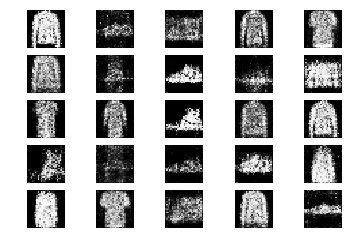

3901 [D loss: 0.603965, acc.: 68.75%] [G loss: 0.895305]
3902 [D loss: 0.674683, acc.: 56.25%] [G loss: 0.911030]
3903 [D loss: 0.696395, acc.: 54.69%] [G loss: 0.911349]
3904 [D loss: 0.613387, acc.: 65.62%] [G loss: 0.871271]
3905 [D loss: 0.596491, acc.: 62.50%] [G loss: 0.894086]
3906 [D loss: 0.602867, acc.: 64.06%] [G loss: 0.872328]
3907 [D loss: 0.665653, acc.: 56.25%] [G loss: 0.892015]
3908 [D loss: 0.670721, acc.: 57.81%] [G loss: 0.854631]
3909 [D loss: 0.654170, acc.: 56.25%] [G loss: 0.973522]
3910 [D loss: 0.622714, acc.: 68.75%] [G loss: 0.881664]
3911 [D loss: 0.597574, acc.: 73.44%] [G loss: 0.971059]
3912 [D loss: 0.629330, acc.: 67.19%] [G loss: 0.876868]
3913 [D loss: 0.729692, acc.: 50.00%] [G loss: 0.835512]
3914 [D loss: 0.631916, acc.: 65.62%] [G loss: 0.873836]
3915 [D loss: 0.604404, acc.: 70.31%] [G loss: 0.918780]
3916 [D loss: 0.596077, acc.: 71.88%] [G loss: 0.956934]
3917 [D loss: 0.633615, acc.: 68.75%] [G loss: 0.948092]
3918 [D loss: 0.625888, acc.: 6

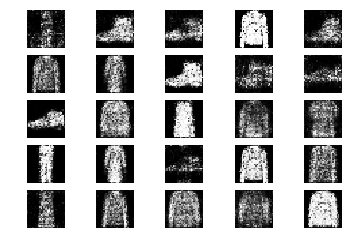

3951 [D loss: 0.652018, acc.: 56.25%] [G loss: 0.907214]
3952 [D loss: 0.693054, acc.: 56.25%] [G loss: 0.882379]
3953 [D loss: 0.672690, acc.: 57.81%] [G loss: 0.842689]
3954 [D loss: 0.623709, acc.: 67.19%] [G loss: 0.944446]
3955 [D loss: 0.608452, acc.: 67.19%] [G loss: 0.913575]
3956 [D loss: 0.648810, acc.: 67.19%] [G loss: 0.875636]
3957 [D loss: 0.631300, acc.: 57.81%] [G loss: 0.883319]
3958 [D loss: 0.611419, acc.: 62.50%] [G loss: 0.894846]
3959 [D loss: 0.610240, acc.: 65.62%] [G loss: 0.948961]
3960 [D loss: 0.671160, acc.: 60.94%] [G loss: 0.877298]
3961 [D loss: 0.655397, acc.: 60.94%] [G loss: 0.928870]
3962 [D loss: 0.686376, acc.: 56.25%] [G loss: 0.919101]
3963 [D loss: 0.649029, acc.: 56.25%] [G loss: 0.941335]
3964 [D loss: 0.649714, acc.: 62.50%] [G loss: 0.862443]
3965 [D loss: 0.592551, acc.: 70.31%] [G loss: 0.910504]
3966 [D loss: 0.604370, acc.: 71.88%] [G loss: 0.899977]
3967 [D loss: 0.564813, acc.: 73.44%] [G loss: 0.965252]
3968 [D loss: 0.601054, acc.: 7

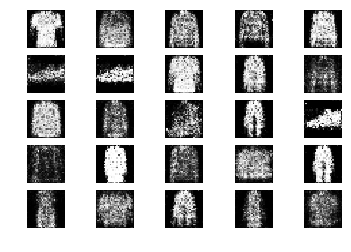

4001 [D loss: 0.679894, acc.: 57.81%] [G loss: 0.976030]
4002 [D loss: 0.640517, acc.: 65.62%] [G loss: 0.934408]
4003 [D loss: 0.618496, acc.: 60.94%] [G loss: 1.012316]
4004 [D loss: 0.626481, acc.: 65.62%] [G loss: 0.889999]
4005 [D loss: 0.713492, acc.: 51.56%] [G loss: 0.874761]
4006 [D loss: 0.666928, acc.: 65.62%] [G loss: 0.955292]
4007 [D loss: 0.588766, acc.: 71.88%] [G loss: 0.975189]
4008 [D loss: 0.637696, acc.: 60.94%] [G loss: 0.912647]
4009 [D loss: 0.613545, acc.: 65.62%] [G loss: 0.981959]
4010 [D loss: 0.591315, acc.: 70.31%] [G loss: 0.836699]
4011 [D loss: 0.663756, acc.: 64.06%] [G loss: 0.925734]
4012 [D loss: 0.571649, acc.: 70.31%] [G loss: 0.850011]
4013 [D loss: 0.630418, acc.: 68.75%] [G loss: 0.871065]
4014 [D loss: 0.682683, acc.: 51.56%] [G loss: 0.921394]
4015 [D loss: 0.647317, acc.: 56.25%] [G loss: 0.937526]
4016 [D loss: 0.610398, acc.: 62.50%] [G loss: 0.976612]
4017 [D loss: 0.630013, acc.: 65.62%] [G loss: 0.812169]
4018 [D loss: 0.644439, acc.: 5

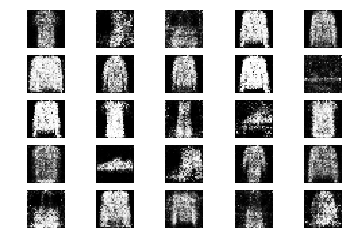

4051 [D loss: 0.618640, acc.: 62.50%] [G loss: 0.962179]
4052 [D loss: 0.640591, acc.: 68.75%] [G loss: 0.857733]
4053 [D loss: 0.624049, acc.: 70.31%] [G loss: 0.932596]
4054 [D loss: 0.606067, acc.: 62.50%] [G loss: 1.012787]
4055 [D loss: 0.622315, acc.: 68.75%] [G loss: 0.990540]
4056 [D loss: 0.602649, acc.: 67.19%] [G loss: 1.090289]
4057 [D loss: 0.593782, acc.: 67.19%] [G loss: 0.961664]
4058 [D loss: 0.682127, acc.: 62.50%] [G loss: 0.955387]
4059 [D loss: 0.593691, acc.: 70.31%] [G loss: 0.974971]
4060 [D loss: 0.610637, acc.: 67.19%] [G loss: 1.006710]
4061 [D loss: 0.611867, acc.: 70.31%] [G loss: 0.919448]
4062 [D loss: 0.653002, acc.: 64.06%] [G loss: 0.949052]
4063 [D loss: 0.685981, acc.: 53.12%] [G loss: 0.934286]
4064 [D loss: 0.650115, acc.: 64.06%] [G loss: 0.909314]
4065 [D loss: 0.639707, acc.: 65.62%] [G loss: 0.932045]
4066 [D loss: 0.556419, acc.: 71.88%] [G loss: 1.059860]
4067 [D loss: 0.638520, acc.: 64.06%] [G loss: 0.964087]
4068 [D loss: 0.630391, acc.: 6

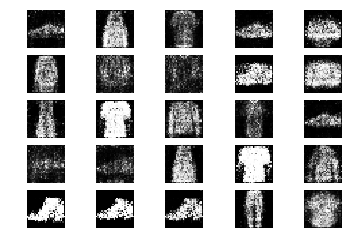

4101 [D loss: 0.593221, acc.: 70.31%] [G loss: 0.925799]
4102 [D loss: 0.670268, acc.: 53.12%] [G loss: 0.946852]
4103 [D loss: 0.617813, acc.: 53.12%] [G loss: 0.980014]
4104 [D loss: 0.647304, acc.: 64.06%] [G loss: 0.913091]
4105 [D loss: 0.626510, acc.: 64.06%] [G loss: 0.942292]
4106 [D loss: 0.689905, acc.: 54.69%] [G loss: 0.973738]
4107 [D loss: 0.666366, acc.: 56.25%] [G loss: 0.938580]
4108 [D loss: 0.606474, acc.: 68.75%] [G loss: 0.992748]
4109 [D loss: 0.607906, acc.: 62.50%] [G loss: 0.978876]
4110 [D loss: 0.674004, acc.: 54.69%] [G loss: 0.950262]
4111 [D loss: 0.641412, acc.: 60.94%] [G loss: 0.992407]
4112 [D loss: 0.693813, acc.: 51.56%] [G loss: 0.920463]
4113 [D loss: 0.613245, acc.: 73.44%] [G loss: 0.828742]
4114 [D loss: 0.711536, acc.: 51.56%] [G loss: 0.909991]
4115 [D loss: 0.579285, acc.: 70.31%] [G loss: 0.930779]
4116 [D loss: 0.611902, acc.: 68.75%] [G loss: 0.958648]
4117 [D loss: 0.676675, acc.: 56.25%] [G loss: 0.951403]
4118 [D loss: 0.672914, acc.: 5

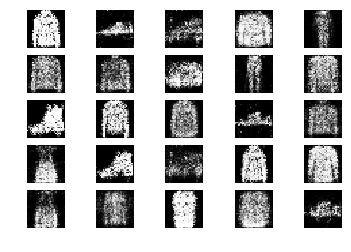

4151 [D loss: 0.644419, acc.: 70.31%] [G loss: 0.967424]
4152 [D loss: 0.680069, acc.: 57.81%] [G loss: 0.925903]
4153 [D loss: 0.589194, acc.: 71.88%] [G loss: 0.907436]
4154 [D loss: 0.596522, acc.: 67.19%] [G loss: 0.855001]
4155 [D loss: 0.631328, acc.: 60.94%] [G loss: 0.926396]
4156 [D loss: 0.709131, acc.: 51.56%] [G loss: 0.939214]
4157 [D loss: 0.619589, acc.: 70.31%] [G loss: 1.030864]
4158 [D loss: 0.610550, acc.: 73.44%] [G loss: 0.997455]
4159 [D loss: 0.599361, acc.: 68.75%] [G loss: 1.164714]
4160 [D loss: 0.594278, acc.: 70.31%] [G loss: 1.073239]
4161 [D loss: 0.550642, acc.: 70.31%] [G loss: 0.945481]
4162 [D loss: 0.641803, acc.: 64.06%] [G loss: 0.942787]
4163 [D loss: 0.656154, acc.: 65.62%] [G loss: 0.852059]
4164 [D loss: 0.608899, acc.: 67.19%] [G loss: 0.910545]
4165 [D loss: 0.652627, acc.: 59.38%] [G loss: 0.997552]
4166 [D loss: 0.633821, acc.: 71.88%] [G loss: 0.991782]
4167 [D loss: 0.626079, acc.: 64.06%] [G loss: 0.967637]
4168 [D loss: 0.653035, acc.: 5

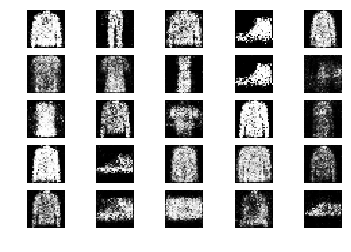

4201 [D loss: 0.682154, acc.: 65.62%] [G loss: 0.990061]
4202 [D loss: 0.708697, acc.: 59.38%] [G loss: 0.803739]
4203 [D loss: 0.641401, acc.: 68.75%] [G loss: 0.890940]
4204 [D loss: 0.602747, acc.: 71.88%] [G loss: 0.849128]
4205 [D loss: 0.657272, acc.: 76.56%] [G loss: 0.910398]
4206 [D loss: 0.611506, acc.: 67.19%] [G loss: 0.869107]
4207 [D loss: 0.618439, acc.: 67.19%] [G loss: 0.884625]
4208 [D loss: 0.649975, acc.: 64.06%] [G loss: 0.933232]
4209 [D loss: 0.705973, acc.: 59.38%] [G loss: 0.908817]
4210 [D loss: 0.614016, acc.: 68.75%] [G loss: 0.873353]
4211 [D loss: 0.541866, acc.: 71.88%] [G loss: 0.905113]
4212 [D loss: 0.613659, acc.: 65.62%] [G loss: 0.916414]
4213 [D loss: 0.566699, acc.: 65.62%] [G loss: 0.879339]
4214 [D loss: 0.672369, acc.: 51.56%] [G loss: 0.881981]
4215 [D loss: 0.659362, acc.: 62.50%] [G loss: 1.046401]
4216 [D loss: 0.611504, acc.: 76.56%] [G loss: 0.972480]
4217 [D loss: 0.722878, acc.: 50.00%] [G loss: 0.918077]
4218 [D loss: 0.609640, acc.: 6

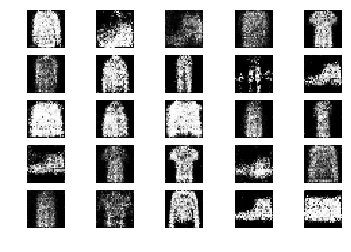

4251 [D loss: 0.599059, acc.: 67.19%] [G loss: 1.050619]
4252 [D loss: 0.676039, acc.: 67.19%] [G loss: 1.019549]
4253 [D loss: 0.683842, acc.: 51.56%] [G loss: 0.928576]
4254 [D loss: 0.663654, acc.: 60.94%] [G loss: 0.889948]
4255 [D loss: 0.703656, acc.: 57.81%] [G loss: 0.935357]
4256 [D loss: 0.670090, acc.: 60.94%] [G loss: 0.917618]
4257 [D loss: 0.696581, acc.: 60.94%] [G loss: 1.002162]
4258 [D loss: 0.661474, acc.: 67.19%] [G loss: 0.934121]
4259 [D loss: 0.596695, acc.: 71.88%] [G loss: 0.961360]
4260 [D loss: 0.625473, acc.: 70.31%] [G loss: 1.032696]
4261 [D loss: 0.645600, acc.: 59.38%] [G loss: 0.945935]
4262 [D loss: 0.652371, acc.: 56.25%] [G loss: 1.017417]
4263 [D loss: 0.652433, acc.: 62.50%] [G loss: 1.038841]
4264 [D loss: 0.667189, acc.: 57.81%] [G loss: 1.033347]
4265 [D loss: 0.556447, acc.: 70.31%] [G loss: 0.921822]
4266 [D loss: 0.699863, acc.: 54.69%] [G loss: 1.023285]
4267 [D loss: 0.698404, acc.: 56.25%] [G loss: 0.933272]
4268 [D loss: 0.638848, acc.: 7

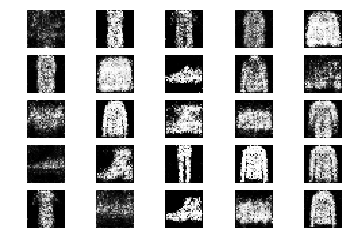

4301 [D loss: 0.673544, acc.: 51.56%] [G loss: 0.991286]
4302 [D loss: 0.620161, acc.: 65.62%] [G loss: 0.931647]
4303 [D loss: 0.619635, acc.: 64.06%] [G loss: 1.014941]
4304 [D loss: 0.675637, acc.: 64.06%] [G loss: 0.867955]
4305 [D loss: 0.595816, acc.: 68.75%] [G loss: 0.996563]
4306 [D loss: 0.651868, acc.: 53.12%] [G loss: 0.969087]
4307 [D loss: 0.666884, acc.: 56.25%] [G loss: 0.918793]
4308 [D loss: 0.576294, acc.: 67.19%] [G loss: 0.893892]
4309 [D loss: 0.649727, acc.: 56.25%] [G loss: 0.956495]
4310 [D loss: 0.649770, acc.: 62.50%] [G loss: 0.963431]
4311 [D loss: 0.672382, acc.: 59.38%] [G loss: 0.885643]
4312 [D loss: 0.627988, acc.: 67.19%] [G loss: 0.990929]
4313 [D loss: 0.592369, acc.: 70.31%] [G loss: 1.010547]
4314 [D loss: 0.647618, acc.: 59.38%] [G loss: 0.926165]
4315 [D loss: 0.585990, acc.: 62.50%] [G loss: 1.031854]
4316 [D loss: 0.641987, acc.: 68.75%] [G loss: 0.964449]
4317 [D loss: 0.734293, acc.: 48.44%] [G loss: 0.955175]
4318 [D loss: 0.620398, acc.: 6

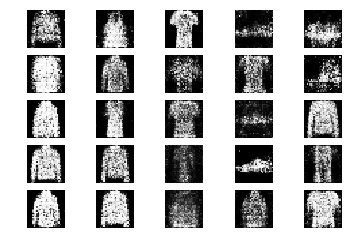

4351 [D loss: 0.593669, acc.: 67.19%] [G loss: 0.946406]
4352 [D loss: 0.635875, acc.: 60.94%] [G loss: 0.920726]
4353 [D loss: 0.677527, acc.: 64.06%] [G loss: 0.914340]
4354 [D loss: 0.646867, acc.: 65.62%] [G loss: 0.892880]
4355 [D loss: 0.602365, acc.: 67.19%] [G loss: 0.879738]
4356 [D loss: 0.634906, acc.: 60.94%] [G loss: 0.911649]
4357 [D loss: 0.626594, acc.: 65.62%] [G loss: 1.009315]
4358 [D loss: 0.612736, acc.: 65.62%] [G loss: 0.913504]
4359 [D loss: 0.662134, acc.: 56.25%] [G loss: 0.948575]
4360 [D loss: 0.592347, acc.: 75.00%] [G loss: 0.950872]
4361 [D loss: 0.583808, acc.: 68.75%] [G loss: 1.006745]
4362 [D loss: 0.628437, acc.: 65.62%] [G loss: 0.996397]
4363 [D loss: 0.655174, acc.: 57.81%] [G loss: 0.900872]
4364 [D loss: 0.607084, acc.: 70.31%] [G loss: 0.952569]
4365 [D loss: 0.740744, acc.: 54.69%] [G loss: 0.867805]
4366 [D loss: 0.654760, acc.: 53.12%] [G loss: 0.895339]
4367 [D loss: 0.706858, acc.: 57.81%] [G loss: 0.904546]
4368 [D loss: 0.657532, acc.: 5

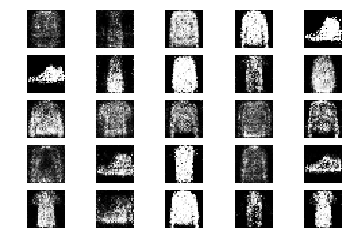

4401 [D loss: 0.687611, acc.: 57.81%] [G loss: 0.911221]
4402 [D loss: 0.591817, acc.: 71.88%] [G loss: 0.904557]
4403 [D loss: 0.560868, acc.: 68.75%] [G loss: 0.908982]
4404 [D loss: 0.682364, acc.: 62.50%] [G loss: 0.888122]
4405 [D loss: 0.629603, acc.: 64.06%] [G loss: 0.810317]
4406 [D loss: 0.653132, acc.: 64.06%] [G loss: 0.903980]
4407 [D loss: 0.610048, acc.: 71.88%] [G loss: 1.005177]
4408 [D loss: 0.628543, acc.: 64.06%] [G loss: 0.901316]
4409 [D loss: 0.614168, acc.: 70.31%] [G loss: 0.963749]
4410 [D loss: 0.643379, acc.: 68.75%] [G loss: 1.031516]
4411 [D loss: 0.633989, acc.: 67.19%] [G loss: 1.053703]
4412 [D loss: 0.636630, acc.: 64.06%] [G loss: 0.910446]
4413 [D loss: 0.623692, acc.: 56.25%] [G loss: 0.829484]
4414 [D loss: 0.666145, acc.: 59.38%] [G loss: 0.940463]
4415 [D loss: 0.633488, acc.: 59.38%] [G loss: 0.918666]
4416 [D loss: 0.622040, acc.: 68.75%] [G loss: 0.941616]
4417 [D loss: 0.651539, acc.: 57.81%] [G loss: 0.890241]
4418 [D loss: 0.661885, acc.: 6

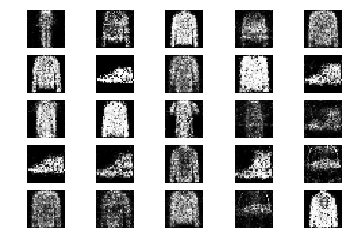

4451 [D loss: 0.691251, acc.: 51.56%] [G loss: 0.902897]
4452 [D loss: 0.678863, acc.: 53.12%] [G loss: 0.914900]
4453 [D loss: 0.623601, acc.: 67.19%] [G loss: 0.991655]
4454 [D loss: 0.670265, acc.: 54.69%] [G loss: 0.911813]
4455 [D loss: 0.625531, acc.: 64.06%] [G loss: 0.896514]
4456 [D loss: 0.660615, acc.: 57.81%] [G loss: 0.937051]
4457 [D loss: 0.638660, acc.: 64.06%] [G loss: 0.834054]
4458 [D loss: 0.670853, acc.: 59.38%] [G loss: 0.913036]
4459 [D loss: 0.719072, acc.: 43.75%] [G loss: 0.949698]
4460 [D loss: 0.651104, acc.: 60.94%] [G loss: 1.005460]
4461 [D loss: 0.603666, acc.: 68.75%] [G loss: 0.954084]
4462 [D loss: 0.594099, acc.: 67.19%] [G loss: 0.974988]
4463 [D loss: 0.618815, acc.: 60.94%] [G loss: 0.985344]
4464 [D loss: 0.695875, acc.: 57.81%] [G loss: 0.885515]
4465 [D loss: 0.691336, acc.: 57.81%] [G loss: 0.959814]
4466 [D loss: 0.677959, acc.: 62.50%] [G loss: 1.002869]
4467 [D loss: 0.655579, acc.: 60.94%] [G loss: 0.904402]
4468 [D loss: 0.674659, acc.: 6

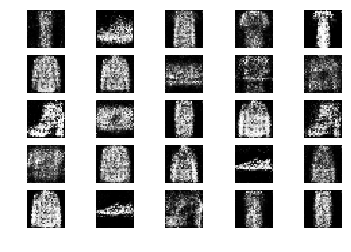

4501 [D loss: 0.591220, acc.: 67.19%] [G loss: 0.937254]
4502 [D loss: 0.556197, acc.: 70.31%] [G loss: 0.922885]
4503 [D loss: 0.658699, acc.: 57.81%] [G loss: 0.900616]
4504 [D loss: 0.697062, acc.: 57.81%] [G loss: 0.977000]
4505 [D loss: 0.628211, acc.: 57.81%] [G loss: 0.981413]
4506 [D loss: 0.615087, acc.: 67.19%] [G loss: 0.932363]
4507 [D loss: 0.660487, acc.: 50.00%] [G loss: 0.929403]
4508 [D loss: 0.622088, acc.: 65.62%] [G loss: 0.917621]
4509 [D loss: 0.693255, acc.: 51.56%] [G loss: 0.945029]
4510 [D loss: 0.658577, acc.: 60.94%] [G loss: 1.022959]
4511 [D loss: 0.629084, acc.: 60.94%] [G loss: 1.016710]
4512 [D loss: 0.584804, acc.: 70.31%] [G loss: 0.969494]
4513 [D loss: 0.623830, acc.: 70.31%] [G loss: 0.958650]
4514 [D loss: 0.653379, acc.: 62.50%] [G loss: 0.994487]
4515 [D loss: 0.551926, acc.: 73.44%] [G loss: 1.000876]
4516 [D loss: 0.695995, acc.: 59.38%] [G loss: 0.973168]
4517 [D loss: 0.620655, acc.: 64.06%] [G loss: 0.948344]
4518 [D loss: 0.639299, acc.: 6

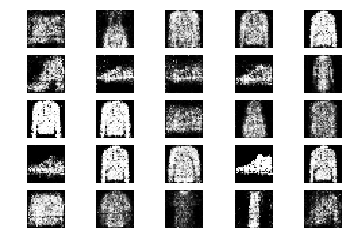

4551 [D loss: 0.623003, acc.: 67.19%] [G loss: 0.906813]
4552 [D loss: 0.663058, acc.: 59.38%] [G loss: 0.828262]
4553 [D loss: 0.655422, acc.: 60.94%] [G loss: 0.885413]
4554 [D loss: 0.664706, acc.: 65.62%] [G loss: 0.906884]
4555 [D loss: 0.673178, acc.: 60.94%] [G loss: 0.950584]
4556 [D loss: 0.613306, acc.: 70.31%] [G loss: 0.977958]
4557 [D loss: 0.660053, acc.: 62.50%] [G loss: 0.982997]
4558 [D loss: 0.646394, acc.: 65.62%] [G loss: 0.878185]
4559 [D loss: 0.701891, acc.: 53.12%] [G loss: 0.979250]
4560 [D loss: 0.581619, acc.: 75.00%] [G loss: 0.979475]
4561 [D loss: 0.607781, acc.: 67.19%] [G loss: 0.926074]
4562 [D loss: 0.699626, acc.: 54.69%] [G loss: 1.020406]
4563 [D loss: 0.666375, acc.: 60.94%] [G loss: 1.006159]
4564 [D loss: 0.598833, acc.: 70.31%] [G loss: 1.015885]
4565 [D loss: 0.749466, acc.: 46.88%] [G loss: 0.861925]
4566 [D loss: 0.602130, acc.: 65.62%] [G loss: 0.920152]
4567 [D loss: 0.642240, acc.: 62.50%] [G loss: 0.951788]
4568 [D loss: 0.651748, acc.: 6

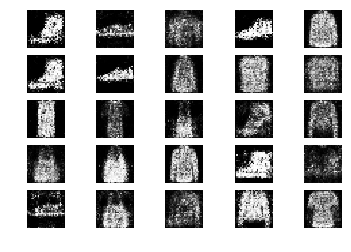

4601 [D loss: 0.662304, acc.: 60.94%] [G loss: 0.888688]
4602 [D loss: 0.679279, acc.: 56.25%] [G loss: 0.920291]
4603 [D loss: 0.647127, acc.: 54.69%] [G loss: 0.849170]
4604 [D loss: 0.647326, acc.: 60.94%] [G loss: 0.869689]
4605 [D loss: 0.652591, acc.: 64.06%] [G loss: 0.929275]
4606 [D loss: 0.548532, acc.: 76.56%] [G loss: 0.967893]
4607 [D loss: 0.629070, acc.: 68.75%] [G loss: 0.885651]
4608 [D loss: 0.653590, acc.: 60.94%] [G loss: 0.949211]
4609 [D loss: 0.661865, acc.: 50.00%] [G loss: 0.971336]
4610 [D loss: 0.641231, acc.: 59.38%] [G loss: 1.037819]
4611 [D loss: 0.729752, acc.: 51.56%] [G loss: 0.915511]
4612 [D loss: 0.713365, acc.: 54.69%] [G loss: 0.968768]
4613 [D loss: 0.602540, acc.: 68.75%] [G loss: 0.979799]
4614 [D loss: 0.682880, acc.: 54.69%] [G loss: 0.990956]
4615 [D loss: 0.545440, acc.: 79.69%] [G loss: 0.938561]
4616 [D loss: 0.645000, acc.: 54.69%] [G loss: 0.962213]
4617 [D loss: 0.614417, acc.: 67.19%] [G loss: 0.991759]
4618 [D loss: 0.625841, acc.: 6

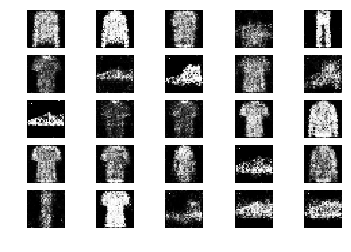

4651 [D loss: 0.583588, acc.: 73.44%] [G loss: 0.871107]
4652 [D loss: 0.602672, acc.: 68.75%] [G loss: 1.006793]
4653 [D loss: 0.616343, acc.: 71.88%] [G loss: 0.981396]
4654 [D loss: 0.617152, acc.: 68.75%] [G loss: 0.930347]
4655 [D loss: 0.688583, acc.: 60.94%] [G loss: 0.909223]
4656 [D loss: 0.722561, acc.: 57.81%] [G loss: 0.867556]
4657 [D loss: 0.624336, acc.: 71.88%] [G loss: 0.954146]
4658 [D loss: 0.634311, acc.: 57.81%] [G loss: 0.915407]
4659 [D loss: 0.649140, acc.: 64.06%] [G loss: 0.851417]
4660 [D loss: 0.636873, acc.: 67.19%] [G loss: 0.866212]
4661 [D loss: 0.619963, acc.: 64.06%] [G loss: 0.928677]
4662 [D loss: 0.680404, acc.: 59.38%] [G loss: 0.893691]
4663 [D loss: 0.733268, acc.: 46.88%] [G loss: 0.994646]
4664 [D loss: 0.644631, acc.: 64.06%] [G loss: 0.871839]
4665 [D loss: 0.583410, acc.: 73.44%] [G loss: 0.819659]
4666 [D loss: 0.578276, acc.: 71.88%] [G loss: 0.842743]
4667 [D loss: 0.647423, acc.: 67.19%] [G loss: 0.944613]
4668 [D loss: 0.700271, acc.: 5

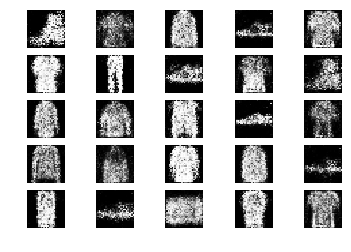

4701 [D loss: 0.656422, acc.: 56.25%] [G loss: 0.878323]
4702 [D loss: 0.701626, acc.: 56.25%] [G loss: 1.013590]
4703 [D loss: 0.667995, acc.: 62.50%] [G loss: 0.943675]
4704 [D loss: 0.617728, acc.: 71.88%] [G loss: 0.926404]
4705 [D loss: 0.628996, acc.: 59.38%] [G loss: 0.970319]
4706 [D loss: 0.649395, acc.: 59.38%] [G loss: 0.925249]
4707 [D loss: 0.653821, acc.: 57.81%] [G loss: 0.918398]
4708 [D loss: 0.647166, acc.: 60.94%] [G loss: 0.918040]
4709 [D loss: 0.601560, acc.: 73.44%] [G loss: 0.884894]
4710 [D loss: 0.658076, acc.: 60.94%] [G loss: 0.923745]
4711 [D loss: 0.698087, acc.: 53.12%] [G loss: 0.908944]
4712 [D loss: 0.605060, acc.: 68.75%] [G loss: 0.965843]
4713 [D loss: 0.637739, acc.: 70.31%] [G loss: 1.035774]
4714 [D loss: 0.619619, acc.: 65.62%] [G loss: 0.941654]
4715 [D loss: 0.612044, acc.: 67.19%] [G loss: 0.965465]
4716 [D loss: 0.683703, acc.: 53.12%] [G loss: 1.003183]
4717 [D loss: 0.621092, acc.: 67.19%] [G loss: 0.941498]
4718 [D loss: 0.579431, acc.: 7

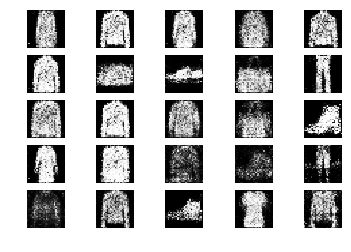

4751 [D loss: 0.670162, acc.: 56.25%] [G loss: 0.927727]
4752 [D loss: 0.614949, acc.: 70.31%] [G loss: 0.953242]
4753 [D loss: 0.685887, acc.: 56.25%] [G loss: 0.864040]
4754 [D loss: 0.554734, acc.: 75.00%] [G loss: 0.961562]
4755 [D loss: 0.694627, acc.: 57.81%] [G loss: 0.947322]
4756 [D loss: 0.700824, acc.: 59.38%] [G loss: 0.845415]
4757 [D loss: 0.622241, acc.: 60.94%] [G loss: 0.880488]
4758 [D loss: 0.700320, acc.: 46.88%] [G loss: 0.841425]
4759 [D loss: 0.676523, acc.: 56.25%] [G loss: 0.975246]
4760 [D loss: 0.599242, acc.: 68.75%] [G loss: 0.855583]
4761 [D loss: 0.679353, acc.: 53.12%] [G loss: 0.853996]
4762 [D loss: 0.618224, acc.: 64.06%] [G loss: 1.013220]
4763 [D loss: 0.620697, acc.: 60.94%] [G loss: 1.025307]
4764 [D loss: 0.706558, acc.: 46.88%] [G loss: 0.898820]
4765 [D loss: 0.666291, acc.: 57.81%] [G loss: 0.891046]
4766 [D loss: 0.657726, acc.: 62.50%] [G loss: 0.894252]
4767 [D loss: 0.646766, acc.: 60.94%] [G loss: 0.922897]
4768 [D loss: 0.693847, acc.: 5

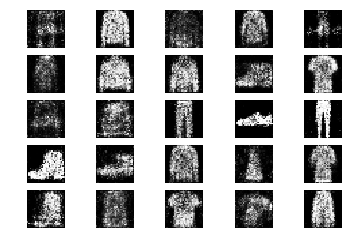

4801 [D loss: 0.585533, acc.: 78.12%] [G loss: 0.957571]
4802 [D loss: 0.678613, acc.: 54.69%] [G loss: 0.958956]
4803 [D loss: 0.622693, acc.: 71.88%] [G loss: 0.939952]
4804 [D loss: 0.664601, acc.: 51.56%] [G loss: 0.952698]
4805 [D loss: 0.673279, acc.: 62.50%] [G loss: 0.892524]
4806 [D loss: 0.663764, acc.: 53.12%] [G loss: 0.900421]
4807 [D loss: 0.608784, acc.: 71.88%] [G loss: 0.893899]
4808 [D loss: 0.675853, acc.: 59.38%] [G loss: 1.004325]
4809 [D loss: 0.645126, acc.: 64.06%] [G loss: 0.859495]
4810 [D loss: 0.645524, acc.: 59.38%] [G loss: 0.900153]
4811 [D loss: 0.594067, acc.: 79.69%] [G loss: 0.908417]
4812 [D loss: 0.618398, acc.: 70.31%] [G loss: 0.952195]
4813 [D loss: 0.638789, acc.: 64.06%] [G loss: 0.967735]
4814 [D loss: 0.667200, acc.: 64.06%] [G loss: 0.883599]
4815 [D loss: 0.584926, acc.: 70.31%] [G loss: 0.979668]
4816 [D loss: 0.650071, acc.: 59.38%] [G loss: 0.904653]
4817 [D loss: 0.657947, acc.: 54.69%] [G loss: 0.907577]
4818 [D loss: 0.698345, acc.: 5

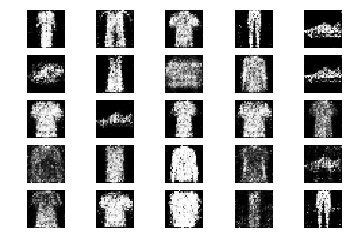

4851 [D loss: 0.661731, acc.: 60.94%] [G loss: 0.881561]
4852 [D loss: 0.626987, acc.: 65.62%] [G loss: 0.919525]
4853 [D loss: 0.624211, acc.: 64.06%] [G loss: 0.930882]
4854 [D loss: 0.679025, acc.: 59.38%] [G loss: 0.832949]
4855 [D loss: 0.637341, acc.: 64.06%] [G loss: 0.910218]
4856 [D loss: 0.702483, acc.: 62.50%] [G loss: 0.981699]
4857 [D loss: 0.620607, acc.: 62.50%] [G loss: 0.948700]
4858 [D loss: 0.618157, acc.: 67.19%] [G loss: 0.939043]
4859 [D loss: 0.638777, acc.: 64.06%] [G loss: 0.950085]
4860 [D loss: 0.619354, acc.: 64.06%] [G loss: 0.863961]
4861 [D loss: 0.619764, acc.: 67.19%] [G loss: 0.885862]
4862 [D loss: 0.696937, acc.: 56.25%] [G loss: 0.859706]
4863 [D loss: 0.613685, acc.: 60.94%] [G loss: 0.931121]
4864 [D loss: 0.672267, acc.: 67.19%] [G loss: 1.001566]
4865 [D loss: 0.649781, acc.: 62.50%] [G loss: 0.961955]
4866 [D loss: 0.618603, acc.: 65.62%] [G loss: 0.966650]
4867 [D loss: 0.693114, acc.: 57.81%] [G loss: 0.953139]
4868 [D loss: 0.660964, acc.: 6

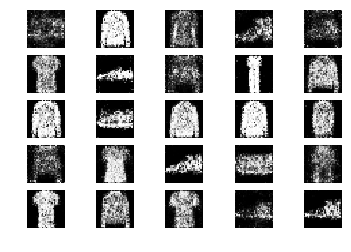

4901 [D loss: 0.603678, acc.: 67.19%] [G loss: 0.902782]
4902 [D loss: 0.648166, acc.: 65.62%] [G loss: 0.919329]
4903 [D loss: 0.594576, acc.: 73.44%] [G loss: 0.878828]
4904 [D loss: 0.661475, acc.: 57.81%] [G loss: 0.856434]
4905 [D loss: 0.627081, acc.: 67.19%] [G loss: 1.029551]
4906 [D loss: 0.588719, acc.: 68.75%] [G loss: 0.932661]
4907 [D loss: 0.636474, acc.: 67.19%] [G loss: 0.891011]
4908 [D loss: 0.617808, acc.: 64.06%] [G loss: 0.840688]
4909 [D loss: 0.703273, acc.: 62.50%] [G loss: 0.856567]
4910 [D loss: 0.673851, acc.: 57.81%] [G loss: 0.856872]
4911 [D loss: 0.654891, acc.: 53.12%] [G loss: 0.884827]
4912 [D loss: 0.593191, acc.: 65.62%] [G loss: 0.892854]
4913 [D loss: 0.621012, acc.: 64.06%] [G loss: 0.958131]
4914 [D loss: 0.611362, acc.: 67.19%] [G loss: 0.937959]
4915 [D loss: 0.578633, acc.: 68.75%] [G loss: 0.860162]
4916 [D loss: 0.665005, acc.: 56.25%] [G loss: 0.920509]
4917 [D loss: 0.616106, acc.: 71.88%] [G loss: 0.913767]
4918 [D loss: 0.634271, acc.: 6

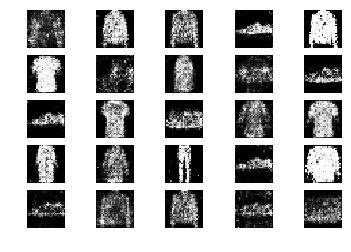

4951 [D loss: 0.688511, acc.: 54.69%] [G loss: 1.029402]
4952 [D loss: 0.656816, acc.: 65.62%] [G loss: 0.971537]
4953 [D loss: 0.656799, acc.: 54.69%] [G loss: 0.905564]
4954 [D loss: 0.641141, acc.: 56.25%] [G loss: 0.917483]
4955 [D loss: 0.636612, acc.: 60.94%] [G loss: 0.919662]
4956 [D loss: 0.599281, acc.: 73.44%] [G loss: 0.884513]
4957 [D loss: 0.627168, acc.: 68.75%] [G loss: 0.932929]
4958 [D loss: 0.641648, acc.: 65.62%] [G loss: 0.967411]
4959 [D loss: 0.625969, acc.: 65.62%] [G loss: 0.964480]
4960 [D loss: 0.616896, acc.: 67.19%] [G loss: 0.989772]
4961 [D loss: 0.617477, acc.: 62.50%] [G loss: 0.952150]
4962 [D loss: 0.641148, acc.: 62.50%] [G loss: 0.974520]
4963 [D loss: 0.620817, acc.: 68.75%] [G loss: 0.969745]
4964 [D loss: 0.578186, acc.: 62.50%] [G loss: 1.007111]
4965 [D loss: 0.685691, acc.: 59.38%] [G loss: 1.064587]
4966 [D loss: 0.641819, acc.: 67.19%] [G loss: 0.935473]
4967 [D loss: 0.632924, acc.: 59.38%] [G loss: 0.961107]
4968 [D loss: 0.614556, acc.: 6

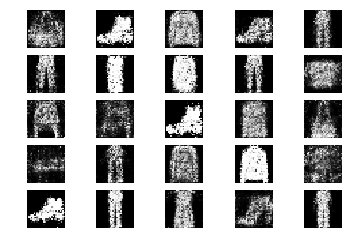

5001 [D loss: 0.604467, acc.: 70.31%] [G loss: 1.005305]
5002 [D loss: 0.619559, acc.: 67.19%] [G loss: 0.895178]
5003 [D loss: 0.671820, acc.: 57.81%] [G loss: 0.888778]
5004 [D loss: 0.611974, acc.: 68.75%] [G loss: 0.843379]
5005 [D loss: 0.609009, acc.: 68.75%] [G loss: 0.857714]
5006 [D loss: 0.637468, acc.: 57.81%] [G loss: 0.966075]
5007 [D loss: 0.625425, acc.: 64.06%] [G loss: 0.949712]
5008 [D loss: 0.627927, acc.: 67.19%] [G loss: 0.970904]
5009 [D loss: 0.602873, acc.: 70.31%] [G loss: 0.881062]
5010 [D loss: 0.646287, acc.: 56.25%] [G loss: 0.924459]
5011 [D loss: 0.653731, acc.: 65.62%] [G loss: 0.836756]
5012 [D loss: 0.613263, acc.: 65.62%] [G loss: 0.984792]
5013 [D loss: 0.639352, acc.: 64.06%] [G loss: 0.946810]
5014 [D loss: 0.631974, acc.: 59.38%] [G loss: 0.969839]
5015 [D loss: 0.672666, acc.: 62.50%] [G loss: 1.014874]
5016 [D loss: 0.625281, acc.: 68.75%] [G loss: 0.998616]
5017 [D loss: 0.637882, acc.: 68.75%] [G loss: 0.947368]
5018 [D loss: 0.659040, acc.: 6

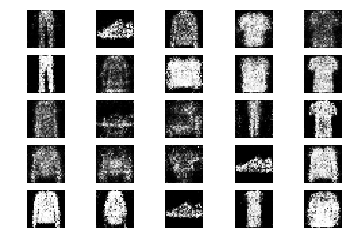

5051 [D loss: 0.671227, acc.: 60.94%] [G loss: 1.033825]
5052 [D loss: 0.589853, acc.: 68.75%] [G loss: 1.002272]
5053 [D loss: 0.679425, acc.: 57.81%] [G loss: 0.982864]
5054 [D loss: 0.569397, acc.: 71.88%] [G loss: 0.894140]
5055 [D loss: 0.615131, acc.: 64.06%] [G loss: 0.861196]
5056 [D loss: 0.630829, acc.: 62.50%] [G loss: 0.928198]
5057 [D loss: 0.663229, acc.: 60.94%] [G loss: 0.954187]
5058 [D loss: 0.610838, acc.: 62.50%] [G loss: 1.060526]
5059 [D loss: 0.677979, acc.: 54.69%] [G loss: 0.957008]
5060 [D loss: 0.649635, acc.: 56.25%] [G loss: 0.971498]
5061 [D loss: 0.621987, acc.: 60.94%] [G loss: 0.948268]
5062 [D loss: 0.660718, acc.: 57.81%] [G loss: 0.845821]
5063 [D loss: 0.674951, acc.: 65.62%] [G loss: 0.882391]
5064 [D loss: 0.643990, acc.: 65.62%] [G loss: 1.057914]
5065 [D loss: 0.597524, acc.: 73.44%] [G loss: 0.897925]
5066 [D loss: 0.675942, acc.: 62.50%] [G loss: 0.886801]
5067 [D loss: 0.590470, acc.: 71.88%] [G loss: 1.047554]
5068 [D loss: 0.630326, acc.: 6

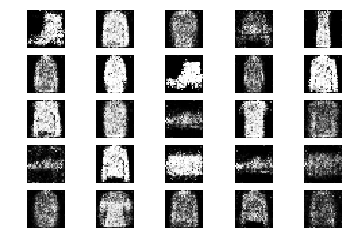

5101 [D loss: 0.637562, acc.: 64.06%] [G loss: 0.948981]
5102 [D loss: 0.614804, acc.: 68.75%] [G loss: 0.899976]
5103 [D loss: 0.589696, acc.: 73.44%] [G loss: 0.966517]
5104 [D loss: 0.637045, acc.: 65.62%] [G loss: 1.029254]
5105 [D loss: 0.645797, acc.: 62.50%] [G loss: 0.968908]
5106 [D loss: 0.686736, acc.: 56.25%] [G loss: 0.939503]
5107 [D loss: 0.608748, acc.: 67.19%] [G loss: 0.888030]
5108 [D loss: 0.588686, acc.: 71.88%] [G loss: 0.991734]
5109 [D loss: 0.633328, acc.: 60.94%] [G loss: 1.032057]
5110 [D loss: 0.624246, acc.: 64.06%] [G loss: 0.930374]
5111 [D loss: 0.672547, acc.: 57.81%] [G loss: 0.883307]
5112 [D loss: 0.680622, acc.: 57.81%] [G loss: 0.827841]
5113 [D loss: 0.646464, acc.: 62.50%] [G loss: 0.920383]
5114 [D loss: 0.627838, acc.: 67.19%] [G loss: 0.887003]
5115 [D loss: 0.616764, acc.: 68.75%] [G loss: 0.965867]
5116 [D loss: 0.647796, acc.: 62.50%] [G loss: 0.929857]
5117 [D loss: 0.664160, acc.: 68.75%] [G loss: 0.890224]
5118 [D loss: 0.563426, acc.: 7

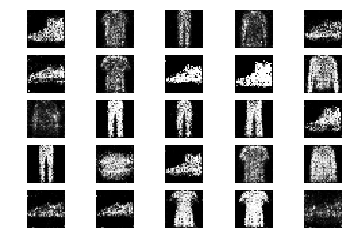

5151 [D loss: 0.666904, acc.: 57.81%] [G loss: 0.988859]
5152 [D loss: 0.641586, acc.: 60.94%] [G loss: 0.903957]
5153 [D loss: 0.665553, acc.: 53.12%] [G loss: 0.783711]
5154 [D loss: 0.597259, acc.: 65.62%] [G loss: 0.925302]
5155 [D loss: 0.706241, acc.: 51.56%] [G loss: 0.868284]
5156 [D loss: 0.613979, acc.: 64.06%] [G loss: 1.000785]
5157 [D loss: 0.632615, acc.: 64.06%] [G loss: 1.040675]
5158 [D loss: 0.624688, acc.: 68.75%] [G loss: 0.871303]
5159 [D loss: 0.636086, acc.: 67.19%] [G loss: 0.875227]
5160 [D loss: 0.653419, acc.: 59.38%] [G loss: 0.919431]
5161 [D loss: 0.652812, acc.: 60.94%] [G loss: 0.968017]
5162 [D loss: 0.598635, acc.: 68.75%] [G loss: 0.971679]
5163 [D loss: 0.694571, acc.: 59.38%] [G loss: 0.965720]
5164 [D loss: 0.636728, acc.: 62.50%] [G loss: 1.025729]
5165 [D loss: 0.635373, acc.: 65.62%] [G loss: 0.987268]
5166 [D loss: 0.644320, acc.: 64.06%] [G loss: 0.851319]
5167 [D loss: 0.614794, acc.: 67.19%] [G loss: 0.846500]
5168 [D loss: 0.575968, acc.: 6

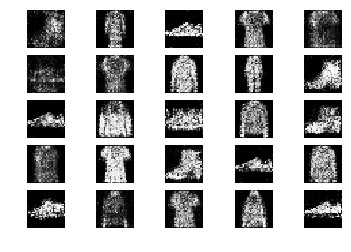

5201 [D loss: 0.653273, acc.: 64.06%] [G loss: 0.948816]
5202 [D loss: 0.649739, acc.: 62.50%] [G loss: 0.925401]
5203 [D loss: 0.737469, acc.: 54.69%] [G loss: 0.918021]
5204 [D loss: 0.620339, acc.: 62.50%] [G loss: 0.909408]
5205 [D loss: 0.612885, acc.: 70.31%] [G loss: 0.866118]
5206 [D loss: 0.714343, acc.: 53.12%] [G loss: 0.899931]
5207 [D loss: 0.605613, acc.: 67.19%] [G loss: 0.851651]
5208 [D loss: 0.530165, acc.: 76.56%] [G loss: 0.940687]
5209 [D loss: 0.674641, acc.: 56.25%] [G loss: 0.947413]
5210 [D loss: 0.630206, acc.: 60.94%] [G loss: 0.991495]
5211 [D loss: 0.655353, acc.: 60.94%] [G loss: 0.946852]
5212 [D loss: 0.670976, acc.: 57.81%] [G loss: 1.001952]
5213 [D loss: 0.656953, acc.: 50.00%] [G loss: 0.956442]
5214 [D loss: 0.642002, acc.: 59.38%] [G loss: 0.965173]
5215 [D loss: 0.658841, acc.: 64.06%] [G loss: 0.961876]
5216 [D loss: 0.666618, acc.: 62.50%] [G loss: 0.930225]
5217 [D loss: 0.593678, acc.: 65.62%] [G loss: 0.849464]
5218 [D loss: 0.641938, acc.: 6

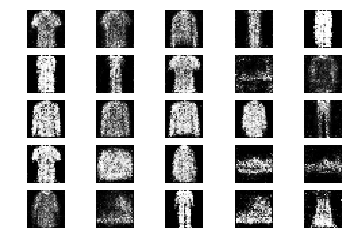

5251 [D loss: 0.650278, acc.: 60.94%] [G loss: 0.897423]
5252 [D loss: 0.614921, acc.: 65.62%] [G loss: 0.916963]
5253 [D loss: 0.621293, acc.: 65.62%] [G loss: 0.821202]
5254 [D loss: 0.589730, acc.: 68.75%] [G loss: 0.923862]
5255 [D loss: 0.660552, acc.: 59.38%] [G loss: 0.897544]
5256 [D loss: 0.683288, acc.: 62.50%] [G loss: 0.834697]
5257 [D loss: 0.621795, acc.: 62.50%] [G loss: 0.933555]
5258 [D loss: 0.675128, acc.: 60.94%] [G loss: 0.953735]
5259 [D loss: 0.657462, acc.: 60.94%] [G loss: 0.996030]
5260 [D loss: 0.640126, acc.: 60.94%] [G loss: 0.973516]
5261 [D loss: 0.637466, acc.: 65.62%] [G loss: 0.968587]
5262 [D loss: 0.680097, acc.: 53.12%] [G loss: 0.945817]
5263 [D loss: 0.670979, acc.: 62.50%] [G loss: 0.790847]
5264 [D loss: 0.646937, acc.: 59.38%] [G loss: 0.944321]
5265 [D loss: 0.714657, acc.: 53.12%] [G loss: 0.910143]
5266 [D loss: 0.649749, acc.: 57.81%] [G loss: 0.993045]
5267 [D loss: 0.622112, acc.: 64.06%] [G loss: 0.961564]
5268 [D loss: 0.616619, acc.: 7

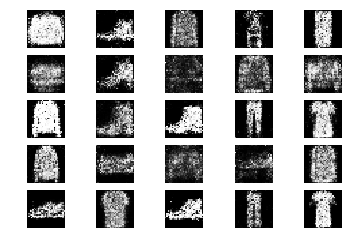

5301 [D loss: 0.642115, acc.: 59.38%] [G loss: 0.920608]
5302 [D loss: 0.620309, acc.: 67.19%] [G loss: 0.853017]
5303 [D loss: 0.635939, acc.: 60.94%] [G loss: 0.822332]
5304 [D loss: 0.665284, acc.: 57.81%] [G loss: 0.905516]
5305 [D loss: 0.596289, acc.: 67.19%] [G loss: 0.878354]
5306 [D loss: 0.604023, acc.: 71.88%] [G loss: 0.876240]
5307 [D loss: 0.682574, acc.: 57.81%] [G loss: 1.030269]
5308 [D loss: 0.575693, acc.: 64.06%] [G loss: 0.965863]
5309 [D loss: 0.657792, acc.: 62.50%] [G loss: 0.956925]
5310 [D loss: 0.638346, acc.: 67.19%] [G loss: 0.863098]
5311 [D loss: 0.737224, acc.: 57.81%] [G loss: 0.911842]
5312 [D loss: 0.616206, acc.: 62.50%] [G loss: 0.921883]
5313 [D loss: 0.641945, acc.: 62.50%] [G loss: 0.892507]
5314 [D loss: 0.637965, acc.: 68.75%] [G loss: 0.924541]
5315 [D loss: 0.629006, acc.: 70.31%] [G loss: 0.909383]
5316 [D loss: 0.693188, acc.: 60.94%] [G loss: 1.040100]
5317 [D loss: 0.668021, acc.: 64.06%] [G loss: 0.961531]
5318 [D loss: 0.623655, acc.: 6

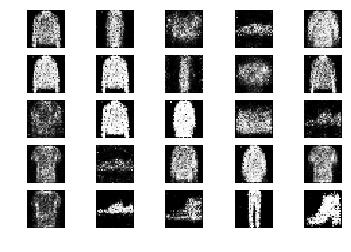

5351 [D loss: 0.745365, acc.: 50.00%] [G loss: 0.965403]
5352 [D loss: 0.715770, acc.: 51.56%] [G loss: 0.974767]
5353 [D loss: 0.602038, acc.: 68.75%] [G loss: 0.973560]
5354 [D loss: 0.595786, acc.: 68.75%] [G loss: 0.943084]
5355 [D loss: 0.596682, acc.: 71.88%] [G loss: 0.901779]
5356 [D loss: 0.697838, acc.: 62.50%] [G loss: 0.840772]
5357 [D loss: 0.655496, acc.: 57.81%] [G loss: 0.877919]
5358 [D loss: 0.614469, acc.: 67.19%] [G loss: 0.998030]
5359 [D loss: 0.671609, acc.: 56.25%] [G loss: 0.893220]
5360 [D loss: 0.608447, acc.: 64.06%] [G loss: 0.993206]
5361 [D loss: 0.639699, acc.: 60.94%] [G loss: 0.943542]
5362 [D loss: 0.686539, acc.: 53.12%] [G loss: 0.907304]
5363 [D loss: 0.685062, acc.: 53.12%] [G loss: 0.828259]
5364 [D loss: 0.631214, acc.: 62.50%] [G loss: 0.882973]
5365 [D loss: 0.575405, acc.: 68.75%] [G loss: 0.895975]
5366 [D loss: 0.645506, acc.: 57.81%] [G loss: 0.879437]
5367 [D loss: 0.662712, acc.: 60.94%] [G loss: 0.963232]
5368 [D loss: 0.610217, acc.: 7

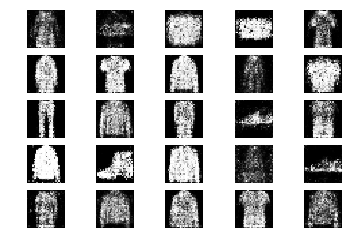

5401 [D loss: 0.638307, acc.: 62.50%] [G loss: 0.900891]
5402 [D loss: 0.644951, acc.: 62.50%] [G loss: 1.003908]
5403 [D loss: 0.677077, acc.: 56.25%] [G loss: 0.986074]
5404 [D loss: 0.633879, acc.: 65.62%] [G loss: 0.905974]
5405 [D loss: 0.675008, acc.: 62.50%] [G loss: 0.897663]
5406 [D loss: 0.714391, acc.: 51.56%] [G loss: 0.888196]
5407 [D loss: 0.636036, acc.: 65.62%] [G loss: 0.942417]
5408 [D loss: 0.694775, acc.: 56.25%] [G loss: 0.912281]
5409 [D loss: 0.590550, acc.: 67.19%] [G loss: 0.916616]
5410 [D loss: 0.621720, acc.: 67.19%] [G loss: 0.858630]
5411 [D loss: 0.632238, acc.: 64.06%] [G loss: 0.903245]
5412 [D loss: 0.675799, acc.: 54.69%] [G loss: 0.985747]
5413 [D loss: 0.675308, acc.: 59.38%] [G loss: 0.995019]
5414 [D loss: 0.624495, acc.: 60.94%] [G loss: 1.049203]
5415 [D loss: 0.625276, acc.: 65.62%] [G loss: 0.916955]
5416 [D loss: 0.679826, acc.: 60.94%] [G loss: 0.969019]
5417 [D loss: 0.658734, acc.: 57.81%] [G loss: 0.978589]
5418 [D loss: 0.641026, acc.: 6

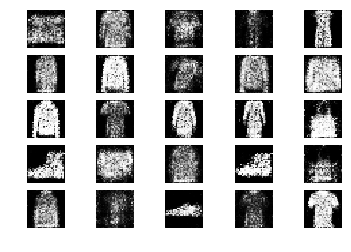

5451 [D loss: 0.551849, acc.: 76.56%] [G loss: 0.930547]
5452 [D loss: 0.648831, acc.: 67.19%] [G loss: 0.950150]
5453 [D loss: 0.713400, acc.: 51.56%] [G loss: 0.920006]
5454 [D loss: 0.677746, acc.: 62.50%] [G loss: 0.917454]
5455 [D loss: 0.670739, acc.: 59.38%] [G loss: 0.946563]
5456 [D loss: 0.676265, acc.: 56.25%] [G loss: 0.909577]
5457 [D loss: 0.683309, acc.: 64.06%] [G loss: 0.878816]
5458 [D loss: 0.654139, acc.: 59.38%] [G loss: 0.924797]
5459 [D loss: 0.664492, acc.: 54.69%] [G loss: 0.880476]
5460 [D loss: 0.657706, acc.: 65.62%] [G loss: 0.837932]
5461 [D loss: 0.719586, acc.: 46.88%] [G loss: 0.809035]
5462 [D loss: 0.661835, acc.: 60.94%] [G loss: 0.811905]
5463 [D loss: 0.614088, acc.: 64.06%] [G loss: 0.917617]
5464 [D loss: 0.703442, acc.: 50.00%] [G loss: 0.884876]
5465 [D loss: 0.615537, acc.: 67.19%] [G loss: 0.879366]
5466 [D loss: 0.659384, acc.: 59.38%] [G loss: 0.862500]
5467 [D loss: 0.692678, acc.: 57.81%] [G loss: 0.920329]
5468 [D loss: 0.681145, acc.: 6

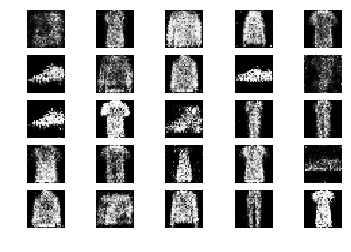

5501 [D loss: 0.651014, acc.: 54.69%] [G loss: 0.833116]
5502 [D loss: 0.600557, acc.: 68.75%] [G loss: 0.878757]
5503 [D loss: 0.607014, acc.: 68.75%] [G loss: 0.935980]
5504 [D loss: 0.688096, acc.: 51.56%] [G loss: 0.902290]
5505 [D loss: 0.660734, acc.: 62.50%] [G loss: 0.877320]
5506 [D loss: 0.702727, acc.: 62.50%] [G loss: 0.894843]
5507 [D loss: 0.623310, acc.: 65.62%] [G loss: 1.031367]
5508 [D loss: 0.613507, acc.: 67.19%] [G loss: 0.880457]
5509 [D loss: 0.657434, acc.: 59.38%] [G loss: 0.942310]
5510 [D loss: 0.683727, acc.: 56.25%] [G loss: 0.927393]
5511 [D loss: 0.697050, acc.: 50.00%] [G loss: 0.922921]
5512 [D loss: 0.586268, acc.: 70.31%] [G loss: 1.001614]
5513 [D loss: 0.632178, acc.: 64.06%] [G loss: 0.894640]
5514 [D loss: 0.614210, acc.: 65.62%] [G loss: 1.025395]
5515 [D loss: 0.678654, acc.: 54.69%] [G loss: 0.845199]
5516 [D loss: 0.646593, acc.: 60.94%] [G loss: 1.020182]
5517 [D loss: 0.658543, acc.: 59.38%] [G loss: 0.981809]
5518 [D loss: 0.665007, acc.: 5

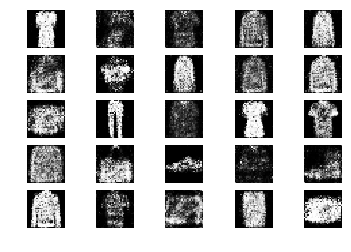

5551 [D loss: 0.679794, acc.: 60.94%] [G loss: 0.965469]
5552 [D loss: 0.606699, acc.: 68.75%] [G loss: 0.954134]
5553 [D loss: 0.682892, acc.: 59.38%] [G loss: 0.961197]
5554 [D loss: 0.599238, acc.: 68.75%] [G loss: 0.988780]
5555 [D loss: 0.633362, acc.: 65.62%] [G loss: 0.938631]
5556 [D loss: 0.654744, acc.: 60.94%] [G loss: 0.909857]
5557 [D loss: 0.635734, acc.: 70.31%] [G loss: 0.871580]
5558 [D loss: 0.586809, acc.: 73.44%] [G loss: 0.889088]
5559 [D loss: 0.561649, acc.: 68.75%] [G loss: 0.960245]
5560 [D loss: 0.596748, acc.: 67.19%] [G loss: 0.914059]
5561 [D loss: 0.654705, acc.: 56.25%] [G loss: 0.805564]
5562 [D loss: 0.609870, acc.: 71.88%] [G loss: 0.917957]
5563 [D loss: 0.650630, acc.: 57.81%] [G loss: 0.880325]
5564 [D loss: 0.673050, acc.: 64.06%] [G loss: 1.001824]
5565 [D loss: 0.625421, acc.: 67.19%] [G loss: 0.926085]
5566 [D loss: 0.644870, acc.: 62.50%] [G loss: 0.928045]
5567 [D loss: 0.579069, acc.: 75.00%] [G loss: 0.938927]
5568 [D loss: 0.578276, acc.: 6

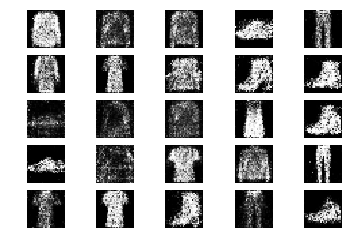

5601 [D loss: 0.648095, acc.: 62.50%] [G loss: 0.973136]
5602 [D loss: 0.644037, acc.: 62.50%] [G loss: 1.007092]
5603 [D loss: 0.703037, acc.: 57.81%] [G loss: 0.975103]
5604 [D loss: 0.625379, acc.: 65.62%] [G loss: 0.962391]
5605 [D loss: 0.661310, acc.: 64.06%] [G loss: 0.893552]
5606 [D loss: 0.628244, acc.: 70.31%] [G loss: 0.966809]
5607 [D loss: 0.691090, acc.: 59.38%] [G loss: 0.906976]
5608 [D loss: 0.615336, acc.: 70.31%] [G loss: 0.921170]
5609 [D loss: 0.625355, acc.: 64.06%] [G loss: 0.883039]
5610 [D loss: 0.708568, acc.: 59.38%] [G loss: 0.959574]
5611 [D loss: 0.638784, acc.: 68.75%] [G loss: 0.891578]
5612 [D loss: 0.595995, acc.: 67.19%] [G loss: 0.889206]
5613 [D loss: 0.600923, acc.: 70.31%] [G loss: 0.963250]
5614 [D loss: 0.685329, acc.: 53.12%] [G loss: 0.946359]
5615 [D loss: 0.645000, acc.: 57.81%] [G loss: 0.880289]
5616 [D loss: 0.681101, acc.: 53.12%] [G loss: 0.837301]
5617 [D loss: 0.596933, acc.: 64.06%] [G loss: 0.976335]
5618 [D loss: 0.607531, acc.: 6

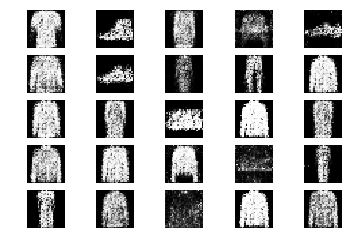

5651 [D loss: 0.634233, acc.: 62.50%] [G loss: 0.887325]
5652 [D loss: 0.660484, acc.: 57.81%] [G loss: 0.930190]
5653 [D loss: 0.639515, acc.: 60.94%] [G loss: 0.861447]
5654 [D loss: 0.652010, acc.: 56.25%] [G loss: 0.883146]
5655 [D loss: 0.663389, acc.: 57.81%] [G loss: 0.880767]
5656 [D loss: 0.692981, acc.: 53.12%] [G loss: 0.958727]
5657 [D loss: 0.599129, acc.: 68.75%] [G loss: 0.931877]
5658 [D loss: 0.660575, acc.: 65.62%] [G loss: 1.002297]
5659 [D loss: 0.697607, acc.: 64.06%] [G loss: 0.999703]
5660 [D loss: 0.656313, acc.: 57.81%] [G loss: 0.936437]
5661 [D loss: 0.660442, acc.: 62.50%] [G loss: 0.900193]
5662 [D loss: 0.614845, acc.: 68.75%] [G loss: 0.846132]
5663 [D loss: 0.655262, acc.: 60.94%] [G loss: 0.885597]
5664 [D loss: 0.608649, acc.: 73.44%] [G loss: 0.919264]
5665 [D loss: 0.615931, acc.: 68.75%] [G loss: 0.855691]
5666 [D loss: 0.677113, acc.: 57.81%] [G loss: 0.855695]
5667 [D loss: 0.621652, acc.: 64.06%] [G loss: 0.961135]
5668 [D loss: 0.695090, acc.: 5

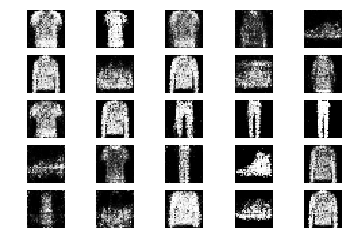

5701 [D loss: 0.551573, acc.: 73.44%] [G loss: 0.928495]
5702 [D loss: 0.647271, acc.: 57.81%] [G loss: 0.943356]
5703 [D loss: 0.590558, acc.: 67.19%] [G loss: 0.956927]
5704 [D loss: 0.710849, acc.: 51.56%] [G loss: 0.953974]
5705 [D loss: 0.629086, acc.: 67.19%] [G loss: 0.970330]
5706 [D loss: 0.637940, acc.: 62.50%] [G loss: 1.005784]
5707 [D loss: 0.661837, acc.: 60.94%] [G loss: 0.903290]
5708 [D loss: 0.651921, acc.: 65.62%] [G loss: 1.047865]
5709 [D loss: 0.712477, acc.: 57.81%] [G loss: 0.971651]
5710 [D loss: 0.647378, acc.: 60.94%] [G loss: 0.954370]
5711 [D loss: 0.610246, acc.: 75.00%] [G loss: 0.994655]
5712 [D loss: 0.646900, acc.: 56.25%] [G loss: 0.872144]
5713 [D loss: 0.776500, acc.: 45.31%] [G loss: 0.841258]
5714 [D loss: 0.703250, acc.: 57.81%] [G loss: 0.937052]
5715 [D loss: 0.694033, acc.: 65.62%] [G loss: 0.907722]
5716 [D loss: 0.616939, acc.: 70.31%] [G loss: 0.959755]
5717 [D loss: 0.703909, acc.: 56.25%] [G loss: 0.873273]
5718 [D loss: 0.581588, acc.: 7

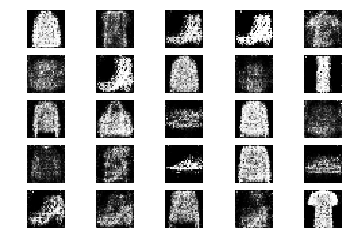

5751 [D loss: 0.662740, acc.: 57.81%] [G loss: 0.938697]
5752 [D loss: 0.527178, acc.: 79.69%] [G loss: 1.032844]
5753 [D loss: 0.685541, acc.: 59.38%] [G loss: 0.963824]
5754 [D loss: 0.601121, acc.: 68.75%] [G loss: 0.993824]
5755 [D loss: 0.612439, acc.: 65.62%] [G loss: 0.923058]
5756 [D loss: 0.575834, acc.: 68.75%] [G loss: 0.965854]
5757 [D loss: 0.639952, acc.: 65.62%] [G loss: 0.994595]
5758 [D loss: 0.649576, acc.: 64.06%] [G loss: 0.970610]
5759 [D loss: 0.631414, acc.: 64.06%] [G loss: 0.988687]
5760 [D loss: 0.633174, acc.: 64.06%] [G loss: 0.980120]
5761 [D loss: 0.657713, acc.: 62.50%] [G loss: 0.878602]
5762 [D loss: 0.668473, acc.: 64.06%] [G loss: 0.874837]
5763 [D loss: 0.576000, acc.: 67.19%] [G loss: 0.890421]
5764 [D loss: 0.691196, acc.: 60.94%] [G loss: 0.912914]
5765 [D loss: 0.659894, acc.: 57.81%] [G loss: 0.865089]
5766 [D loss: 0.619307, acc.: 75.00%] [G loss: 0.861731]
5767 [D loss: 0.625831, acc.: 73.44%] [G loss: 0.832013]
5768 [D loss: 0.660408, acc.: 6

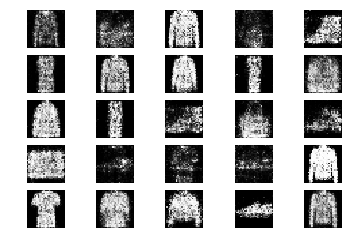

5801 [D loss: 0.716055, acc.: 48.44%] [G loss: 0.980949]
5802 [D loss: 0.604138, acc.: 68.75%] [G loss: 0.966299]
5803 [D loss: 0.590009, acc.: 67.19%] [G loss: 0.925956]
5804 [D loss: 0.728589, acc.: 50.00%] [G loss: 0.908253]
5805 [D loss: 0.693564, acc.: 57.81%] [G loss: 0.970893]
5806 [D loss: 0.609966, acc.: 71.88%] [G loss: 0.874610]
5807 [D loss: 0.674941, acc.: 62.50%] [G loss: 0.966322]
5808 [D loss: 0.616510, acc.: 59.38%] [G loss: 0.945502]
5809 [D loss: 0.622165, acc.: 62.50%] [G loss: 1.009233]
5810 [D loss: 0.592859, acc.: 71.88%] [G loss: 0.922568]
5811 [D loss: 0.692531, acc.: 50.00%] [G loss: 0.927406]
5812 [D loss: 0.673627, acc.: 54.69%] [G loss: 0.899156]
5813 [D loss: 0.691761, acc.: 51.56%] [G loss: 0.830356]
5814 [D loss: 0.579497, acc.: 70.31%] [G loss: 0.861920]
5815 [D loss: 0.600219, acc.: 59.38%] [G loss: 0.899391]
5816 [D loss: 0.670442, acc.: 59.38%] [G loss: 0.963108]
5817 [D loss: 0.634457, acc.: 73.44%] [G loss: 0.946017]
5818 [D loss: 0.616654, acc.: 6

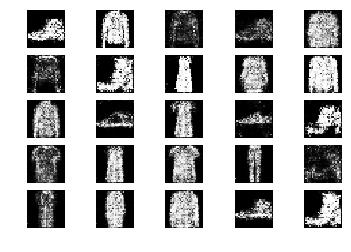

5851 [D loss: 0.708544, acc.: 54.69%] [G loss: 0.913563]
5852 [D loss: 0.613736, acc.: 65.62%] [G loss: 0.871450]
5853 [D loss: 0.659818, acc.: 57.81%] [G loss: 0.859551]
5854 [D loss: 0.662112, acc.: 56.25%] [G loss: 0.871233]
5855 [D loss: 0.643031, acc.: 62.50%] [G loss: 1.004057]
5856 [D loss: 0.663819, acc.: 57.81%] [G loss: 0.944198]
5857 [D loss: 0.623663, acc.: 59.38%] [G loss: 0.923271]
5858 [D loss: 0.631887, acc.: 67.19%] [G loss: 0.882415]
5859 [D loss: 0.676569, acc.: 57.81%] [G loss: 0.926995]
5860 [D loss: 0.697906, acc.: 53.12%] [G loss: 0.964469]
5861 [D loss: 0.665057, acc.: 57.81%] [G loss: 0.915548]
5862 [D loss: 0.629986, acc.: 65.62%] [G loss: 0.916276]
5863 [D loss: 0.676153, acc.: 59.38%] [G loss: 0.935455]
5864 [D loss: 0.659375, acc.: 64.06%] [G loss: 0.955283]
5865 [D loss: 0.621480, acc.: 70.31%] [G loss: 0.927678]
5866 [D loss: 0.689166, acc.: 54.69%] [G loss: 0.939351]
5867 [D loss: 0.681523, acc.: 53.12%] [G loss: 0.948184]
5868 [D loss: 0.648608, acc.: 6

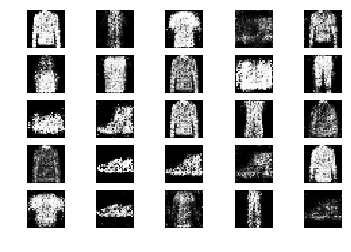

5901 [D loss: 0.683315, acc.: 54.69%] [G loss: 1.061992]
5902 [D loss: 0.633930, acc.: 62.50%] [G loss: 0.931445]
5903 [D loss: 0.613364, acc.: 68.75%] [G loss: 0.922658]
5904 [D loss: 0.620346, acc.: 64.06%] [G loss: 0.904404]
5905 [D loss: 0.670390, acc.: 64.06%] [G loss: 0.990917]
5906 [D loss: 0.588618, acc.: 67.19%] [G loss: 0.981241]
5907 [D loss: 0.611308, acc.: 70.31%] [G loss: 0.939237]
5908 [D loss: 0.662836, acc.: 50.00%] [G loss: 0.907485]
5909 [D loss: 0.615035, acc.: 67.19%] [G loss: 0.923926]
5910 [D loss: 0.604798, acc.: 67.19%] [G loss: 0.877816]
5911 [D loss: 0.661099, acc.: 64.06%] [G loss: 0.889873]
5912 [D loss: 0.646759, acc.: 67.19%] [G loss: 0.897572]
5913 [D loss: 0.652567, acc.: 65.62%] [G loss: 0.927967]
5914 [D loss: 0.659983, acc.: 59.38%] [G loss: 0.941127]
5915 [D loss: 0.669014, acc.: 56.25%] [G loss: 0.908737]
5916 [D loss: 0.652894, acc.: 60.94%] [G loss: 0.945764]
5917 [D loss: 0.699423, acc.: 65.62%] [G loss: 0.904833]
5918 [D loss: 0.662431, acc.: 6

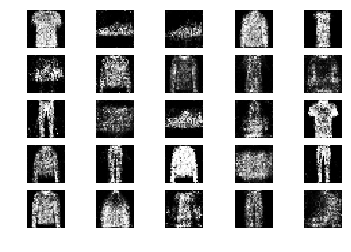

5951 [D loss: 0.719149, acc.: 59.38%] [G loss: 0.982143]
5952 [D loss: 0.581789, acc.: 71.88%] [G loss: 0.921178]
5953 [D loss: 0.764275, acc.: 48.44%] [G loss: 0.871786]
5954 [D loss: 0.693319, acc.: 56.25%] [G loss: 0.967258]
5955 [D loss: 0.672789, acc.: 57.81%] [G loss: 0.939609]
5956 [D loss: 0.735700, acc.: 53.12%] [G loss: 0.976937]
5957 [D loss: 0.637991, acc.: 62.50%] [G loss: 0.923999]
5958 [D loss: 0.656409, acc.: 57.81%] [G loss: 0.847591]
5959 [D loss: 0.677038, acc.: 56.25%] [G loss: 0.877740]
5960 [D loss: 0.724975, acc.: 51.56%] [G loss: 0.871978]
5961 [D loss: 0.663374, acc.: 65.62%] [G loss: 0.789917]
5962 [D loss: 0.664425, acc.: 59.38%] [G loss: 0.805022]
5963 [D loss: 0.654693, acc.: 57.81%] [G loss: 0.877522]
5964 [D loss: 0.697990, acc.: 57.81%] [G loss: 0.871970]
5965 [D loss: 0.627391, acc.: 64.06%] [G loss: 0.896770]
5966 [D loss: 0.636539, acc.: 65.62%] [G loss: 0.888305]
5967 [D loss: 0.700147, acc.: 51.56%] [G loss: 0.933435]
5968 [D loss: 0.656721, acc.: 5

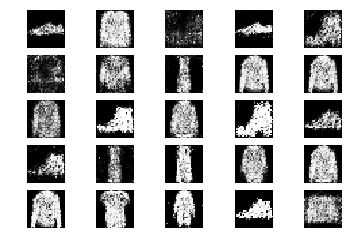

6001 [D loss: 0.634822, acc.: 65.62%] [G loss: 0.867204]
6002 [D loss: 0.655062, acc.: 59.38%] [G loss: 0.961743]
6003 [D loss: 0.752216, acc.: 48.44%] [G loss: 0.814135]
6004 [D loss: 0.653714, acc.: 67.19%] [G loss: 0.812295]
6005 [D loss: 0.728372, acc.: 50.00%] [G loss: 0.805064]
6006 [D loss: 0.657773, acc.: 60.94%] [G loss: 0.872143]
6007 [D loss: 0.673155, acc.: 62.50%] [G loss: 0.929313]
6008 [D loss: 0.707572, acc.: 54.69%] [G loss: 0.995463]
6009 [D loss: 0.632917, acc.: 59.38%] [G loss: 1.067735]
6010 [D loss: 0.688461, acc.: 56.25%] [G loss: 1.020449]
6011 [D loss: 0.692196, acc.: 56.25%] [G loss: 0.953940]
6012 [D loss: 0.606894, acc.: 68.75%] [G loss: 0.924371]
6013 [D loss: 0.570679, acc.: 76.56%] [G loss: 0.876601]
6014 [D loss: 0.645469, acc.: 64.06%] [G loss: 0.950560]
6015 [D loss: 0.671553, acc.: 57.81%] [G loss: 0.909298]
6016 [D loss: 0.720566, acc.: 56.25%] [G loss: 0.960432]
6017 [D loss: 0.651083, acc.: 62.50%] [G loss: 0.883874]
6018 [D loss: 0.603187, acc.: 7

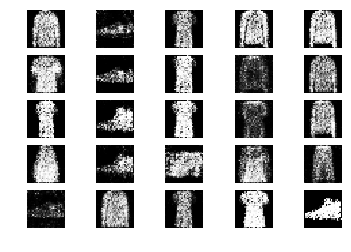

6051 [D loss: 0.702211, acc.: 57.81%] [G loss: 0.945235]
6052 [D loss: 0.624220, acc.: 71.88%] [G loss: 1.047020]
6053 [D loss: 0.700247, acc.: 54.69%] [G loss: 0.886364]
6054 [D loss: 0.610827, acc.: 59.38%] [G loss: 1.042004]
6055 [D loss: 0.697282, acc.: 57.81%] [G loss: 0.890379]
6056 [D loss: 0.684794, acc.: 64.06%] [G loss: 0.862363]
6057 [D loss: 0.602894, acc.: 76.56%] [G loss: 1.036197]
6058 [D loss: 0.694477, acc.: 56.25%] [G loss: 0.950814]
6059 [D loss: 0.662786, acc.: 60.94%] [G loss: 0.918534]
6060 [D loss: 0.621554, acc.: 62.50%] [G loss: 0.922683]
6061 [D loss: 0.615099, acc.: 64.06%] [G loss: 0.845482]
6062 [D loss: 0.712726, acc.: 60.94%] [G loss: 0.886824]
6063 [D loss: 0.630304, acc.: 62.50%] [G loss: 0.962211]
6064 [D loss: 0.579271, acc.: 78.12%] [G loss: 1.057487]
6065 [D loss: 0.699556, acc.: 60.94%] [G loss: 0.925915]
6066 [D loss: 0.612681, acc.: 68.75%] [G loss: 0.916385]
6067 [D loss: 0.686391, acc.: 56.25%] [G loss: 0.869916]
6068 [D loss: 0.615279, acc.: 6

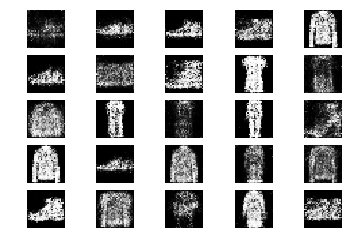

6101 [D loss: 0.691581, acc.: 56.25%] [G loss: 0.905062]
6102 [D loss: 0.608348, acc.: 65.62%] [G loss: 0.943570]
6103 [D loss: 0.673755, acc.: 54.69%] [G loss: 0.848422]
6104 [D loss: 0.626237, acc.: 65.62%] [G loss: 0.873850]
6105 [D loss: 0.714330, acc.: 57.81%] [G loss: 0.915266]
6106 [D loss: 0.647584, acc.: 56.25%] [G loss: 0.945663]
6107 [D loss: 0.634216, acc.: 60.94%] [G loss: 0.987855]
6108 [D loss: 0.661213, acc.: 59.38%] [G loss: 1.018882]
6109 [D loss: 0.636612, acc.: 62.50%] [G loss: 1.018300]
6110 [D loss: 0.660394, acc.: 60.94%] [G loss: 0.861638]
6111 [D loss: 0.538295, acc.: 70.31%] [G loss: 0.888097]
6112 [D loss: 0.647481, acc.: 62.50%] [G loss: 0.938603]
6113 [D loss: 0.654892, acc.: 56.25%] [G loss: 0.861886]
6114 [D loss: 0.620704, acc.: 64.06%] [G loss: 0.947031]
6115 [D loss: 0.592813, acc.: 68.75%] [G loss: 0.926736]
6116 [D loss: 0.623829, acc.: 62.50%] [G loss: 1.024185]
6117 [D loss: 0.656075, acc.: 65.62%] [G loss: 0.952026]
6118 [D loss: 0.666717, acc.: 6

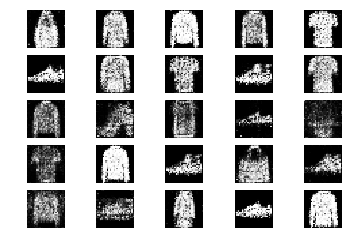

6151 [D loss: 0.702045, acc.: 54.69%] [G loss: 0.867971]
6152 [D loss: 0.661135, acc.: 67.19%] [G loss: 0.857428]
6153 [D loss: 0.603444, acc.: 60.94%] [G loss: 0.857124]
6154 [D loss: 0.690155, acc.: 54.69%] [G loss: 0.927149]
6155 [D loss: 0.620177, acc.: 65.62%] [G loss: 0.929313]
6156 [D loss: 0.783640, acc.: 45.31%] [G loss: 0.968665]
6157 [D loss: 0.612136, acc.: 65.62%] [G loss: 0.973441]
6158 [D loss: 0.768327, acc.: 48.44%] [G loss: 0.927056]
6159 [D loss: 0.602171, acc.: 65.62%] [G loss: 0.962680]
6160 [D loss: 0.650571, acc.: 67.19%] [G loss: 0.974479]
6161 [D loss: 0.621408, acc.: 60.94%] [G loss: 0.922150]
6162 [D loss: 0.691183, acc.: 59.38%] [G loss: 0.935430]
6163 [D loss: 0.624957, acc.: 67.19%] [G loss: 0.987390]
6164 [D loss: 0.646011, acc.: 62.50%] [G loss: 0.968422]
6165 [D loss: 0.624428, acc.: 64.06%] [G loss: 0.937838]
6166 [D loss: 0.596807, acc.: 68.75%] [G loss: 1.024314]
6167 [D loss: 0.682550, acc.: 56.25%] [G loss: 0.990995]
6168 [D loss: 0.678000, acc.: 5

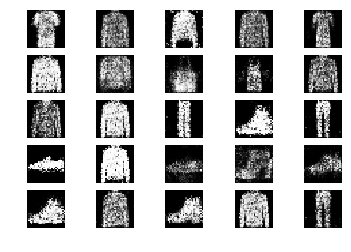

6201 [D loss: 0.676882, acc.: 54.69%] [G loss: 0.873225]
6202 [D loss: 0.642625, acc.: 62.50%] [G loss: 0.954723]
6203 [D loss: 0.648655, acc.: 62.50%] [G loss: 0.885176]
6204 [D loss: 0.572939, acc.: 75.00%] [G loss: 0.953657]
6205 [D loss: 0.601886, acc.: 75.00%] [G loss: 0.921636]
6206 [D loss: 0.622739, acc.: 71.88%] [G loss: 0.977557]
6207 [D loss: 0.618508, acc.: 60.94%] [G loss: 0.953699]
6208 [D loss: 0.647571, acc.: 62.50%] [G loss: 1.023899]
6209 [D loss: 0.587617, acc.: 70.31%] [G loss: 0.939881]
6210 [D loss: 0.573326, acc.: 65.62%] [G loss: 0.925882]
6211 [D loss: 0.725692, acc.: 48.44%] [G loss: 1.070993]
6212 [D loss: 0.709542, acc.: 57.81%] [G loss: 0.972478]
6213 [D loss: 0.591598, acc.: 67.19%] [G loss: 0.990030]
6214 [D loss: 0.605632, acc.: 75.00%] [G loss: 1.015741]
6215 [D loss: 0.679029, acc.: 54.69%] [G loss: 0.916013]
6216 [D loss: 0.647666, acc.: 56.25%] [G loss: 0.955420]
6217 [D loss: 0.671017, acc.: 60.94%] [G loss: 0.932913]
6218 [D loss: 0.662798, acc.: 5

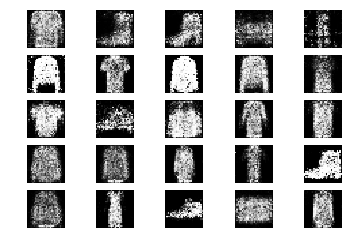

6251 [D loss: 0.651106, acc.: 67.19%] [G loss: 0.927482]
6252 [D loss: 0.725021, acc.: 45.31%] [G loss: 0.914129]
6253 [D loss: 0.619639, acc.: 67.19%] [G loss: 0.910247]
6254 [D loss: 0.655709, acc.: 59.38%] [G loss: 0.869482]
6255 [D loss: 0.677812, acc.: 57.81%] [G loss: 0.869194]
6256 [D loss: 0.693029, acc.: 59.38%] [G loss: 0.918165]
6257 [D loss: 0.652961, acc.: 62.50%] [G loss: 0.822367]
6258 [D loss: 0.661479, acc.: 62.50%] [G loss: 0.970116]
6259 [D loss: 0.675567, acc.: 60.94%] [G loss: 0.904181]
6260 [D loss: 0.641790, acc.: 64.06%] [G loss: 0.930363]
6261 [D loss: 0.645194, acc.: 60.94%] [G loss: 0.868088]
6262 [D loss: 0.710931, acc.: 57.81%] [G loss: 0.928770]
6263 [D loss: 0.711203, acc.: 53.12%] [G loss: 0.849778]
6264 [D loss: 0.654367, acc.: 56.25%] [G loss: 0.982491]
6265 [D loss: 0.711358, acc.: 53.12%] [G loss: 0.974297]
6266 [D loss: 0.670987, acc.: 56.25%] [G loss: 0.928988]
6267 [D loss: 0.638080, acc.: 65.62%] [G loss: 0.906267]
6268 [D loss: 0.663951, acc.: 5

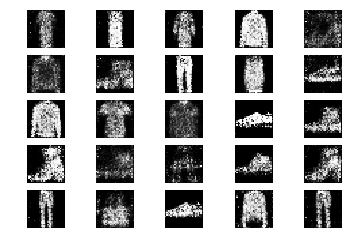

6301 [D loss: 0.658760, acc.: 65.62%] [G loss: 0.949438]
6302 [D loss: 0.613118, acc.: 70.31%] [G loss: 0.869468]
6303 [D loss: 0.602138, acc.: 68.75%] [G loss: 0.954110]
6304 [D loss: 0.705675, acc.: 57.81%] [G loss: 0.930556]
6305 [D loss: 0.660895, acc.: 62.50%] [G loss: 0.865231]
6306 [D loss: 0.709735, acc.: 56.25%] [G loss: 0.938788]
6307 [D loss: 0.609681, acc.: 65.62%] [G loss: 0.998605]
6308 [D loss: 0.685702, acc.: 51.56%] [G loss: 1.009960]
6309 [D loss: 0.644903, acc.: 53.12%] [G loss: 0.961928]
6310 [D loss: 0.649040, acc.: 56.25%] [G loss: 0.962906]
6311 [D loss: 0.730492, acc.: 45.31%] [G loss: 0.872490]
6312 [D loss: 0.658797, acc.: 64.06%] [G loss: 0.849939]
6313 [D loss: 0.659408, acc.: 56.25%] [G loss: 0.869826]
6314 [D loss: 0.644317, acc.: 62.50%] [G loss: 0.829742]
6315 [D loss: 0.689307, acc.: 64.06%] [G loss: 0.873607]
6316 [D loss: 0.626542, acc.: 54.69%] [G loss: 0.960531]
6317 [D loss: 0.637212, acc.: 60.94%] [G loss: 0.943667]
6318 [D loss: 0.594460, acc.: 6

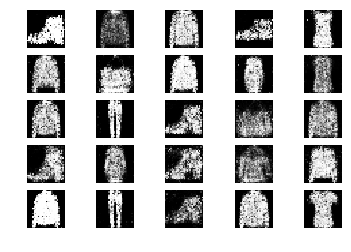

6351 [D loss: 0.704041, acc.: 59.38%] [G loss: 0.979353]
6352 [D loss: 0.652887, acc.: 59.38%] [G loss: 0.917640]
6353 [D loss: 0.694542, acc.: 50.00%] [G loss: 0.856068]
6354 [D loss: 0.668485, acc.: 60.94%] [G loss: 0.871977]
6355 [D loss: 0.679078, acc.: 54.69%] [G loss: 0.820768]
6356 [D loss: 0.699894, acc.: 56.25%] [G loss: 0.980460]
6357 [D loss: 0.662411, acc.: 60.94%] [G loss: 1.030205]
6358 [D loss: 0.666549, acc.: 65.62%] [G loss: 0.972876]
6359 [D loss: 0.626420, acc.: 65.62%] [G loss: 0.927168]
6360 [D loss: 0.637175, acc.: 54.69%] [G loss: 0.903795]
6361 [D loss: 0.663965, acc.: 56.25%] [G loss: 0.904210]
6362 [D loss: 0.576846, acc.: 65.62%] [G loss: 0.935158]
6363 [D loss: 0.666751, acc.: 57.81%] [G loss: 0.957461]
6364 [D loss: 0.649958, acc.: 54.69%] [G loss: 0.935460]
6365 [D loss: 0.613671, acc.: 67.19%] [G loss: 0.916854]
6366 [D loss: 0.678934, acc.: 59.38%] [G loss: 0.822074]
6367 [D loss: 0.697866, acc.: 64.06%] [G loss: 0.860608]
6368 [D loss: 0.642069, acc.: 6

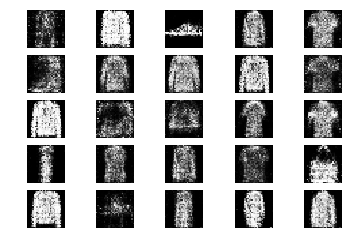

6401 [D loss: 0.688460, acc.: 54.69%] [G loss: 0.871925]
6402 [D loss: 0.615609, acc.: 68.75%] [G loss: 0.894736]
6403 [D loss: 0.642537, acc.: 54.69%] [G loss: 0.891066]
6404 [D loss: 0.607366, acc.: 67.19%] [G loss: 0.887913]
6405 [D loss: 0.699993, acc.: 62.50%] [G loss: 0.988857]
6406 [D loss: 0.632697, acc.: 60.94%] [G loss: 0.950850]
6407 [D loss: 0.657464, acc.: 60.94%] [G loss: 0.879045]
6408 [D loss: 0.730303, acc.: 53.12%] [G loss: 0.853288]
6409 [D loss: 0.623435, acc.: 67.19%] [G loss: 0.846526]
6410 [D loss: 0.661319, acc.: 57.81%] [G loss: 0.910380]
6411 [D loss: 0.645621, acc.: 67.19%] [G loss: 0.912460]
6412 [D loss: 0.636997, acc.: 65.62%] [G loss: 0.893968]
6413 [D loss: 0.713827, acc.: 59.38%] [G loss: 0.947063]
6414 [D loss: 0.620380, acc.: 65.62%] [G loss: 0.976356]
6415 [D loss: 0.639918, acc.: 62.50%] [G loss: 0.917901]
6416 [D loss: 0.721730, acc.: 53.12%] [G loss: 0.842615]
6417 [D loss: 0.622208, acc.: 65.62%] [G loss: 0.883896]
6418 [D loss: 0.598250, acc.: 6

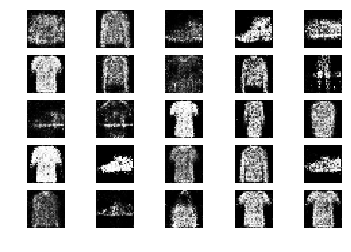

6451 [D loss: 0.612874, acc.: 68.75%] [G loss: 0.937342]
6452 [D loss: 0.629245, acc.: 64.06%] [G loss: 0.853161]
6453 [D loss: 0.630459, acc.: 67.19%] [G loss: 0.877982]
6454 [D loss: 0.624758, acc.: 62.50%] [G loss: 0.879308]
6455 [D loss: 0.693067, acc.: 62.50%] [G loss: 0.877186]
6456 [D loss: 0.645553, acc.: 68.75%] [G loss: 1.001402]
6457 [D loss: 0.637779, acc.: 62.50%] [G loss: 0.914400]
6458 [D loss: 0.631032, acc.: 64.06%] [G loss: 1.005207]
6459 [D loss: 0.677582, acc.: 59.38%] [G loss: 0.935264]
6460 [D loss: 0.636344, acc.: 65.62%] [G loss: 0.953473]
6461 [D loss: 0.618988, acc.: 64.06%] [G loss: 0.933131]
6462 [D loss: 0.660645, acc.: 65.62%] [G loss: 0.864021]
6463 [D loss: 0.711749, acc.: 46.88%] [G loss: 0.980840]
6464 [D loss: 0.633555, acc.: 67.19%] [G loss: 0.965816]
6465 [D loss: 0.649947, acc.: 67.19%] [G loss: 0.904427]
6466 [D loss: 0.631556, acc.: 68.75%] [G loss: 0.896603]
6467 [D loss: 0.592499, acc.: 75.00%] [G loss: 0.846371]
6468 [D loss: 0.679293, acc.: 5

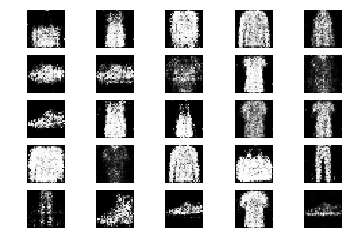

6501 [D loss: 0.608525, acc.: 59.38%] [G loss: 0.878360]
6502 [D loss: 0.707294, acc.: 53.12%] [G loss: 0.896195]
6503 [D loss: 0.687614, acc.: 51.56%] [G loss: 0.919138]
6504 [D loss: 0.642799, acc.: 60.94%] [G loss: 0.869795]
6505 [D loss: 0.598356, acc.: 65.62%] [G loss: 0.911315]
6506 [D loss: 0.641594, acc.: 54.69%] [G loss: 0.905265]
6507 [D loss: 0.620536, acc.: 65.62%] [G loss: 0.927714]
6508 [D loss: 0.717424, acc.: 50.00%] [G loss: 0.960496]
6509 [D loss: 0.697420, acc.: 48.44%] [G loss: 0.852085]
6510 [D loss: 0.633484, acc.: 65.62%] [G loss: 0.981128]
6511 [D loss: 0.638794, acc.: 57.81%] [G loss: 0.946034]
6512 [D loss: 0.627383, acc.: 67.19%] [G loss: 0.844375]
6513 [D loss: 0.683346, acc.: 56.25%] [G loss: 0.879610]
6514 [D loss: 0.625378, acc.: 70.31%] [G loss: 0.954191]
6515 [D loss: 0.673400, acc.: 59.38%] [G loss: 0.883993]
6516 [D loss: 0.676358, acc.: 62.50%] [G loss: 0.850647]
6517 [D loss: 0.605388, acc.: 64.06%] [G loss: 0.917574]
6518 [D loss: 0.696241, acc.: 5

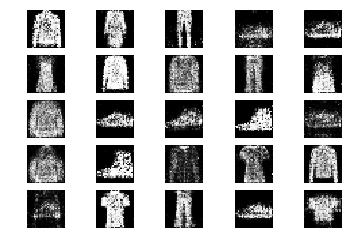

6551 [D loss: 0.659303, acc.: 62.50%] [G loss: 0.919870]
6552 [D loss: 0.654540, acc.: 64.06%] [G loss: 1.014721]
6553 [D loss: 0.718943, acc.: 53.12%] [G loss: 0.992764]
6554 [D loss: 0.665745, acc.: 62.50%] [G loss: 0.876572]
6555 [D loss: 0.660830, acc.: 59.38%] [G loss: 0.919599]
6556 [D loss: 0.642762, acc.: 68.75%] [G loss: 0.944977]
6557 [D loss: 0.701143, acc.: 54.69%] [G loss: 0.953905]
6558 [D loss: 0.641115, acc.: 64.06%] [G loss: 0.869630]
6559 [D loss: 0.679360, acc.: 54.69%] [G loss: 0.830327]
6560 [D loss: 0.625570, acc.: 59.38%] [G loss: 0.926654]
6561 [D loss: 0.646584, acc.: 62.50%] [G loss: 0.914604]
6562 [D loss: 0.717601, acc.: 53.12%] [G loss: 0.902267]
6563 [D loss: 0.659120, acc.: 59.38%] [G loss: 0.900180]
6564 [D loss: 0.645104, acc.: 59.38%] [G loss: 0.915964]
6565 [D loss: 0.637286, acc.: 59.38%] [G loss: 0.953746]
6566 [D loss: 0.702075, acc.: 60.94%] [G loss: 0.913550]
6567 [D loss: 0.660873, acc.: 59.38%] [G loss: 0.926509]
6568 [D loss: 0.667472, acc.: 5

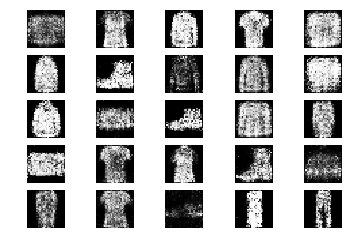

6601 [D loss: 0.662976, acc.: 60.94%] [G loss: 0.910062]
6602 [D loss: 0.638453, acc.: 60.94%] [G loss: 0.949507]
6603 [D loss: 0.674291, acc.: 60.94%] [G loss: 0.917383]
6604 [D loss: 0.671310, acc.: 54.69%] [G loss: 0.968737]
6605 [D loss: 0.666795, acc.: 50.00%] [G loss: 0.970841]
6606 [D loss: 0.678928, acc.: 62.50%] [G loss: 0.933712]
6607 [D loss: 0.623934, acc.: 76.56%] [G loss: 0.978687]
6608 [D loss: 0.685839, acc.: 60.94%] [G loss: 0.900075]
6609 [D loss: 0.633957, acc.: 62.50%] [G loss: 0.852964]
6610 [D loss: 0.621114, acc.: 65.62%] [G loss: 0.891212]
6611 [D loss: 0.636558, acc.: 64.06%] [G loss: 0.891786]
6612 [D loss: 0.608965, acc.: 67.19%] [G loss: 0.920925]
6613 [D loss: 0.583071, acc.: 73.44%] [G loss: 0.916348]
6614 [D loss: 0.683501, acc.: 50.00%] [G loss: 0.966628]
6615 [D loss: 0.693685, acc.: 57.81%] [G loss: 0.977196]
6616 [D loss: 0.636937, acc.: 59.38%] [G loss: 1.071128]
6617 [D loss: 0.565623, acc.: 70.31%] [G loss: 1.033337]
6618 [D loss: 0.687510, acc.: 5

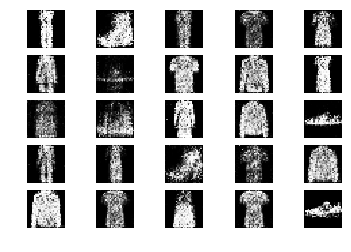

6651 [D loss: 0.656353, acc.: 59.38%] [G loss: 0.886797]
6652 [D loss: 0.642924, acc.: 57.81%] [G loss: 0.918363]
6653 [D loss: 0.653682, acc.: 62.50%] [G loss: 0.940372]
6654 [D loss: 0.632958, acc.: 64.06%] [G loss: 0.990627]
6655 [D loss: 0.604834, acc.: 67.19%] [G loss: 0.917554]
6656 [D loss: 0.657318, acc.: 59.38%] [G loss: 0.818289]
6657 [D loss: 0.658614, acc.: 60.94%] [G loss: 0.747513]
6658 [D loss: 0.652596, acc.: 62.50%] [G loss: 0.883704]
6659 [D loss: 0.649221, acc.: 54.69%] [G loss: 0.838939]
6660 [D loss: 0.628949, acc.: 67.19%] [G loss: 0.956928]
6661 [D loss: 0.683228, acc.: 56.25%] [G loss: 0.904558]
6662 [D loss: 0.626532, acc.: 67.19%] [G loss: 0.970689]
6663 [D loss: 0.652250, acc.: 62.50%] [G loss: 0.991679]
6664 [D loss: 0.664742, acc.: 60.94%] [G loss: 0.991425]
6665 [D loss: 0.654086, acc.: 57.81%] [G loss: 0.904505]
6666 [D loss: 0.598173, acc.: 71.88%] [G loss: 0.953318]
6667 [D loss: 0.669006, acc.: 57.81%] [G loss: 0.969093]
6668 [D loss: 0.614191, acc.: 6

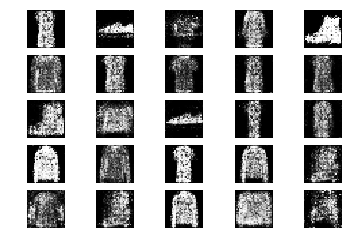

6701 [D loss: 0.635131, acc.: 68.75%] [G loss: 0.940550]
6702 [D loss: 0.702757, acc.: 59.38%] [G loss: 0.927580]
6703 [D loss: 0.632533, acc.: 57.81%] [G loss: 0.895887]
6704 [D loss: 0.642462, acc.: 60.94%] [G loss: 0.983858]
6705 [D loss: 0.667194, acc.: 54.69%] [G loss: 0.840657]
6706 [D loss: 0.627087, acc.: 68.75%] [G loss: 0.948107]
6707 [D loss: 0.593824, acc.: 71.88%] [G loss: 0.892974]
6708 [D loss: 0.674454, acc.: 56.25%] [G loss: 1.028662]
6709 [D loss: 0.671647, acc.: 54.69%] [G loss: 0.915147]
6710 [D loss: 0.657502, acc.: 59.38%] [G loss: 0.942173]
6711 [D loss: 0.711910, acc.: 50.00%] [G loss: 0.913008]
6712 [D loss: 0.746144, acc.: 50.00%] [G loss: 0.843211]
6713 [D loss: 0.691326, acc.: 56.25%] [G loss: 0.919070]
6714 [D loss: 0.604332, acc.: 62.50%] [G loss: 0.957554]
6715 [D loss: 0.666224, acc.: 57.81%] [G loss: 0.900763]
6716 [D loss: 0.666437, acc.: 56.25%] [G loss: 1.002520]
6717 [D loss: 0.593997, acc.: 67.19%] [G loss: 0.905128]
6718 [D loss: 0.656928, acc.: 5

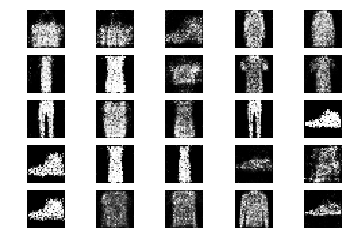

6751 [D loss: 0.648784, acc.: 62.50%] [G loss: 0.882061]
6752 [D loss: 0.648228, acc.: 59.38%] [G loss: 0.911274]
6753 [D loss: 0.614536, acc.: 68.75%] [G loss: 0.959611]
6754 [D loss: 0.678127, acc.: 53.12%] [G loss: 0.871961]
6755 [D loss: 0.645497, acc.: 60.94%] [G loss: 0.834886]
6756 [D loss: 0.644779, acc.: 57.81%] [G loss: 0.954360]
6757 [D loss: 0.706743, acc.: 50.00%] [G loss: 0.952749]
6758 [D loss: 0.708049, acc.: 50.00%] [G loss: 0.929128]
6759 [D loss: 0.651759, acc.: 65.62%] [G loss: 0.942726]
6760 [D loss: 0.637956, acc.: 64.06%] [G loss: 0.950243]
6761 [D loss: 0.598433, acc.: 73.44%] [G loss: 0.953295]
6762 [D loss: 0.680824, acc.: 64.06%] [G loss: 0.883963]
6763 [D loss: 0.662713, acc.: 56.25%] [G loss: 0.901204]
6764 [D loss: 0.672000, acc.: 56.25%] [G loss: 0.900715]
6765 [D loss: 0.613927, acc.: 67.19%] [G loss: 0.952598]
6766 [D loss: 0.637105, acc.: 65.62%] [G loss: 0.962381]
6767 [D loss: 0.574814, acc.: 78.12%] [G loss: 0.971629]
6768 [D loss: 0.619435, acc.: 6

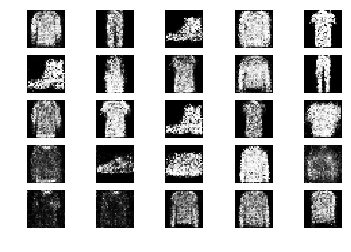

6801 [D loss: 0.693479, acc.: 48.44%] [G loss: 0.878266]
6802 [D loss: 0.664869, acc.: 51.56%] [G loss: 0.918867]
6803 [D loss: 0.653953, acc.: 68.75%] [G loss: 0.846965]
6804 [D loss: 0.643406, acc.: 59.38%] [G loss: 0.863807]
6805 [D loss: 0.656268, acc.: 56.25%] [G loss: 0.834413]
6806 [D loss: 0.643446, acc.: 64.06%] [G loss: 0.909338]
6807 [D loss: 0.687511, acc.: 50.00%] [G loss: 0.907398]
6808 [D loss: 0.717046, acc.: 56.25%] [G loss: 0.891110]
6809 [D loss: 0.663812, acc.: 56.25%] [G loss: 0.963837]
6810 [D loss: 0.677643, acc.: 53.12%] [G loss: 0.902103]
6811 [D loss: 0.659723, acc.: 54.69%] [G loss: 0.881162]
6812 [D loss: 0.612782, acc.: 76.56%] [G loss: 0.931009]
6813 [D loss: 0.654312, acc.: 67.19%] [G loss: 0.956479]
6814 [D loss: 0.727580, acc.: 50.00%] [G loss: 0.920691]
6815 [D loss: 0.627503, acc.: 60.94%] [G loss: 0.812446]
6816 [D loss: 0.631726, acc.: 62.50%] [G loss: 0.951899]
6817 [D loss: 0.650302, acc.: 59.38%] [G loss: 0.839337]
6818 [D loss: 0.690491, acc.: 6

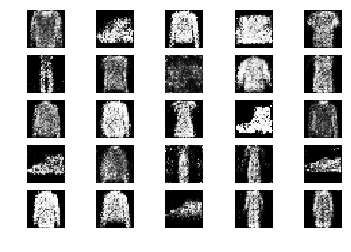

6851 [D loss: 0.656830, acc.: 67.19%] [G loss: 0.920269]
6852 [D loss: 0.661441, acc.: 57.81%] [G loss: 0.944474]
6853 [D loss: 0.669803, acc.: 67.19%] [G loss: 0.883908]
6854 [D loss: 0.682649, acc.: 51.56%] [G loss: 0.889211]
6855 [D loss: 0.671992, acc.: 64.06%] [G loss: 0.936490]
6856 [D loss: 0.618983, acc.: 68.75%] [G loss: 0.949066]
6857 [D loss: 0.602565, acc.: 68.75%] [G loss: 0.882652]
6858 [D loss: 0.617005, acc.: 60.94%] [G loss: 0.892355]
6859 [D loss: 0.660050, acc.: 59.38%] [G loss: 0.940894]
6860 [D loss: 0.634916, acc.: 56.25%] [G loss: 0.901812]
6861 [D loss: 0.718011, acc.: 64.06%] [G loss: 0.917394]
6862 [D loss: 0.646613, acc.: 68.75%] [G loss: 0.977027]
6863 [D loss: 0.628615, acc.: 60.94%] [G loss: 0.872190]
6864 [D loss: 0.635043, acc.: 70.31%] [G loss: 0.903312]
6865 [D loss: 0.641316, acc.: 67.19%] [G loss: 0.860818]
6866 [D loss: 0.668898, acc.: 51.56%] [G loss: 0.932063]
6867 [D loss: 0.629545, acc.: 64.06%] [G loss: 0.928861]
6868 [D loss: 0.617024, acc.: 6

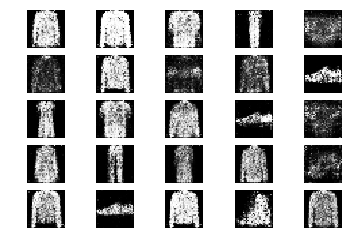

6901 [D loss: 0.664621, acc.: 57.81%] [G loss: 0.983822]
6902 [D loss: 0.593241, acc.: 64.06%] [G loss: 0.941837]
6903 [D loss: 0.647966, acc.: 71.88%] [G loss: 0.904463]
6904 [D loss: 0.578790, acc.: 73.44%] [G loss: 0.911541]
6905 [D loss: 0.651961, acc.: 62.50%] [G loss: 0.902112]
6906 [D loss: 0.614383, acc.: 64.06%] [G loss: 0.936429]
6907 [D loss: 0.675504, acc.: 54.69%] [G loss: 0.876796]
6908 [D loss: 0.706416, acc.: 51.56%] [G loss: 0.846953]
6909 [D loss: 0.652045, acc.: 57.81%] [G loss: 0.828092]
6910 [D loss: 0.599653, acc.: 64.06%] [G loss: 0.862965]
6911 [D loss: 0.594101, acc.: 64.06%] [G loss: 0.837492]
6912 [D loss: 0.678051, acc.: 56.25%] [G loss: 0.776999]
6913 [D loss: 0.706458, acc.: 53.12%] [G loss: 0.834260]
6914 [D loss: 0.620852, acc.: 56.25%] [G loss: 0.906063]
6915 [D loss: 0.672192, acc.: 59.38%] [G loss: 0.948880]
6916 [D loss: 0.608394, acc.: 64.06%] [G loss: 0.929993]
6917 [D loss: 0.639124, acc.: 65.62%] [G loss: 0.915264]
6918 [D loss: 0.683881, acc.: 5

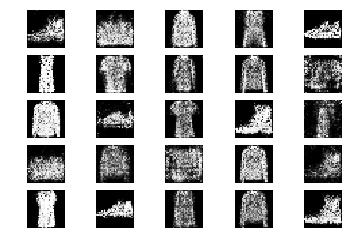

6951 [D loss: 0.578723, acc.: 76.56%] [G loss: 0.957551]
6952 [D loss: 0.672909, acc.: 64.06%] [G loss: 0.873984]
6953 [D loss: 0.605321, acc.: 62.50%] [G loss: 0.988934]
6954 [D loss: 0.673667, acc.: 60.94%] [G loss: 0.865527]
6955 [D loss: 0.640958, acc.: 64.06%] [G loss: 0.893478]
6956 [D loss: 0.603945, acc.: 68.75%] [G loss: 0.964733]
6957 [D loss: 0.673314, acc.: 56.25%] [G loss: 0.961922]
6958 [D loss: 0.697784, acc.: 50.00%] [G loss: 0.950886]
6959 [D loss: 0.651940, acc.: 59.38%] [G loss: 0.985726]
6960 [D loss: 0.680027, acc.: 59.38%] [G loss: 0.907259]
6961 [D loss: 0.672092, acc.: 64.06%] [G loss: 0.880649]
6962 [D loss: 0.655725, acc.: 70.31%] [G loss: 0.900690]
6963 [D loss: 0.628412, acc.: 65.62%] [G loss: 0.945160]
6964 [D loss: 0.666792, acc.: 53.12%] [G loss: 0.936429]
6965 [D loss: 0.681192, acc.: 60.94%] [G loss: 0.898548]
6966 [D loss: 0.676886, acc.: 53.12%] [G loss: 0.900694]
6967 [D loss: 0.682504, acc.: 51.56%] [G loss: 0.856801]
6968 [D loss: 0.652595, acc.: 5

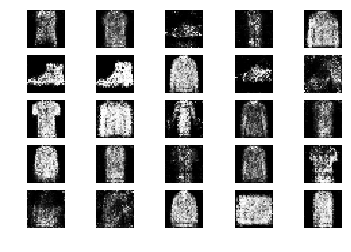

7001 [D loss: 0.696436, acc.: 57.81%] [G loss: 0.851033]
7002 [D loss: 0.679307, acc.: 56.25%] [G loss: 0.854337]
7003 [D loss: 0.633622, acc.: 64.06%] [G loss: 0.907843]
7004 [D loss: 0.569772, acc.: 73.44%] [G loss: 0.940181]
7005 [D loss: 0.584094, acc.: 70.31%] [G loss: 0.940588]
7006 [D loss: 0.568020, acc.: 75.00%] [G loss: 0.880769]
7007 [D loss: 0.604057, acc.: 64.06%] [G loss: 0.854371]
7008 [D loss: 0.676703, acc.: 57.81%] [G loss: 0.813766]
7009 [D loss: 0.675874, acc.: 60.94%] [G loss: 0.894905]
7010 [D loss: 0.635057, acc.: 64.06%] [G loss: 0.884447]
7011 [D loss: 0.665731, acc.: 64.06%] [G loss: 0.941536]
7012 [D loss: 0.580157, acc.: 64.06%] [G loss: 0.930745]
7013 [D loss: 0.671924, acc.: 60.94%] [G loss: 0.955569]
7014 [D loss: 0.627084, acc.: 68.75%] [G loss: 0.949975]
7015 [D loss: 0.623014, acc.: 65.62%] [G loss: 1.007611]
7016 [D loss: 0.643779, acc.: 70.31%] [G loss: 0.935181]
7017 [D loss: 0.738631, acc.: 48.44%] [G loss: 0.954307]
7018 [D loss: 0.667427, acc.: 5

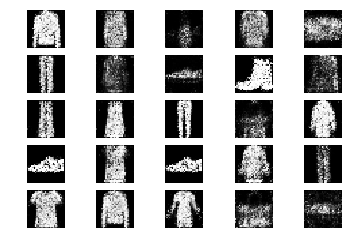

7051 [D loss: 0.708753, acc.: 59.38%] [G loss: 0.923458]
7052 [D loss: 0.677659, acc.: 57.81%] [G loss: 0.967825]
7053 [D loss: 0.636369, acc.: 64.06%] [G loss: 0.910554]
7054 [D loss: 0.657039, acc.: 60.94%] [G loss: 0.814256]
7055 [D loss: 0.664054, acc.: 59.38%] [G loss: 0.895690]
7056 [D loss: 0.646888, acc.: 57.81%] [G loss: 0.866431]
7057 [D loss: 0.626467, acc.: 60.94%] [G loss: 0.919084]
7058 [D loss: 0.758882, acc.: 57.81%] [G loss: 0.936070]
7059 [D loss: 0.649013, acc.: 62.50%] [G loss: 0.965884]
7060 [D loss: 0.652147, acc.: 65.62%] [G loss: 0.983297]
7061 [D loss: 0.651797, acc.: 60.94%] [G loss: 0.892318]
7062 [D loss: 0.624915, acc.: 67.19%] [G loss: 0.962180]
7063 [D loss: 0.625471, acc.: 75.00%] [G loss: 0.905655]
7064 [D loss: 0.654556, acc.: 62.50%] [G loss: 0.923252]
7065 [D loss: 0.695094, acc.: 59.38%] [G loss: 0.906699]
7066 [D loss: 0.707073, acc.: 54.69%] [G loss: 0.932891]
7067 [D loss: 0.658158, acc.: 53.12%] [G loss: 0.968170]
7068 [D loss: 0.652870, acc.: 5

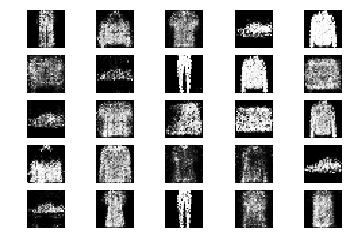

7101 [D loss: 0.665607, acc.: 60.94%] [G loss: 0.896615]
7102 [D loss: 0.670741, acc.: 64.06%] [G loss: 0.889997]
7103 [D loss: 0.702821, acc.: 57.81%] [G loss: 1.002093]
7104 [D loss: 0.599638, acc.: 65.62%] [G loss: 0.894652]
7105 [D loss: 0.652827, acc.: 59.38%] [G loss: 0.859378]
7106 [D loss: 0.579435, acc.: 73.44%] [G loss: 0.942647]
7107 [D loss: 0.625340, acc.: 64.06%] [G loss: 0.840230]
7108 [D loss: 0.619075, acc.: 64.06%] [G loss: 0.980322]
7109 [D loss: 0.699897, acc.: 56.25%] [G loss: 0.916756]
7110 [D loss: 0.656297, acc.: 62.50%] [G loss: 0.943579]
7111 [D loss: 0.652841, acc.: 62.50%] [G loss: 0.929268]
7112 [D loss: 0.631475, acc.: 70.31%] [G loss: 0.833229]
7113 [D loss: 0.721578, acc.: 50.00%] [G loss: 0.909841]
7114 [D loss: 0.539358, acc.: 78.12%] [G loss: 0.939060]
7115 [D loss: 0.603942, acc.: 57.81%] [G loss: 0.954200]
7116 [D loss: 0.715988, acc.: 50.00%] [G loss: 0.950674]
7117 [D loss: 0.660320, acc.: 62.50%] [G loss: 0.936203]
7118 [D loss: 0.715992, acc.: 4

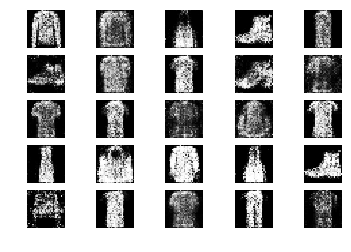

7151 [D loss: 0.698166, acc.: 59.38%] [G loss: 0.853192]
7152 [D loss: 0.614059, acc.: 67.19%] [G loss: 0.900846]
7153 [D loss: 0.699979, acc.: 53.12%] [G loss: 0.860053]
7154 [D loss: 0.658661, acc.: 64.06%] [G loss: 0.836987]
7155 [D loss: 0.699797, acc.: 48.44%] [G loss: 0.905331]
7156 [D loss: 0.658627, acc.: 60.94%] [G loss: 0.902858]
7157 [D loss: 0.696051, acc.: 59.38%] [G loss: 0.985522]
7158 [D loss: 0.680948, acc.: 54.69%] [G loss: 0.962754]
7159 [D loss: 0.696745, acc.: 54.69%] [G loss: 0.917442]
7160 [D loss: 0.626797, acc.: 65.62%] [G loss: 0.884428]
7161 [D loss: 0.696701, acc.: 48.44%] [G loss: 0.901625]
7162 [D loss: 0.646350, acc.: 57.81%] [G loss: 0.956585]
7163 [D loss: 0.662699, acc.: 67.19%] [G loss: 0.907170]
7164 [D loss: 0.694626, acc.: 54.69%] [G loss: 0.919357]
7165 [D loss: 0.632622, acc.: 54.69%] [G loss: 0.897157]
7166 [D loss: 0.691867, acc.: 53.12%] [G loss: 0.893046]
7167 [D loss: 0.694421, acc.: 56.25%] [G loss: 0.882684]
7168 [D loss: 0.661467, acc.: 5

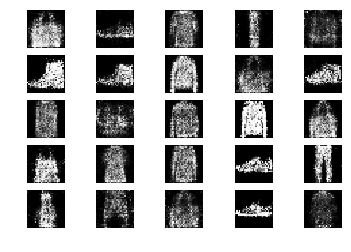

7201 [D loss: 0.603620, acc.: 71.88%] [G loss: 0.994194]
7202 [D loss: 0.598670, acc.: 70.31%] [G loss: 1.055520]
7203 [D loss: 0.640682, acc.: 64.06%] [G loss: 0.995922]
7204 [D loss: 0.682296, acc.: 60.94%] [G loss: 0.871516]
7205 [D loss: 0.632847, acc.: 67.19%] [G loss: 0.845837]
7206 [D loss: 0.616197, acc.: 65.62%] [G loss: 0.879605]
7207 [D loss: 0.583615, acc.: 70.31%] [G loss: 0.920293]
7208 [D loss: 0.623864, acc.: 62.50%] [G loss: 0.928314]
7209 [D loss: 0.634416, acc.: 56.25%] [G loss: 0.947854]
7210 [D loss: 0.641306, acc.: 60.94%] [G loss: 0.895397]
7211 [D loss: 0.598693, acc.: 65.62%] [G loss: 0.966490]
7212 [D loss: 0.651020, acc.: 65.62%] [G loss: 0.902995]
7213 [D loss: 0.645968, acc.: 65.62%] [G loss: 0.938699]
7214 [D loss: 0.699252, acc.: 54.69%] [G loss: 0.862759]
7215 [D loss: 0.560599, acc.: 73.44%] [G loss: 0.963803]
7216 [D loss: 0.618074, acc.: 67.19%] [G loss: 0.959614]
7217 [D loss: 0.687368, acc.: 59.38%] [G loss: 0.975733]
7218 [D loss: 0.677599, acc.: 5

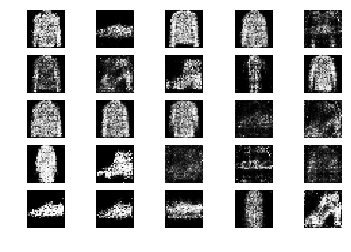

7251 [D loss: 0.640634, acc.: 62.50%] [G loss: 0.917873]
7252 [D loss: 0.600966, acc.: 67.19%] [G loss: 0.931768]
7253 [D loss: 0.652910, acc.: 57.81%] [G loss: 0.991145]
7254 [D loss: 0.732632, acc.: 56.25%] [G loss: 0.972020]
7255 [D loss: 0.620167, acc.: 64.06%] [G loss: 0.855952]
7256 [D loss: 0.602971, acc.: 70.31%] [G loss: 0.997699]
7257 [D loss: 0.659937, acc.: 59.38%] [G loss: 0.952250]
7258 [D loss: 0.596412, acc.: 75.00%] [G loss: 0.870750]
7259 [D loss: 0.666013, acc.: 62.50%] [G loss: 0.893350]
7260 [D loss: 0.639326, acc.: 62.50%] [G loss: 0.944351]
7261 [D loss: 0.718261, acc.: 50.00%] [G loss: 1.036924]
7262 [D loss: 0.639768, acc.: 62.50%] [G loss: 1.022007]
7263 [D loss: 0.626521, acc.: 67.19%] [G loss: 0.916820]
7264 [D loss: 0.619377, acc.: 65.62%] [G loss: 0.895854]
7265 [D loss: 0.604735, acc.: 76.56%] [G loss: 0.867103]
7266 [D loss: 0.631480, acc.: 62.50%] [G loss: 0.912567]
7267 [D loss: 0.680423, acc.: 54.69%] [G loss: 0.928381]
7268 [D loss: 0.723849, acc.: 5

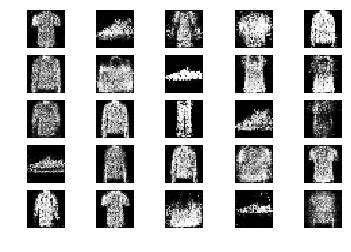

7301 [D loss: 0.662571, acc.: 64.06%] [G loss: 0.873571]
7302 [D loss: 0.696004, acc.: 59.38%] [G loss: 0.821474]
7303 [D loss: 0.646242, acc.: 59.38%] [G loss: 0.946296]
7304 [D loss: 0.591977, acc.: 70.31%] [G loss: 0.932689]
7305 [D loss: 0.610209, acc.: 71.88%] [G loss: 0.874451]
7306 [D loss: 0.648355, acc.: 59.38%] [G loss: 0.863019]
7307 [D loss: 0.660448, acc.: 56.25%] [G loss: 0.947070]
7308 [D loss: 0.676418, acc.: 64.06%] [G loss: 0.999520]
7309 [D loss: 0.683273, acc.: 62.50%] [G loss: 0.915094]
7310 [D loss: 0.643410, acc.: 64.06%] [G loss: 0.832007]
7311 [D loss: 0.599509, acc.: 76.56%] [G loss: 0.825145]
7312 [D loss: 0.661847, acc.: 62.50%] [G loss: 0.955507]
7313 [D loss: 0.717903, acc.: 53.12%] [G loss: 0.988543]
7314 [D loss: 0.600597, acc.: 71.88%] [G loss: 0.915356]
7315 [D loss: 0.656662, acc.: 60.94%] [G loss: 0.920088]
7316 [D loss: 0.686451, acc.: 51.56%] [G loss: 0.937331]
7317 [D loss: 0.668551, acc.: 60.94%] [G loss: 0.933558]
7318 [D loss: 0.662717, acc.: 6

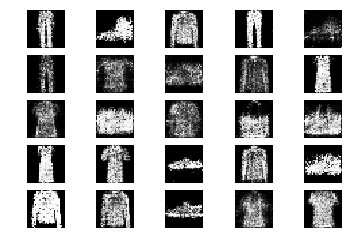

7351 [D loss: 0.716098, acc.: 50.00%] [G loss: 0.921882]
7352 [D loss: 0.640443, acc.: 70.31%] [G loss: 1.015756]
7353 [D loss: 0.637430, acc.: 68.75%] [G loss: 0.877401]
7354 [D loss: 0.594422, acc.: 70.31%] [G loss: 0.952701]
7355 [D loss: 0.710037, acc.: 54.69%] [G loss: 0.971056]
7356 [D loss: 0.627760, acc.: 57.81%] [G loss: 0.967587]
7357 [D loss: 0.696985, acc.: 51.56%] [G loss: 0.851944]
7358 [D loss: 0.669025, acc.: 59.38%] [G loss: 0.911725]
7359 [D loss: 0.639372, acc.: 62.50%] [G loss: 0.774448]
7360 [D loss: 0.619506, acc.: 65.62%] [G loss: 0.896806]
7361 [D loss: 0.627453, acc.: 60.94%] [G loss: 0.846434]
7362 [D loss: 0.611486, acc.: 60.94%] [G loss: 0.798913]
7363 [D loss: 0.642842, acc.: 62.50%] [G loss: 0.912937]
7364 [D loss: 0.722104, acc.: 57.81%] [G loss: 0.962368]
7365 [D loss: 0.645218, acc.: 65.62%] [G loss: 0.958797]
7366 [D loss: 0.563567, acc.: 68.75%] [G loss: 0.996638]
7367 [D loss: 0.687501, acc.: 60.94%] [G loss: 0.877716]
7368 [D loss: 0.665262, acc.: 5

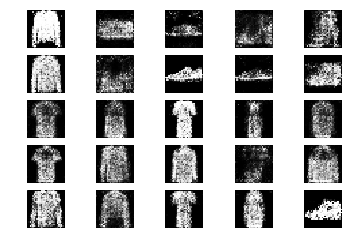

7401 [D loss: 0.688890, acc.: 59.38%] [G loss: 0.913906]
7402 [D loss: 0.622089, acc.: 76.56%] [G loss: 0.896087]
7403 [D loss: 0.589861, acc.: 75.00%] [G loss: 0.924314]
7404 [D loss: 0.699932, acc.: 54.69%] [G loss: 0.870654]
7405 [D loss: 0.628301, acc.: 67.19%] [G loss: 0.809139]
7406 [D loss: 0.613504, acc.: 65.62%] [G loss: 0.795889]
7407 [D loss: 0.666002, acc.: 57.81%] [G loss: 0.832778]
7408 [D loss: 0.661145, acc.: 65.62%] [G loss: 0.844800]
7409 [D loss: 0.648240, acc.: 68.75%] [G loss: 0.896544]
7410 [D loss: 0.598552, acc.: 65.62%] [G loss: 0.851518]
7411 [D loss: 0.655650, acc.: 57.81%] [G loss: 0.892313]
7412 [D loss: 0.626473, acc.: 60.94%] [G loss: 0.887992]
7413 [D loss: 0.686309, acc.: 56.25%] [G loss: 0.950280]
7414 [D loss: 0.671225, acc.: 62.50%] [G loss: 0.961923]
7415 [D loss: 0.634041, acc.: 60.94%] [G loss: 0.901238]
7416 [D loss: 0.628055, acc.: 73.44%] [G loss: 0.902200]
7417 [D loss: 0.620434, acc.: 60.94%] [G loss: 0.931930]
7418 [D loss: 0.696501, acc.: 6

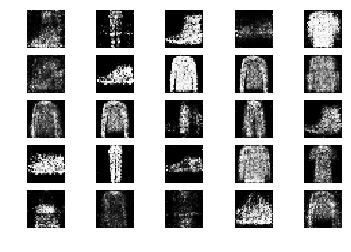

7451 [D loss: 0.611806, acc.: 70.31%] [G loss: 0.991250]
7452 [D loss: 0.633404, acc.: 68.75%] [G loss: 0.862454]
7453 [D loss: 0.719718, acc.: 54.69%] [G loss: 0.875925]
7454 [D loss: 0.637921, acc.: 71.88%] [G loss: 0.890810]
7455 [D loss: 0.642981, acc.: 65.62%] [G loss: 0.932942]
7456 [D loss: 0.603913, acc.: 70.31%] [G loss: 0.905263]
7457 [D loss: 0.655509, acc.: 54.69%] [G loss: 0.854198]
7458 [D loss: 0.689210, acc.: 59.38%] [G loss: 0.860419]
7459 [D loss: 0.681734, acc.: 60.94%] [G loss: 0.852843]
7460 [D loss: 0.680538, acc.: 54.69%] [G loss: 0.945709]
7461 [D loss: 0.657438, acc.: 60.94%] [G loss: 0.879779]
7462 [D loss: 0.604823, acc.: 64.06%] [G loss: 0.941018]
7463 [D loss: 0.656391, acc.: 62.50%] [G loss: 1.056358]
7464 [D loss: 0.664825, acc.: 60.94%] [G loss: 0.940180]
7465 [D loss: 0.626793, acc.: 64.06%] [G loss: 0.901598]
7466 [D loss: 0.669313, acc.: 54.69%] [G loss: 1.004087]
7467 [D loss: 0.696600, acc.: 59.38%] [G loss: 0.910125]
7468 [D loss: 0.699502, acc.: 5

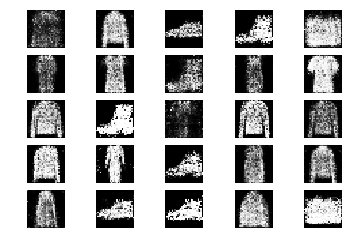

7501 [D loss: 0.674500, acc.: 57.81%] [G loss: 0.933088]
7502 [D loss: 0.689951, acc.: 50.00%] [G loss: 0.983158]
7503 [D loss: 0.656556, acc.: 56.25%] [G loss: 1.032989]
7504 [D loss: 0.656226, acc.: 59.38%] [G loss: 0.986648]
7505 [D loss: 0.685313, acc.: 57.81%] [G loss: 0.920900]
7506 [D loss: 0.675050, acc.: 59.38%] [G loss: 0.958965]
7507 [D loss: 0.675025, acc.: 64.06%] [G loss: 0.918112]
7508 [D loss: 0.693722, acc.: 60.94%] [G loss: 0.958749]
7509 [D loss: 0.656298, acc.: 57.81%] [G loss: 0.979031]
7510 [D loss: 0.685206, acc.: 60.94%] [G loss: 0.967659]
7511 [D loss: 0.677649, acc.: 62.50%] [G loss: 0.998750]
7512 [D loss: 0.644049, acc.: 60.94%] [G loss: 1.018025]
7513 [D loss: 0.694977, acc.: 42.19%] [G loss: 0.851839]
7514 [D loss: 0.612549, acc.: 67.19%] [G loss: 0.897477]
7515 [D loss: 0.602265, acc.: 65.62%] [G loss: 0.913749]
7516 [D loss: 0.669586, acc.: 57.81%] [G loss: 0.953239]
7517 [D loss: 0.653083, acc.: 60.94%] [G loss: 0.999219]
7518 [D loss: 0.732620, acc.: 5

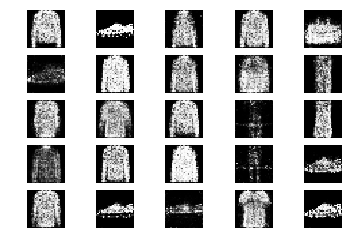

7551 [D loss: 0.685997, acc.: 54.69%] [G loss: 0.954089]
7552 [D loss: 0.694586, acc.: 56.25%] [G loss: 1.009070]
7553 [D loss: 0.704106, acc.: 60.94%] [G loss: 0.893538]
7554 [D loss: 0.672307, acc.: 60.94%] [G loss: 0.924592]
7555 [D loss: 0.677753, acc.: 54.69%] [G loss: 0.855790]
7556 [D loss: 0.665120, acc.: 60.94%] [G loss: 0.893643]
7557 [D loss: 0.596556, acc.: 62.50%] [G loss: 0.917334]
7558 [D loss: 0.620968, acc.: 60.94%] [G loss: 0.885239]
7559 [D loss: 0.713090, acc.: 51.56%] [G loss: 0.926247]
7560 [D loss: 0.656835, acc.: 57.81%] [G loss: 0.828130]
7561 [D loss: 0.662998, acc.: 59.38%] [G loss: 0.874631]
7562 [D loss: 0.672001, acc.: 59.38%] [G loss: 0.848300]
7563 [D loss: 0.667838, acc.: 56.25%] [G loss: 0.857564]
7564 [D loss: 0.605185, acc.: 62.50%] [G loss: 0.912598]
7565 [D loss: 0.643946, acc.: 59.38%] [G loss: 0.964798]
7566 [D loss: 0.640052, acc.: 64.06%] [G loss: 0.947047]
7567 [D loss: 0.628796, acc.: 70.31%] [G loss: 0.965547]
7568 [D loss: 0.686059, acc.: 5

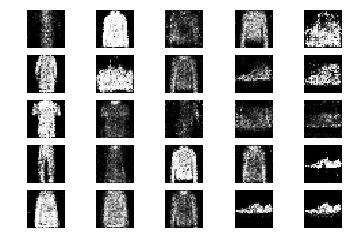

7601 [D loss: 0.635493, acc.: 68.75%] [G loss: 0.847729]
7602 [D loss: 0.639360, acc.: 64.06%] [G loss: 0.850143]
7603 [D loss: 0.614462, acc.: 64.06%] [G loss: 0.845197]
7604 [D loss: 0.616968, acc.: 71.88%] [G loss: 0.857292]
7605 [D loss: 0.693203, acc.: 56.25%] [G loss: 0.841675]
7606 [D loss: 0.611795, acc.: 67.19%] [G loss: 0.978905]
7607 [D loss: 0.714522, acc.: 51.56%] [G loss: 0.944225]
7608 [D loss: 0.645144, acc.: 65.62%] [G loss: 0.982068]
7609 [D loss: 0.647482, acc.: 59.38%] [G loss: 0.973184]
7610 [D loss: 0.666962, acc.: 54.69%] [G loss: 0.942450]
7611 [D loss: 0.699737, acc.: 54.69%] [G loss: 0.943886]
7612 [D loss: 0.692070, acc.: 56.25%] [G loss: 0.948241]
7613 [D loss: 0.658655, acc.: 54.69%] [G loss: 0.872114]
7614 [D loss: 0.642192, acc.: 59.38%] [G loss: 0.852373]
7615 [D loss: 0.639058, acc.: 68.75%] [G loss: 0.883423]
7616 [D loss: 0.672425, acc.: 53.12%] [G loss: 0.841792]
7617 [D loss: 0.637593, acc.: 60.94%] [G loss: 0.915775]
7618 [D loss: 0.710083, acc.: 5

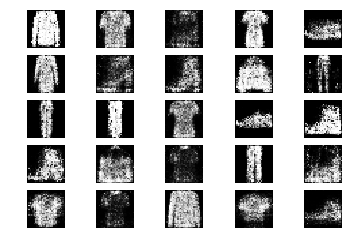

7651 [D loss: 0.691832, acc.: 51.56%] [G loss: 0.901629]
7652 [D loss: 0.685247, acc.: 54.69%] [G loss: 0.929721]
7653 [D loss: 0.670829, acc.: 54.69%] [G loss: 0.792111]
7654 [D loss: 0.656377, acc.: 56.25%] [G loss: 0.795822]
7655 [D loss: 0.614842, acc.: 62.50%] [G loss: 0.832067]
7656 [D loss: 0.623505, acc.: 67.19%] [G loss: 0.813939]
7657 [D loss: 0.690139, acc.: 56.25%] [G loss: 0.931186]
7658 [D loss: 0.664057, acc.: 57.81%] [G loss: 0.903893]
7659 [D loss: 0.702569, acc.: 54.69%] [G loss: 0.956723]
7660 [D loss: 0.711551, acc.: 51.56%] [G loss: 0.904452]
7661 [D loss: 0.660814, acc.: 57.81%] [G loss: 0.938244]
7662 [D loss: 0.651424, acc.: 64.06%] [G loss: 0.941473]
7663 [D loss: 0.623289, acc.: 64.06%] [G loss: 0.979694]
7664 [D loss: 0.707886, acc.: 51.56%] [G loss: 0.890751]
7665 [D loss: 0.590013, acc.: 75.00%] [G loss: 0.850379]
7666 [D loss: 0.744449, acc.: 50.00%] [G loss: 0.788792]
7667 [D loss: 0.611650, acc.: 68.75%] [G loss: 0.820665]
7668 [D loss: 0.614195, acc.: 6

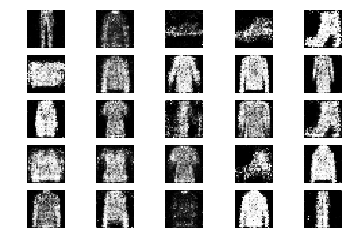

7701 [D loss: 0.642025, acc.: 64.06%] [G loss: 0.850145]
7702 [D loss: 0.631678, acc.: 59.38%] [G loss: 0.864139]
7703 [D loss: 0.650305, acc.: 70.31%] [G loss: 0.942677]
7704 [D loss: 0.742272, acc.: 43.75%] [G loss: 1.000129]
7705 [D loss: 0.636246, acc.: 70.31%] [G loss: 0.859555]
7706 [D loss: 0.661655, acc.: 59.38%] [G loss: 0.857475]
7707 [D loss: 0.695154, acc.: 50.00%] [G loss: 0.837735]
7708 [D loss: 0.573305, acc.: 70.31%] [G loss: 0.924326]
7709 [D loss: 0.612564, acc.: 68.75%] [G loss: 0.962073]
7710 [D loss: 0.658940, acc.: 59.38%] [G loss: 0.912167]
7711 [D loss: 0.583824, acc.: 67.19%] [G loss: 0.970884]
7712 [D loss: 0.688328, acc.: 57.81%] [G loss: 0.962306]
7713 [D loss: 0.650426, acc.: 64.06%] [G loss: 1.020794]
7714 [D loss: 0.634715, acc.: 64.06%] [G loss: 0.884063]
7715 [D loss: 0.683029, acc.: 60.94%] [G loss: 0.888941]
7716 [D loss: 0.616579, acc.: 67.19%] [G loss: 0.833037]
7717 [D loss: 0.655815, acc.: 59.38%] [G loss: 0.894950]
7718 [D loss: 0.656051, acc.: 6

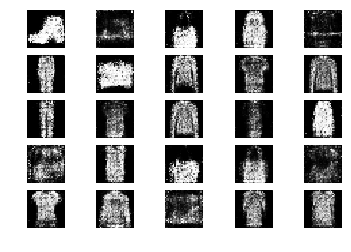

7751 [D loss: 0.635918, acc.: 59.38%] [G loss: 0.899841]
7752 [D loss: 0.662383, acc.: 64.06%] [G loss: 0.927750]
7753 [D loss: 0.681749, acc.: 60.94%] [G loss: 0.954163]
7754 [D loss: 0.624025, acc.: 65.62%] [G loss: 0.912454]
7755 [D loss: 0.738933, acc.: 53.12%] [G loss: 0.939658]
7756 [D loss: 0.679508, acc.: 59.38%] [G loss: 0.959011]
7757 [D loss: 0.693093, acc.: 54.69%] [G loss: 0.811280]
7758 [D loss: 0.628637, acc.: 68.75%] [G loss: 0.898636]
7759 [D loss: 0.644703, acc.: 62.50%] [G loss: 0.868043]
7760 [D loss: 0.674693, acc.: 65.62%] [G loss: 0.854075]
7761 [D loss: 0.689992, acc.: 53.12%] [G loss: 0.873645]
7762 [D loss: 0.617128, acc.: 65.62%] [G loss: 0.880433]
7763 [D loss: 0.574621, acc.: 68.75%] [G loss: 0.991623]
7764 [D loss: 0.637890, acc.: 62.50%] [G loss: 0.916515]
7765 [D loss: 0.679794, acc.: 56.25%] [G loss: 0.967514]
7766 [D loss: 0.703619, acc.: 56.25%] [G loss: 0.937569]
7767 [D loss: 0.623437, acc.: 67.19%] [G loss: 0.883241]
7768 [D loss: 0.667780, acc.: 5

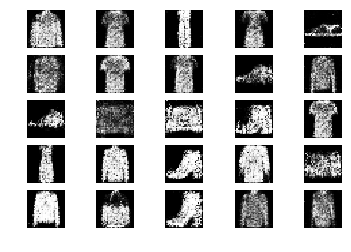

7801 [D loss: 0.690938, acc.: 60.94%] [G loss: 0.903580]
7802 [D loss: 0.669757, acc.: 62.50%] [G loss: 0.884981]
7803 [D loss: 0.643508, acc.: 68.75%] [G loss: 0.956662]
7804 [D loss: 0.682285, acc.: 54.69%] [G loss: 0.910232]
7805 [D loss: 0.691177, acc.: 57.81%] [G loss: 0.959233]
7806 [D loss: 0.638458, acc.: 57.81%] [G loss: 0.971884]
7807 [D loss: 0.670096, acc.: 57.81%] [G loss: 0.856567]
7808 [D loss: 0.693174, acc.: 68.75%] [G loss: 0.867598]
7809 [D loss: 0.654909, acc.: 57.81%] [G loss: 0.824212]
7810 [D loss: 0.719416, acc.: 48.44%] [G loss: 0.864233]
7811 [D loss: 0.677344, acc.: 53.12%] [G loss: 0.924577]
7812 [D loss: 0.594902, acc.: 70.31%] [G loss: 0.907439]
7813 [D loss: 0.640487, acc.: 64.06%] [G loss: 0.961215]
7814 [D loss: 0.608504, acc.: 65.62%] [G loss: 1.018804]
7815 [D loss: 0.657483, acc.: 62.50%] [G loss: 0.968433]
7816 [D loss: 0.638838, acc.: 65.62%] [G loss: 0.899843]
7817 [D loss: 0.692709, acc.: 59.38%] [G loss: 0.916305]
7818 [D loss: 0.638447, acc.: 6

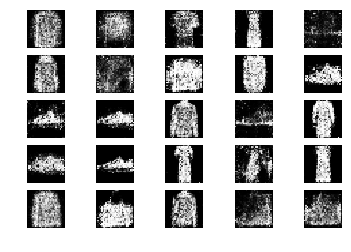

7851 [D loss: 0.744463, acc.: 51.56%] [G loss: 0.933942]
7852 [D loss: 0.654702, acc.: 64.06%] [G loss: 1.042907]
7853 [D loss: 0.621864, acc.: 73.44%] [G loss: 1.020908]
7854 [D loss: 0.683793, acc.: 60.94%] [G loss: 0.905933]
7855 [D loss: 0.684845, acc.: 54.69%] [G loss: 0.901255]
7856 [D loss: 0.653418, acc.: 65.62%] [G loss: 0.806922]
7857 [D loss: 0.584813, acc.: 73.44%] [G loss: 0.889804]
7858 [D loss: 0.656474, acc.: 60.94%] [G loss: 0.829706]
7859 [D loss: 0.723399, acc.: 50.00%] [G loss: 0.851168]
7860 [D loss: 0.599560, acc.: 70.31%] [G loss: 0.961465]
7861 [D loss: 0.724942, acc.: 60.94%] [G loss: 0.925468]
7862 [D loss: 0.654780, acc.: 57.81%] [G loss: 0.995615]
7863 [D loss: 0.632890, acc.: 62.50%] [G loss: 0.918345]
7864 [D loss: 0.698844, acc.: 54.69%] [G loss: 0.887524]
7865 [D loss: 0.662076, acc.: 56.25%] [G loss: 0.890874]
7866 [D loss: 0.633572, acc.: 67.19%] [G loss: 0.950092]
7867 [D loss: 0.666907, acc.: 54.69%] [G loss: 0.901678]
7868 [D loss: 0.613582, acc.: 6

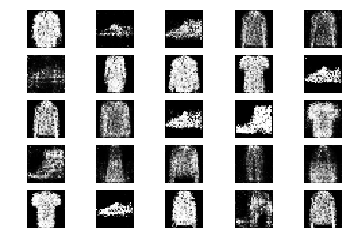

7901 [D loss: 0.696663, acc.: 57.81%] [G loss: 0.997319]
7902 [D loss: 0.680895, acc.: 62.50%] [G loss: 0.932735]
7903 [D loss: 0.634207, acc.: 64.06%] [G loss: 0.893632]
7904 [D loss: 0.677309, acc.: 57.81%] [G loss: 0.999876]
7905 [D loss: 0.646065, acc.: 60.94%] [G loss: 0.935389]
7906 [D loss: 0.648106, acc.: 62.50%] [G loss: 0.930943]
7907 [D loss: 0.692690, acc.: 59.38%] [G loss: 0.934502]
7908 [D loss: 0.689335, acc.: 54.69%] [G loss: 0.942519]
7909 [D loss: 0.618074, acc.: 60.94%] [G loss: 1.013091]
7910 [D loss: 0.724509, acc.: 56.25%] [G loss: 0.844038]
7911 [D loss: 0.639449, acc.: 64.06%] [G loss: 0.902302]
7912 [D loss: 0.677602, acc.: 70.31%] [G loss: 0.841087]
7913 [D loss: 0.631417, acc.: 65.62%] [G loss: 0.974820]
7914 [D loss: 0.685446, acc.: 60.94%] [G loss: 0.917272]
7915 [D loss: 0.626829, acc.: 60.94%] [G loss: 0.840338]
7916 [D loss: 0.635929, acc.: 64.06%] [G loss: 0.782403]
7917 [D loss: 0.689932, acc.: 57.81%] [G loss: 0.813076]
7918 [D loss: 0.643910, acc.: 6

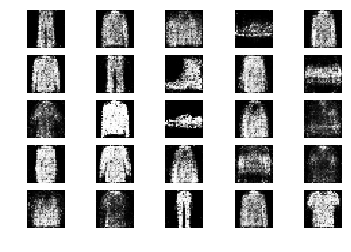

7951 [D loss: 0.614999, acc.: 67.19%] [G loss: 0.909580]
7952 [D loss: 0.658261, acc.: 56.25%] [G loss: 0.991481]
7953 [D loss: 0.619803, acc.: 67.19%] [G loss: 0.921965]
7954 [D loss: 0.635362, acc.: 53.12%] [G loss: 0.940605]
7955 [D loss: 0.578111, acc.: 68.75%] [G loss: 0.889176]
7956 [D loss: 0.519108, acc.: 79.69%] [G loss: 0.952163]
7957 [D loss: 0.660515, acc.: 65.62%] [G loss: 0.896869]
7958 [D loss: 0.630893, acc.: 67.19%] [G loss: 0.999374]
7959 [D loss: 0.618791, acc.: 64.06%] [G loss: 0.966940]
7960 [D loss: 0.648271, acc.: 62.50%] [G loss: 0.962482]
7961 [D loss: 0.707514, acc.: 53.12%] [G loss: 0.875734]
7962 [D loss: 0.603569, acc.: 62.50%] [G loss: 0.949984]
7963 [D loss: 0.620973, acc.: 59.38%] [G loss: 0.945365]
7964 [D loss: 0.639151, acc.: 67.19%] [G loss: 0.884920]
7965 [D loss: 0.641176, acc.: 59.38%] [G loss: 0.808486]
7966 [D loss: 0.679898, acc.: 59.38%] [G loss: 0.816385]
7967 [D loss: 0.709399, acc.: 53.12%] [G loss: 0.936657]
7968 [D loss: 0.648962, acc.: 6

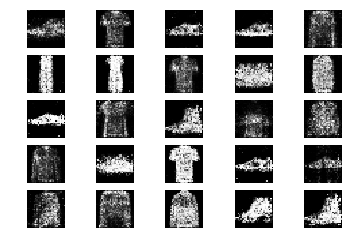

8001 [D loss: 0.638341, acc.: 64.06%] [G loss: 0.860216]
8002 [D loss: 0.600440, acc.: 64.06%] [G loss: 0.971048]
8003 [D loss: 0.654434, acc.: 59.38%] [G loss: 0.917116]
8004 [D loss: 0.658947, acc.: 54.69%] [G loss: 0.897756]
8005 [D loss: 0.662593, acc.: 59.38%] [G loss: 0.897458]
8006 [D loss: 0.669035, acc.: 59.38%] [G loss: 0.877900]
8007 [D loss: 0.636397, acc.: 62.50%] [G loss: 0.838864]
8008 [D loss: 0.639579, acc.: 59.38%] [G loss: 0.835829]
8009 [D loss: 0.673149, acc.: 59.38%] [G loss: 0.874851]
8010 [D loss: 0.618407, acc.: 67.19%] [G loss: 0.961787]
8011 [D loss: 0.652831, acc.: 60.94%] [G loss: 0.876114]
8012 [D loss: 0.660272, acc.: 62.50%] [G loss: 0.954105]
8013 [D loss: 0.721577, acc.: 42.19%] [G loss: 0.852144]
8014 [D loss: 0.680575, acc.: 56.25%] [G loss: 0.815728]
8015 [D loss: 0.695222, acc.: 46.88%] [G loss: 0.892793]
8016 [D loss: 0.664878, acc.: 64.06%] [G loss: 0.879635]
8017 [D loss: 0.591205, acc.: 73.44%] [G loss: 0.886586]
8018 [D loss: 0.666433, acc.: 5

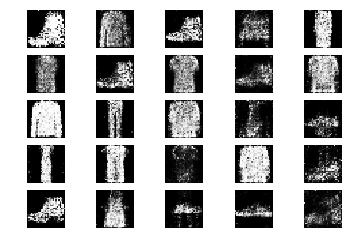

8051 [D loss: 0.616780, acc.: 64.06%] [G loss: 0.961386]
8052 [D loss: 0.697110, acc.: 56.25%] [G loss: 0.931587]
8053 [D loss: 0.605308, acc.: 68.75%] [G loss: 0.901602]
8054 [D loss: 0.699996, acc.: 64.06%] [G loss: 0.895789]
8055 [D loss: 0.622383, acc.: 70.31%] [G loss: 0.944671]
8056 [D loss: 0.694964, acc.: 51.56%] [G loss: 0.894189]
8057 [D loss: 0.680642, acc.: 54.69%] [G loss: 0.860204]
8058 [D loss: 0.621997, acc.: 67.19%] [G loss: 0.903132]
8059 [D loss: 0.660516, acc.: 62.50%] [G loss: 0.885903]
8060 [D loss: 0.624830, acc.: 64.06%] [G loss: 0.851555]
8061 [D loss: 0.597829, acc.: 67.19%] [G loss: 0.888984]
8062 [D loss: 0.650404, acc.: 67.19%] [G loss: 0.852683]
8063 [D loss: 0.609380, acc.: 70.31%] [G loss: 1.017823]
8064 [D loss: 0.642691, acc.: 60.94%] [G loss: 0.891301]
8065 [D loss: 0.643984, acc.: 57.81%] [G loss: 0.945623]
8066 [D loss: 0.648124, acc.: 62.50%] [G loss: 0.970105]
8067 [D loss: 0.623165, acc.: 65.62%] [G loss: 0.865505]
8068 [D loss: 0.587828, acc.: 7

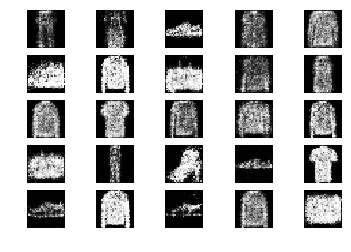

8101 [D loss: 0.607858, acc.: 71.88%] [G loss: 0.817303]
8102 [D loss: 0.666551, acc.: 65.62%] [G loss: 0.832064]
8103 [D loss: 0.596817, acc.: 78.12%] [G loss: 0.927589]
8104 [D loss: 0.728464, acc.: 50.00%] [G loss: 0.861358]
8105 [D loss: 0.637861, acc.: 62.50%] [G loss: 0.842063]
8106 [D loss: 0.634039, acc.: 57.81%] [G loss: 0.922330]
8107 [D loss: 0.603582, acc.: 71.88%] [G loss: 0.896941]
8108 [D loss: 0.667181, acc.: 57.81%] [G loss: 0.861261]
8109 [D loss: 0.620892, acc.: 62.50%] [G loss: 0.892043]
8110 [D loss: 0.654531, acc.: 60.94%] [G loss: 0.821284]
8111 [D loss: 0.661871, acc.: 59.38%] [G loss: 0.915441]
8112 [D loss: 0.582378, acc.: 73.44%] [G loss: 0.991293]
8113 [D loss: 0.674264, acc.: 57.81%] [G loss: 0.952151]
8114 [D loss: 0.633313, acc.: 68.75%] [G loss: 0.885057]
8115 [D loss: 0.737019, acc.: 50.00%] [G loss: 0.903530]
8116 [D loss: 0.668952, acc.: 59.38%] [G loss: 0.869865]
8117 [D loss: 0.618330, acc.: 62.50%] [G loss: 0.919436]
8118 [D loss: 0.695287, acc.: 4

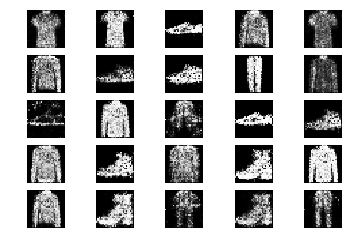

8151 [D loss: 0.630424, acc.: 62.50%] [G loss: 0.991685]
8152 [D loss: 0.626168, acc.: 59.38%] [G loss: 0.989380]
8153 [D loss: 0.657127, acc.: 64.06%] [G loss: 1.026595]
8154 [D loss: 0.686986, acc.: 67.19%] [G loss: 0.937986]
8155 [D loss: 0.658663, acc.: 51.56%] [G loss: 0.946683]
8156 [D loss: 0.661837, acc.: 57.81%] [G loss: 0.837328]
8157 [D loss: 0.657081, acc.: 65.62%] [G loss: 0.989280]
8158 [D loss: 0.607140, acc.: 67.19%] [G loss: 0.930255]
8159 [D loss: 0.710362, acc.: 53.12%] [G loss: 0.902498]
8160 [D loss: 0.654103, acc.: 64.06%] [G loss: 0.954654]
8161 [D loss: 0.647547, acc.: 64.06%] [G loss: 1.039248]
8162 [D loss: 0.726002, acc.: 48.44%] [G loss: 0.899627]
8163 [D loss: 0.678854, acc.: 59.38%] [G loss: 0.960536]
8164 [D loss: 0.647151, acc.: 64.06%] [G loss: 0.932434]
8165 [D loss: 0.655074, acc.: 62.50%] [G loss: 0.980387]
8166 [D loss: 0.688795, acc.: 53.12%] [G loss: 0.865839]
8167 [D loss: 0.638266, acc.: 62.50%] [G loss: 0.906546]
8168 [D loss: 0.720401, acc.: 5

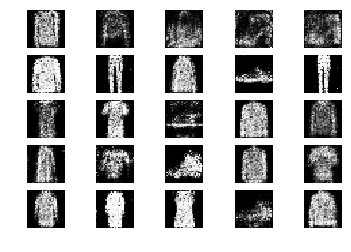

8201 [D loss: 0.604932, acc.: 75.00%] [G loss: 0.841524]
8202 [D loss: 0.660397, acc.: 54.69%] [G loss: 0.978378]
8203 [D loss: 0.654796, acc.: 59.38%] [G loss: 0.910461]
8204 [D loss: 0.625318, acc.: 64.06%] [G loss: 0.951323]
8205 [D loss: 0.648404, acc.: 60.94%] [G loss: 1.008168]
8206 [D loss: 0.614399, acc.: 59.38%] [G loss: 0.842612]
8207 [D loss: 0.663699, acc.: 64.06%] [G loss: 0.922502]
8208 [D loss: 0.612895, acc.: 68.75%] [G loss: 0.952035]
8209 [D loss: 0.698318, acc.: 51.56%] [G loss: 0.887927]
8210 [D loss: 0.678247, acc.: 54.69%] [G loss: 0.825608]
8211 [D loss: 0.692355, acc.: 54.69%] [G loss: 0.858098]
8212 [D loss: 0.620069, acc.: 67.19%] [G loss: 0.885625]
8213 [D loss: 0.650315, acc.: 56.25%] [G loss: 0.888349]
8214 [D loss: 0.651848, acc.: 56.25%] [G loss: 0.860052]
8215 [D loss: 0.712291, acc.: 45.31%] [G loss: 0.881411]
8216 [D loss: 0.697316, acc.: 56.25%] [G loss: 0.900233]
8217 [D loss: 0.608108, acc.: 70.31%] [G loss: 0.944838]
8218 [D loss: 0.696413, acc.: 5

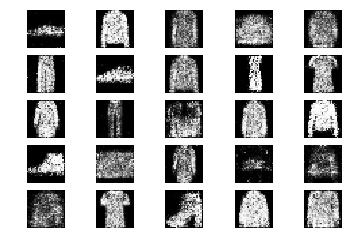

8251 [D loss: 0.649560, acc.: 67.19%] [G loss: 0.846880]
8252 [D loss: 0.643315, acc.: 68.75%] [G loss: 0.878698]
8253 [D loss: 0.654395, acc.: 64.06%] [G loss: 0.940653]
8254 [D loss: 0.620139, acc.: 68.75%] [G loss: 0.798975]
8255 [D loss: 0.674094, acc.: 60.94%] [G loss: 0.944377]
8256 [D loss: 0.715672, acc.: 54.69%] [G loss: 0.898749]
8257 [D loss: 0.634757, acc.: 65.62%] [G loss: 0.885811]
8258 [D loss: 0.606553, acc.: 68.75%] [G loss: 0.866416]
8259 [D loss: 0.700345, acc.: 51.56%] [G loss: 0.881600]
8260 [D loss: 0.627410, acc.: 65.62%] [G loss: 0.908365]
8261 [D loss: 0.685026, acc.: 48.44%] [G loss: 0.854885]
8262 [D loss: 0.607142, acc.: 67.19%] [G loss: 0.935707]
8263 [D loss: 0.684867, acc.: 64.06%] [G loss: 0.855819]
8264 [D loss: 0.735092, acc.: 51.56%] [G loss: 0.883129]
8265 [D loss: 0.656646, acc.: 60.94%] [G loss: 0.713433]
8266 [D loss: 0.678590, acc.: 54.69%] [G loss: 0.882056]
8267 [D loss: 0.602787, acc.: 64.06%] [G loss: 0.904226]
8268 [D loss: 0.668678, acc.: 5

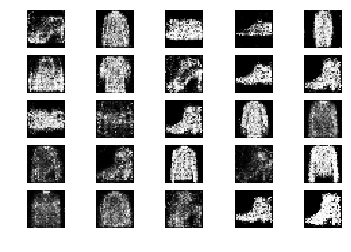

8301 [D loss: 0.679765, acc.: 56.25%] [G loss: 0.924880]
8302 [D loss: 0.706095, acc.: 57.81%] [G loss: 0.885573]
8303 [D loss: 0.708337, acc.: 56.25%] [G loss: 0.906707]
8304 [D loss: 0.646052, acc.: 67.19%] [G loss: 0.849763]
8305 [D loss: 0.643023, acc.: 64.06%] [G loss: 0.839742]
8306 [D loss: 0.673907, acc.: 62.50%] [G loss: 0.886863]
8307 [D loss: 0.689907, acc.: 53.12%] [G loss: 0.889147]
8308 [D loss: 0.710030, acc.: 51.56%] [G loss: 0.980382]
8309 [D loss: 0.625981, acc.: 56.25%] [G loss: 0.920142]
8310 [D loss: 0.667682, acc.: 59.38%] [G loss: 0.851938]
8311 [D loss: 0.652360, acc.: 62.50%] [G loss: 0.832659]
8312 [D loss: 0.631056, acc.: 60.94%] [G loss: 0.836124]
8313 [D loss: 0.658037, acc.: 57.81%] [G loss: 0.907831]
8314 [D loss: 0.650846, acc.: 62.50%] [G loss: 0.865270]
8315 [D loss: 0.663360, acc.: 57.81%] [G loss: 0.872160]
8316 [D loss: 0.652118, acc.: 60.94%] [G loss: 0.900949]
8317 [D loss: 0.673165, acc.: 60.94%] [G loss: 0.928533]
8318 [D loss: 0.618920, acc.: 6

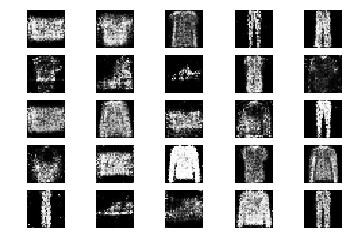

8351 [D loss: 0.692355, acc.: 54.69%] [G loss: 0.886091]
8352 [D loss: 0.587807, acc.: 71.88%] [G loss: 0.954043]
8353 [D loss: 0.650268, acc.: 60.94%] [G loss: 0.821856]
8354 [D loss: 0.710200, acc.: 51.56%] [G loss: 0.828816]
8355 [D loss: 0.702666, acc.: 50.00%] [G loss: 0.889656]
8356 [D loss: 0.638960, acc.: 70.31%] [G loss: 0.767679]
8357 [D loss: 0.629207, acc.: 64.06%] [G loss: 0.841691]
8358 [D loss: 0.553858, acc.: 78.12%] [G loss: 0.884546]
8359 [D loss: 0.672622, acc.: 64.06%] [G loss: 0.865813]
8360 [D loss: 0.746650, acc.: 46.88%] [G loss: 0.856381]
8361 [D loss: 0.649378, acc.: 59.38%] [G loss: 0.996559]
8362 [D loss: 0.629612, acc.: 62.50%] [G loss: 0.919756]
8363 [D loss: 0.691871, acc.: 67.19%] [G loss: 0.877140]
8364 [D loss: 0.622421, acc.: 65.62%] [G loss: 0.838991]
8365 [D loss: 0.689567, acc.: 54.69%] [G loss: 0.895994]
8366 [D loss: 0.689873, acc.: 50.00%] [G loss: 0.963569]
8367 [D loss: 0.654197, acc.: 59.38%] [G loss: 0.922899]
8368 [D loss: 0.665882, acc.: 6

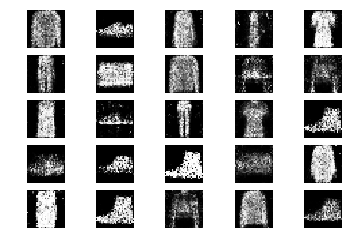

8401 [D loss: 0.677780, acc.: 56.25%] [G loss: 0.885674]
8402 [D loss: 0.687403, acc.: 60.94%] [G loss: 0.917259]
8403 [D loss: 0.621207, acc.: 62.50%] [G loss: 0.976791]
8404 [D loss: 0.640975, acc.: 65.62%] [G loss: 0.917390]
8405 [D loss: 0.648017, acc.: 64.06%] [G loss: 0.884906]
8406 [D loss: 0.625178, acc.: 71.88%] [G loss: 0.847497]
8407 [D loss: 0.697211, acc.: 56.25%] [G loss: 0.927384]
8408 [D loss: 0.658886, acc.: 56.25%] [G loss: 0.960823]
8409 [D loss: 0.635817, acc.: 59.38%] [G loss: 0.937310]
8410 [D loss: 0.673254, acc.: 57.81%] [G loss: 0.984237]
8411 [D loss: 0.662260, acc.: 62.50%] [G loss: 0.923605]
8412 [D loss: 0.612341, acc.: 68.75%] [G loss: 0.943893]
8413 [D loss: 0.627169, acc.: 64.06%] [G loss: 0.876037]
8414 [D loss: 0.599661, acc.: 67.19%] [G loss: 0.931479]
8415 [D loss: 0.684952, acc.: 53.12%] [G loss: 0.977898]
8416 [D loss: 0.629322, acc.: 62.50%] [G loss: 0.877831]
8417 [D loss: 0.629840, acc.: 60.94%] [G loss: 0.841093]
8418 [D loss: 0.588971, acc.: 6

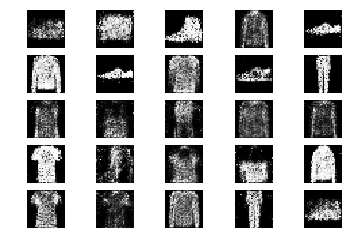

8451 [D loss: 0.670998, acc.: 54.69%] [G loss: 0.844517]
8452 [D loss: 0.640534, acc.: 62.50%] [G loss: 0.819425]
8453 [D loss: 0.624561, acc.: 70.31%] [G loss: 0.918494]
8454 [D loss: 0.627281, acc.: 65.62%] [G loss: 0.969427]
8455 [D loss: 0.642244, acc.: 64.06%] [G loss: 0.946693]
8456 [D loss: 0.717012, acc.: 51.56%] [G loss: 0.840439]
8457 [D loss: 0.716303, acc.: 43.75%] [G loss: 0.763873]
8458 [D loss: 0.689885, acc.: 54.69%] [G loss: 0.876482]
8459 [D loss: 0.655791, acc.: 60.94%] [G loss: 0.914276]
8460 [D loss: 0.681838, acc.: 51.56%] [G loss: 0.905827]
8461 [D loss: 0.656475, acc.: 53.12%] [G loss: 0.950263]
8462 [D loss: 0.733944, acc.: 56.25%] [G loss: 1.002499]
8463 [D loss: 0.595190, acc.: 68.75%] [G loss: 0.930262]
8464 [D loss: 0.665375, acc.: 57.81%] [G loss: 0.953235]
8465 [D loss: 0.632871, acc.: 62.50%] [G loss: 0.878793]
8466 [D loss: 0.703940, acc.: 51.56%] [G loss: 0.820203]
8467 [D loss: 0.649510, acc.: 60.94%] [G loss: 0.856684]
8468 [D loss: 0.699688, acc.: 5

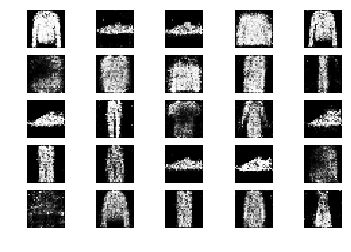

8501 [D loss: 0.694686, acc.: 56.25%] [G loss: 0.945227]
8502 [D loss: 0.648816, acc.: 59.38%] [G loss: 0.873033]
8503 [D loss: 0.578210, acc.: 71.88%] [G loss: 0.941161]
8504 [D loss: 0.677414, acc.: 62.50%] [G loss: 0.931768]
8505 [D loss: 0.670808, acc.: 57.81%] [G loss: 0.987066]
8506 [D loss: 0.679004, acc.: 59.38%] [G loss: 0.889165]
8507 [D loss: 0.637126, acc.: 59.38%] [G loss: 0.900374]
8508 [D loss: 0.656847, acc.: 59.38%] [G loss: 0.915877]
8509 [D loss: 0.675096, acc.: 59.38%] [G loss: 0.861068]
8510 [D loss: 0.687383, acc.: 57.81%] [G loss: 0.977610]
8511 [D loss: 0.608905, acc.: 75.00%] [G loss: 0.968148]
8512 [D loss: 0.579822, acc.: 73.44%] [G loss: 0.894612]
8513 [D loss: 0.676327, acc.: 57.81%] [G loss: 0.962187]
8514 [D loss: 0.632624, acc.: 64.06%] [G loss: 0.898879]
8515 [D loss: 0.660214, acc.: 62.50%] [G loss: 0.933276]
8516 [D loss: 0.674142, acc.: 53.12%] [G loss: 0.859404]
8517 [D loss: 0.695832, acc.: 53.12%] [G loss: 0.873083]
8518 [D loss: 0.639584, acc.: 6

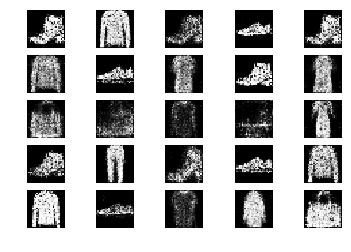

8551 [D loss: 0.788699, acc.: 42.19%] [G loss: 0.893839]
8552 [D loss: 0.631790, acc.: 64.06%] [G loss: 0.960913]
8553 [D loss: 0.643149, acc.: 65.62%] [G loss: 1.068296]
8554 [D loss: 0.662631, acc.: 65.62%] [G loss: 0.916650]
8555 [D loss: 0.650070, acc.: 60.94%] [G loss: 0.921998]
8556 [D loss: 0.634251, acc.: 62.50%] [G loss: 0.956978]
8557 [D loss: 0.620029, acc.: 67.19%] [G loss: 0.821876]
8558 [D loss: 0.624230, acc.: 62.50%] [G loss: 0.946302]
8559 [D loss: 0.698890, acc.: 56.25%] [G loss: 0.888239]
8560 [D loss: 0.598612, acc.: 70.31%] [G loss: 0.931432]
8561 [D loss: 0.684786, acc.: 57.81%] [G loss: 0.915907]
8562 [D loss: 0.606603, acc.: 67.19%] [G loss: 0.839016]
8563 [D loss: 0.645368, acc.: 59.38%] [G loss: 0.813290]
8564 [D loss: 0.615132, acc.: 70.31%] [G loss: 0.822872]
8565 [D loss: 0.644170, acc.: 60.94%] [G loss: 0.918687]
8566 [D loss: 0.658391, acc.: 56.25%] [G loss: 0.916657]
8567 [D loss: 0.697898, acc.: 53.12%] [G loss: 0.830365]
8568 [D loss: 0.645586, acc.: 6

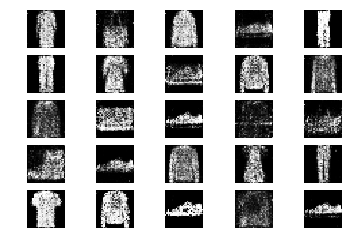

8601 [D loss: 0.617571, acc.: 67.19%] [G loss: 0.827904]
8602 [D loss: 0.623637, acc.: 70.31%] [G loss: 0.907472]
8603 [D loss: 0.604810, acc.: 73.44%] [G loss: 0.941788]
8604 [D loss: 0.636182, acc.: 62.50%] [G loss: 1.009017]
8605 [D loss: 0.625802, acc.: 68.75%] [G loss: 1.006359]
8606 [D loss: 0.722821, acc.: 51.56%] [G loss: 0.921772]
8607 [D loss: 0.688209, acc.: 53.12%] [G loss: 0.952749]
8608 [D loss: 0.663122, acc.: 64.06%] [G loss: 0.990752]
8609 [D loss: 0.653450, acc.: 62.50%] [G loss: 0.895335]
8610 [D loss: 0.698471, acc.: 64.06%] [G loss: 0.907947]
8611 [D loss: 0.705568, acc.: 53.12%] [G loss: 0.847446]
8612 [D loss: 0.643684, acc.: 64.06%] [G loss: 0.882626]
8613 [D loss: 0.703872, acc.: 54.69%] [G loss: 0.863318]
8614 [D loss: 0.649209, acc.: 57.81%] [G loss: 0.830031]
8615 [D loss: 0.570091, acc.: 76.56%] [G loss: 0.908488]
8616 [D loss: 0.647290, acc.: 70.31%] [G loss: 0.970578]
8617 [D loss: 0.647370, acc.: 59.38%] [G loss: 0.916424]
8618 [D loss: 0.664026, acc.: 5

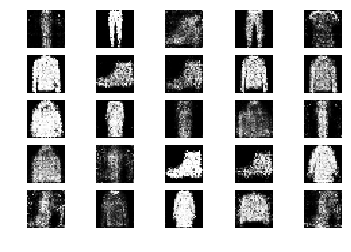

8651 [D loss: 0.618162, acc.: 59.38%] [G loss: 0.891369]
8652 [D loss: 0.649073, acc.: 68.75%] [G loss: 0.924185]
8653 [D loss: 0.644880, acc.: 64.06%] [G loss: 0.868192]
8654 [D loss: 0.642687, acc.: 59.38%] [G loss: 0.762523]
8655 [D loss: 0.638158, acc.: 62.50%] [G loss: 0.967572]
8656 [D loss: 0.608978, acc.: 67.19%] [G loss: 0.850766]
8657 [D loss: 0.715093, acc.: 50.00%] [G loss: 0.848421]
8658 [D loss: 0.599699, acc.: 65.62%] [G loss: 0.870208]
8659 [D loss: 0.690308, acc.: 59.38%] [G loss: 0.894305]
8660 [D loss: 0.607739, acc.: 70.31%] [G loss: 0.894857]
8661 [D loss: 0.682373, acc.: 59.38%] [G loss: 0.846218]
8662 [D loss: 0.618719, acc.: 65.62%] [G loss: 0.949162]
8663 [D loss: 0.644509, acc.: 68.75%] [G loss: 0.915534]
8664 [D loss: 0.672332, acc.: 54.69%] [G loss: 0.882385]
8665 [D loss: 0.677112, acc.: 53.12%] [G loss: 0.832523]
8666 [D loss: 0.650536, acc.: 64.06%] [G loss: 0.929591]
8667 [D loss: 0.582306, acc.: 76.56%] [G loss: 0.837105]
8668 [D loss: 0.667456, acc.: 6

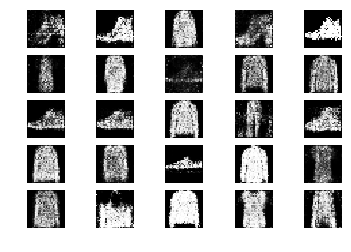

8701 [D loss: 0.696062, acc.: 54.69%] [G loss: 0.835596]
8702 [D loss: 0.580523, acc.: 65.62%] [G loss: 0.914816]
8703 [D loss: 0.682709, acc.: 57.81%] [G loss: 0.892657]
8704 [D loss: 0.689174, acc.: 60.94%] [G loss: 0.874316]
8705 [D loss: 0.613241, acc.: 67.19%] [G loss: 0.903265]
8706 [D loss: 0.632405, acc.: 64.06%] [G loss: 0.866509]
8707 [D loss: 0.626735, acc.: 67.19%] [G loss: 0.991296]
8708 [D loss: 0.637686, acc.: 64.06%] [G loss: 0.937911]
8709 [D loss: 0.685801, acc.: 53.12%] [G loss: 0.897991]
8710 [D loss: 0.620477, acc.: 62.50%] [G loss: 0.791783]
8711 [D loss: 0.641125, acc.: 68.75%] [G loss: 0.867869]
8712 [D loss: 0.644688, acc.: 67.19%] [G loss: 0.963171]
8713 [D loss: 0.671399, acc.: 50.00%] [G loss: 0.938138]
8714 [D loss: 0.661292, acc.: 62.50%] [G loss: 0.927411]
8715 [D loss: 0.675146, acc.: 54.69%] [G loss: 0.945006]
8716 [D loss: 0.648078, acc.: 60.94%] [G loss: 0.892784]
8717 [D loss: 0.644365, acc.: 68.75%] [G loss: 0.854878]
8718 [D loss: 0.672679, acc.: 5

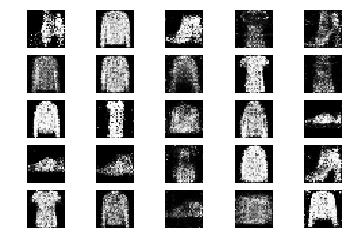

8751 [D loss: 0.640954, acc.: 65.62%] [G loss: 0.942161]
8752 [D loss: 0.684010, acc.: 54.69%] [G loss: 0.939486]
8753 [D loss: 0.646486, acc.: 67.19%] [G loss: 0.817005]
8754 [D loss: 0.660609, acc.: 57.81%] [G loss: 0.920767]
8755 [D loss: 0.710806, acc.: 54.69%] [G loss: 0.920349]
8756 [D loss: 0.706922, acc.: 51.56%] [G loss: 0.905644]
8757 [D loss: 0.598568, acc.: 65.62%] [G loss: 0.900981]
8758 [D loss: 0.693577, acc.: 53.12%] [G loss: 0.944359]
8759 [D loss: 0.632977, acc.: 59.38%] [G loss: 0.943641]
8760 [D loss: 0.627588, acc.: 68.75%] [G loss: 0.908408]
8761 [D loss: 0.674637, acc.: 53.12%] [G loss: 0.911691]
8762 [D loss: 0.642649, acc.: 65.62%] [G loss: 0.950441]
8763 [D loss: 0.662504, acc.: 53.12%] [G loss: 0.888250]
8764 [D loss: 0.658730, acc.: 65.62%] [G loss: 0.890618]
8765 [D loss: 0.621613, acc.: 68.75%] [G loss: 0.910581]
8766 [D loss: 0.625113, acc.: 67.19%] [G loss: 0.953533]
8767 [D loss: 0.669286, acc.: 64.06%] [G loss: 0.913423]
8768 [D loss: 0.660196, acc.: 5

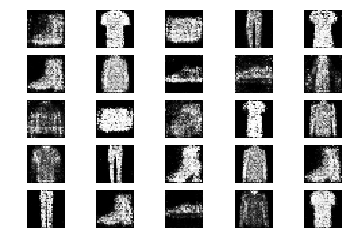

8801 [D loss: 0.652538, acc.: 54.69%] [G loss: 0.921139]
8802 [D loss: 0.628923, acc.: 59.38%] [G loss: 0.894283]
8803 [D loss: 0.635072, acc.: 62.50%] [G loss: 0.833021]
8804 [D loss: 0.706311, acc.: 46.88%] [G loss: 0.829376]
8805 [D loss: 0.646143, acc.: 62.50%] [G loss: 0.880522]
8806 [D loss: 0.719858, acc.: 57.81%] [G loss: 0.849854]
8807 [D loss: 0.712440, acc.: 53.12%] [G loss: 0.938513]
8808 [D loss: 0.688213, acc.: 53.12%] [G loss: 0.966151]
8809 [D loss: 0.613055, acc.: 73.44%] [G loss: 0.927245]
8810 [D loss: 0.683791, acc.: 57.81%] [G loss: 0.966040]
8811 [D loss: 0.609087, acc.: 70.31%] [G loss: 0.925424]
8812 [D loss: 0.673991, acc.: 60.94%] [G loss: 0.977340]
8813 [D loss: 0.644302, acc.: 64.06%] [G loss: 0.871658]
8814 [D loss: 0.687087, acc.: 51.56%] [G loss: 0.836152]
8815 [D loss: 0.673352, acc.: 50.00%] [G loss: 0.939811]
8816 [D loss: 0.675456, acc.: 62.50%] [G loss: 0.849517]
8817 [D loss: 0.661481, acc.: 62.50%] [G loss: 0.927655]
8818 [D loss: 0.670499, acc.: 5

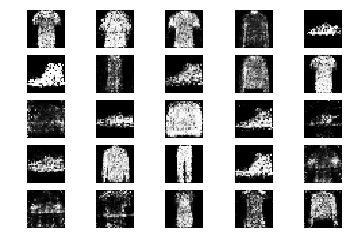

8851 [D loss: 0.668120, acc.: 62.50%] [G loss: 0.873831]
8852 [D loss: 0.679043, acc.: 67.19%] [G loss: 0.900392]
8853 [D loss: 0.654658, acc.: 62.50%] [G loss: 0.838261]
8854 [D loss: 0.667259, acc.: 57.81%] [G loss: 0.907092]
8855 [D loss: 0.585054, acc.: 68.75%] [G loss: 0.987242]
8856 [D loss: 0.755933, acc.: 45.31%] [G loss: 0.873902]
8857 [D loss: 0.648535, acc.: 57.81%] [G loss: 0.957871]
8858 [D loss: 0.655507, acc.: 64.06%] [G loss: 0.837436]
8859 [D loss: 0.641709, acc.: 59.38%] [G loss: 0.818441]
8860 [D loss: 0.626386, acc.: 62.50%] [G loss: 0.877681]
8861 [D loss: 0.678967, acc.: 60.94%] [G loss: 0.867510]
8862 [D loss: 0.699635, acc.: 56.25%] [G loss: 0.969272]
8863 [D loss: 0.663054, acc.: 60.94%] [G loss: 1.026431]
8864 [D loss: 0.630953, acc.: 67.19%] [G loss: 0.944910]
8865 [D loss: 0.707843, acc.: 57.81%] [G loss: 0.907575]
8866 [D loss: 0.657744, acc.: 56.25%] [G loss: 0.811006]
8867 [D loss: 0.683152, acc.: 62.50%] [G loss: 0.889325]
8868 [D loss: 0.590779, acc.: 6

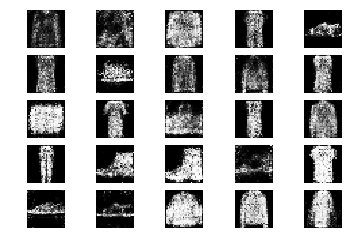

8901 [D loss: 0.669038, acc.: 59.38%] [G loss: 0.869077]
8902 [D loss: 0.627129, acc.: 67.19%] [G loss: 0.880495]
8903 [D loss: 0.645821, acc.: 68.75%] [G loss: 0.958664]
8904 [D loss: 0.640652, acc.: 57.81%] [G loss: 0.826196]
8905 [D loss: 0.639456, acc.: 59.38%] [G loss: 0.897894]
8906 [D loss: 0.660572, acc.: 57.81%] [G loss: 0.878729]
8907 [D loss: 0.671703, acc.: 56.25%] [G loss: 0.885942]
8908 [D loss: 0.680163, acc.: 60.94%] [G loss: 0.814928]
8909 [D loss: 0.621515, acc.: 62.50%] [G loss: 0.922195]
8910 [D loss: 0.659252, acc.: 64.06%] [G loss: 0.898336]
8911 [D loss: 0.625852, acc.: 68.75%] [G loss: 0.911240]
8912 [D loss: 0.646819, acc.: 56.25%] [G loss: 0.833904]
8913 [D loss: 0.575371, acc.: 75.00%] [G loss: 0.843715]
8914 [D loss: 0.721054, acc.: 46.88%] [G loss: 0.824376]
8915 [D loss: 0.728615, acc.: 53.12%] [G loss: 0.878929]
8916 [D loss: 0.632299, acc.: 57.81%] [G loss: 0.962711]
8917 [D loss: 0.637944, acc.: 64.06%] [G loss: 0.882306]
8918 [D loss: 0.630280, acc.: 7

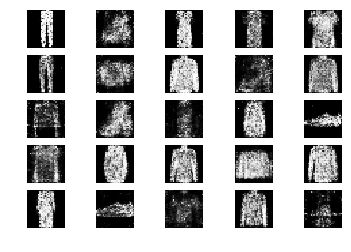

8951 [D loss: 0.687992, acc.: 54.69%] [G loss: 0.924435]
8952 [D loss: 0.620140, acc.: 65.62%] [G loss: 0.885448]
8953 [D loss: 0.676210, acc.: 57.81%] [G loss: 0.955678]
8954 [D loss: 0.663471, acc.: 59.38%] [G loss: 0.899147]
8955 [D loss: 0.633524, acc.: 65.62%] [G loss: 0.904530]
8956 [D loss: 0.684030, acc.: 46.88%] [G loss: 0.798926]
8957 [D loss: 0.672706, acc.: 59.38%] [G loss: 0.924132]
8958 [D loss: 0.625449, acc.: 64.06%] [G loss: 0.995986]
8959 [D loss: 0.677834, acc.: 54.69%] [G loss: 0.870378]
8960 [D loss: 0.618285, acc.: 71.88%] [G loss: 0.931754]
8961 [D loss: 0.660659, acc.: 59.38%] [G loss: 0.959814]
8962 [D loss: 0.649456, acc.: 59.38%] [G loss: 0.947872]
8963 [D loss: 0.658456, acc.: 56.25%] [G loss: 0.861154]
8964 [D loss: 0.672690, acc.: 54.69%] [G loss: 0.801343]
8965 [D loss: 0.665841, acc.: 59.38%] [G loss: 0.909930]
8966 [D loss: 0.703068, acc.: 51.56%] [G loss: 1.001754]
8967 [D loss: 0.639622, acc.: 64.06%] [G loss: 0.974841]
8968 [D loss: 0.681287, acc.: 6

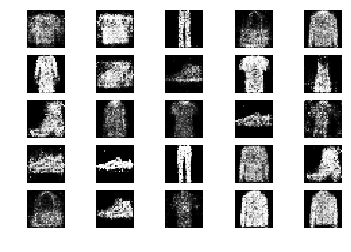

9001 [D loss: 0.666617, acc.: 60.94%] [G loss: 0.857123]
9002 [D loss: 0.653120, acc.: 62.50%] [G loss: 0.856794]
9003 [D loss: 0.631326, acc.: 57.81%] [G loss: 0.944169]
9004 [D loss: 0.656379, acc.: 65.62%] [G loss: 0.877786]
9005 [D loss: 0.693768, acc.: 50.00%] [G loss: 0.939928]
9006 [D loss: 0.598677, acc.: 71.88%] [G loss: 0.939293]
9007 [D loss: 0.664185, acc.: 54.69%] [G loss: 0.880508]
9008 [D loss: 0.630066, acc.: 64.06%] [G loss: 0.896019]
9009 [D loss: 0.626349, acc.: 62.50%] [G loss: 0.883229]
9010 [D loss: 0.646714, acc.: 62.50%] [G loss: 0.781794]
9011 [D loss: 0.684797, acc.: 56.25%] [G loss: 0.944630]
9012 [D loss: 0.590255, acc.: 65.62%] [G loss: 0.911751]
9013 [D loss: 0.650453, acc.: 62.50%] [G loss: 0.840561]
9014 [D loss: 0.604192, acc.: 75.00%] [G loss: 0.853375]
9015 [D loss: 0.645654, acc.: 64.06%] [G loss: 0.865518]
9016 [D loss: 0.690428, acc.: 51.56%] [G loss: 0.919283]
9017 [D loss: 0.640844, acc.: 62.50%] [G loss: 0.969032]
9018 [D loss: 0.677036, acc.: 6

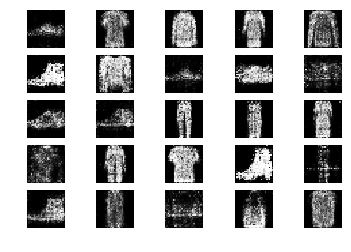

9051 [D loss: 0.706127, acc.: 54.69%] [G loss: 0.963618]
9052 [D loss: 0.681582, acc.: 57.81%] [G loss: 0.947304]
9053 [D loss: 0.703547, acc.: 51.56%] [G loss: 0.865164]
9054 [D loss: 0.633812, acc.: 68.75%] [G loss: 0.900231]
9055 [D loss: 0.589453, acc.: 70.31%] [G loss: 0.968111]
9056 [D loss: 0.669479, acc.: 56.25%] [G loss: 0.925237]
9057 [D loss: 0.655420, acc.: 64.06%] [G loss: 0.932044]
9058 [D loss: 0.756250, acc.: 48.44%] [G loss: 0.868027]
9059 [D loss: 0.714945, acc.: 59.38%] [G loss: 0.863568]
9060 [D loss: 0.665551, acc.: 57.81%] [G loss: 0.858449]
9061 [D loss: 0.640871, acc.: 70.31%] [G loss: 1.007976]
9062 [D loss: 0.683026, acc.: 54.69%] [G loss: 0.969000]
9063 [D loss: 0.666778, acc.: 57.81%] [G loss: 0.916873]
9064 [D loss: 0.656941, acc.: 59.38%] [G loss: 0.895782]
9065 [D loss: 0.622955, acc.: 68.75%] [G loss: 0.892471]
9066 [D loss: 0.698602, acc.: 54.69%] [G loss: 0.856974]
9067 [D loss: 0.614789, acc.: 68.75%] [G loss: 0.818967]
9068 [D loss: 0.680699, acc.: 5

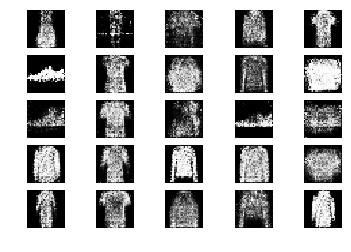

9101 [D loss: 0.686764, acc.: 57.81%] [G loss: 0.977840]
9102 [D loss: 0.684481, acc.: 51.56%] [G loss: 0.920595]
9103 [D loss: 0.697013, acc.: 54.69%] [G loss: 0.901170]
9104 [D loss: 0.695242, acc.: 51.56%] [G loss: 0.817397]
9105 [D loss: 0.670295, acc.: 60.94%] [G loss: 0.941234]
9106 [D loss: 0.632763, acc.: 62.50%] [G loss: 0.911089]
9107 [D loss: 0.648268, acc.: 60.94%] [G loss: 0.842753]
9108 [D loss: 0.615157, acc.: 65.62%] [G loss: 0.935453]
9109 [D loss: 0.650703, acc.: 57.81%] [G loss: 0.899758]
9110 [D loss: 0.671025, acc.: 57.81%] [G loss: 0.855186]
9111 [D loss: 0.703103, acc.: 59.38%] [G loss: 0.887717]
9112 [D loss: 0.659571, acc.: 60.94%] [G loss: 0.827603]
9113 [D loss: 0.650957, acc.: 57.81%] [G loss: 0.840157]
9114 [D loss: 0.709754, acc.: 56.25%] [G loss: 0.939019]
9115 [D loss: 0.610781, acc.: 65.62%] [G loss: 1.054328]
9116 [D loss: 0.625814, acc.: 60.94%] [G loss: 0.936657]
9117 [D loss: 0.644659, acc.: 62.50%] [G loss: 0.866638]
9118 [D loss: 0.674596, acc.: 5

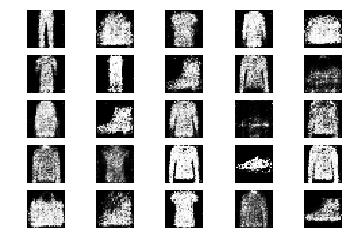

9151 [D loss: 0.660608, acc.: 62.50%] [G loss: 1.015584]
9152 [D loss: 0.661868, acc.: 57.81%] [G loss: 0.969244]
9153 [D loss: 0.647222, acc.: 67.19%] [G loss: 0.874561]
9154 [D loss: 0.611183, acc.: 64.06%] [G loss: 0.944635]
9155 [D loss: 0.649879, acc.: 54.69%] [G loss: 0.925772]
9156 [D loss: 0.647552, acc.: 62.50%] [G loss: 0.920389]
9157 [D loss: 0.651057, acc.: 70.31%] [G loss: 0.894880]
9158 [D loss: 0.684613, acc.: 54.69%] [G loss: 0.928741]
9159 [D loss: 0.619353, acc.: 70.31%] [G loss: 0.866503]
9160 [D loss: 0.613525, acc.: 67.19%] [G loss: 0.901315]
9161 [D loss: 0.698164, acc.: 53.12%] [G loss: 0.833577]
9162 [D loss: 0.664982, acc.: 65.62%] [G loss: 0.860276]
9163 [D loss: 0.597879, acc.: 75.00%] [G loss: 0.882113]
9164 [D loss: 0.711800, acc.: 50.00%] [G loss: 0.863212]
9165 [D loss: 0.651510, acc.: 57.81%] [G loss: 0.918140]
9166 [D loss: 0.682782, acc.: 51.56%] [G loss: 0.949183]
9167 [D loss: 0.678195, acc.: 57.81%] [G loss: 0.921498]
9168 [D loss: 0.646364, acc.: 6

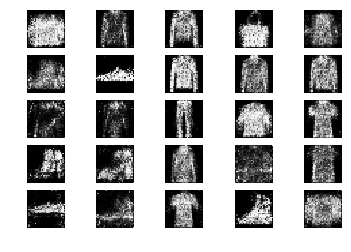

9201 [D loss: 0.692326, acc.: 54.69%] [G loss: 0.865170]
9202 [D loss: 0.545371, acc.: 70.31%] [G loss: 0.966832]
9203 [D loss: 0.709059, acc.: 48.44%] [G loss: 0.943852]
9204 [D loss: 0.675255, acc.: 59.38%] [G loss: 1.010903]
9205 [D loss: 0.680884, acc.: 64.06%] [G loss: 0.954505]
9206 [D loss: 0.653736, acc.: 62.50%] [G loss: 0.961242]
9207 [D loss: 0.674032, acc.: 60.94%] [G loss: 0.892766]
9208 [D loss: 0.666057, acc.: 57.81%] [G loss: 0.917598]
9209 [D loss: 0.674810, acc.: 50.00%] [G loss: 0.916541]
9210 [D loss: 0.691153, acc.: 60.94%] [G loss: 0.820878]
9211 [D loss: 0.716597, acc.: 48.44%] [G loss: 0.874050]
9212 [D loss: 0.621760, acc.: 64.06%] [G loss: 0.891043]
9213 [D loss: 0.651960, acc.: 62.50%] [G loss: 0.877570]
9214 [D loss: 0.579433, acc.: 71.88%] [G loss: 0.918406]
9215 [D loss: 0.665462, acc.: 59.38%] [G loss: 0.892943]
9216 [D loss: 0.694848, acc.: 54.69%] [G loss: 0.839377]
9217 [D loss: 0.652019, acc.: 62.50%] [G loss: 0.902299]
9218 [D loss: 0.619564, acc.: 6

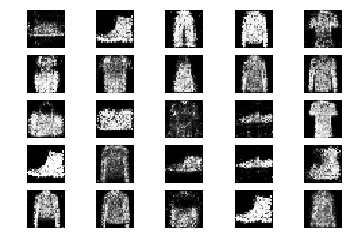

9251 [D loss: 0.664686, acc.: 59.38%] [G loss: 0.916089]
9252 [D loss: 0.642411, acc.: 60.94%] [G loss: 0.933559]
9253 [D loss: 0.640939, acc.: 64.06%] [G loss: 0.891942]
9254 [D loss: 0.699183, acc.: 51.56%] [G loss: 0.912913]
9255 [D loss: 0.701952, acc.: 57.81%] [G loss: 0.876219]
9256 [D loss: 0.633510, acc.: 67.19%] [G loss: 0.881500]
9257 [D loss: 0.651184, acc.: 67.19%] [G loss: 0.948895]
9258 [D loss: 0.670275, acc.: 60.94%] [G loss: 0.875917]
9259 [D loss: 0.583276, acc.: 73.44%] [G loss: 0.936140]
9260 [D loss: 0.617552, acc.: 65.62%] [G loss: 0.948095]
9261 [D loss: 0.628954, acc.: 60.94%] [G loss: 0.934665]
9262 [D loss: 0.718580, acc.: 46.88%] [G loss: 0.959838]
9263 [D loss: 0.646156, acc.: 65.62%] [G loss: 0.981469]
9264 [D loss: 0.690995, acc.: 54.69%] [G loss: 0.941596]
9265 [D loss: 0.643541, acc.: 60.94%] [G loss: 0.904174]
9266 [D loss: 0.691950, acc.: 59.38%] [G loss: 0.896308]
9267 [D loss: 0.620080, acc.: 67.19%] [G loss: 0.875940]
9268 [D loss: 0.661579, acc.: 5

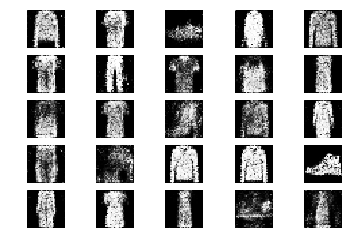

9301 [D loss: 0.655329, acc.: 70.31%] [G loss: 0.854161]
9302 [D loss: 0.630785, acc.: 64.06%] [G loss: 0.896501]
9303 [D loss: 0.657004, acc.: 64.06%] [G loss: 0.972298]
9304 [D loss: 0.670985, acc.: 57.81%] [G loss: 0.919593]
9305 [D loss: 0.673078, acc.: 56.25%] [G loss: 0.878128]
9306 [D loss: 0.618890, acc.: 67.19%] [G loss: 0.987051]
9307 [D loss: 0.633876, acc.: 60.94%] [G loss: 1.015741]
9308 [D loss: 0.596873, acc.: 64.06%] [G loss: 0.967509]
9309 [D loss: 0.702159, acc.: 56.25%] [G loss: 0.939664]
9310 [D loss: 0.700686, acc.: 48.44%] [G loss: 0.935046]
9311 [D loss: 0.665772, acc.: 65.62%] [G loss: 0.913167]
9312 [D loss: 0.687153, acc.: 57.81%] [G loss: 0.923856]
9313 [D loss: 0.641177, acc.: 60.94%] [G loss: 0.928148]
9314 [D loss: 0.702538, acc.: 57.81%] [G loss: 0.953566]
9315 [D loss: 0.682971, acc.: 56.25%] [G loss: 0.997400]
9316 [D loss: 0.639493, acc.: 62.50%] [G loss: 0.905570]
9317 [D loss: 0.622124, acc.: 65.62%] [G loss: 0.920876]
9318 [D loss: 0.655479, acc.: 6

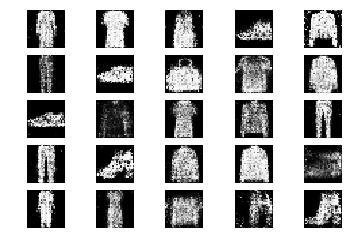

9351 [D loss: 0.630814, acc.: 59.38%] [G loss: 0.920698]
9352 [D loss: 0.656831, acc.: 62.50%] [G loss: 0.874769]
9353 [D loss: 0.653925, acc.: 64.06%] [G loss: 0.921410]
9354 [D loss: 0.614878, acc.: 62.50%] [G loss: 0.927699]
9355 [D loss: 0.665948, acc.: 65.62%] [G loss: 0.966271]
9356 [D loss: 0.635351, acc.: 57.81%] [G loss: 0.987142]
9357 [D loss: 0.637737, acc.: 64.06%] [G loss: 0.957079]
9358 [D loss: 0.627046, acc.: 64.06%] [G loss: 0.969217]
9359 [D loss: 0.613118, acc.: 73.44%] [G loss: 0.964416]
9360 [D loss: 0.656449, acc.: 64.06%] [G loss: 0.907889]
9361 [D loss: 0.632269, acc.: 65.62%] [G loss: 1.001881]
9362 [D loss: 0.685238, acc.: 64.06%] [G loss: 0.921539]
9363 [D loss: 0.613592, acc.: 71.88%] [G loss: 0.971384]
9364 [D loss: 0.629705, acc.: 57.81%] [G loss: 0.957102]
9365 [D loss: 0.629498, acc.: 60.94%] [G loss: 0.905739]
9366 [D loss: 0.723217, acc.: 46.88%] [G loss: 0.824544]
9367 [D loss: 0.659778, acc.: 60.94%] [G loss: 0.830487]
9368 [D loss: 0.717639, acc.: 5

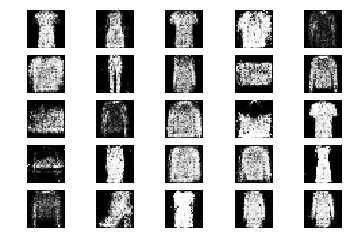

9401 [D loss: 0.638525, acc.: 60.94%] [G loss: 0.913203]
9402 [D loss: 0.621785, acc.: 70.31%] [G loss: 0.957765]
9403 [D loss: 0.687489, acc.: 48.44%] [G loss: 0.825268]
9404 [D loss: 0.630095, acc.: 65.62%] [G loss: 0.882796]
9405 [D loss: 0.702144, acc.: 53.12%] [G loss: 0.813902]
9406 [D loss: 0.666122, acc.: 57.81%] [G loss: 0.922903]
9407 [D loss: 0.639727, acc.: 67.19%] [G loss: 0.967992]
9408 [D loss: 0.682038, acc.: 51.56%] [G loss: 0.844346]
9409 [D loss: 0.655910, acc.: 60.94%] [G loss: 0.929055]
9410 [D loss: 0.666281, acc.: 57.81%] [G loss: 0.934562]
9411 [D loss: 0.609756, acc.: 67.19%] [G loss: 0.844159]
9412 [D loss: 0.730115, acc.: 48.44%] [G loss: 0.828694]
9413 [D loss: 0.624635, acc.: 76.56%] [G loss: 0.870110]
9414 [D loss: 0.698083, acc.: 51.56%] [G loss: 0.985709]
9415 [D loss: 0.623372, acc.: 67.19%] [G loss: 0.856665]
9416 [D loss: 0.667604, acc.: 60.94%] [G loss: 0.897879]
9417 [D loss: 0.623164, acc.: 64.06%] [G loss: 0.900539]
9418 [D loss: 0.629987, acc.: 6

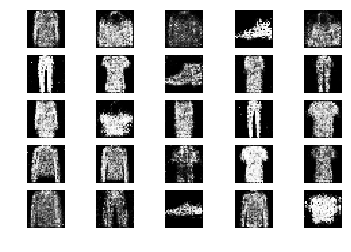

9451 [D loss: 0.606810, acc.: 67.19%] [G loss: 0.863418]
9452 [D loss: 0.639780, acc.: 62.50%] [G loss: 0.966876]
9453 [D loss: 0.620162, acc.: 68.75%] [G loss: 0.951649]
9454 [D loss: 0.666870, acc.: 62.50%] [G loss: 0.873835]
9455 [D loss: 0.651986, acc.: 60.94%] [G loss: 0.941492]
9456 [D loss: 0.681639, acc.: 59.38%] [G loss: 0.854504]
9457 [D loss: 0.661740, acc.: 57.81%] [G loss: 0.859870]
9458 [D loss: 0.734885, acc.: 54.69%] [G loss: 0.908768]
9459 [D loss: 0.642520, acc.: 64.06%] [G loss: 0.900083]
9460 [D loss: 0.650462, acc.: 59.38%] [G loss: 0.892423]
9461 [D loss: 0.669320, acc.: 62.50%] [G loss: 0.983830]
9462 [D loss: 0.628630, acc.: 62.50%] [G loss: 0.945098]
9463 [D loss: 0.674079, acc.: 60.94%] [G loss: 0.884458]
9464 [D loss: 0.590140, acc.: 73.44%] [G loss: 0.862781]
9465 [D loss: 0.593333, acc.: 70.31%] [G loss: 0.792725]
9466 [D loss: 0.629983, acc.: 65.62%] [G loss: 0.892428]
9467 [D loss: 0.687939, acc.: 57.81%] [G loss: 0.861880]
9468 [D loss: 0.774606, acc.: 4

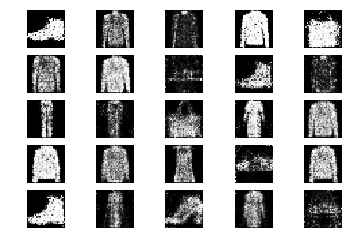

9501 [D loss: 0.656072, acc.: 57.81%] [G loss: 0.884042]
9502 [D loss: 0.655205, acc.: 57.81%] [G loss: 0.844434]
9503 [D loss: 0.644487, acc.: 57.81%] [G loss: 0.949440]
9504 [D loss: 0.626236, acc.: 65.62%] [G loss: 0.797969]
9505 [D loss: 0.697434, acc.: 53.12%] [G loss: 0.842675]
9506 [D loss: 0.634186, acc.: 59.38%] [G loss: 0.886475]
9507 [D loss: 0.698912, acc.: 51.56%] [G loss: 0.882807]
9508 [D loss: 0.702253, acc.: 59.38%] [G loss: 0.897106]
9509 [D loss: 0.634020, acc.: 59.38%] [G loss: 0.889371]
9510 [D loss: 0.560457, acc.: 76.56%] [G loss: 0.852952]
9511 [D loss: 0.652600, acc.: 65.62%] [G loss: 0.811633]
9512 [D loss: 0.648673, acc.: 60.94%] [G loss: 0.913291]
9513 [D loss: 0.596038, acc.: 68.75%] [G loss: 0.813757]
9514 [D loss: 0.637213, acc.: 62.50%] [G loss: 0.855118]
9515 [D loss: 0.668930, acc.: 57.81%] [G loss: 0.809114]
9516 [D loss: 0.664717, acc.: 60.94%] [G loss: 0.855902]
9517 [D loss: 0.653775, acc.: 67.19%] [G loss: 0.974268]
9518 [D loss: 0.634867, acc.: 6

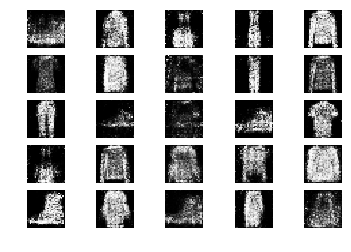

9551 [D loss: 0.682840, acc.: 57.81%] [G loss: 0.857463]
9552 [D loss: 0.732716, acc.: 54.69%] [G loss: 0.985932]
9553 [D loss: 0.618430, acc.: 73.44%] [G loss: 1.024738]
9554 [D loss: 0.641299, acc.: 64.06%] [G loss: 1.006906]
9555 [D loss: 0.631543, acc.: 65.62%] [G loss: 0.926883]
9556 [D loss: 0.640880, acc.: 59.38%] [G loss: 0.895559]
9557 [D loss: 0.709014, acc.: 53.12%] [G loss: 0.902231]
9558 [D loss: 0.630865, acc.: 65.62%] [G loss: 0.912780]
9559 [D loss: 0.688273, acc.: 48.44%] [G loss: 0.979474]
9560 [D loss: 0.647431, acc.: 64.06%] [G loss: 0.849621]
9561 [D loss: 0.613247, acc.: 67.19%] [G loss: 0.908582]
9562 [D loss: 0.674520, acc.: 54.69%] [G loss: 0.894167]
9563 [D loss: 0.675903, acc.: 59.38%] [G loss: 0.818169]
9564 [D loss: 0.617902, acc.: 70.31%] [G loss: 0.880680]
9565 [D loss: 0.671098, acc.: 60.94%] [G loss: 0.933645]
9566 [D loss: 0.645456, acc.: 64.06%] [G loss: 0.952911]
9567 [D loss: 0.624858, acc.: 70.31%] [G loss: 0.934923]
9568 [D loss: 0.641877, acc.: 5

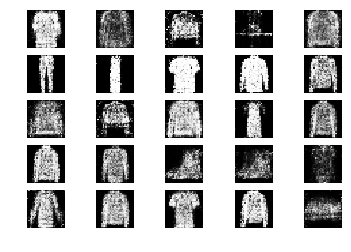

9601 [D loss: 0.669307, acc.: 64.06%] [G loss: 0.912666]
9602 [D loss: 0.638919, acc.: 67.19%] [G loss: 0.922446]
9603 [D loss: 0.675946, acc.: 65.62%] [G loss: 0.860502]
9604 [D loss: 0.663197, acc.: 57.81%] [G loss: 0.929823]
9605 [D loss: 0.651699, acc.: 67.19%] [G loss: 0.832669]
9606 [D loss: 0.631152, acc.: 62.50%] [G loss: 0.925610]
9607 [D loss: 0.680363, acc.: 59.38%] [G loss: 0.857394]
9608 [D loss: 0.622298, acc.: 68.75%] [G loss: 0.820161]
9609 [D loss: 0.608416, acc.: 60.94%] [G loss: 0.944355]
9610 [D loss: 0.637725, acc.: 64.06%] [G loss: 0.988497]
9611 [D loss: 0.674818, acc.: 59.38%] [G loss: 0.902252]
9612 [D loss: 0.687138, acc.: 56.25%] [G loss: 0.925393]
9613 [D loss: 0.714590, acc.: 53.12%] [G loss: 0.918398]
9614 [D loss: 0.659889, acc.: 65.62%] [G loss: 1.041916]
9615 [D loss: 0.623361, acc.: 59.38%] [G loss: 0.880973]
9616 [D loss: 0.605231, acc.: 76.56%] [G loss: 0.998662]
9617 [D loss: 0.655491, acc.: 64.06%] [G loss: 0.909438]
9618 [D loss: 0.688847, acc.: 6

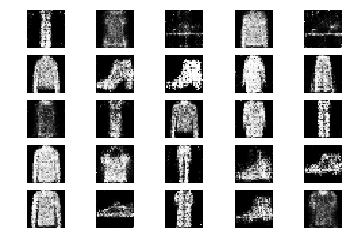

9651 [D loss: 0.720755, acc.: 54.69%] [G loss: 0.882335]
9652 [D loss: 0.634115, acc.: 65.62%] [G loss: 0.934843]
9653 [D loss: 0.697441, acc.: 53.12%] [G loss: 0.936995]
9654 [D loss: 0.640302, acc.: 62.50%] [G loss: 0.967074]
9655 [D loss: 0.639924, acc.: 60.94%] [G loss: 0.939473]
9656 [D loss: 0.685455, acc.: 59.38%] [G loss: 0.896883]
9657 [D loss: 0.698759, acc.: 54.69%] [G loss: 0.920905]
9658 [D loss: 0.655212, acc.: 59.38%] [G loss: 0.887653]
9659 [D loss: 0.652563, acc.: 56.25%] [G loss: 0.885646]
9660 [D loss: 0.570807, acc.: 78.12%] [G loss: 0.918465]
9661 [D loss: 0.660258, acc.: 57.81%] [G loss: 0.868321]
9662 [D loss: 0.637457, acc.: 65.62%] [G loss: 0.806464]
9663 [D loss: 0.701519, acc.: 54.69%] [G loss: 0.805169]
9664 [D loss: 0.596551, acc.: 67.19%] [G loss: 0.814497]
9665 [D loss: 0.595781, acc.: 64.06%] [G loss: 0.919623]
9666 [D loss: 0.659346, acc.: 62.50%] [G loss: 0.915278]
9667 [D loss: 0.651340, acc.: 65.62%] [G loss: 0.926426]
9668 [D loss: 0.717553, acc.: 4

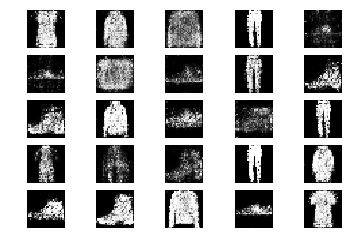

9701 [D loss: 0.688547, acc.: 53.12%] [G loss: 0.895574]
9702 [D loss: 0.662261, acc.: 56.25%] [G loss: 0.893339]
9703 [D loss: 0.603419, acc.: 65.62%] [G loss: 0.818779]
9704 [D loss: 0.699362, acc.: 51.56%] [G loss: 0.881430]
9705 [D loss: 0.656898, acc.: 60.94%] [G loss: 0.860511]
9706 [D loss: 0.644580, acc.: 57.81%] [G loss: 0.876557]
9707 [D loss: 0.673475, acc.: 60.94%] [G loss: 0.962607]
9708 [D loss: 0.612365, acc.: 68.75%] [G loss: 0.877820]
9709 [D loss: 0.630877, acc.: 68.75%] [G loss: 0.805740]
9710 [D loss: 0.663658, acc.: 53.12%] [G loss: 0.903320]
9711 [D loss: 0.665186, acc.: 56.25%] [G loss: 0.918123]
9712 [D loss: 0.671940, acc.: 65.62%] [G loss: 0.896666]
9713 [D loss: 0.698865, acc.: 50.00%] [G loss: 0.828686]
9714 [D loss: 0.689175, acc.: 48.44%] [G loss: 0.887667]
9715 [D loss: 0.620117, acc.: 60.94%] [G loss: 0.995753]
9716 [D loss: 0.618815, acc.: 67.19%] [G loss: 0.968928]
9717 [D loss: 0.727359, acc.: 60.94%] [G loss: 0.948003]
9718 [D loss: 0.633568, acc.: 7

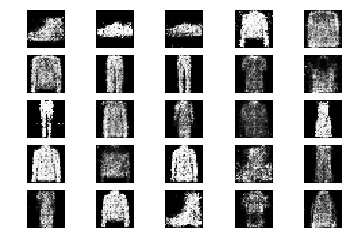

9751 [D loss: 0.673005, acc.: 59.38%] [G loss: 0.924564]
9752 [D loss: 0.648894, acc.: 64.06%] [G loss: 0.868868]
9753 [D loss: 0.638088, acc.: 60.94%] [G loss: 0.923551]
9754 [D loss: 0.682807, acc.: 62.50%] [G loss: 0.923900]
9755 [D loss: 0.610283, acc.: 70.31%] [G loss: 0.944015]
9756 [D loss: 0.658376, acc.: 64.06%] [G loss: 0.881054]
9757 [D loss: 0.645760, acc.: 59.38%] [G loss: 0.955630]
9758 [D loss: 0.646401, acc.: 67.19%] [G loss: 0.994306]
9759 [D loss: 0.646419, acc.: 65.62%] [G loss: 0.877254]
9760 [D loss: 0.645592, acc.: 64.06%] [G loss: 0.841810]
9761 [D loss: 0.693926, acc.: 60.94%] [G loss: 0.921666]
9762 [D loss: 0.668449, acc.: 60.94%] [G loss: 0.920385]
9763 [D loss: 0.692171, acc.: 65.62%] [G loss: 0.908604]
9764 [D loss: 0.626714, acc.: 67.19%] [G loss: 0.950047]
9765 [D loss: 0.676512, acc.: 57.81%] [G loss: 0.889196]
9766 [D loss: 0.652743, acc.: 59.38%] [G loss: 0.976818]
9767 [D loss: 0.698696, acc.: 60.94%] [G loss: 0.874273]
9768 [D loss: 0.707130, acc.: 5

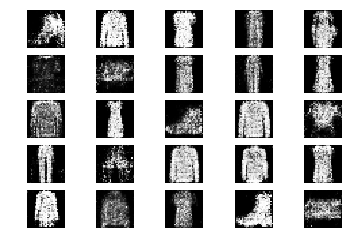

9801 [D loss: 0.630359, acc.: 67.19%] [G loss: 0.989932]
9802 [D loss: 0.702577, acc.: 57.81%] [G loss: 0.940118]
9803 [D loss: 0.702879, acc.: 53.12%] [G loss: 0.894002]
9804 [D loss: 0.667807, acc.: 50.00%] [G loss: 0.932334]
9805 [D loss: 0.673719, acc.: 56.25%] [G loss: 0.928704]
9806 [D loss: 0.631101, acc.: 59.38%] [G loss: 0.886804]
9807 [D loss: 0.676407, acc.: 54.69%] [G loss: 0.866288]
9808 [D loss: 0.672482, acc.: 64.06%] [G loss: 0.854662]
9809 [D loss: 0.722274, acc.: 50.00%] [G loss: 0.913076]
9810 [D loss: 0.630091, acc.: 67.19%] [G loss: 0.951857]
9811 [D loss: 0.642769, acc.: 65.62%] [G loss: 0.945410]
9812 [D loss: 0.662510, acc.: 62.50%] [G loss: 0.988187]
9813 [D loss: 0.674156, acc.: 62.50%] [G loss: 0.914017]
9814 [D loss: 0.627504, acc.: 70.31%] [G loss: 0.936637]
9815 [D loss: 0.725697, acc.: 53.12%] [G loss: 0.882130]
9816 [D loss: 0.749561, acc.: 57.81%] [G loss: 0.854117]
9817 [D loss: 0.637432, acc.: 62.50%] [G loss: 0.949952]
9818 [D loss: 0.634359, acc.: 6

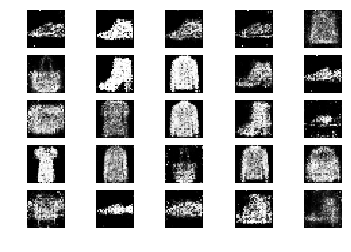

9851 [D loss: 0.621251, acc.: 67.19%] [G loss: 0.908181]
9852 [D loss: 0.617162, acc.: 60.94%] [G loss: 0.996351]
9853 [D loss: 0.667974, acc.: 57.81%] [G loss: 0.787992]
9854 [D loss: 0.736354, acc.: 54.69%] [G loss: 0.939858]
9855 [D loss: 0.674700, acc.: 53.12%] [G loss: 0.892677]
9856 [D loss: 0.668338, acc.: 51.56%] [G loss: 0.892885]
9857 [D loss: 0.607082, acc.: 75.00%] [G loss: 0.878815]
9858 [D loss: 0.587434, acc.: 70.31%] [G loss: 0.940717]
9859 [D loss: 0.618614, acc.: 64.06%] [G loss: 0.875155]
9860 [D loss: 0.571149, acc.: 73.44%] [G loss: 0.962329]
9861 [D loss: 0.606962, acc.: 64.06%] [G loss: 0.920003]
9862 [D loss: 0.656753, acc.: 59.38%] [G loss: 0.895542]
9863 [D loss: 0.687523, acc.: 57.81%] [G loss: 0.871884]
9864 [D loss: 0.631837, acc.: 68.75%] [G loss: 0.876988]
9865 [D loss: 0.618708, acc.: 67.19%] [G loss: 0.921915]
9866 [D loss: 0.609683, acc.: 67.19%] [G loss: 0.900589]
9867 [D loss: 0.641630, acc.: 60.94%] [G loss: 0.938753]
9868 [D loss: 0.708531, acc.: 5

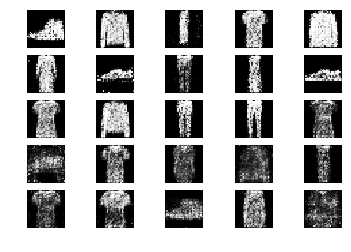

9901 [D loss: 0.629001, acc.: 64.06%] [G loss: 0.847031]
9902 [D loss: 0.637650, acc.: 62.50%] [G loss: 0.995585]
9903 [D loss: 0.578402, acc.: 73.44%] [G loss: 1.035647]
9904 [D loss: 0.655296, acc.: 60.94%] [G loss: 0.905274]
9905 [D loss: 0.688266, acc.: 57.81%] [G loss: 0.931544]
9906 [D loss: 0.639312, acc.: 59.38%] [G loss: 0.809314]
9907 [D loss: 0.593999, acc.: 67.19%] [G loss: 0.910995]
9908 [D loss: 0.664682, acc.: 56.25%] [G loss: 0.860547]
9909 [D loss: 0.670734, acc.: 56.25%] [G loss: 0.897676]
9910 [D loss: 0.605519, acc.: 64.06%] [G loss: 0.974770]
9911 [D loss: 0.645327, acc.: 56.25%] [G loss: 0.885387]
9912 [D loss: 0.643843, acc.: 59.38%] [G loss: 0.960698]
9913 [D loss: 0.613912, acc.: 68.75%] [G loss: 0.901643]
9914 [D loss: 0.692381, acc.: 53.12%] [G loss: 0.894029]
9915 [D loss: 0.742714, acc.: 40.62%] [G loss: 0.859662]
9916 [D loss: 0.650583, acc.: 59.38%] [G loss: 0.908071]
9917 [D loss: 0.626912, acc.: 64.06%] [G loss: 0.915714]
9918 [D loss: 0.597429, acc.: 6

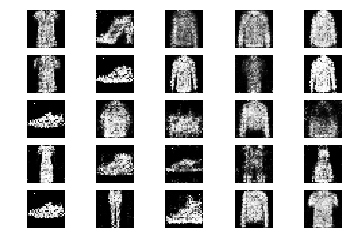

9951 [D loss: 0.665263, acc.: 62.50%] [G loss: 0.910249]
9952 [D loss: 0.664925, acc.: 62.50%] [G loss: 0.915865]
9953 [D loss: 0.673909, acc.: 60.94%] [G loss: 0.942504]
9954 [D loss: 0.711412, acc.: 50.00%] [G loss: 0.931398]
9955 [D loss: 0.641096, acc.: 64.06%] [G loss: 0.946604]
9956 [D loss: 0.693515, acc.: 56.25%] [G loss: 0.900551]
9957 [D loss: 0.684660, acc.: 54.69%] [G loss: 0.897715]
9958 [D loss: 0.684130, acc.: 54.69%] [G loss: 0.799025]
9959 [D loss: 0.669971, acc.: 59.38%] [G loss: 0.922061]
9960 [D loss: 0.622421, acc.: 71.88%] [G loss: 0.936440]
9961 [D loss: 0.650807, acc.: 65.62%] [G loss: 0.936772]
9962 [D loss: 0.709686, acc.: 50.00%] [G loss: 0.837976]
9963 [D loss: 0.672535, acc.: 56.25%] [G loss: 0.829579]
9964 [D loss: 0.643027, acc.: 62.50%] [G loss: 0.919689]
9965 [D loss: 0.614170, acc.: 65.62%] [G loss: 0.871028]
9966 [D loss: 0.673816, acc.: 54.69%] [G loss: 0.945349]
9967 [D loss: 0.599564, acc.: 67.19%] [G loss: 0.830861]
9968 [D loss: 0.637926, acc.: 6

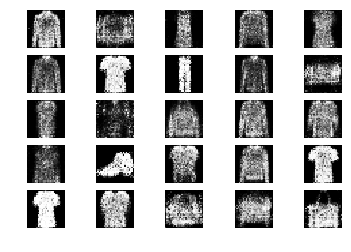

10001 [D loss: 0.676562, acc.: 64.06%] [G loss: 0.888401]
10002 [D loss: 0.680651, acc.: 60.94%] [G loss: 0.898629]
10003 [D loss: 0.702155, acc.: 62.50%] [G loss: 0.847358]
10004 [D loss: 0.710294, acc.: 56.25%] [G loss: 0.829190]
10005 [D loss: 0.612413, acc.: 68.75%] [G loss: 0.926846]
10006 [D loss: 0.628901, acc.: 73.44%] [G loss: 0.838375]
10007 [D loss: 0.667923, acc.: 65.62%] [G loss: 0.850450]
10008 [D loss: 0.598283, acc.: 67.19%] [G loss: 0.883639]
10009 [D loss: 0.719050, acc.: 51.56%] [G loss: 0.888762]
10010 [D loss: 0.595927, acc.: 65.62%] [G loss: 0.872436]
10011 [D loss: 0.670283, acc.: 65.62%] [G loss: 0.926176]
10012 [D loss: 0.666633, acc.: 62.50%] [G loss: 0.893134]
10013 [D loss: 0.628439, acc.: 65.62%] [G loss: 0.992789]
10014 [D loss: 0.619661, acc.: 71.88%] [G loss: 0.954640]
10015 [D loss: 0.751715, acc.: 51.56%] [G loss: 0.823688]
10016 [D loss: 0.698981, acc.: 43.75%] [G loss: 0.830315]
10017 [D loss: 0.701160, acc.: 54.69%] [G loss: 0.966879]
10018 [D loss:

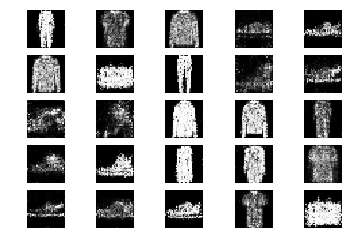

10051 [D loss: 0.617685, acc.: 76.56%] [G loss: 0.955236]
10052 [D loss: 0.641391, acc.: 60.94%] [G loss: 0.936396]
10053 [D loss: 0.600493, acc.: 67.19%] [G loss: 0.879814]
10054 [D loss: 0.671302, acc.: 59.38%] [G loss: 0.896464]
10055 [D loss: 0.684379, acc.: 54.69%] [G loss: 0.988483]
10056 [D loss: 0.652772, acc.: 62.50%] [G loss: 0.888928]
10057 [D loss: 0.687133, acc.: 54.69%] [G loss: 0.854457]
10058 [D loss: 0.645482, acc.: 65.62%] [G loss: 0.884095]
10059 [D loss: 0.646553, acc.: 64.06%] [G loss: 0.892103]
10060 [D loss: 0.658656, acc.: 65.62%] [G loss: 0.942318]
10061 [D loss: 0.661632, acc.: 62.50%] [G loss: 0.884213]
10062 [D loss: 0.647147, acc.: 67.19%] [G loss: 0.855236]
10063 [D loss: 0.665609, acc.: 59.38%] [G loss: 0.913947]
10064 [D loss: 0.583548, acc.: 73.44%] [G loss: 0.867341]
10065 [D loss: 0.604847, acc.: 67.19%] [G loss: 0.963604]
10066 [D loss: 0.663058, acc.: 54.69%] [G loss: 0.889267]
10067 [D loss: 0.647471, acc.: 62.50%] [G loss: 0.973813]
10068 [D loss:

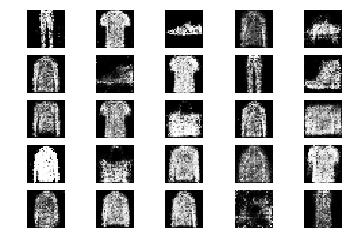

10101 [D loss: 0.664629, acc.: 57.81%] [G loss: 0.953223]
10102 [D loss: 0.728897, acc.: 56.25%] [G loss: 0.987377]
10103 [D loss: 0.613898, acc.: 67.19%] [G loss: 0.920848]
10104 [D loss: 0.661473, acc.: 59.38%] [G loss: 0.934783]
10105 [D loss: 0.691690, acc.: 56.25%] [G loss: 0.876672]
10106 [D loss: 0.660684, acc.: 65.62%] [G loss: 0.895652]
10107 [D loss: 0.706513, acc.: 56.25%] [G loss: 0.943376]
10108 [D loss: 0.682391, acc.: 65.62%] [G loss: 0.871997]
10109 [D loss: 0.634697, acc.: 65.62%] [G loss: 0.884431]
10110 [D loss: 0.630147, acc.: 67.19%] [G loss: 0.906343]
10111 [D loss: 0.645545, acc.: 64.06%] [G loss: 0.951278]
10112 [D loss: 0.634050, acc.: 64.06%] [G loss: 0.915065]
10113 [D loss: 0.687217, acc.: 60.94%] [G loss: 1.031077]
10114 [D loss: 0.670604, acc.: 64.06%] [G loss: 0.827299]
10115 [D loss: 0.632269, acc.: 67.19%] [G loss: 0.830769]
10116 [D loss: 0.694592, acc.: 54.69%] [G loss: 0.949735]
10117 [D loss: 0.626090, acc.: 62.50%] [G loss: 0.878653]
10118 [D loss:

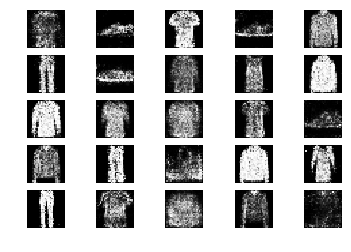

10151 [D loss: 0.581888, acc.: 67.19%] [G loss: 0.895822]
10152 [D loss: 0.667130, acc.: 60.94%] [G loss: 0.970045]
10153 [D loss: 0.715807, acc.: 51.56%] [G loss: 0.854615]
10154 [D loss: 0.624207, acc.: 67.19%] [G loss: 0.821529]
10155 [D loss: 0.619574, acc.: 64.06%] [G loss: 0.889477]
10156 [D loss: 0.670021, acc.: 53.12%] [G loss: 0.937263]
10157 [D loss: 0.611369, acc.: 73.44%] [G loss: 0.929114]
10158 [D loss: 0.622147, acc.: 62.50%] [G loss: 0.914916]
10159 [D loss: 0.647220, acc.: 70.31%] [G loss: 0.861586]
10160 [D loss: 0.574685, acc.: 73.44%] [G loss: 0.931586]
10161 [D loss: 0.730057, acc.: 53.12%] [G loss: 0.839270]
10162 [D loss: 0.648068, acc.: 62.50%] [G loss: 0.916184]
10163 [D loss: 0.608550, acc.: 73.44%] [G loss: 0.963025]
10164 [D loss: 0.575502, acc.: 75.00%] [G loss: 1.014140]
10165 [D loss: 0.630585, acc.: 64.06%] [G loss: 0.853192]
10166 [D loss: 0.622913, acc.: 64.06%] [G loss: 0.852466]
10167 [D loss: 0.653851, acc.: 65.62%] [G loss: 0.774234]
10168 [D loss:

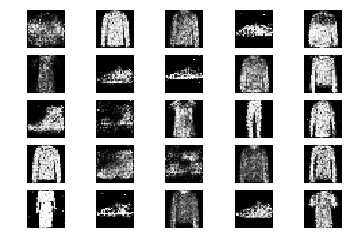

10201 [D loss: 0.646840, acc.: 65.62%] [G loss: 0.859058]
10202 [D loss: 0.678227, acc.: 60.94%] [G loss: 0.851714]
10203 [D loss: 0.680333, acc.: 54.69%] [G loss: 0.922796]
10204 [D loss: 0.656383, acc.: 64.06%] [G loss: 0.827103]
10205 [D loss: 0.690305, acc.: 60.94%] [G loss: 0.923231]
10206 [D loss: 0.626180, acc.: 67.19%] [G loss: 0.899817]
10207 [D loss: 0.669169, acc.: 59.38%] [G loss: 0.983495]
10208 [D loss: 0.642251, acc.: 60.94%] [G loss: 0.922417]
10209 [D loss: 0.717209, acc.: 50.00%] [G loss: 0.811499]
10210 [D loss: 0.635803, acc.: 62.50%] [G loss: 0.803474]
10211 [D loss: 0.677916, acc.: 60.94%] [G loss: 0.885985]
10212 [D loss: 0.625716, acc.: 68.75%] [G loss: 0.817205]
10213 [D loss: 0.643371, acc.: 60.94%] [G loss: 0.830081]
10214 [D loss: 0.727871, acc.: 48.44%] [G loss: 0.851893]
10215 [D loss: 0.636766, acc.: 56.25%] [G loss: 0.927828]
10216 [D loss: 0.598409, acc.: 65.62%] [G loss: 0.843323]
10217 [D loss: 0.676036, acc.: 59.38%] [G loss: 0.859469]
10218 [D loss:

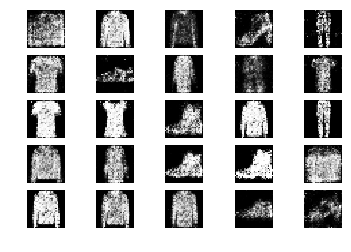

10251 [D loss: 0.639582, acc.: 62.50%] [G loss: 0.882706]
10252 [D loss: 0.671935, acc.: 57.81%] [G loss: 0.928836]
10253 [D loss: 0.664129, acc.: 65.62%] [G loss: 0.926521]
10254 [D loss: 0.649367, acc.: 59.38%] [G loss: 0.945303]
10255 [D loss: 0.677922, acc.: 57.81%] [G loss: 1.004571]
10256 [D loss: 0.633427, acc.: 68.75%] [G loss: 0.878448]
10257 [D loss: 0.690137, acc.: 59.38%] [G loss: 0.841113]
10258 [D loss: 0.671878, acc.: 57.81%] [G loss: 0.886317]
10259 [D loss: 0.583744, acc.: 71.88%] [G loss: 0.879824]
10260 [D loss: 0.711992, acc.: 51.56%] [G loss: 0.901673]
10261 [D loss: 0.613097, acc.: 68.75%] [G loss: 0.907738]
10262 [D loss: 0.667967, acc.: 57.81%] [G loss: 0.908932]
10263 [D loss: 0.633195, acc.: 70.31%] [G loss: 0.996778]
10264 [D loss: 0.680544, acc.: 57.81%] [G loss: 0.873990]
10265 [D loss: 0.666794, acc.: 60.94%] [G loss: 0.892423]
10266 [D loss: 0.718124, acc.: 54.69%] [G loss: 0.908924]
10267 [D loss: 0.654299, acc.: 59.38%] [G loss: 0.953514]
10268 [D loss:

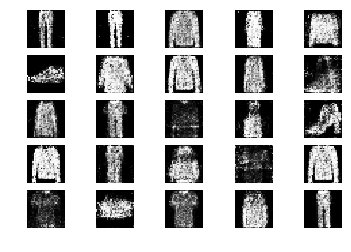

10301 [D loss: 0.627095, acc.: 62.50%] [G loss: 0.853170]
10302 [D loss: 0.655921, acc.: 59.38%] [G loss: 0.871647]
10303 [D loss: 0.679320, acc.: 60.94%] [G loss: 0.808186]
10304 [D loss: 0.643572, acc.: 65.62%] [G loss: 0.877125]
10305 [D loss: 0.684206, acc.: 65.62%] [G loss: 0.889499]
10306 [D loss: 0.638602, acc.: 73.44%] [G loss: 0.925311]
10307 [D loss: 0.637027, acc.: 56.25%] [G loss: 0.883107]
10308 [D loss: 0.631242, acc.: 62.50%] [G loss: 0.868936]
10309 [D loss: 0.667622, acc.: 59.38%] [G loss: 0.895740]
10310 [D loss: 0.673671, acc.: 64.06%] [G loss: 0.887873]
10311 [D loss: 0.673903, acc.: 60.94%] [G loss: 0.845216]
10312 [D loss: 0.633168, acc.: 62.50%] [G loss: 0.913685]
10313 [D loss: 0.652045, acc.: 65.62%] [G loss: 0.954742]
10314 [D loss: 0.615525, acc.: 70.31%] [G loss: 0.956012]
10315 [D loss: 0.693420, acc.: 53.12%] [G loss: 0.863012]
10316 [D loss: 0.654062, acc.: 67.19%] [G loss: 0.942249]
10317 [D loss: 0.648877, acc.: 60.94%] [G loss: 0.885871]
10318 [D loss:

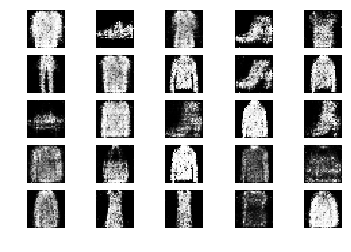

10351 [D loss: 0.614848, acc.: 65.62%] [G loss: 0.956835]
10352 [D loss: 0.664005, acc.: 64.06%] [G loss: 0.960297]
10353 [D loss: 0.607002, acc.: 71.88%] [G loss: 1.051863]
10354 [D loss: 0.703764, acc.: 64.06%] [G loss: 0.996611]
10355 [D loss: 0.690482, acc.: 56.25%] [G loss: 0.925382]
10356 [D loss: 0.601510, acc.: 70.31%] [G loss: 0.908205]
10357 [D loss: 0.649692, acc.: 59.38%] [G loss: 0.910736]
10358 [D loss: 0.652884, acc.: 60.94%] [G loss: 0.941316]
10359 [D loss: 0.656378, acc.: 57.81%] [G loss: 0.861373]
10360 [D loss: 0.696789, acc.: 62.50%] [G loss: 0.923316]
10361 [D loss: 0.594990, acc.: 70.31%] [G loss: 0.911189]
10362 [D loss: 0.596957, acc.: 70.31%] [G loss: 0.871562]
10363 [D loss: 0.632481, acc.: 62.50%] [G loss: 0.943704]
10364 [D loss: 0.675739, acc.: 56.25%] [G loss: 0.887204]
10365 [D loss: 0.610459, acc.: 65.62%] [G loss: 0.906871]
10366 [D loss: 0.752468, acc.: 43.75%] [G loss: 0.903858]
10367 [D loss: 0.647806, acc.: 60.94%] [G loss: 0.897515]
10368 [D loss:

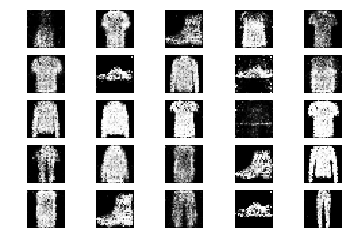

10401 [D loss: 0.664021, acc.: 65.62%] [G loss: 0.925890]
10402 [D loss: 0.656160, acc.: 57.81%] [G loss: 0.815021]
10403 [D loss: 0.631425, acc.: 67.19%] [G loss: 0.869888]
10404 [D loss: 0.643618, acc.: 57.81%] [G loss: 0.931994]
10405 [D loss: 0.657734, acc.: 57.81%] [G loss: 0.911006]
10406 [D loss: 0.700217, acc.: 51.56%] [G loss: 0.851996]
10407 [D loss: 0.610228, acc.: 73.44%] [G loss: 0.776794]
10408 [D loss: 0.711859, acc.: 53.12%] [G loss: 0.889075]
10409 [D loss: 0.659990, acc.: 56.25%] [G loss: 0.960536]
10410 [D loss: 0.593983, acc.: 70.31%] [G loss: 0.966305]
10411 [D loss: 0.576024, acc.: 68.75%] [G loss: 0.947878]
10412 [D loss: 0.568419, acc.: 70.31%] [G loss: 0.937542]
10413 [D loss: 0.694924, acc.: 59.38%] [G loss: 0.929568]
10414 [D loss: 0.575334, acc.: 62.50%] [G loss: 0.939805]
10415 [D loss: 0.607705, acc.: 65.62%] [G loss: 1.016139]
10416 [D loss: 0.696496, acc.: 59.38%] [G loss: 0.864867]
10417 [D loss: 0.702618, acc.: 50.00%] [G loss: 0.865599]
10418 [D loss:

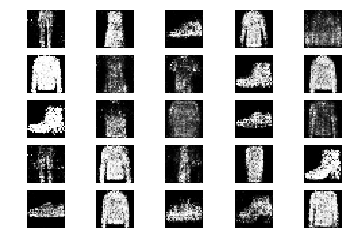

10451 [D loss: 0.637979, acc.: 62.50%] [G loss: 0.791530]
10452 [D loss: 0.622278, acc.: 70.31%] [G loss: 0.873553]
10453 [D loss: 0.673365, acc.: 59.38%] [G loss: 0.915168]
10454 [D loss: 0.637621, acc.: 60.94%] [G loss: 0.795915]
10455 [D loss: 0.631956, acc.: 57.81%] [G loss: 0.947268]
10456 [D loss: 0.659590, acc.: 60.94%] [G loss: 0.936661]
10457 [D loss: 0.635368, acc.: 65.62%] [G loss: 0.944445]
10458 [D loss: 0.658925, acc.: 62.50%] [G loss: 0.988289]
10459 [D loss: 0.684085, acc.: 62.50%] [G loss: 0.876825]
10460 [D loss: 0.672502, acc.: 60.94%] [G loss: 0.906477]
10461 [D loss: 0.639449, acc.: 65.62%] [G loss: 1.023694]
10462 [D loss: 0.691178, acc.: 59.38%] [G loss: 0.995061]
10463 [D loss: 0.651408, acc.: 60.94%] [G loss: 1.013661]
10464 [D loss: 0.674014, acc.: 59.38%] [G loss: 0.969504]
10465 [D loss: 0.665640, acc.: 57.81%] [G loss: 0.982730]
10466 [D loss: 0.740182, acc.: 45.31%] [G loss: 0.806009]
10467 [D loss: 0.692634, acc.: 54.69%] [G loss: 0.758909]
10468 [D loss:

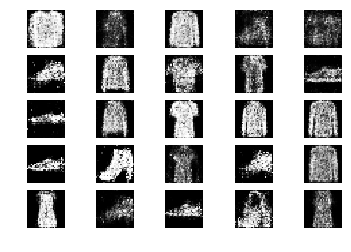

10501 [D loss: 0.642595, acc.: 64.06%] [G loss: 0.874020]
10502 [D loss: 0.630991, acc.: 64.06%] [G loss: 0.983350]
10503 [D loss: 0.610640, acc.: 59.38%] [G loss: 0.967337]
10504 [D loss: 0.640838, acc.: 57.81%] [G loss: 1.012489]
10505 [D loss: 0.681445, acc.: 57.81%] [G loss: 0.989618]
10506 [D loss: 0.682837, acc.: 54.69%] [G loss: 0.895545]
10507 [D loss: 0.637229, acc.: 62.50%] [G loss: 0.907710]
10508 [D loss: 0.636352, acc.: 60.94%] [G loss: 0.878780]
10509 [D loss: 0.597271, acc.: 65.62%] [G loss: 0.905075]
10510 [D loss: 0.635561, acc.: 64.06%] [G loss: 0.889486]
10511 [D loss: 0.686865, acc.: 48.44%] [G loss: 0.821396]
10512 [D loss: 0.631669, acc.: 57.81%] [G loss: 0.895079]
10513 [D loss: 0.637009, acc.: 60.94%] [G loss: 0.912622]
10514 [D loss: 0.645411, acc.: 60.94%] [G loss: 0.955270]
10515 [D loss: 0.708335, acc.: 56.25%] [G loss: 0.951284]
10516 [D loss: 0.666295, acc.: 60.94%] [G loss: 0.919345]
10517 [D loss: 0.723965, acc.: 46.88%] [G loss: 0.982305]
10518 [D loss:

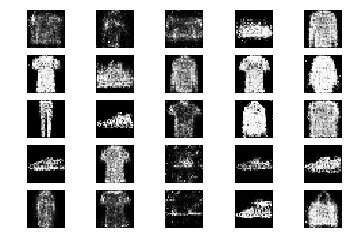

10551 [D loss: 0.686731, acc.: 53.12%] [G loss: 0.880216]
10552 [D loss: 0.619312, acc.: 71.88%] [G loss: 0.889284]
10553 [D loss: 0.651323, acc.: 60.94%] [G loss: 0.927727]
10554 [D loss: 0.625783, acc.: 59.38%] [G loss: 0.894860]
10555 [D loss: 0.647447, acc.: 60.94%] [G loss: 0.943469]
10556 [D loss: 0.627512, acc.: 68.75%] [G loss: 0.917395]
10557 [D loss: 0.689275, acc.: 56.25%] [G loss: 0.846831]
10558 [D loss: 0.627857, acc.: 60.94%] [G loss: 0.885336]
10559 [D loss: 0.641707, acc.: 60.94%] [G loss: 0.826358]
10560 [D loss: 0.684029, acc.: 57.81%] [G loss: 0.805151]
10561 [D loss: 0.728245, acc.: 53.12%] [G loss: 0.893423]
10562 [D loss: 0.686428, acc.: 59.38%] [G loss: 0.948788]
10563 [D loss: 0.671409, acc.: 59.38%] [G loss: 0.925471]
10564 [D loss: 0.685014, acc.: 60.94%] [G loss: 0.869385]
10565 [D loss: 0.674778, acc.: 62.50%] [G loss: 0.873110]
10566 [D loss: 0.690869, acc.: 56.25%] [G loss: 0.897574]
10567 [D loss: 0.681834, acc.: 54.69%] [G loss: 0.842329]
10568 [D loss:

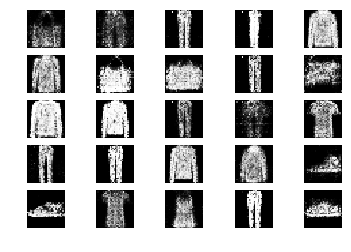

10601 [D loss: 0.650100, acc.: 57.81%] [G loss: 0.938101]
10602 [D loss: 0.623765, acc.: 68.75%] [G loss: 0.987692]
10603 [D loss: 0.736712, acc.: 46.88%] [G loss: 0.884625]
10604 [D loss: 0.643421, acc.: 59.38%] [G loss: 0.892082]
10605 [D loss: 0.661437, acc.: 65.62%] [G loss: 0.896606]
10606 [D loss: 0.698363, acc.: 57.81%] [G loss: 0.928098]
10607 [D loss: 0.702794, acc.: 54.69%] [G loss: 0.813302]
10608 [D loss: 0.693126, acc.: 50.00%] [G loss: 0.863354]
10609 [D loss: 0.704961, acc.: 53.12%] [G loss: 0.843535]
10610 [D loss: 0.663692, acc.: 59.38%] [G loss: 0.923336]
10611 [D loss: 0.667097, acc.: 59.38%] [G loss: 0.982709]
10612 [D loss: 0.614910, acc.: 65.62%] [G loss: 0.898668]
10613 [D loss: 0.611029, acc.: 65.62%] [G loss: 0.902452]
10614 [D loss: 0.664026, acc.: 59.38%] [G loss: 1.023451]
10615 [D loss: 0.650010, acc.: 64.06%] [G loss: 0.841320]
10616 [D loss: 0.653682, acc.: 68.75%] [G loss: 0.826871]
10617 [D loss: 0.761584, acc.: 39.06%] [G loss: 0.855925]
10618 [D loss:

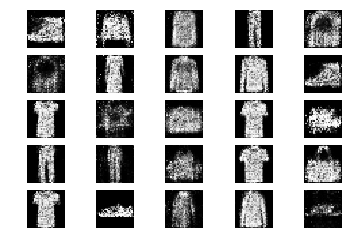

10651 [D loss: 0.700739, acc.: 50.00%] [G loss: 0.798821]
10652 [D loss: 0.631029, acc.: 64.06%] [G loss: 0.805213]
10653 [D loss: 0.635536, acc.: 64.06%] [G loss: 0.807592]
10654 [D loss: 0.676236, acc.: 56.25%] [G loss: 0.864781]
10655 [D loss: 0.721841, acc.: 46.88%] [G loss: 0.880428]
10656 [D loss: 0.640860, acc.: 54.69%] [G loss: 0.845111]
10657 [D loss: 0.586323, acc.: 70.31%] [G loss: 0.867720]
10658 [D loss: 0.669357, acc.: 62.50%] [G loss: 0.846554]
10659 [D loss: 0.661373, acc.: 57.81%] [G loss: 0.891355]
10660 [D loss: 0.660885, acc.: 59.38%] [G loss: 0.961145]
10661 [D loss: 0.630203, acc.: 65.62%] [G loss: 0.907640]
10662 [D loss: 0.636135, acc.: 62.50%] [G loss: 0.939173]
10663 [D loss: 0.638390, acc.: 64.06%] [G loss: 0.927245]
10664 [D loss: 0.661189, acc.: 70.31%] [G loss: 0.951298]
10665 [D loss: 0.726629, acc.: 45.31%] [G loss: 0.924679]
10666 [D loss: 0.645926, acc.: 64.06%] [G loss: 0.904467]
10667 [D loss: 0.679473, acc.: 65.62%] [G loss: 0.940383]
10668 [D loss:

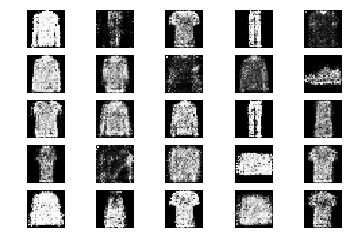

10701 [D loss: 0.607960, acc.: 70.31%] [G loss: 0.876710]
10702 [D loss: 0.745896, acc.: 45.31%] [G loss: 0.871077]
10703 [D loss: 0.622376, acc.: 67.19%] [G loss: 0.911474]
10704 [D loss: 0.671342, acc.: 54.69%] [G loss: 0.964131]
10705 [D loss: 0.794783, acc.: 35.94%] [G loss: 0.952067]
10706 [D loss: 0.666484, acc.: 50.00%] [G loss: 0.854473]
10707 [D loss: 0.615022, acc.: 65.62%] [G loss: 0.892497]
10708 [D loss: 0.612433, acc.: 70.31%] [G loss: 0.881212]
10709 [D loss: 0.665264, acc.: 65.62%] [G loss: 0.797267]
10710 [D loss: 0.692153, acc.: 54.69%] [G loss: 0.968552]
10711 [D loss: 0.660325, acc.: 59.38%] [G loss: 0.901200]
10712 [D loss: 0.673460, acc.: 56.25%] [G loss: 0.961161]
10713 [D loss: 0.664197, acc.: 64.06%] [G loss: 0.897137]
10714 [D loss: 0.613798, acc.: 67.19%] [G loss: 0.909915]
10715 [D loss: 0.633627, acc.: 68.75%] [G loss: 0.894708]
10716 [D loss: 0.646280, acc.: 60.94%] [G loss: 0.950227]
10717 [D loss: 0.643218, acc.: 64.06%] [G loss: 0.973347]
10718 [D loss:

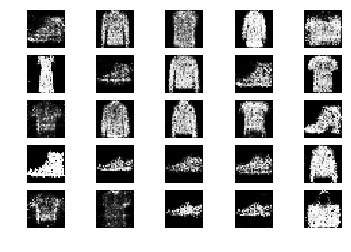

10751 [D loss: 0.686185, acc.: 57.81%] [G loss: 0.931698]
10752 [D loss: 0.654913, acc.: 67.19%] [G loss: 0.874965]
10753 [D loss: 0.633583, acc.: 71.88%] [G loss: 0.902108]
10754 [D loss: 0.710473, acc.: 43.75%] [G loss: 0.920112]
10755 [D loss: 0.731031, acc.: 51.56%] [G loss: 0.916574]
10756 [D loss: 0.631837, acc.: 60.94%] [G loss: 0.931636]
10757 [D loss: 0.643724, acc.: 59.38%] [G loss: 0.897039]
10758 [D loss: 0.624175, acc.: 70.31%] [G loss: 0.892398]
10759 [D loss: 0.627724, acc.: 65.62%] [G loss: 0.880846]
10760 [D loss: 0.633184, acc.: 67.19%] [G loss: 0.880016]
10761 [D loss: 0.607797, acc.: 59.38%] [G loss: 0.937342]
10762 [D loss: 0.707257, acc.: 54.69%] [G loss: 0.907400]
10763 [D loss: 0.638494, acc.: 57.81%] [G loss: 0.919512]
10764 [D loss: 0.638166, acc.: 67.19%] [G loss: 0.884732]
10765 [D loss: 0.641977, acc.: 68.75%] [G loss: 0.893146]
10766 [D loss: 0.663387, acc.: 60.94%] [G loss: 0.852966]
10767 [D loss: 0.643537, acc.: 62.50%] [G loss: 0.851095]
10768 [D loss:

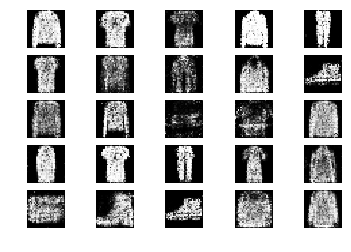

10801 [D loss: 0.662636, acc.: 62.50%] [G loss: 0.847808]
10802 [D loss: 0.629080, acc.: 64.06%] [G loss: 0.865198]
10803 [D loss: 0.748656, acc.: 45.31%] [G loss: 0.876711]
10804 [D loss: 0.620738, acc.: 57.81%] [G loss: 0.883724]
10805 [D loss: 0.589748, acc.: 79.69%] [G loss: 0.970657]
10806 [D loss: 0.659538, acc.: 57.81%] [G loss: 0.954145]
10807 [D loss: 0.672587, acc.: 54.69%] [G loss: 0.916458]
10808 [D loss: 0.722527, acc.: 53.12%] [G loss: 0.883013]
10809 [D loss: 0.704565, acc.: 57.81%] [G loss: 0.895367]
10810 [D loss: 0.639793, acc.: 60.94%] [G loss: 1.016564]
10811 [D loss: 0.739360, acc.: 54.69%] [G loss: 0.949199]
10812 [D loss: 0.718926, acc.: 57.81%] [G loss: 0.878785]
10813 [D loss: 0.623932, acc.: 67.19%] [G loss: 0.872653]
10814 [D loss: 0.667132, acc.: 60.94%] [G loss: 0.963082]
10815 [D loss: 0.686655, acc.: 62.50%] [G loss: 1.016450]
10816 [D loss: 0.679449, acc.: 57.81%] [G loss: 0.970613]
10817 [D loss: 0.625116, acc.: 67.19%] [G loss: 0.871737]
10818 [D loss:

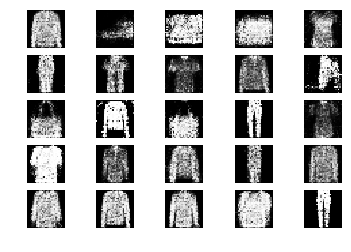

10851 [D loss: 0.640717, acc.: 64.06%] [G loss: 0.950773]
10852 [D loss: 0.705033, acc.: 50.00%] [G loss: 0.916158]
10853 [D loss: 0.638701, acc.: 59.38%] [G loss: 0.833334]
10854 [D loss: 0.694962, acc.: 48.44%] [G loss: 0.892900]
10855 [D loss: 0.667980, acc.: 60.94%] [G loss: 0.876463]
10856 [D loss: 0.675481, acc.: 54.69%] [G loss: 0.851669]
10857 [D loss: 0.588748, acc.: 64.06%] [G loss: 0.814944]
10858 [D loss: 0.682440, acc.: 57.81%] [G loss: 0.881655]
10859 [D loss: 0.650245, acc.: 59.38%] [G loss: 0.860947]
10860 [D loss: 0.641377, acc.: 57.81%] [G loss: 0.866192]
10861 [D loss: 0.643394, acc.: 62.50%] [G loss: 0.922491]
10862 [D loss: 0.640009, acc.: 65.62%] [G loss: 0.824859]
10863 [D loss: 0.676386, acc.: 67.19%] [G loss: 0.859194]
10864 [D loss: 0.641356, acc.: 64.06%] [G loss: 0.928408]
10865 [D loss: 0.675188, acc.: 54.69%] [G loss: 0.858384]
10866 [D loss: 0.663490, acc.: 57.81%] [G loss: 0.887274]
10867 [D loss: 0.656814, acc.: 62.50%] [G loss: 0.833151]
10868 [D loss:

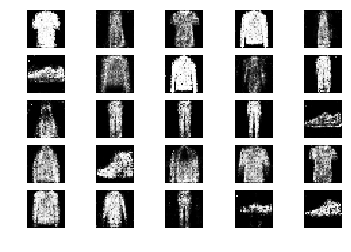

10901 [D loss: 0.664167, acc.: 64.06%] [G loss: 0.887727]
10902 [D loss: 0.707992, acc.: 57.81%] [G loss: 0.913133]
10903 [D loss: 0.632819, acc.: 70.31%] [G loss: 0.906695]
10904 [D loss: 0.653087, acc.: 57.81%] [G loss: 0.929548]
10905 [D loss: 0.659819, acc.: 65.62%] [G loss: 0.927281]
10906 [D loss: 0.606903, acc.: 70.31%] [G loss: 0.876967]
10907 [D loss: 0.615880, acc.: 65.62%] [G loss: 0.922559]
10908 [D loss: 0.593803, acc.: 71.88%] [G loss: 0.953773]
10909 [D loss: 0.618200, acc.: 62.50%] [G loss: 0.882638]
10910 [D loss: 0.639131, acc.: 65.62%] [G loss: 0.949657]
10911 [D loss: 0.678391, acc.: 53.12%] [G loss: 0.840813]
10912 [D loss: 0.669709, acc.: 57.81%] [G loss: 0.961644]
10913 [D loss: 0.650228, acc.: 65.62%] [G loss: 0.938100]
10914 [D loss: 0.614709, acc.: 64.06%] [G loss: 0.900256]
10915 [D loss: 0.618327, acc.: 62.50%] [G loss: 0.987856]
10916 [D loss: 0.651022, acc.: 68.75%] [G loss: 0.789629]
10917 [D loss: 0.733685, acc.: 45.31%] [G loss: 0.944882]
10918 [D loss:

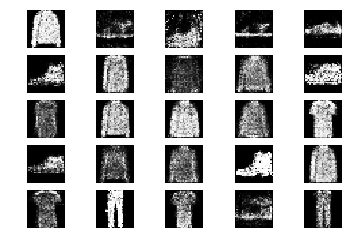

10951 [D loss: 0.598667, acc.: 73.44%] [G loss: 0.952644]
10952 [D loss: 0.668107, acc.: 54.69%] [G loss: 0.923323]
10953 [D loss: 0.599848, acc.: 70.31%] [G loss: 0.982286]
10954 [D loss: 0.674624, acc.: 59.38%] [G loss: 0.951711]
10955 [D loss: 0.651224, acc.: 67.19%] [G loss: 0.948060]
10956 [D loss: 0.711907, acc.: 51.56%] [G loss: 0.886807]
10957 [D loss: 0.641895, acc.: 62.50%] [G loss: 0.931691]
10958 [D loss: 0.600628, acc.: 70.31%] [G loss: 0.961213]
10959 [D loss: 0.664476, acc.: 59.38%] [G loss: 0.937033]
10960 [D loss: 0.636335, acc.: 59.38%] [G loss: 0.934434]
10961 [D loss: 0.609487, acc.: 71.88%] [G loss: 0.888761]
10962 [D loss: 0.570019, acc.: 70.31%] [G loss: 0.934419]
10963 [D loss: 0.671469, acc.: 59.38%] [G loss: 0.915588]
10964 [D loss: 0.612161, acc.: 71.88%] [G loss: 0.909983]
10965 [D loss: 0.600174, acc.: 73.44%] [G loss: 0.985447]
10966 [D loss: 0.645091, acc.: 60.94%] [G loss: 0.924870]
10967 [D loss: 0.617847, acc.: 73.44%] [G loss: 0.883660]
10968 [D loss:

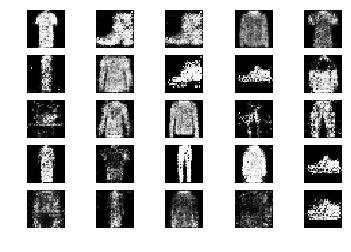

11001 [D loss: 0.607401, acc.: 60.94%] [G loss: 0.893220]
11002 [D loss: 0.640101, acc.: 59.38%] [G loss: 0.977114]
11003 [D loss: 0.692067, acc.: 57.81%] [G loss: 0.852645]
11004 [D loss: 0.655832, acc.: 62.50%] [G loss: 0.918757]
11005 [D loss: 0.576416, acc.: 76.56%] [G loss: 0.779948]
11006 [D loss: 0.598797, acc.: 67.19%] [G loss: 0.894773]
11007 [D loss: 0.636156, acc.: 64.06%] [G loss: 0.979183]
11008 [D loss: 0.633033, acc.: 65.62%] [G loss: 0.932175]
11009 [D loss: 0.683351, acc.: 54.69%] [G loss: 0.946255]
11010 [D loss: 0.671864, acc.: 60.94%] [G loss: 0.941294]
11011 [D loss: 0.654083, acc.: 67.19%] [G loss: 0.878921]
11012 [D loss: 0.693783, acc.: 57.81%] [G loss: 0.933439]
11013 [D loss: 0.702733, acc.: 54.69%] [G loss: 0.925653]
11014 [D loss: 0.621652, acc.: 68.75%] [G loss: 0.937071]
11015 [D loss: 0.639610, acc.: 62.50%] [G loss: 0.914605]
11016 [D loss: 0.656967, acc.: 60.94%] [G loss: 0.872613]
11017 [D loss: 0.649643, acc.: 65.62%] [G loss: 0.974170]
11018 [D loss:

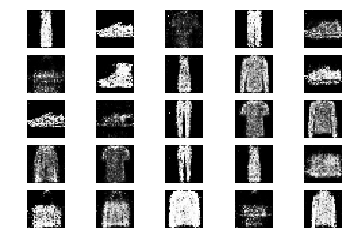

11051 [D loss: 0.616421, acc.: 71.88%] [G loss: 0.941633]
11052 [D loss: 0.763774, acc.: 45.31%] [G loss: 0.932465]
11053 [D loss: 0.623781, acc.: 64.06%] [G loss: 0.935959]
11054 [D loss: 0.700298, acc.: 59.38%] [G loss: 0.909334]
11055 [D loss: 0.665259, acc.: 60.94%] [G loss: 0.865776]
11056 [D loss: 0.655485, acc.: 60.94%] [G loss: 0.978879]
11057 [D loss: 0.607903, acc.: 64.06%] [G loss: 0.920876]
11058 [D loss: 0.642946, acc.: 57.81%] [G loss: 0.936761]
11059 [D loss: 0.623839, acc.: 57.81%] [G loss: 0.872515]
11060 [D loss: 0.614081, acc.: 73.44%] [G loss: 0.965210]
11061 [D loss: 0.637584, acc.: 65.62%] [G loss: 0.930309]
11062 [D loss: 0.646215, acc.: 62.50%] [G loss: 0.902003]
11063 [D loss: 0.667233, acc.: 60.94%] [G loss: 0.870810]
11064 [D loss: 0.657457, acc.: 65.62%] [G loss: 0.952756]
11065 [D loss: 0.685104, acc.: 53.12%] [G loss: 0.968143]
11066 [D loss: 0.629459, acc.: 60.94%] [G loss: 1.027296]
11067 [D loss: 0.666805, acc.: 60.94%] [G loss: 0.860281]
11068 [D loss:

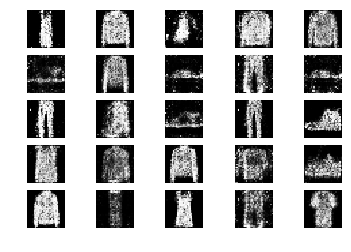

11101 [D loss: 0.623617, acc.: 70.31%] [G loss: 0.927439]
11102 [D loss: 0.654853, acc.: 59.38%] [G loss: 1.032105]
11103 [D loss: 0.617195, acc.: 65.62%] [G loss: 0.949217]
11104 [D loss: 0.657304, acc.: 64.06%] [G loss: 0.970808]
11105 [D loss: 0.641449, acc.: 64.06%] [G loss: 0.933705]
11106 [D loss: 0.685689, acc.: 59.38%] [G loss: 0.939387]
11107 [D loss: 0.657377, acc.: 59.38%] [G loss: 0.907656]
11108 [D loss: 0.605087, acc.: 71.88%] [G loss: 0.843564]
11109 [D loss: 0.697994, acc.: 56.25%] [G loss: 0.829523]
11110 [D loss: 0.588799, acc.: 70.31%] [G loss: 0.882771]
11111 [D loss: 0.729754, acc.: 50.00%] [G loss: 0.950732]
11112 [D loss: 0.602914, acc.: 70.31%] [G loss: 0.914354]
11113 [D loss: 0.698415, acc.: 54.69%] [G loss: 0.911894]
11114 [D loss: 0.753491, acc.: 46.88%] [G loss: 0.882332]
11115 [D loss: 0.602821, acc.: 73.44%] [G loss: 0.852291]
11116 [D loss: 0.664879, acc.: 56.25%] [G loss: 0.848933]
11117 [D loss: 0.665035, acc.: 59.38%] [G loss: 0.787406]
11118 [D loss:

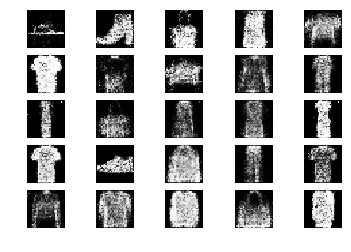

11151 [D loss: 0.663624, acc.: 57.81%] [G loss: 0.903709]
11152 [D loss: 0.715978, acc.: 51.56%] [G loss: 0.904105]
11153 [D loss: 0.648603, acc.: 56.25%] [G loss: 0.964348]
11154 [D loss: 0.615350, acc.: 64.06%] [G loss: 0.919497]
11155 [D loss: 0.677090, acc.: 60.94%] [G loss: 0.872928]
11156 [D loss: 0.621499, acc.: 67.19%] [G loss: 0.912436]
11157 [D loss: 0.633914, acc.: 70.31%] [G loss: 0.857543]
11158 [D loss: 0.669476, acc.: 51.56%] [G loss: 0.901021]
11159 [D loss: 0.656649, acc.: 65.62%] [G loss: 0.883446]
11160 [D loss: 0.609420, acc.: 73.44%] [G loss: 0.924786]
11161 [D loss: 0.620009, acc.: 62.50%] [G loss: 0.907251]
11162 [D loss: 0.625012, acc.: 70.31%] [G loss: 0.985943]
11163 [D loss: 0.685023, acc.: 57.81%] [G loss: 1.014977]
11164 [D loss: 0.668870, acc.: 57.81%] [G loss: 0.972697]
11165 [D loss: 0.663266, acc.: 56.25%] [G loss: 0.832730]
11166 [D loss: 0.627072, acc.: 62.50%] [G loss: 0.928966]
11167 [D loss: 0.649391, acc.: 68.75%] [G loss: 0.898735]
11168 [D loss:

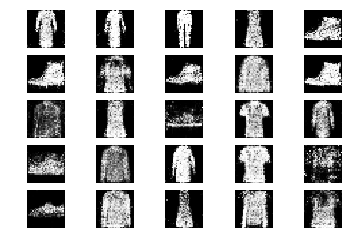

11201 [D loss: 0.624824, acc.: 60.94%] [G loss: 0.854103]
11202 [D loss: 0.614992, acc.: 70.31%] [G loss: 0.868149]
11203 [D loss: 0.688413, acc.: 56.25%] [G loss: 0.920948]
11204 [D loss: 0.689052, acc.: 56.25%] [G loss: 0.976114]
11205 [D loss: 0.673973, acc.: 60.94%] [G loss: 0.870484]
11206 [D loss: 0.685569, acc.: 57.81%] [G loss: 0.889191]
11207 [D loss: 0.641220, acc.: 62.50%] [G loss: 0.916146]
11208 [D loss: 0.602124, acc.: 65.62%] [G loss: 0.892643]
11209 [D loss: 0.625905, acc.: 62.50%] [G loss: 0.866727]
11210 [D loss: 0.614032, acc.: 70.31%] [G loss: 0.894231]
11211 [D loss: 0.638267, acc.: 60.94%] [G loss: 0.953620]
11212 [D loss: 0.660357, acc.: 59.38%] [G loss: 0.857679]
11213 [D loss: 0.648899, acc.: 62.50%] [G loss: 0.858939]
11214 [D loss: 0.708660, acc.: 57.81%] [G loss: 0.901707]
11215 [D loss: 0.614636, acc.: 64.06%] [G loss: 0.900199]
11216 [D loss: 0.649228, acc.: 60.94%] [G loss: 0.953700]
11217 [D loss: 0.658812, acc.: 60.94%] [G loss: 0.861440]
11218 [D loss:

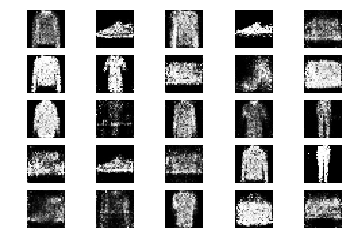

11251 [D loss: 0.672693, acc.: 59.38%] [G loss: 0.890207]
11252 [D loss: 0.682456, acc.: 51.56%] [G loss: 0.832275]
11253 [D loss: 0.647222, acc.: 62.50%] [G loss: 0.938789]
11254 [D loss: 0.678741, acc.: 56.25%] [G loss: 0.882094]
11255 [D loss: 0.644107, acc.: 57.81%] [G loss: 0.894647]
11256 [D loss: 0.608515, acc.: 68.75%] [G loss: 0.857864]
11257 [D loss: 0.614004, acc.: 73.44%] [G loss: 0.958918]
11258 [D loss: 0.692181, acc.: 54.69%] [G loss: 0.834140]
11259 [D loss: 0.643235, acc.: 65.62%] [G loss: 0.877652]
11260 [D loss: 0.652583, acc.: 64.06%] [G loss: 0.881683]
11261 [D loss: 0.634101, acc.: 62.50%] [G loss: 0.945438]
11262 [D loss: 0.687426, acc.: 53.12%] [G loss: 0.889303]
11263 [D loss: 0.710119, acc.: 51.56%] [G loss: 0.913088]
11264 [D loss: 0.646523, acc.: 62.50%] [G loss: 0.902063]
11265 [D loss: 0.636847, acc.: 64.06%] [G loss: 0.905923]
11266 [D loss: 0.689400, acc.: 54.69%] [G loss: 0.904718]
11267 [D loss: 0.635870, acc.: 65.62%] [G loss: 0.830533]
11268 [D loss:

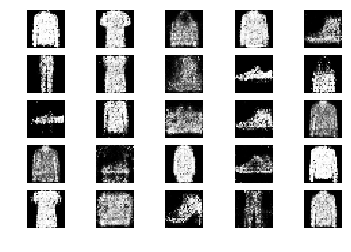

11301 [D loss: 0.656195, acc.: 59.38%] [G loss: 0.980704]
11302 [D loss: 0.694033, acc.: 57.81%] [G loss: 0.886619]
11303 [D loss: 0.688786, acc.: 56.25%] [G loss: 0.885292]
11304 [D loss: 0.671511, acc.: 56.25%] [G loss: 0.770082]
11305 [D loss: 0.651719, acc.: 67.19%] [G loss: 0.825977]
11306 [D loss: 0.638468, acc.: 65.62%] [G loss: 0.914222]
11307 [D loss: 0.643991, acc.: 65.62%] [G loss: 0.889314]
11308 [D loss: 0.709372, acc.: 56.25%] [G loss: 0.855696]
11309 [D loss: 0.641184, acc.: 67.19%] [G loss: 0.857240]
11310 [D loss: 0.615223, acc.: 64.06%] [G loss: 0.898180]
11311 [D loss: 0.634373, acc.: 65.62%] [G loss: 0.918570]
11312 [D loss: 0.650648, acc.: 62.50%] [G loss: 0.997297]
11313 [D loss: 0.597655, acc.: 67.19%] [G loss: 0.990615]
11314 [D loss: 0.684581, acc.: 54.69%] [G loss: 0.958139]
11315 [D loss: 0.602225, acc.: 60.94%] [G loss: 0.927050]
11316 [D loss: 0.676569, acc.: 57.81%] [G loss: 0.975308]
11317 [D loss: 0.661306, acc.: 56.25%] [G loss: 0.849706]
11318 [D loss:

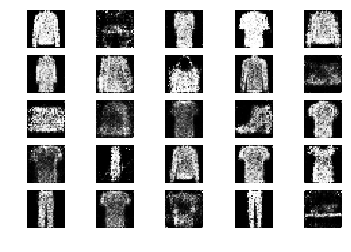

11351 [D loss: 0.719513, acc.: 50.00%] [G loss: 0.877148]
11352 [D loss: 0.655868, acc.: 60.94%] [G loss: 0.924803]
11353 [D loss: 0.689220, acc.: 59.38%] [G loss: 0.948335]
11354 [D loss: 0.573537, acc.: 76.56%] [G loss: 0.939124]
11355 [D loss: 0.544273, acc.: 75.00%] [G loss: 0.923396]
11356 [D loss: 0.614752, acc.: 70.31%] [G loss: 0.943749]
11357 [D loss: 0.671990, acc.: 64.06%] [G loss: 0.942225]
11358 [D loss: 0.649190, acc.: 54.69%] [G loss: 0.931433]
11359 [D loss: 0.611460, acc.: 57.81%] [G loss: 0.930381]
11360 [D loss: 0.612094, acc.: 65.62%] [G loss: 0.974478]
11361 [D loss: 0.610344, acc.: 68.75%] [G loss: 0.944373]
11362 [D loss: 0.637426, acc.: 62.50%] [G loss: 0.924354]
11363 [D loss: 0.621833, acc.: 68.75%] [G loss: 0.907724]
11364 [D loss: 0.610283, acc.: 67.19%] [G loss: 0.902758]
11365 [D loss: 0.706416, acc.: 57.81%] [G loss: 0.911376]
11366 [D loss: 0.672025, acc.: 60.94%] [G loss: 0.890328]
11367 [D loss: 0.708805, acc.: 60.94%] [G loss: 0.968558]
11368 [D loss:

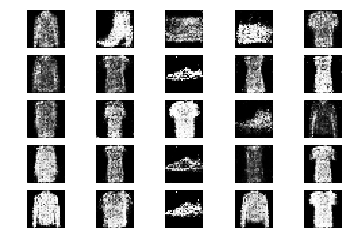

11401 [D loss: 0.713622, acc.: 60.94%] [G loss: 0.912385]
11402 [D loss: 0.638166, acc.: 62.50%] [G loss: 0.851901]
11403 [D loss: 0.640087, acc.: 62.50%] [G loss: 0.856169]
11404 [D loss: 0.616295, acc.: 62.50%] [G loss: 0.936979]
11405 [D loss: 0.647764, acc.: 67.19%] [G loss: 0.881399]
11406 [D loss: 0.692591, acc.: 60.94%] [G loss: 0.898187]
11407 [D loss: 0.663323, acc.: 59.38%] [G loss: 0.902362]
11408 [D loss: 0.701174, acc.: 51.56%] [G loss: 1.013119]
11409 [D loss: 0.616034, acc.: 67.19%] [G loss: 0.899220]
11410 [D loss: 0.680024, acc.: 60.94%] [G loss: 0.870325]
11411 [D loss: 0.594270, acc.: 70.31%] [G loss: 0.921927]
11412 [D loss: 0.651690, acc.: 59.38%] [G loss: 0.884266]
11413 [D loss: 0.642889, acc.: 62.50%] [G loss: 0.912175]
11414 [D loss: 0.632614, acc.: 62.50%] [G loss: 0.918967]
11415 [D loss: 0.654945, acc.: 60.94%] [G loss: 0.976974]
11416 [D loss: 0.690534, acc.: 54.69%] [G loss: 0.984197]
11417 [D loss: 0.714360, acc.: 46.88%] [G loss: 0.857730]
11418 [D loss:

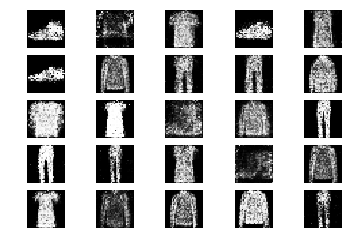

11451 [D loss: 0.649252, acc.: 57.81%] [G loss: 0.930703]
11452 [D loss: 0.608932, acc.: 65.62%] [G loss: 1.010864]
11453 [D loss: 0.655448, acc.: 57.81%] [G loss: 0.907992]
11454 [D loss: 0.681644, acc.: 51.56%] [G loss: 0.898794]
11455 [D loss: 0.624370, acc.: 68.75%] [G loss: 0.902787]
11456 [D loss: 0.660738, acc.: 60.94%] [G loss: 0.902116]
11457 [D loss: 0.640951, acc.: 62.50%] [G loss: 0.878113]
11458 [D loss: 0.632065, acc.: 62.50%] [G loss: 0.887015]
11459 [D loss: 0.707314, acc.: 51.56%] [G loss: 0.840044]
11460 [D loss: 0.633963, acc.: 59.38%] [G loss: 0.918973]
11461 [D loss: 0.697102, acc.: 53.12%] [G loss: 0.822205]
11462 [D loss: 0.610136, acc.: 64.06%] [G loss: 0.927896]
11463 [D loss: 0.679137, acc.: 64.06%] [G loss: 0.979094]
11464 [D loss: 0.625440, acc.: 65.62%] [G loss: 0.971311]
11465 [D loss: 0.629133, acc.: 67.19%] [G loss: 0.898730]
11466 [D loss: 0.754963, acc.: 46.88%] [G loss: 0.906504]
11467 [D loss: 0.616953, acc.: 64.06%] [G loss: 0.907383]
11468 [D loss:

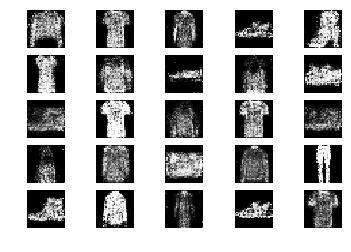

11501 [D loss: 0.646185, acc.: 54.69%] [G loss: 0.883574]
11502 [D loss: 0.709041, acc.: 45.31%] [G loss: 0.955240]
11503 [D loss: 0.690500, acc.: 57.81%] [G loss: 0.926590]
11504 [D loss: 0.575012, acc.: 68.75%] [G loss: 0.917934]
11505 [D loss: 0.689779, acc.: 62.50%] [G loss: 0.997108]
11506 [D loss: 0.601308, acc.: 64.06%] [G loss: 0.955408]
11507 [D loss: 0.601800, acc.: 70.31%] [G loss: 0.891150]
11508 [D loss: 0.628213, acc.: 70.31%] [G loss: 0.890904]
11509 [D loss: 0.662811, acc.: 56.25%] [G loss: 0.891726]
11510 [D loss: 0.665910, acc.: 57.81%] [G loss: 0.891921]
11511 [D loss: 0.726486, acc.: 50.00%] [G loss: 0.831825]
11512 [D loss: 0.707597, acc.: 50.00%] [G loss: 0.827405]
11513 [D loss: 0.671429, acc.: 54.69%] [G loss: 0.934622]
11514 [D loss: 0.651145, acc.: 62.50%] [G loss: 0.934888]
11515 [D loss: 0.630640, acc.: 67.19%] [G loss: 0.879283]
11516 [D loss: 0.593990, acc.: 73.44%] [G loss: 0.935542]
11517 [D loss: 0.735679, acc.: 53.12%] [G loss: 0.951837]
11518 [D loss:

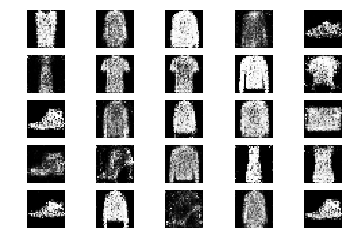

11551 [D loss: 0.630331, acc.: 65.62%] [G loss: 0.911170]
11552 [D loss: 0.609541, acc.: 62.50%] [G loss: 0.840192]
11553 [D loss: 0.677826, acc.: 60.94%] [G loss: 0.891255]
11554 [D loss: 0.614016, acc.: 67.19%] [G loss: 0.853773]
11555 [D loss: 0.779513, acc.: 43.75%] [G loss: 0.924950]
11556 [D loss: 0.658327, acc.: 54.69%] [G loss: 0.943671]
11557 [D loss: 0.628908, acc.: 65.62%] [G loss: 1.035225]
11558 [D loss: 0.629896, acc.: 60.94%] [G loss: 0.939069]
11559 [D loss: 0.715083, acc.: 48.44%] [G loss: 0.887334]
11560 [D loss: 0.640713, acc.: 56.25%] [G loss: 0.872564]
11561 [D loss: 0.708618, acc.: 57.81%] [G loss: 0.871558]
11562 [D loss: 0.631405, acc.: 65.62%] [G loss: 0.957565]
11563 [D loss: 0.698342, acc.: 51.56%] [G loss: 0.903650]
11564 [D loss: 0.605976, acc.: 71.88%] [G loss: 0.923950]
11565 [D loss: 0.643978, acc.: 64.06%] [G loss: 0.875961]
11566 [D loss: 0.649800, acc.: 64.06%] [G loss: 0.939575]
11567 [D loss: 0.656909, acc.: 59.38%] [G loss: 0.910562]
11568 [D loss:

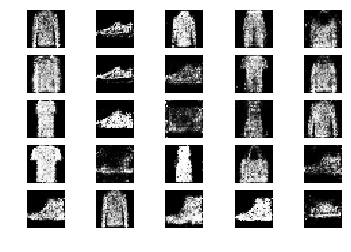

11601 [D loss: 0.688229, acc.: 57.81%] [G loss: 0.960343]
11602 [D loss: 0.627672, acc.: 65.62%] [G loss: 0.970243]
11603 [D loss: 0.589498, acc.: 68.75%] [G loss: 0.890048]
11604 [D loss: 0.724072, acc.: 46.88%] [G loss: 0.878750]
11605 [D loss: 0.640618, acc.: 59.38%] [G loss: 0.907097]
11606 [D loss: 0.690743, acc.: 53.12%] [G loss: 0.817370]
11607 [D loss: 0.664579, acc.: 56.25%] [G loss: 0.877403]
11608 [D loss: 0.714222, acc.: 59.38%] [G loss: 0.828959]
11609 [D loss: 0.666191, acc.: 59.38%] [G loss: 0.827241]
11610 [D loss: 0.681720, acc.: 59.38%] [G loss: 0.839350]
11611 [D loss: 0.622909, acc.: 59.38%] [G loss: 0.958901]
11612 [D loss: 0.660916, acc.: 59.38%] [G loss: 0.926801]
11613 [D loss: 0.641056, acc.: 60.94%] [G loss: 0.881878]
11614 [D loss: 0.673043, acc.: 56.25%] [G loss: 0.897531]
11615 [D loss: 0.668168, acc.: 53.12%] [G loss: 0.977623]
11616 [D loss: 0.663442, acc.: 54.69%] [G loss: 0.911693]
11617 [D loss: 0.645626, acc.: 60.94%] [G loss: 0.887764]
11618 [D loss:

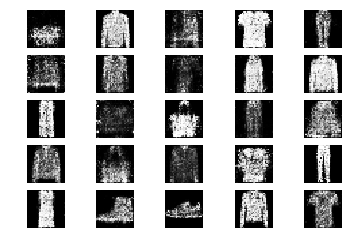

11651 [D loss: 0.667434, acc.: 62.50%] [G loss: 0.812460]
11652 [D loss: 0.622565, acc.: 67.19%] [G loss: 0.807624]
11653 [D loss: 0.661792, acc.: 62.50%] [G loss: 0.813142]
11654 [D loss: 0.649495, acc.: 59.38%] [G loss: 0.833381]
11655 [D loss: 0.659525, acc.: 57.81%] [G loss: 0.808389]
11656 [D loss: 0.701962, acc.: 48.44%] [G loss: 0.860962]
11657 [D loss: 0.653315, acc.: 62.50%] [G loss: 0.947356]
11658 [D loss: 0.621886, acc.: 67.19%] [G loss: 0.866034]
11659 [D loss: 0.616065, acc.: 68.75%] [G loss: 0.883633]
11660 [D loss: 0.670581, acc.: 59.38%] [G loss: 0.849437]
11661 [D loss: 0.649683, acc.: 59.38%] [G loss: 0.921823]
11662 [D loss: 0.708838, acc.: 56.25%] [G loss: 0.867607]
11663 [D loss: 0.634644, acc.: 59.38%] [G loss: 0.952700]
11664 [D loss: 0.606477, acc.: 64.06%] [G loss: 0.959537]
11665 [D loss: 0.666079, acc.: 60.94%] [G loss: 0.870985]
11666 [D loss: 0.624864, acc.: 70.31%] [G loss: 0.891584]
11667 [D loss: 0.596109, acc.: 73.44%] [G loss: 0.878669]
11668 [D loss:

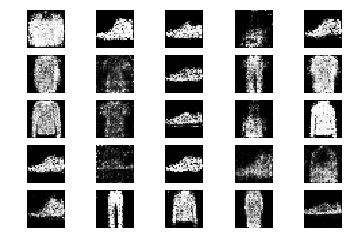

11701 [D loss: 0.638724, acc.: 57.81%] [G loss: 0.936708]
11702 [D loss: 0.646327, acc.: 59.38%] [G loss: 0.853590]
11703 [D loss: 0.692495, acc.: 56.25%] [G loss: 0.944521]
11704 [D loss: 0.612351, acc.: 71.88%] [G loss: 0.924679]
11705 [D loss: 0.681806, acc.: 57.81%] [G loss: 0.966987]
11706 [D loss: 0.590311, acc.: 70.31%] [G loss: 0.886712]
11707 [D loss: 0.703007, acc.: 51.56%] [G loss: 0.891857]
11708 [D loss: 0.668570, acc.: 54.69%] [G loss: 0.939821]
11709 [D loss: 0.613550, acc.: 71.88%] [G loss: 0.865450]
11710 [D loss: 0.675495, acc.: 59.38%] [G loss: 0.888343]
11711 [D loss: 0.682723, acc.: 53.12%] [G loss: 0.893325]
11712 [D loss: 0.618121, acc.: 64.06%] [G loss: 0.898000]
11713 [D loss: 0.675288, acc.: 56.25%] [G loss: 0.884409]
11714 [D loss: 0.595038, acc.: 70.31%] [G loss: 0.841223]
11715 [D loss: 0.627772, acc.: 64.06%] [G loss: 0.918469]
11716 [D loss: 0.670608, acc.: 59.38%] [G loss: 0.973563]
11717 [D loss: 0.600437, acc.: 68.75%] [G loss: 0.952651]
11718 [D loss:

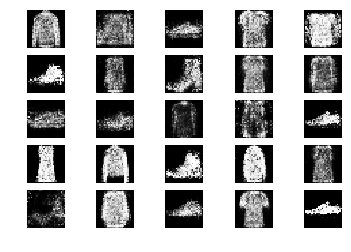

11751 [D loss: 0.714891, acc.: 48.44%] [G loss: 0.936032]
11752 [D loss: 0.702109, acc.: 54.69%] [G loss: 0.930330]
11753 [D loss: 0.636656, acc.: 56.25%] [G loss: 0.815549]
11754 [D loss: 0.634191, acc.: 67.19%] [G loss: 0.836720]
11755 [D loss: 0.640141, acc.: 62.50%] [G loss: 0.888840]
11756 [D loss: 0.621841, acc.: 71.88%] [G loss: 0.808296]
11757 [D loss: 0.671515, acc.: 56.25%] [G loss: 0.808984]
11758 [D loss: 0.703107, acc.: 56.25%] [G loss: 0.904265]
11759 [D loss: 0.612505, acc.: 75.00%] [G loss: 0.948963]
11760 [D loss: 0.681784, acc.: 46.88%] [G loss: 0.833682]
11761 [D loss: 0.647486, acc.: 62.50%] [G loss: 0.896384]
11762 [D loss: 0.663677, acc.: 64.06%] [G loss: 0.881123]
11763 [D loss: 0.657448, acc.: 64.06%] [G loss: 0.896235]
11764 [D loss: 0.684346, acc.: 48.44%] [G loss: 0.862735]
11765 [D loss: 0.647366, acc.: 59.38%] [G loss: 0.896218]
11766 [D loss: 0.677932, acc.: 50.00%] [G loss: 0.884936]
11767 [D loss: 0.679050, acc.: 59.38%] [G loss: 0.850708]
11768 [D loss:

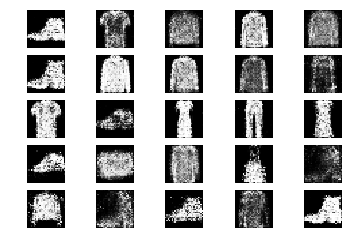

11801 [D loss: 0.654532, acc.: 54.69%] [G loss: 0.919383]
11802 [D loss: 0.639755, acc.: 67.19%] [G loss: 0.881258]
11803 [D loss: 0.637349, acc.: 65.62%] [G loss: 0.845424]
11804 [D loss: 0.576769, acc.: 75.00%] [G loss: 0.933006]
11805 [D loss: 0.606280, acc.: 67.19%] [G loss: 0.881868]
11806 [D loss: 0.682279, acc.: 57.81%] [G loss: 0.851080]
11807 [D loss: 0.657650, acc.: 64.06%] [G loss: 0.886821]
11808 [D loss: 0.673750, acc.: 54.69%] [G loss: 0.936184]
11809 [D loss: 0.635982, acc.: 67.19%] [G loss: 0.899892]
11810 [D loss: 0.645616, acc.: 67.19%] [G loss: 0.911038]
11811 [D loss: 0.635948, acc.: 67.19%] [G loss: 0.956813]
11812 [D loss: 0.680780, acc.: 53.12%] [G loss: 0.838338]
11813 [D loss: 0.666109, acc.: 57.81%] [G loss: 0.823093]
11814 [D loss: 0.689133, acc.: 65.62%] [G loss: 0.920868]
11815 [D loss: 0.694582, acc.: 50.00%] [G loss: 0.902726]
11816 [D loss: 0.721918, acc.: 46.88%] [G loss: 0.971889]
11817 [D loss: 0.657418, acc.: 57.81%] [G loss: 0.862319]
11818 [D loss:

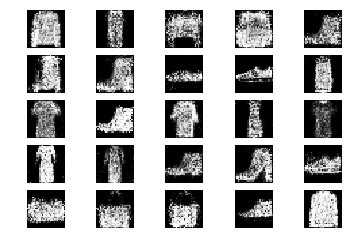

11851 [D loss: 0.647894, acc.: 65.62%] [G loss: 0.826044]
11852 [D loss: 0.658851, acc.: 67.19%] [G loss: 0.834635]
11853 [D loss: 0.691233, acc.: 51.56%] [G loss: 0.872766]
11854 [D loss: 0.598780, acc.: 65.62%] [G loss: 0.863779]
11855 [D loss: 0.669219, acc.: 59.38%] [G loss: 0.897655]
11856 [D loss: 0.636000, acc.: 67.19%] [G loss: 0.898882]
11857 [D loss: 0.743311, acc.: 50.00%] [G loss: 0.945024]
11858 [D loss: 0.672631, acc.: 57.81%] [G loss: 0.982351]
11859 [D loss: 0.642780, acc.: 65.62%] [G loss: 0.893138]
11860 [D loss: 0.667055, acc.: 67.19%] [G loss: 0.961067]
11861 [D loss: 0.663886, acc.: 56.25%] [G loss: 0.986655]
11862 [D loss: 0.682259, acc.: 59.38%] [G loss: 0.858071]
11863 [D loss: 0.644623, acc.: 65.62%] [G loss: 0.877403]
11864 [D loss: 0.569631, acc.: 71.88%] [G loss: 0.905869]
11865 [D loss: 0.659278, acc.: 60.94%] [G loss: 0.846180]
11866 [D loss: 0.699605, acc.: 60.94%] [G loss: 0.932984]
11867 [D loss: 0.669354, acc.: 60.94%] [G loss: 0.877694]
11868 [D loss:

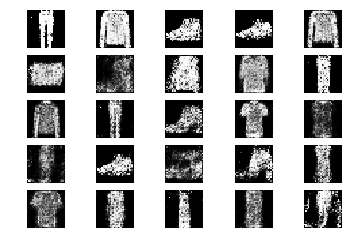

11901 [D loss: 0.616819, acc.: 67.19%] [G loss: 1.021695]
11902 [D loss: 0.647212, acc.: 64.06%] [G loss: 0.932691]
11903 [D loss: 0.712686, acc.: 46.88%] [G loss: 0.841632]
11904 [D loss: 0.713291, acc.: 53.12%] [G loss: 0.859390]
11905 [D loss: 0.673445, acc.: 59.38%] [G loss: 0.889871]
11906 [D loss: 0.654982, acc.: 67.19%] [G loss: 0.978927]
11907 [D loss: 0.621902, acc.: 59.38%] [G loss: 0.932754]
11908 [D loss: 0.646217, acc.: 65.62%] [G loss: 0.878934]
11909 [D loss: 0.587749, acc.: 68.75%] [G loss: 0.974737]
11910 [D loss: 0.718597, acc.: 50.00%] [G loss: 0.850289]
11911 [D loss: 0.651828, acc.: 60.94%] [G loss: 0.900638]
11912 [D loss: 0.701970, acc.: 54.69%] [G loss: 0.825779]
11913 [D loss: 0.644039, acc.: 64.06%] [G loss: 0.864488]
11914 [D loss: 0.640690, acc.: 67.19%] [G loss: 0.823023]
11915 [D loss: 0.656216, acc.: 62.50%] [G loss: 0.914400]
11916 [D loss: 0.684225, acc.: 51.56%] [G loss: 0.900350]
11917 [D loss: 0.598711, acc.: 62.50%] [G loss: 0.965030]
11918 [D loss:

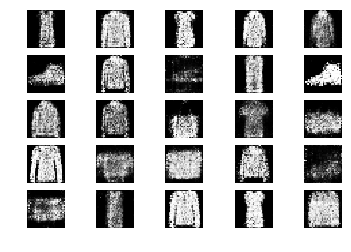

11951 [D loss: 0.629396, acc.: 68.75%] [G loss: 0.851058]
11952 [D loss: 0.648203, acc.: 64.06%] [G loss: 0.895819]
11953 [D loss: 0.719487, acc.: 53.12%] [G loss: 0.909031]
11954 [D loss: 0.612041, acc.: 68.75%] [G loss: 0.909167]
11955 [D loss: 0.672985, acc.: 60.94%] [G loss: 0.893914]
11956 [D loss: 0.657198, acc.: 56.25%] [G loss: 0.924997]
11957 [D loss: 0.621660, acc.: 67.19%] [G loss: 0.958659]
11958 [D loss: 0.678389, acc.: 53.12%] [G loss: 0.964679]
11959 [D loss: 0.711195, acc.: 50.00%] [G loss: 0.854246]
11960 [D loss: 0.656104, acc.: 68.75%] [G loss: 1.014696]
11961 [D loss: 0.716084, acc.: 54.69%] [G loss: 0.952821]
11962 [D loss: 0.684333, acc.: 56.25%] [G loss: 0.928304]
11963 [D loss: 0.666548, acc.: 57.81%] [G loss: 0.963585]
11964 [D loss: 0.617490, acc.: 67.19%] [G loss: 0.901165]
11965 [D loss: 0.675145, acc.: 60.94%] [G loss: 0.908637]
11966 [D loss: 0.691470, acc.: 50.00%] [G loss: 0.879599]
11967 [D loss: 0.654343, acc.: 62.50%] [G loss: 0.961824]
11968 [D loss:

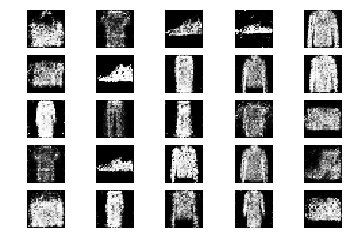

12001 [D loss: 0.634219, acc.: 59.38%] [G loss: 0.912690]
12002 [D loss: 0.629722, acc.: 57.81%] [G loss: 0.968947]
12003 [D loss: 0.647704, acc.: 56.25%] [G loss: 0.940049]
12004 [D loss: 0.674441, acc.: 51.56%] [G loss: 0.872656]
12005 [D loss: 0.695043, acc.: 51.56%] [G loss: 0.874760]
12006 [D loss: 0.693113, acc.: 46.88%] [G loss: 0.817556]
12007 [D loss: 0.634147, acc.: 59.38%] [G loss: 0.916433]
12008 [D loss: 0.720071, acc.: 53.12%] [G loss: 0.872075]
12009 [D loss: 0.687927, acc.: 54.69%] [G loss: 0.816787]
12010 [D loss: 0.626962, acc.: 56.25%] [G loss: 0.852085]
12011 [D loss: 0.633983, acc.: 59.38%] [G loss: 0.883410]
12012 [D loss: 0.645068, acc.: 62.50%] [G loss: 0.880486]
12013 [D loss: 0.650271, acc.: 67.19%] [G loss: 0.817733]
12014 [D loss: 0.646045, acc.: 60.94%] [G loss: 0.872243]
12015 [D loss: 0.598749, acc.: 65.62%] [G loss: 0.950735]
12016 [D loss: 0.668844, acc.: 62.50%] [G loss: 1.046698]
12017 [D loss: 0.542003, acc.: 78.12%] [G loss: 0.971361]
12018 [D loss:

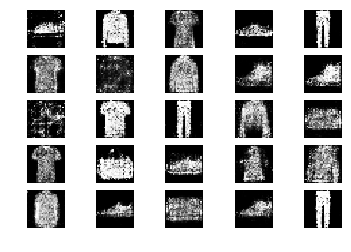

12051 [D loss: 0.680140, acc.: 59.38%] [G loss: 1.037119]
12052 [D loss: 0.639667, acc.: 64.06%] [G loss: 0.981183]
12053 [D loss: 0.678211, acc.: 57.81%] [G loss: 1.007051]
12054 [D loss: 0.616532, acc.: 62.50%] [G loss: 0.879249]
12055 [D loss: 0.656195, acc.: 62.50%] [G loss: 0.995231]
12056 [D loss: 0.724323, acc.: 53.12%] [G loss: 0.938737]
12057 [D loss: 0.782233, acc.: 48.44%] [G loss: 0.843237]
12058 [D loss: 0.648495, acc.: 59.38%] [G loss: 0.864679]
12059 [D loss: 0.646914, acc.: 59.38%] [G loss: 0.904938]
12060 [D loss: 0.662537, acc.: 57.81%] [G loss: 0.877917]
12061 [D loss: 0.666168, acc.: 57.81%] [G loss: 0.885867]
12062 [D loss: 0.656301, acc.: 64.06%] [G loss: 0.924287]
12063 [D loss: 0.653596, acc.: 60.94%] [G loss: 0.919021]
12064 [D loss: 0.617792, acc.: 71.88%] [G loss: 1.036582]
12065 [D loss: 0.666934, acc.: 56.25%] [G loss: 0.959885]
12066 [D loss: 0.641214, acc.: 65.62%] [G loss: 0.838704]
12067 [D loss: 0.747532, acc.: 53.12%] [G loss: 0.845972]
12068 [D loss:

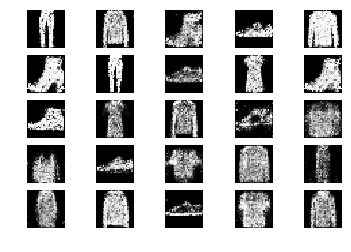

12101 [D loss: 0.662822, acc.: 57.81%] [G loss: 0.919581]
12102 [D loss: 0.648249, acc.: 64.06%] [G loss: 0.906223]
12103 [D loss: 0.667444, acc.: 57.81%] [G loss: 0.967549]
12104 [D loss: 0.719533, acc.: 51.56%] [G loss: 0.919640]
12105 [D loss: 0.668527, acc.: 59.38%] [G loss: 0.876537]
12106 [D loss: 0.651633, acc.: 65.62%] [G loss: 0.867300]
12107 [D loss: 0.651363, acc.: 64.06%] [G loss: 0.932381]
12108 [D loss: 0.634611, acc.: 65.62%] [G loss: 0.829153]
12109 [D loss: 0.637072, acc.: 67.19%] [G loss: 0.951434]
12110 [D loss: 0.689787, acc.: 60.94%] [G loss: 0.923729]
12111 [D loss: 0.633413, acc.: 59.38%] [G loss: 0.839723]
12112 [D loss: 0.661986, acc.: 62.50%] [G loss: 0.872822]
12113 [D loss: 0.649793, acc.: 60.94%] [G loss: 0.972136]
12114 [D loss: 0.640276, acc.: 60.94%] [G loss: 0.875769]
12115 [D loss: 0.713231, acc.: 50.00%] [G loss: 0.921776]
12116 [D loss: 0.742696, acc.: 50.00%] [G loss: 0.890923]
12117 [D loss: 0.657655, acc.: 54.69%] [G loss: 0.871814]
12118 [D loss:

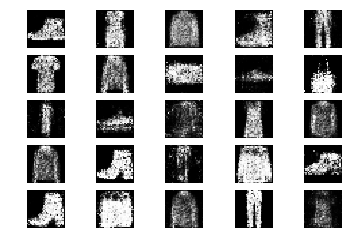

12151 [D loss: 0.679190, acc.: 57.81%] [G loss: 0.890187]
12152 [D loss: 0.693732, acc.: 59.38%] [G loss: 0.860952]
12153 [D loss: 0.601604, acc.: 62.50%] [G loss: 0.785417]
12154 [D loss: 0.671186, acc.: 64.06%] [G loss: 0.909061]
12155 [D loss: 0.694345, acc.: 64.06%] [G loss: 0.861234]
12156 [D loss: 0.649448, acc.: 70.31%] [G loss: 0.837234]
12157 [D loss: 0.632229, acc.: 64.06%] [G loss: 0.858576]
12158 [D loss: 0.673531, acc.: 60.94%] [G loss: 0.908947]
12159 [D loss: 0.676439, acc.: 60.94%] [G loss: 0.900258]
12160 [D loss: 0.652339, acc.: 56.25%] [G loss: 0.867018]
12161 [D loss: 0.678935, acc.: 64.06%] [G loss: 0.938893]
12162 [D loss: 0.751298, acc.: 59.38%] [G loss: 0.889488]
12163 [D loss: 0.634944, acc.: 59.38%] [G loss: 0.981546]
12164 [D loss: 0.618482, acc.: 70.31%] [G loss: 0.892724]
12165 [D loss: 0.672639, acc.: 59.38%] [G loss: 0.909967]
12166 [D loss: 0.616926, acc.: 67.19%] [G loss: 0.967305]
12167 [D loss: 0.725767, acc.: 45.31%] [G loss: 0.825761]
12168 [D loss:

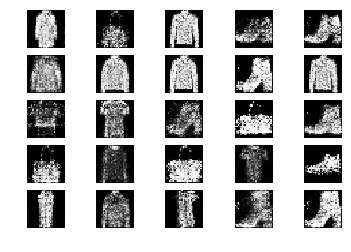

12201 [D loss: 0.674919, acc.: 57.81%] [G loss: 0.946536]
12202 [D loss: 0.673086, acc.: 53.12%] [G loss: 0.798359]
12203 [D loss: 0.595977, acc.: 76.56%] [G loss: 0.923852]
12204 [D loss: 0.633828, acc.: 62.50%] [G loss: 0.955040]
12205 [D loss: 0.647298, acc.: 62.50%] [G loss: 0.933361]
12206 [D loss: 0.705873, acc.: 54.69%] [G loss: 0.806372]
12207 [D loss: 0.714852, acc.: 50.00%] [G loss: 0.925055]
12208 [D loss: 0.653049, acc.: 62.50%] [G loss: 0.938291]
12209 [D loss: 0.660678, acc.: 56.25%] [G loss: 1.000453]
12210 [D loss: 0.697855, acc.: 51.56%] [G loss: 0.876468]
12211 [D loss: 0.613266, acc.: 67.19%] [G loss: 0.861149]
12212 [D loss: 0.675437, acc.: 56.25%] [G loss: 0.879637]
12213 [D loss: 0.647293, acc.: 62.50%] [G loss: 0.902381]
12214 [D loss: 0.645908, acc.: 64.06%] [G loss: 0.994638]
12215 [D loss: 0.646929, acc.: 59.38%] [G loss: 0.908401]
12216 [D loss: 0.658707, acc.: 60.94%] [G loss: 0.924553]
12217 [D loss: 0.677284, acc.: 60.94%] [G loss: 0.879728]
12218 [D loss:

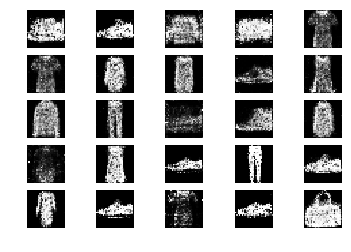

12251 [D loss: 0.641844, acc.: 60.94%] [G loss: 0.863919]
12252 [D loss: 0.623742, acc.: 68.75%] [G loss: 0.950762]
12253 [D loss: 0.654370, acc.: 60.94%] [G loss: 0.973478]
12254 [D loss: 0.601969, acc.: 65.62%] [G loss: 0.940649]
12255 [D loss: 0.583869, acc.: 71.88%] [G loss: 0.929777]
12256 [D loss: 0.664745, acc.: 59.38%] [G loss: 0.904698]
12257 [D loss: 0.586772, acc.: 68.75%] [G loss: 0.955314]
12258 [D loss: 0.656611, acc.: 59.38%] [G loss: 0.953118]
12259 [D loss: 0.626409, acc.: 60.94%] [G loss: 0.985087]
12260 [D loss: 0.689875, acc.: 54.69%] [G loss: 0.911586]
12261 [D loss: 0.582181, acc.: 70.31%] [G loss: 1.039697]
12262 [D loss: 0.600507, acc.: 64.06%] [G loss: 0.899605]
12263 [D loss: 0.655967, acc.: 53.12%] [G loss: 0.981632]
12264 [D loss: 0.690571, acc.: 59.38%] [G loss: 0.929039]
12265 [D loss: 0.609544, acc.: 67.19%] [G loss: 0.928150]
12266 [D loss: 0.667387, acc.: 60.94%] [G loss: 0.918059]
12267 [D loss: 0.665145, acc.: 65.62%] [G loss: 0.960597]
12268 [D loss:

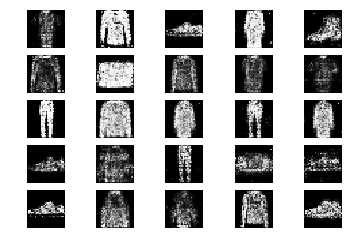

12301 [D loss: 0.619817, acc.: 67.19%] [G loss: 0.924925]
12302 [D loss: 0.669808, acc.: 59.38%] [G loss: 0.826361]
12303 [D loss: 0.670369, acc.: 62.50%] [G loss: 0.956005]
12304 [D loss: 0.667463, acc.: 60.94%] [G loss: 0.943217]
12305 [D loss: 0.597001, acc.: 65.62%] [G loss: 0.906320]
12306 [D loss: 0.644164, acc.: 59.38%] [G loss: 0.926856]
12307 [D loss: 0.593389, acc.: 70.31%] [G loss: 0.959542]
12308 [D loss: 0.634921, acc.: 70.31%] [G loss: 0.990202]
12309 [D loss: 0.657232, acc.: 64.06%] [G loss: 0.898476]
12310 [D loss: 0.630327, acc.: 68.75%] [G loss: 0.922506]
12311 [D loss: 0.652512, acc.: 60.94%] [G loss: 0.958836]
12312 [D loss: 0.649909, acc.: 54.69%] [G loss: 0.903599]
12313 [D loss: 0.726040, acc.: 48.44%] [G loss: 0.903706]
12314 [D loss: 0.700953, acc.: 50.00%] [G loss: 0.839697]
12315 [D loss: 0.706352, acc.: 51.56%] [G loss: 0.881204]
12316 [D loss: 0.640688, acc.: 62.50%] [G loss: 0.906181]
12317 [D loss: 0.752762, acc.: 51.56%] [G loss: 0.930200]
12318 [D loss:

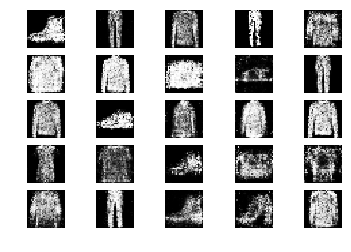

12351 [D loss: 0.638398, acc.: 65.62%] [G loss: 0.892448]
12352 [D loss: 0.646661, acc.: 60.94%] [G loss: 0.906110]
12353 [D loss: 0.714090, acc.: 51.56%] [G loss: 0.959052]
12354 [D loss: 0.665991, acc.: 56.25%] [G loss: 0.923730]
12355 [D loss: 0.666643, acc.: 54.69%] [G loss: 0.904631]
12356 [D loss: 0.595558, acc.: 71.88%] [G loss: 0.937990]
12357 [D loss: 0.692241, acc.: 60.94%] [G loss: 0.870976]
12358 [D loss: 0.666209, acc.: 57.81%] [G loss: 0.899250]
12359 [D loss: 0.646467, acc.: 62.50%] [G loss: 0.888265]
12360 [D loss: 0.663784, acc.: 57.81%] [G loss: 0.941542]
12361 [D loss: 0.669514, acc.: 60.94%] [G loss: 0.910815]
12362 [D loss: 0.638216, acc.: 65.62%] [G loss: 0.855097]
12363 [D loss: 0.631665, acc.: 54.69%] [G loss: 0.896537]
12364 [D loss: 0.637282, acc.: 56.25%] [G loss: 0.940603]
12365 [D loss: 0.673471, acc.: 59.38%] [G loss: 0.845056]
12366 [D loss: 0.623916, acc.: 71.88%] [G loss: 0.862440]
12367 [D loss: 0.700366, acc.: 51.56%] [G loss: 0.878870]
12368 [D loss:

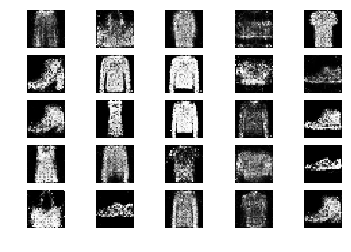

12401 [D loss: 0.638089, acc.: 59.38%] [G loss: 0.960110]
12402 [D loss: 0.671680, acc.: 54.69%] [G loss: 0.961723]
12403 [D loss: 0.683132, acc.: 53.12%] [G loss: 0.869660]
12404 [D loss: 0.660997, acc.: 64.06%] [G loss: 0.912362]
12405 [D loss: 0.653227, acc.: 64.06%] [G loss: 0.927068]
12406 [D loss: 0.636578, acc.: 62.50%] [G loss: 0.979505]
12407 [D loss: 0.678757, acc.: 57.81%] [G loss: 0.973272]
12408 [D loss: 0.648429, acc.: 60.94%] [G loss: 0.972305]
12409 [D loss: 0.658129, acc.: 59.38%] [G loss: 0.957314]
12410 [D loss: 0.624540, acc.: 64.06%] [G loss: 0.926518]
12411 [D loss: 0.667930, acc.: 60.94%] [G loss: 0.832152]
12412 [D loss: 0.635476, acc.: 64.06%] [G loss: 0.834950]
12413 [D loss: 0.690862, acc.: 59.38%] [G loss: 0.777307]
12414 [D loss: 0.687331, acc.: 59.38%] [G loss: 0.840974]
12415 [D loss: 0.690013, acc.: 59.38%] [G loss: 0.861479]
12416 [D loss: 0.627439, acc.: 59.38%] [G loss: 0.895961]
12417 [D loss: 0.713752, acc.: 51.56%] [G loss: 0.896577]
12418 [D loss:

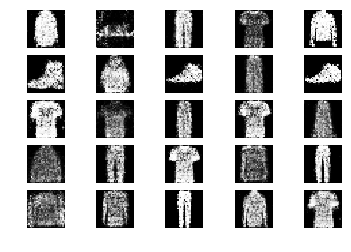

12451 [D loss: 0.648997, acc.: 57.81%] [G loss: 0.879322]
12452 [D loss: 0.733433, acc.: 48.44%] [G loss: 0.845875]
12453 [D loss: 0.650359, acc.: 65.62%] [G loss: 0.866780]
12454 [D loss: 0.655419, acc.: 65.62%] [G loss: 0.901152]
12455 [D loss: 0.673751, acc.: 62.50%] [G loss: 0.829812]
12456 [D loss: 0.681477, acc.: 57.81%] [G loss: 0.815334]
12457 [D loss: 0.629173, acc.: 67.19%] [G loss: 0.862966]
12458 [D loss: 0.655689, acc.: 59.38%] [G loss: 0.914084]
12459 [D loss: 0.649556, acc.: 60.94%] [G loss: 0.903097]
12460 [D loss: 0.645683, acc.: 60.94%] [G loss: 0.919649]
12461 [D loss: 0.695403, acc.: 54.69%] [G loss: 0.866504]
12462 [D loss: 0.646042, acc.: 56.25%] [G loss: 0.895766]
12463 [D loss: 0.691197, acc.: 50.00%] [G loss: 0.901780]
12464 [D loss: 0.693041, acc.: 59.38%] [G loss: 0.888897]
12465 [D loss: 0.642501, acc.: 56.25%] [G loss: 0.915810]
12466 [D loss: 0.695209, acc.: 53.12%] [G loss: 0.889987]
12467 [D loss: 0.581453, acc.: 73.44%] [G loss: 0.954790]
12468 [D loss:

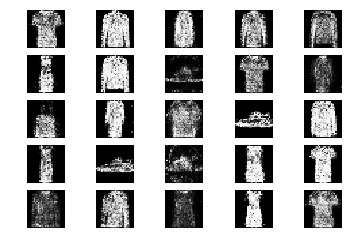

12501 [D loss: 0.635867, acc.: 64.06%] [G loss: 0.994798]
12502 [D loss: 0.730479, acc.: 45.31%] [G loss: 0.927635]
12503 [D loss: 0.708198, acc.: 48.44%] [G loss: 0.891451]
12504 [D loss: 0.688192, acc.: 59.38%] [G loss: 0.882777]
12505 [D loss: 0.634720, acc.: 65.62%] [G loss: 0.862057]
12506 [D loss: 0.609429, acc.: 68.75%] [G loss: 0.872927]
12507 [D loss: 0.671967, acc.: 54.69%] [G loss: 0.820902]
12508 [D loss: 0.684564, acc.: 53.12%] [G loss: 0.855316]
12509 [D loss: 0.682096, acc.: 59.38%] [G loss: 0.856066]
12510 [D loss: 0.676226, acc.: 59.38%] [G loss: 0.885688]
12511 [D loss: 0.644565, acc.: 59.38%] [G loss: 0.861833]
12512 [D loss: 0.745151, acc.: 42.19%] [G loss: 0.930539]
12513 [D loss: 0.689252, acc.: 56.25%] [G loss: 0.893232]
12514 [D loss: 0.624097, acc.: 64.06%] [G loss: 0.801608]
12515 [D loss: 0.591681, acc.: 68.75%] [G loss: 0.937964]
12516 [D loss: 0.652862, acc.: 62.50%] [G loss: 0.962383]
12517 [D loss: 0.638435, acc.: 62.50%] [G loss: 0.974393]
12518 [D loss:

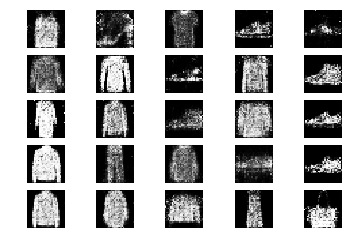

12551 [D loss: 0.695132, acc.: 50.00%] [G loss: 0.975070]
12552 [D loss: 0.678268, acc.: 57.81%] [G loss: 0.935769]
12553 [D loss: 0.676412, acc.: 53.12%] [G loss: 0.885673]
12554 [D loss: 0.668326, acc.: 53.12%] [G loss: 0.820152]
12555 [D loss: 0.728502, acc.: 50.00%] [G loss: 0.906756]
12556 [D loss: 0.626109, acc.: 64.06%] [G loss: 0.888483]
12557 [D loss: 0.678911, acc.: 54.69%] [G loss: 0.816647]
12558 [D loss: 0.677105, acc.: 53.12%] [G loss: 0.853630]
12559 [D loss: 0.575754, acc.: 70.31%] [G loss: 0.881094]
12560 [D loss: 0.648383, acc.: 60.94%] [G loss: 0.921246]
12561 [D loss: 0.574656, acc.: 68.75%] [G loss: 0.827725]
12562 [D loss: 0.598611, acc.: 64.06%] [G loss: 0.944736]
12563 [D loss: 0.602798, acc.: 59.38%] [G loss: 0.861525]
12564 [D loss: 0.728870, acc.: 54.69%] [G loss: 0.871287]
12565 [D loss: 0.588590, acc.: 75.00%] [G loss: 0.830938]
12566 [D loss: 0.630255, acc.: 60.94%] [G loss: 0.857549]
12567 [D loss: 0.764505, acc.: 45.31%] [G loss: 0.984596]
12568 [D loss:

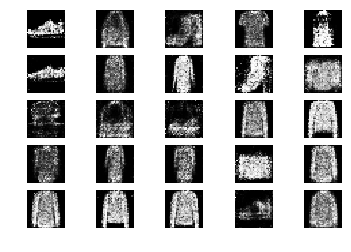

12601 [D loss: 0.649671, acc.: 60.94%] [G loss: 0.911336]
12602 [D loss: 0.585632, acc.: 76.56%] [G loss: 0.915290]
12603 [D loss: 0.643171, acc.: 60.94%] [G loss: 0.897115]
12604 [D loss: 0.618030, acc.: 65.62%] [G loss: 0.934591]
12605 [D loss: 0.620956, acc.: 65.62%] [G loss: 0.982425]
12606 [D loss: 0.629213, acc.: 68.75%] [G loss: 0.948310]
12607 [D loss: 0.694232, acc.: 59.38%] [G loss: 0.884062]
12608 [D loss: 0.697625, acc.: 57.81%] [G loss: 0.910684]
12609 [D loss: 0.631126, acc.: 64.06%] [G loss: 0.946585]
12610 [D loss: 0.619754, acc.: 70.31%] [G loss: 0.950921]
12611 [D loss: 0.660085, acc.: 64.06%] [G loss: 0.889076]
12612 [D loss: 0.693063, acc.: 57.81%] [G loss: 0.894689]
12613 [D loss: 0.731400, acc.: 50.00%] [G loss: 0.978667]
12614 [D loss: 0.672402, acc.: 62.50%] [G loss: 1.042310]
12615 [D loss: 0.659079, acc.: 59.38%] [G loss: 0.912660]
12616 [D loss: 0.671624, acc.: 59.38%] [G loss: 0.890416]
12617 [D loss: 0.686818, acc.: 60.94%] [G loss: 0.879167]
12618 [D loss:

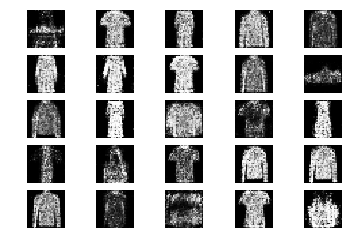

12651 [D loss: 0.655158, acc.: 59.38%] [G loss: 0.920502]
12652 [D loss: 0.630237, acc.: 65.62%] [G loss: 0.928542]
12653 [D loss: 0.667681, acc.: 62.50%] [G loss: 0.885454]
12654 [D loss: 0.623688, acc.: 62.50%] [G loss: 0.933222]
12655 [D loss: 0.683469, acc.: 53.12%] [G loss: 0.884042]
12656 [D loss: 0.651521, acc.: 56.25%] [G loss: 0.918464]
12657 [D loss: 0.689899, acc.: 50.00%] [G loss: 0.876980]
12658 [D loss: 0.719969, acc.: 53.12%] [G loss: 0.970924]
12659 [D loss: 0.605838, acc.: 73.44%] [G loss: 0.823557]
12660 [D loss: 0.697286, acc.: 59.38%] [G loss: 0.850378]
12661 [D loss: 0.683422, acc.: 62.50%] [G loss: 0.906028]
12662 [D loss: 0.608347, acc.: 67.19%] [G loss: 1.020957]
12663 [D loss: 0.697267, acc.: 54.69%] [G loss: 0.913814]
12664 [D loss: 0.657854, acc.: 64.06%] [G loss: 0.842821]
12665 [D loss: 0.651229, acc.: 57.81%] [G loss: 0.875996]
12666 [D loss: 0.645376, acc.: 60.94%] [G loss: 0.871291]
12667 [D loss: 0.628002, acc.: 67.19%] [G loss: 0.868213]
12668 [D loss:

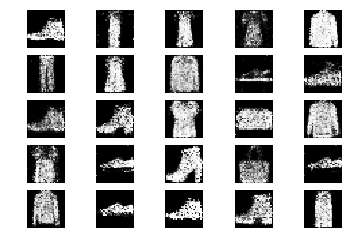

12701 [D loss: 0.727366, acc.: 51.56%] [G loss: 1.004321]
12702 [D loss: 0.651651, acc.: 60.94%] [G loss: 0.841444]
12703 [D loss: 0.692411, acc.: 57.81%] [G loss: 0.941797]
12704 [D loss: 0.689443, acc.: 59.38%] [G loss: 0.887684]
12705 [D loss: 0.682817, acc.: 62.50%] [G loss: 0.780582]
12706 [D loss: 0.598598, acc.: 67.19%] [G loss: 0.901200]
12707 [D loss: 0.695135, acc.: 57.81%] [G loss: 0.943027]
12708 [D loss: 0.588025, acc.: 71.88%] [G loss: 0.928103]
12709 [D loss: 0.645987, acc.: 64.06%] [G loss: 0.977219]
12710 [D loss: 0.608747, acc.: 62.50%] [G loss: 0.961582]
12711 [D loss: 0.637820, acc.: 62.50%] [G loss: 0.903305]
12712 [D loss: 0.664306, acc.: 62.50%] [G loss: 0.808540]
12713 [D loss: 0.731375, acc.: 45.31%] [G loss: 0.908001]
12714 [D loss: 0.671788, acc.: 56.25%] [G loss: 0.991756]
12715 [D loss: 0.636171, acc.: 64.06%] [G loss: 0.947424]
12716 [D loss: 0.643692, acc.: 62.50%] [G loss: 0.800744]
12717 [D loss: 0.640820, acc.: 57.81%] [G loss: 0.867958]
12718 [D loss:

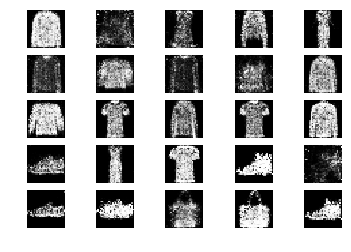

12751 [D loss: 0.616676, acc.: 65.62%] [G loss: 0.908164]
12752 [D loss: 0.737814, acc.: 53.12%] [G loss: 0.860272]
12753 [D loss: 0.643692, acc.: 62.50%] [G loss: 0.848027]
12754 [D loss: 0.626022, acc.: 65.62%] [G loss: 0.920683]
12755 [D loss: 0.663709, acc.: 56.25%] [G loss: 0.880650]
12756 [D loss: 0.669942, acc.: 54.69%] [G loss: 0.893438]
12757 [D loss: 0.621453, acc.: 65.62%] [G loss: 0.913359]
12758 [D loss: 0.615408, acc.: 70.31%] [G loss: 0.830693]
12759 [D loss: 0.630136, acc.: 62.50%] [G loss: 0.933430]
12760 [D loss: 0.657037, acc.: 53.12%] [G loss: 0.773457]
12761 [D loss: 0.671990, acc.: 64.06%] [G loss: 0.917642]
12762 [D loss: 0.652596, acc.: 60.94%] [G loss: 0.907486]
12763 [D loss: 0.643581, acc.: 62.50%] [G loss: 0.977166]
12764 [D loss: 0.642314, acc.: 56.25%] [G loss: 0.878661]
12765 [D loss: 0.634809, acc.: 70.31%] [G loss: 0.962328]
12766 [D loss: 0.704142, acc.: 50.00%] [G loss: 0.881394]
12767 [D loss: 0.659620, acc.: 56.25%] [G loss: 0.889115]
12768 [D loss:

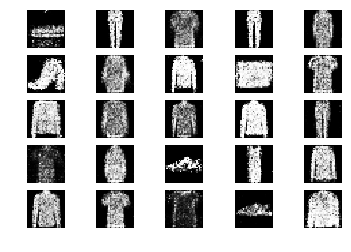

12801 [D loss: 0.641292, acc.: 60.94%] [G loss: 0.859487]
12802 [D loss: 0.692209, acc.: 57.81%] [G loss: 0.876948]
12803 [D loss: 0.704640, acc.: 56.25%] [G loss: 0.915336]
12804 [D loss: 0.630892, acc.: 62.50%] [G loss: 0.874151]
12805 [D loss: 0.650847, acc.: 59.38%] [G loss: 0.971402]
12806 [D loss: 0.617010, acc.: 65.62%] [G loss: 0.987460]
12807 [D loss: 0.650581, acc.: 59.38%] [G loss: 0.890445]
12808 [D loss: 0.615881, acc.: 71.88%] [G loss: 0.866598]
12809 [D loss: 0.664020, acc.: 62.50%] [G loss: 0.971080]
12810 [D loss: 0.652349, acc.: 62.50%] [G loss: 0.914433]
12811 [D loss: 0.657314, acc.: 54.69%] [G loss: 0.942045]
12812 [D loss: 0.697016, acc.: 54.69%] [G loss: 0.905682]
12813 [D loss: 0.634020, acc.: 62.50%] [G loss: 0.922474]
12814 [D loss: 0.668156, acc.: 57.81%] [G loss: 0.893729]
12815 [D loss: 0.629467, acc.: 64.06%] [G loss: 0.999824]
12816 [D loss: 0.601718, acc.: 68.75%] [G loss: 0.948554]
12817 [D loss: 0.661747, acc.: 67.19%] [G loss: 0.927837]
12818 [D loss:

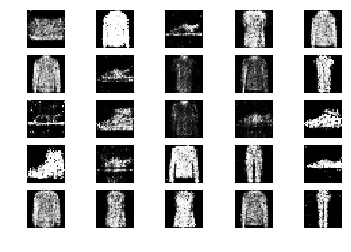

12851 [D loss: 0.647883, acc.: 64.06%] [G loss: 0.960666]
12852 [D loss: 0.677956, acc.: 54.69%] [G loss: 1.014789]
12853 [D loss: 0.630048, acc.: 62.50%] [G loss: 0.930590]
12854 [D loss: 0.615025, acc.: 60.94%] [G loss: 0.942897]
12855 [D loss: 0.658626, acc.: 60.94%] [G loss: 0.798280]
12856 [D loss: 0.715170, acc.: 50.00%] [G loss: 0.840353]
12857 [D loss: 0.702307, acc.: 51.56%] [G loss: 0.962071]
12858 [D loss: 0.603446, acc.: 65.62%] [G loss: 0.887394]
12859 [D loss: 0.647577, acc.: 67.19%] [G loss: 0.860201]
12860 [D loss: 0.638560, acc.: 64.06%] [G loss: 0.823435]
12861 [D loss: 0.635811, acc.: 67.19%] [G loss: 0.865581]
12862 [D loss: 0.648686, acc.: 68.75%] [G loss: 0.926642]
12863 [D loss: 0.605533, acc.: 78.12%] [G loss: 0.879569]
12864 [D loss: 0.675130, acc.: 56.25%] [G loss: 0.858475]
12865 [D loss: 0.672577, acc.: 56.25%] [G loss: 0.874991]
12866 [D loss: 0.612277, acc.: 68.75%] [G loss: 0.881189]
12867 [D loss: 0.585996, acc.: 68.75%] [G loss: 1.024990]
12868 [D loss:

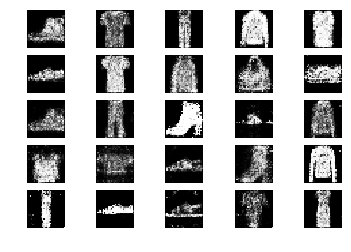

12901 [D loss: 0.684806, acc.: 53.12%] [G loss: 0.894578]
12902 [D loss: 0.605231, acc.: 65.62%] [G loss: 0.936235]
12903 [D loss: 0.658196, acc.: 65.62%] [G loss: 0.918101]
12904 [D loss: 0.614442, acc.: 68.75%] [G loss: 0.940195]
12905 [D loss: 0.662761, acc.: 57.81%] [G loss: 0.943526]
12906 [D loss: 0.662173, acc.: 57.81%] [G loss: 0.922016]
12907 [D loss: 0.600076, acc.: 67.19%] [G loss: 0.903829]
12908 [D loss: 0.661784, acc.: 64.06%] [G loss: 0.888160]
12909 [D loss: 0.662606, acc.: 60.94%] [G loss: 0.976457]
12910 [D loss: 0.707077, acc.: 57.81%] [G loss: 0.899670]
12911 [D loss: 0.676921, acc.: 54.69%] [G loss: 0.894296]
12912 [D loss: 0.680127, acc.: 56.25%] [G loss: 0.895922]
12913 [D loss: 0.650362, acc.: 65.62%] [G loss: 0.933649]
12914 [D loss: 0.630298, acc.: 59.38%] [G loss: 0.894669]
12915 [D loss: 0.625296, acc.: 68.75%] [G loss: 0.820931]
12916 [D loss: 0.671957, acc.: 51.56%] [G loss: 0.916855]
12917 [D loss: 0.682524, acc.: 50.00%] [G loss: 0.869924]
12918 [D loss:

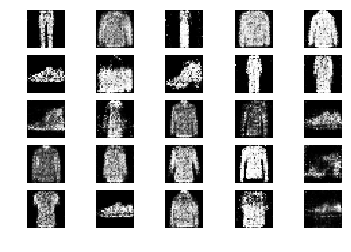

12951 [D loss: 0.580177, acc.: 71.88%] [G loss: 0.940292]
12952 [D loss: 0.645640, acc.: 64.06%] [G loss: 0.934431]
12953 [D loss: 0.628356, acc.: 67.19%] [G loss: 0.901505]
12954 [D loss: 0.589394, acc.: 70.31%] [G loss: 0.841711]
12955 [D loss: 0.650226, acc.: 60.94%] [G loss: 0.861494]
12956 [D loss: 0.681654, acc.: 48.44%] [G loss: 0.819468]
12957 [D loss: 0.668063, acc.: 68.75%] [G loss: 0.957371]
12958 [D loss: 0.646926, acc.: 65.62%] [G loss: 0.926582]
12959 [D loss: 0.682022, acc.: 56.25%] [G loss: 0.903287]
12960 [D loss: 0.626332, acc.: 59.38%] [G loss: 0.856968]
12961 [D loss: 0.676751, acc.: 56.25%] [G loss: 0.898031]
12962 [D loss: 0.647808, acc.: 57.81%] [G loss: 0.845304]
12963 [D loss: 0.733960, acc.: 48.44%] [G loss: 0.777334]
12964 [D loss: 0.686562, acc.: 51.56%] [G loss: 0.887709]
12965 [D loss: 0.666841, acc.: 54.69%] [G loss: 0.881295]
12966 [D loss: 0.677238, acc.: 51.56%] [G loss: 0.912482]
12967 [D loss: 0.692321, acc.: 46.88%] [G loss: 0.854244]
12968 [D loss:

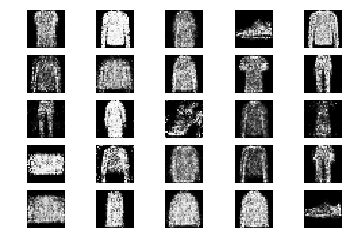

13001 [D loss: 0.664086, acc.: 57.81%] [G loss: 0.948577]
13002 [D loss: 0.610208, acc.: 67.19%] [G loss: 0.975475]
13003 [D loss: 0.614942, acc.: 56.25%] [G loss: 0.828191]
13004 [D loss: 0.571567, acc.: 76.56%] [G loss: 0.958852]
13005 [D loss: 0.703963, acc.: 53.12%] [G loss: 0.899059]
13006 [D loss: 0.650518, acc.: 54.69%] [G loss: 0.832110]
13007 [D loss: 0.627630, acc.: 67.19%] [G loss: 0.960327]
13008 [D loss: 0.675956, acc.: 59.38%] [G loss: 0.869612]
13009 [D loss: 0.698309, acc.: 54.69%] [G loss: 0.932229]
13010 [D loss: 0.631199, acc.: 60.94%] [G loss: 0.901186]
13011 [D loss: 0.635755, acc.: 65.62%] [G loss: 0.913895]
13012 [D loss: 0.646273, acc.: 62.50%] [G loss: 0.934255]
13013 [D loss: 0.667747, acc.: 67.19%] [G loss: 0.906759]
13014 [D loss: 0.603757, acc.: 68.75%] [G loss: 0.930749]
13015 [D loss: 0.703689, acc.: 54.69%] [G loss: 0.995483]
13016 [D loss: 0.644192, acc.: 60.94%] [G loss: 0.908297]
13017 [D loss: 0.679748, acc.: 59.38%] [G loss: 0.948283]
13018 [D loss:

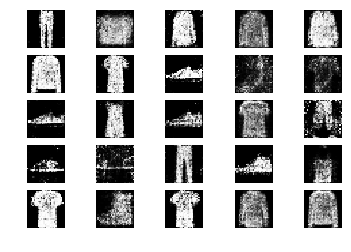

13051 [D loss: 0.671447, acc.: 57.81%] [G loss: 0.921750]
13052 [D loss: 0.688146, acc.: 51.56%] [G loss: 0.893643]
13053 [D loss: 0.661072, acc.: 59.38%] [G loss: 0.923343]
13054 [D loss: 0.728335, acc.: 46.88%] [G loss: 0.901249]
13055 [D loss: 0.645856, acc.: 62.50%] [G loss: 0.967118]
13056 [D loss: 0.644556, acc.: 67.19%] [G loss: 0.949357]
13057 [D loss: 0.636088, acc.: 54.69%] [G loss: 0.971251]
13058 [D loss: 0.708509, acc.: 51.56%] [G loss: 0.966104]
13059 [D loss: 0.630129, acc.: 62.50%] [G loss: 0.931053]
13060 [D loss: 0.699222, acc.: 59.38%] [G loss: 1.022477]
13061 [D loss: 0.654718, acc.: 60.94%] [G loss: 1.015986]
13062 [D loss: 0.683642, acc.: 51.56%] [G loss: 0.960725]
13063 [D loss: 0.619212, acc.: 67.19%] [G loss: 0.949062]
13064 [D loss: 0.670264, acc.: 60.94%] [G loss: 0.974509]
13065 [D loss: 0.674776, acc.: 59.38%] [G loss: 0.914767]
13066 [D loss: 0.665585, acc.: 56.25%] [G loss: 0.921929]
13067 [D loss: 0.597433, acc.: 64.06%] [G loss: 0.964335]
13068 [D loss:

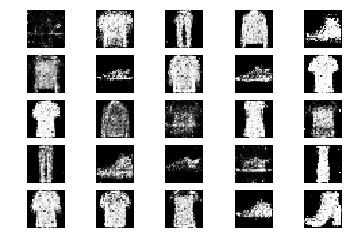

13101 [D loss: 0.623468, acc.: 65.62%] [G loss: 0.865275]
13102 [D loss: 0.638345, acc.: 65.62%] [G loss: 0.887479]
13103 [D loss: 0.594080, acc.: 73.44%] [G loss: 0.822907]
13104 [D loss: 0.686985, acc.: 57.81%] [G loss: 1.041286]
13105 [D loss: 0.633722, acc.: 64.06%] [G loss: 0.890402]
13106 [D loss: 0.659094, acc.: 53.12%] [G loss: 0.974400]
13107 [D loss: 0.645760, acc.: 53.12%] [G loss: 0.948678]
13108 [D loss: 0.716594, acc.: 53.12%] [G loss: 1.027036]
13109 [D loss: 0.620253, acc.: 67.19%] [G loss: 0.995682]
13110 [D loss: 0.707496, acc.: 57.81%] [G loss: 0.959270]
13111 [D loss: 0.723532, acc.: 48.44%] [G loss: 0.888905]
13112 [D loss: 0.691867, acc.: 57.81%] [G loss: 0.894550]
13113 [D loss: 0.659966, acc.: 62.50%] [G loss: 0.859555]
13114 [D loss: 0.594480, acc.: 70.31%] [G loss: 0.904387]
13115 [D loss: 0.679673, acc.: 56.25%] [G loss: 0.896123]
13116 [D loss: 0.670806, acc.: 60.94%] [G loss: 0.860514]
13117 [D loss: 0.710915, acc.: 53.12%] [G loss: 0.797413]
13118 [D loss:

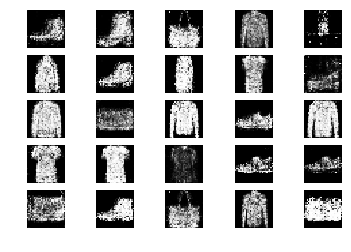

13151 [D loss: 0.623267, acc.: 64.06%] [G loss: 0.900960]
13152 [D loss: 0.587061, acc.: 67.19%] [G loss: 0.917433]
13153 [D loss: 0.669314, acc.: 56.25%] [G loss: 0.914291]
13154 [D loss: 0.658584, acc.: 64.06%] [G loss: 0.844014]
13155 [D loss: 0.588091, acc.: 65.62%] [G loss: 1.003704]
13156 [D loss: 0.663261, acc.: 59.38%] [G loss: 0.889733]
13157 [D loss: 0.692036, acc.: 54.69%] [G loss: 0.833518]
13158 [D loss: 0.669167, acc.: 59.38%] [G loss: 0.837532]
13159 [D loss: 0.716253, acc.: 54.69%] [G loss: 0.846292]
13160 [D loss: 0.637649, acc.: 70.31%] [G loss: 0.924728]
13161 [D loss: 0.715799, acc.: 54.69%] [G loss: 0.870079]
13162 [D loss: 0.587300, acc.: 67.19%] [G loss: 0.976806]
13163 [D loss: 0.627149, acc.: 65.62%] [G loss: 0.931720]
13164 [D loss: 0.687047, acc.: 53.12%] [G loss: 0.850502]
13165 [D loss: 0.714042, acc.: 57.81%] [G loss: 1.037110]
13166 [D loss: 0.655130, acc.: 65.62%] [G loss: 0.963431]
13167 [D loss: 0.698116, acc.: 57.81%] [G loss: 0.942101]
13168 [D loss:

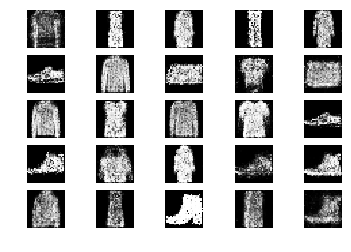

13201 [D loss: 0.609401, acc.: 70.31%] [G loss: 0.924560]
13202 [D loss: 0.641599, acc.: 67.19%] [G loss: 0.903259]
13203 [D loss: 0.690192, acc.: 51.56%] [G loss: 0.905324]
13204 [D loss: 0.644138, acc.: 64.06%] [G loss: 0.816574]
13205 [D loss: 0.596795, acc.: 78.12%] [G loss: 0.859205]
13206 [D loss: 0.636520, acc.: 65.62%] [G loss: 0.975088]
13207 [D loss: 0.661932, acc.: 56.25%] [G loss: 0.943657]
13208 [D loss: 0.611985, acc.: 62.50%] [G loss: 0.933937]
13209 [D loss: 0.643193, acc.: 59.38%] [G loss: 0.951033]
13210 [D loss: 0.658384, acc.: 65.62%] [G loss: 0.881800]
13211 [D loss: 0.657229, acc.: 57.81%] [G loss: 0.978337]
13212 [D loss: 0.656943, acc.: 64.06%] [G loss: 0.871504]
13213 [D loss: 0.667960, acc.: 56.25%] [G loss: 0.880732]
13214 [D loss: 0.700015, acc.: 60.94%] [G loss: 0.877018]
13215 [D loss: 0.630429, acc.: 65.62%] [G loss: 0.914025]
13216 [D loss: 0.587378, acc.: 70.31%] [G loss: 0.885687]
13217 [D loss: 0.697273, acc.: 57.81%] [G loss: 0.863297]
13218 [D loss:

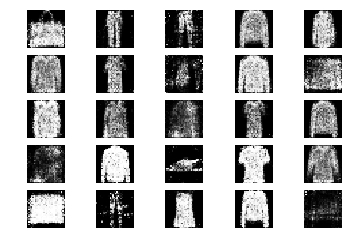

13251 [D loss: 0.660818, acc.: 59.38%] [G loss: 0.894581]
13252 [D loss: 0.680290, acc.: 53.12%] [G loss: 0.952766]
13253 [D loss: 0.691916, acc.: 53.12%] [G loss: 0.945394]
13254 [D loss: 0.635746, acc.: 59.38%] [G loss: 0.868827]
13255 [D loss: 0.675201, acc.: 59.38%] [G loss: 0.900995]
13256 [D loss: 0.682464, acc.: 54.69%] [G loss: 0.928382]
13257 [D loss: 0.670405, acc.: 56.25%] [G loss: 0.993602]
13258 [D loss: 0.653544, acc.: 54.69%] [G loss: 0.952315]
13259 [D loss: 0.651451, acc.: 60.94%] [G loss: 0.863465]
13260 [D loss: 0.608969, acc.: 65.62%] [G loss: 0.903210]
13261 [D loss: 0.646493, acc.: 62.50%] [G loss: 0.917171]
13262 [D loss: 0.651291, acc.: 60.94%] [G loss: 0.944790]
13263 [D loss: 0.631342, acc.: 60.94%] [G loss: 0.979716]
13264 [D loss: 0.642784, acc.: 59.38%] [G loss: 0.839825]
13265 [D loss: 0.620763, acc.: 62.50%] [G loss: 0.907463]
13266 [D loss: 0.679653, acc.: 57.81%] [G loss: 0.828847]
13267 [D loss: 0.715770, acc.: 57.81%] [G loss: 0.872147]
13268 [D loss:

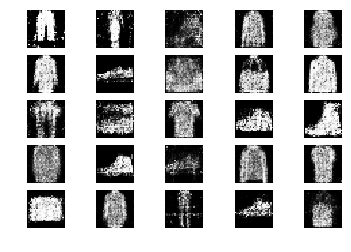

13301 [D loss: 0.593027, acc.: 67.19%] [G loss: 0.883057]
13302 [D loss: 0.661450, acc.: 60.94%] [G loss: 0.902932]
13303 [D loss: 0.697486, acc.: 60.94%] [G loss: 0.884661]
13304 [D loss: 0.629094, acc.: 65.62%] [G loss: 0.935038]
13305 [D loss: 0.650199, acc.: 57.81%] [G loss: 0.956472]
13306 [D loss: 0.627297, acc.: 70.31%] [G loss: 0.912231]
13307 [D loss: 0.644328, acc.: 62.50%] [G loss: 0.901035]
13308 [D loss: 0.691156, acc.: 53.12%] [G loss: 0.923056]
13309 [D loss: 0.590623, acc.: 65.62%] [G loss: 1.014092]
13310 [D loss: 0.682078, acc.: 57.81%] [G loss: 0.938189]
13311 [D loss: 0.588042, acc.: 70.31%] [G loss: 0.951877]
13312 [D loss: 0.667477, acc.: 56.25%] [G loss: 0.951087]
13313 [D loss: 0.691654, acc.: 48.44%] [G loss: 0.960155]
13314 [D loss: 0.684166, acc.: 60.94%] [G loss: 0.950164]
13315 [D loss: 0.644800, acc.: 59.38%] [G loss: 1.076411]
13316 [D loss: 0.621534, acc.: 65.62%] [G loss: 0.982385]
13317 [D loss: 0.655833, acc.: 57.81%] [G loss: 0.931723]
13318 [D loss:

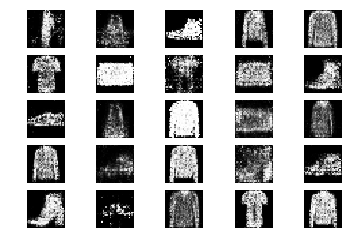

13351 [D loss: 0.682179, acc.: 60.94%] [G loss: 0.924458]
13352 [D loss: 0.626127, acc.: 62.50%] [G loss: 0.982863]
13353 [D loss: 0.737570, acc.: 50.00%] [G loss: 0.862473]
13354 [D loss: 0.632814, acc.: 59.38%] [G loss: 0.864485]
13355 [D loss: 0.659222, acc.: 76.56%] [G loss: 0.827107]
13356 [D loss: 0.670321, acc.: 57.81%] [G loss: 0.916603]
13357 [D loss: 0.699327, acc.: 50.00%] [G loss: 0.804242]
13358 [D loss: 0.660917, acc.: 57.81%] [G loss: 0.868472]
13359 [D loss: 0.691010, acc.: 57.81%] [G loss: 0.840724]
13360 [D loss: 0.605479, acc.: 67.19%] [G loss: 0.896179]
13361 [D loss: 0.665248, acc.: 64.06%] [G loss: 0.917691]
13362 [D loss: 0.715343, acc.: 50.00%] [G loss: 0.921438]
13363 [D loss: 0.621695, acc.: 67.19%] [G loss: 0.860992]
13364 [D loss: 0.628290, acc.: 67.19%] [G loss: 0.920377]
13365 [D loss: 0.685241, acc.: 57.81%] [G loss: 0.964067]
13366 [D loss: 0.713048, acc.: 50.00%] [G loss: 0.937574]
13367 [D loss: 0.678779, acc.: 57.81%] [G loss: 0.933651]
13368 [D loss:

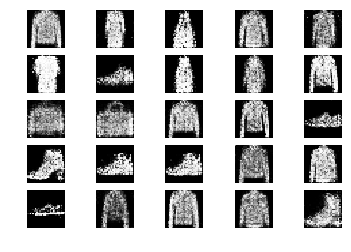

13401 [D loss: 0.665240, acc.: 57.81%] [G loss: 0.897034]
13402 [D loss: 0.718033, acc.: 48.44%] [G loss: 0.915252]
13403 [D loss: 0.661555, acc.: 56.25%] [G loss: 0.929559]
13404 [D loss: 0.652776, acc.: 62.50%] [G loss: 0.813419]
13405 [D loss: 0.670743, acc.: 62.50%] [G loss: 0.885824]
13406 [D loss: 0.612792, acc.: 68.75%] [G loss: 0.874048]
13407 [D loss: 0.666743, acc.: 57.81%] [G loss: 0.891666]
13408 [D loss: 0.627379, acc.: 62.50%] [G loss: 0.964497]
13409 [D loss: 0.668969, acc.: 60.94%] [G loss: 0.951848]
13410 [D loss: 0.675619, acc.: 53.12%] [G loss: 0.998383]
13411 [D loss: 0.623802, acc.: 67.19%] [G loss: 1.031100]
13412 [D loss: 0.591068, acc.: 78.12%] [G loss: 0.963649]
13413 [D loss: 0.618912, acc.: 73.44%] [G loss: 0.853549]
13414 [D loss: 0.684922, acc.: 54.69%] [G loss: 0.889481]
13415 [D loss: 0.672690, acc.: 57.81%] [G loss: 0.889055]
13416 [D loss: 0.617200, acc.: 60.94%] [G loss: 0.981535]
13417 [D loss: 0.656994, acc.: 57.81%] [G loss: 0.939835]
13418 [D loss:

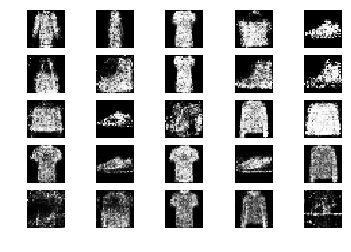

13451 [D loss: 0.692348, acc.: 59.38%] [G loss: 0.861851]
13452 [D loss: 0.657745, acc.: 60.94%] [G loss: 0.859945]
13453 [D loss: 0.676425, acc.: 64.06%] [G loss: 0.921308]
13454 [D loss: 0.694763, acc.: 60.94%] [G loss: 0.936038]
13455 [D loss: 0.696700, acc.: 57.81%] [G loss: 0.928661]
13456 [D loss: 0.683801, acc.: 56.25%] [G loss: 0.914150]
13457 [D loss: 0.555647, acc.: 75.00%] [G loss: 0.892166]
13458 [D loss: 0.617465, acc.: 68.75%] [G loss: 0.872404]
13459 [D loss: 0.674939, acc.: 60.94%] [G loss: 0.951162]
13460 [D loss: 0.619511, acc.: 67.19%] [G loss: 0.853836]
13461 [D loss: 0.631637, acc.: 64.06%] [G loss: 1.008123]
13462 [D loss: 0.631846, acc.: 64.06%] [G loss: 0.985954]
13463 [D loss: 0.659705, acc.: 56.25%] [G loss: 0.950347]
13464 [D loss: 0.702830, acc.: 54.69%] [G loss: 0.859640]
13465 [D loss: 0.638927, acc.: 64.06%] [G loss: 0.933921]
13466 [D loss: 0.658764, acc.: 60.94%] [G loss: 0.905826]
13467 [D loss: 0.701070, acc.: 54.69%] [G loss: 0.952126]
13468 [D loss:

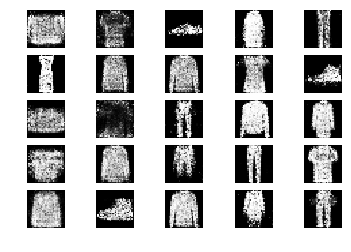

13501 [D loss: 0.617127, acc.: 68.75%] [G loss: 0.882179]
13502 [D loss: 0.694196, acc.: 60.94%] [G loss: 0.795217]
13503 [D loss: 0.735098, acc.: 50.00%] [G loss: 0.876836]
13504 [D loss: 0.648080, acc.: 65.62%] [G loss: 0.949722]
13505 [D loss: 0.638108, acc.: 60.94%] [G loss: 0.912829]
13506 [D loss: 0.591812, acc.: 70.31%] [G loss: 0.953744]
13507 [D loss: 0.666069, acc.: 59.38%] [G loss: 0.921203]
13508 [D loss: 0.656794, acc.: 67.19%] [G loss: 0.939958]
13509 [D loss: 0.690885, acc.: 48.44%] [G loss: 0.863062]
13510 [D loss: 0.663981, acc.: 57.81%] [G loss: 0.946297]
13511 [D loss: 0.641450, acc.: 68.75%] [G loss: 0.855237]
13512 [D loss: 0.667512, acc.: 57.81%] [G loss: 0.867831]
13513 [D loss: 0.618123, acc.: 65.62%] [G loss: 0.916216]
13514 [D loss: 0.645200, acc.: 65.62%] [G loss: 0.824871]
13515 [D loss: 0.709457, acc.: 54.69%] [G loss: 0.894177]
13516 [D loss: 0.633142, acc.: 65.62%] [G loss: 0.905214]
13517 [D loss: 0.738044, acc.: 50.00%] [G loss: 0.845453]
13518 [D loss:

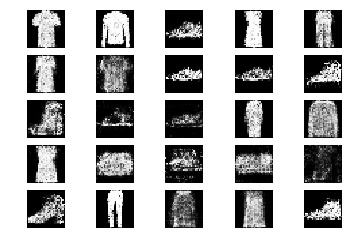

13551 [D loss: 0.664807, acc.: 53.12%] [G loss: 0.885899]
13552 [D loss: 0.616809, acc.: 68.75%] [G loss: 0.940827]
13553 [D loss: 0.643898, acc.: 68.75%] [G loss: 0.865624]
13554 [D loss: 0.726505, acc.: 50.00%] [G loss: 0.856680]
13555 [D loss: 0.659274, acc.: 59.38%] [G loss: 0.830774]
13556 [D loss: 0.623549, acc.: 70.31%] [G loss: 0.964918]
13557 [D loss: 0.611352, acc.: 65.62%] [G loss: 0.828727]
13558 [D loss: 0.661186, acc.: 62.50%] [G loss: 0.828780]
13559 [D loss: 0.633712, acc.: 64.06%] [G loss: 0.871522]
13560 [D loss: 0.629866, acc.: 60.94%] [G loss: 0.867516]
13561 [D loss: 0.578885, acc.: 75.00%] [G loss: 0.896495]
13562 [D loss: 0.630728, acc.: 59.38%] [G loss: 0.890745]
13563 [D loss: 0.719954, acc.: 48.44%] [G loss: 0.870372]
13564 [D loss: 0.562197, acc.: 71.88%] [G loss: 0.884389]
13565 [D loss: 0.645141, acc.: 60.94%] [G loss: 0.899705]
13566 [D loss: 0.624314, acc.: 67.19%] [G loss: 0.961482]
13567 [D loss: 0.682344, acc.: 50.00%] [G loss: 0.880686]
13568 [D loss:

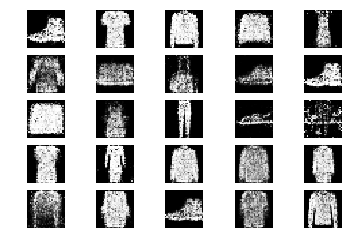

13601 [D loss: 0.655743, acc.: 50.00%] [G loss: 0.902503]
13602 [D loss: 0.630007, acc.: 62.50%] [G loss: 0.961197]
13603 [D loss: 0.647154, acc.: 64.06%] [G loss: 0.964072]
13604 [D loss: 0.657893, acc.: 62.50%] [G loss: 0.900494]
13605 [D loss: 0.614401, acc.: 64.06%] [G loss: 1.005373]
13606 [D loss: 0.597074, acc.: 68.75%] [G loss: 0.972143]
13607 [D loss: 0.638490, acc.: 64.06%] [G loss: 0.906678]
13608 [D loss: 0.616958, acc.: 65.62%] [G loss: 0.903089]
13609 [D loss: 0.670459, acc.: 59.38%] [G loss: 0.974785]
13610 [D loss: 0.696012, acc.: 53.12%] [G loss: 0.841872]
13611 [D loss: 0.654022, acc.: 62.50%] [G loss: 0.930662]
13612 [D loss: 0.638841, acc.: 65.62%] [G loss: 0.827047]
13613 [D loss: 0.631698, acc.: 65.62%] [G loss: 0.922882]
13614 [D loss: 0.628418, acc.: 62.50%] [G loss: 0.923463]
13615 [D loss: 0.705520, acc.: 53.12%] [G loss: 0.895543]
13616 [D loss: 0.654261, acc.: 57.81%] [G loss: 0.870220]
13617 [D loss: 0.651096, acc.: 56.25%] [G loss: 0.878532]
13618 [D loss:

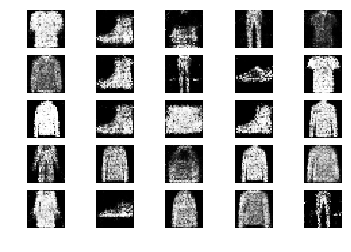

13651 [D loss: 0.628579, acc.: 70.31%] [G loss: 0.850683]
13652 [D loss: 0.641118, acc.: 60.94%] [G loss: 0.870037]
13653 [D loss: 0.633725, acc.: 59.38%] [G loss: 0.960815]
13654 [D loss: 0.659560, acc.: 60.94%] [G loss: 0.883404]
13655 [D loss: 0.672183, acc.: 54.69%] [G loss: 0.926786]
13656 [D loss: 0.629675, acc.: 71.88%] [G loss: 1.005183]
13657 [D loss: 0.632941, acc.: 60.94%] [G loss: 0.912356]
13658 [D loss: 0.693713, acc.: 60.94%] [G loss: 0.894755]
13659 [D loss: 0.586989, acc.: 64.06%] [G loss: 0.954757]
13660 [D loss: 0.653579, acc.: 59.38%] [G loss: 0.950207]
13661 [D loss: 0.599402, acc.: 59.38%] [G loss: 0.852131]
13662 [D loss: 0.609776, acc.: 64.06%] [G loss: 0.903091]
13663 [D loss: 0.642931, acc.: 62.50%] [G loss: 0.854479]
13664 [D loss: 0.640741, acc.: 68.75%] [G loss: 0.900862]
13665 [D loss: 0.625960, acc.: 57.81%] [G loss: 0.950480]
13666 [D loss: 0.663884, acc.: 54.69%] [G loss: 0.951753]
13667 [D loss: 0.639267, acc.: 70.31%] [G loss: 1.034660]
13668 [D loss:

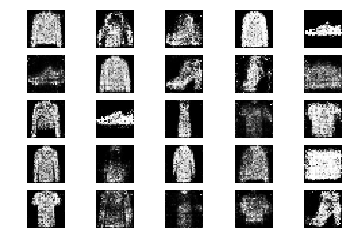

13701 [D loss: 0.598796, acc.: 73.44%] [G loss: 0.902210]
13702 [D loss: 0.613611, acc.: 70.31%] [G loss: 0.786769]
13703 [D loss: 0.691970, acc.: 59.38%] [G loss: 0.907780]
13704 [D loss: 0.666901, acc.: 57.81%] [G loss: 0.858568]
13705 [D loss: 0.765967, acc.: 45.31%] [G loss: 0.867067]
13706 [D loss: 0.579170, acc.: 71.88%] [G loss: 0.919362]
13707 [D loss: 0.648459, acc.: 60.94%] [G loss: 0.877917]
13708 [D loss: 0.618247, acc.: 67.19%] [G loss: 0.849793]
13709 [D loss: 0.605270, acc.: 65.62%] [G loss: 0.862809]
13710 [D loss: 0.689092, acc.: 54.69%] [G loss: 0.843220]
13711 [D loss: 0.692543, acc.: 50.00%] [G loss: 0.826623]
13712 [D loss: 0.700671, acc.: 51.56%] [G loss: 0.928872]
13713 [D loss: 0.640651, acc.: 67.19%] [G loss: 0.943531]
13714 [D loss: 0.664997, acc.: 68.75%] [G loss: 0.854570]
13715 [D loss: 0.755868, acc.: 54.69%] [G loss: 1.007060]
13716 [D loss: 0.656974, acc.: 53.12%] [G loss: 0.915651]
13717 [D loss: 0.613007, acc.: 71.88%] [G loss: 0.906182]
13718 [D loss:

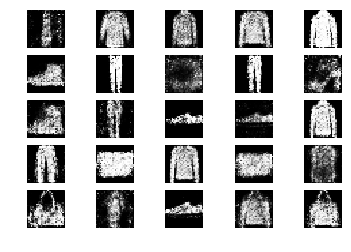

13751 [D loss: 0.637869, acc.: 60.94%] [G loss: 0.953760]
13752 [D loss: 0.681789, acc.: 56.25%] [G loss: 0.879820]
13753 [D loss: 0.645820, acc.: 64.06%] [G loss: 0.866738]
13754 [D loss: 0.693279, acc.: 60.94%] [G loss: 0.879431]
13755 [D loss: 0.648593, acc.: 60.94%] [G loss: 0.841005]
13756 [D loss: 0.626731, acc.: 64.06%] [G loss: 0.953184]
13757 [D loss: 0.693073, acc.: 62.50%] [G loss: 0.905189]
13758 [D loss: 0.608266, acc.: 65.62%] [G loss: 0.877275]
13759 [D loss: 0.547729, acc.: 82.81%] [G loss: 0.958088]
13760 [D loss: 0.726671, acc.: 53.12%] [G loss: 0.944494]
13761 [D loss: 0.667432, acc.: 62.50%] [G loss: 0.915272]
13762 [D loss: 0.683507, acc.: 60.94%] [G loss: 0.916801]
13763 [D loss: 0.649803, acc.: 67.19%] [G loss: 0.856834]
13764 [D loss: 0.659377, acc.: 59.38%] [G loss: 0.984572]
13765 [D loss: 0.695289, acc.: 62.50%] [G loss: 0.872271]
13766 [D loss: 0.663417, acc.: 59.38%] [G loss: 0.828299]
13767 [D loss: 0.693715, acc.: 59.38%] [G loss: 0.823535]
13768 [D loss:

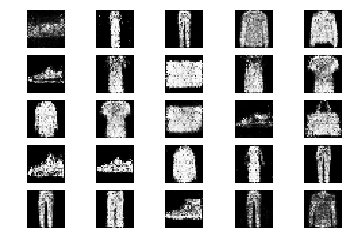

13801 [D loss: 0.665756, acc.: 54.69%] [G loss: 0.969398]
13802 [D loss: 0.627975, acc.: 70.31%] [G loss: 0.871779]
13803 [D loss: 0.691945, acc.: 54.69%] [G loss: 0.989570]
13804 [D loss: 0.632661, acc.: 62.50%] [G loss: 0.892093]
13805 [D loss: 0.626771, acc.: 64.06%] [G loss: 0.949795]
13806 [D loss: 0.590498, acc.: 70.31%] [G loss: 0.901182]
13807 [D loss: 0.680126, acc.: 57.81%] [G loss: 0.940546]
13808 [D loss: 0.613239, acc.: 67.19%] [G loss: 0.964942]
13809 [D loss: 0.667092, acc.: 57.81%] [G loss: 0.919223]
13810 [D loss: 0.663076, acc.: 56.25%] [G loss: 0.919727]
13811 [D loss: 0.691305, acc.: 54.69%] [G loss: 0.888003]
13812 [D loss: 0.572490, acc.: 71.88%] [G loss: 1.023663]
13813 [D loss: 0.646374, acc.: 56.25%] [G loss: 0.913204]
13814 [D loss: 0.656759, acc.: 53.12%] [G loss: 0.873222]
13815 [D loss: 0.677153, acc.: 60.94%] [G loss: 0.959006]
13816 [D loss: 0.661367, acc.: 57.81%] [G loss: 1.027065]
13817 [D loss: 0.671606, acc.: 59.38%] [G loss: 0.956852]
13818 [D loss:

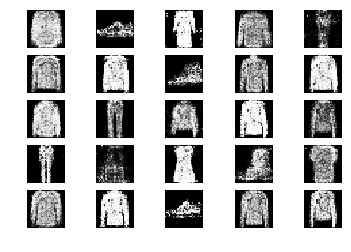

13851 [D loss: 0.705966, acc.: 48.44%] [G loss: 0.913670]
13852 [D loss: 0.604701, acc.: 70.31%] [G loss: 0.846128]
13853 [D loss: 0.688750, acc.: 56.25%] [G loss: 0.798105]
13854 [D loss: 0.758078, acc.: 43.75%] [G loss: 0.937434]
13855 [D loss: 0.708185, acc.: 54.69%] [G loss: 0.908445]
13856 [D loss: 0.647168, acc.: 65.62%] [G loss: 1.012147]
13857 [D loss: 0.670636, acc.: 59.38%] [G loss: 0.963168]
13858 [D loss: 0.701043, acc.: 51.56%] [G loss: 0.909781]
13859 [D loss: 0.606446, acc.: 71.88%] [G loss: 0.929292]
13860 [D loss: 0.718743, acc.: 50.00%] [G loss: 0.883867]
13861 [D loss: 0.595496, acc.: 67.19%] [G loss: 0.866643]
13862 [D loss: 0.647981, acc.: 57.81%] [G loss: 0.891239]
13863 [D loss: 0.671398, acc.: 57.81%] [G loss: 0.914603]
13864 [D loss: 0.663099, acc.: 54.69%] [G loss: 0.836486]
13865 [D loss: 0.735059, acc.: 50.00%] [G loss: 0.841098]
13866 [D loss: 0.650895, acc.: 62.50%] [G loss: 1.026582]
13867 [D loss: 0.659718, acc.: 54.69%] [G loss: 0.890153]
13868 [D loss:

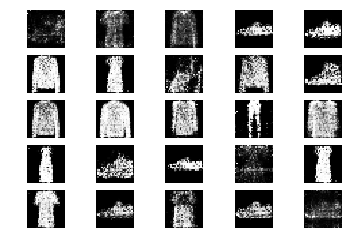

13901 [D loss: 0.640887, acc.: 65.62%] [G loss: 0.882483]
13902 [D loss: 0.705576, acc.: 57.81%] [G loss: 0.889766]
13903 [D loss: 0.666184, acc.: 62.50%] [G loss: 0.898718]
13904 [D loss: 0.631535, acc.: 64.06%] [G loss: 0.979743]
13905 [D loss: 0.586307, acc.: 73.44%] [G loss: 0.909431]
13906 [D loss: 0.601708, acc.: 68.75%] [G loss: 0.933061]
13907 [D loss: 0.632280, acc.: 70.31%] [G loss: 0.878410]
13908 [D loss: 0.633978, acc.: 67.19%] [G loss: 0.970933]
13909 [D loss: 0.674970, acc.: 53.12%] [G loss: 1.052229]
13910 [D loss: 0.705573, acc.: 46.88%] [G loss: 0.968734]
13911 [D loss: 0.617673, acc.: 67.19%] [G loss: 0.842031]
13912 [D loss: 0.648674, acc.: 68.75%] [G loss: 0.822586]
13913 [D loss: 0.633425, acc.: 64.06%] [G loss: 0.927776]
13914 [D loss: 0.675231, acc.: 59.38%] [G loss: 0.845118]
13915 [D loss: 0.662932, acc.: 60.94%] [G loss: 0.915703]
13916 [D loss: 0.569975, acc.: 76.56%] [G loss: 0.904083]
13917 [D loss: 0.644766, acc.: 54.69%] [G loss: 0.841411]
13918 [D loss:

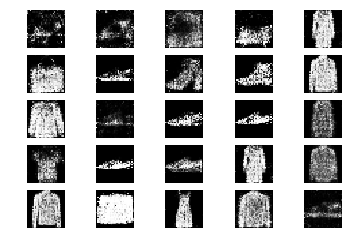

13951 [D loss: 0.632125, acc.: 65.62%] [G loss: 0.842095]
13952 [D loss: 0.687008, acc.: 57.81%] [G loss: 0.924737]
13953 [D loss: 0.604079, acc.: 70.31%] [G loss: 0.921641]
13954 [D loss: 0.570537, acc.: 73.44%] [G loss: 0.896498]
13955 [D loss: 0.650660, acc.: 65.62%] [G loss: 0.889729]
13956 [D loss: 0.574306, acc.: 73.44%] [G loss: 0.925172]
13957 [D loss: 0.672465, acc.: 54.69%] [G loss: 0.993716]
13958 [D loss: 0.688783, acc.: 51.56%] [G loss: 0.995625]
13959 [D loss: 0.614376, acc.: 65.62%] [G loss: 0.891334]
13960 [D loss: 0.651350, acc.: 53.12%] [G loss: 0.965687]
13961 [D loss: 0.682708, acc.: 53.12%] [G loss: 0.884280]
13962 [D loss: 0.673797, acc.: 59.38%] [G loss: 0.906982]
13963 [D loss: 0.670746, acc.: 51.56%] [G loss: 0.879432]
13964 [D loss: 0.631249, acc.: 65.62%] [G loss: 0.884612]
13965 [D loss: 0.707833, acc.: 62.50%] [G loss: 0.860481]
13966 [D loss: 0.685539, acc.: 57.81%] [G loss: 0.840804]
13967 [D loss: 0.708956, acc.: 45.31%] [G loss: 0.818160]
13968 [D loss:

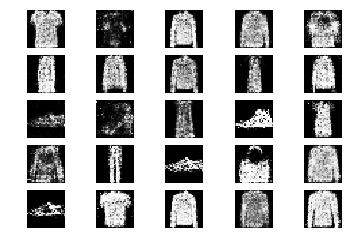

14001 [D loss: 0.682505, acc.: 62.50%] [G loss: 0.861785]
14002 [D loss: 0.676595, acc.: 51.56%] [G loss: 0.940623]
14003 [D loss: 0.615917, acc.: 67.19%] [G loss: 1.005488]
14004 [D loss: 0.580495, acc.: 70.31%] [G loss: 1.007800]
14005 [D loss: 0.619457, acc.: 67.19%] [G loss: 0.999274]
14006 [D loss: 0.727114, acc.: 51.56%] [G loss: 0.885316]
14007 [D loss: 0.673053, acc.: 54.69%] [G loss: 0.828420]
14008 [D loss: 0.685424, acc.: 62.50%] [G loss: 0.853840]
14009 [D loss: 0.695105, acc.: 59.38%] [G loss: 0.859401]
14010 [D loss: 0.631687, acc.: 59.38%] [G loss: 0.785836]
14011 [D loss: 0.612900, acc.: 68.75%] [G loss: 0.784160]
14012 [D loss: 0.694807, acc.: 53.12%] [G loss: 0.837828]
14013 [D loss: 0.633607, acc.: 64.06%] [G loss: 0.948106]
14014 [D loss: 0.634753, acc.: 68.75%] [G loss: 0.961061]
14015 [D loss: 0.675668, acc.: 54.69%] [G loss: 0.910587]
14016 [D loss: 0.698335, acc.: 46.88%] [G loss: 1.010240]
14017 [D loss: 0.689464, acc.: 57.81%] [G loss: 0.946124]
14018 [D loss:

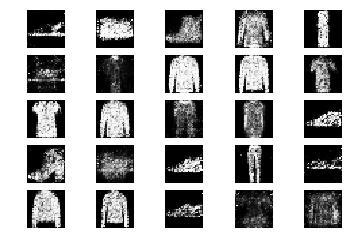

14051 [D loss: 0.664185, acc.: 62.50%] [G loss: 0.922606]
14052 [D loss: 0.664167, acc.: 62.50%] [G loss: 1.001414]
14053 [D loss: 0.708524, acc.: 50.00%] [G loss: 0.861501]
14054 [D loss: 0.688766, acc.: 56.25%] [G loss: 0.909972]
14055 [D loss: 0.598384, acc.: 64.06%] [G loss: 0.831652]
14056 [D loss: 0.654748, acc.: 62.50%] [G loss: 0.879782]
14057 [D loss: 0.602121, acc.: 68.75%] [G loss: 0.835561]
14058 [D loss: 0.663763, acc.: 64.06%] [G loss: 0.903012]
14059 [D loss: 0.693664, acc.: 59.38%] [G loss: 0.868245]
14060 [D loss: 0.644573, acc.: 64.06%] [G loss: 0.947329]
14061 [D loss: 0.620294, acc.: 64.06%] [G loss: 0.873632]
14062 [D loss: 0.670429, acc.: 57.81%] [G loss: 0.911835]
14063 [D loss: 0.669603, acc.: 62.50%] [G loss: 0.973272]
14064 [D loss: 0.629124, acc.: 59.38%] [G loss: 0.870256]
14065 [D loss: 0.665851, acc.: 57.81%] [G loss: 0.889904]
14066 [D loss: 0.607103, acc.: 67.19%] [G loss: 0.965100]
14067 [D loss: 0.653720, acc.: 62.50%] [G loss: 0.864410]
14068 [D loss:

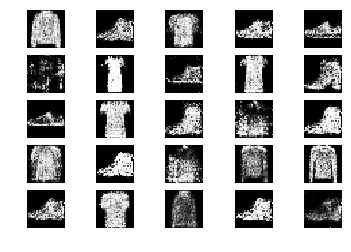

14101 [D loss: 0.646897, acc.: 60.94%] [G loss: 0.930743]
14102 [D loss: 0.658638, acc.: 62.50%] [G loss: 0.867278]
14103 [D loss: 0.619520, acc.: 65.62%] [G loss: 0.781308]
14104 [D loss: 0.701423, acc.: 51.56%] [G loss: 0.894843]
14105 [D loss: 0.656678, acc.: 60.94%] [G loss: 0.971855]
14106 [D loss: 0.597148, acc.: 65.62%] [G loss: 0.951893]
14107 [D loss: 0.622696, acc.: 68.75%] [G loss: 0.884416]
14108 [D loss: 0.626215, acc.: 68.75%] [G loss: 0.911457]
14109 [D loss: 0.649938, acc.: 62.50%] [G loss: 0.936382]
14110 [D loss: 0.631844, acc.: 65.62%] [G loss: 0.817423]
14111 [D loss: 0.569962, acc.: 68.75%] [G loss: 0.830601]
14112 [D loss: 0.716655, acc.: 57.81%] [G loss: 0.881862]
14113 [D loss: 0.554377, acc.: 70.31%] [G loss: 0.885578]
14114 [D loss: 0.645077, acc.: 64.06%] [G loss: 0.842718]
14115 [D loss: 0.662914, acc.: 59.38%] [G loss: 0.868883]
14116 [D loss: 0.595250, acc.: 71.88%] [G loss: 0.953198]
14117 [D loss: 0.673515, acc.: 59.38%] [G loss: 0.893896]
14118 [D loss:

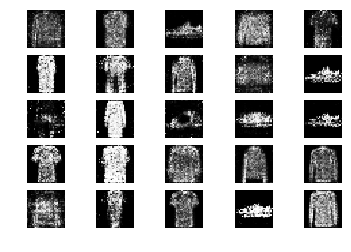

14151 [D loss: 0.683373, acc.: 48.44%] [G loss: 0.939640]
14152 [D loss: 0.667403, acc.: 59.38%] [G loss: 0.865585]
14153 [D loss: 0.659488, acc.: 62.50%] [G loss: 0.921040]
14154 [D loss: 0.649084, acc.: 57.81%] [G loss: 0.859656]
14155 [D loss: 0.689072, acc.: 54.69%] [G loss: 0.942509]
14156 [D loss: 0.658601, acc.: 57.81%] [G loss: 0.886613]
14157 [D loss: 0.676474, acc.: 54.69%] [G loss: 0.942167]
14158 [D loss: 0.637562, acc.: 60.94%] [G loss: 0.966110]
14159 [D loss: 0.678456, acc.: 60.94%] [G loss: 0.857731]
14160 [D loss: 0.653299, acc.: 67.19%] [G loss: 0.958758]
14161 [D loss: 0.628031, acc.: 67.19%] [G loss: 0.870160]
14162 [D loss: 0.721418, acc.: 46.88%] [G loss: 0.866750]
14163 [D loss: 0.624299, acc.: 57.81%] [G loss: 0.885978]
14164 [D loss: 0.666672, acc.: 54.69%] [G loss: 0.877082]
14165 [D loss: 0.682731, acc.: 54.69%] [G loss: 0.786318]
14166 [D loss: 0.689802, acc.: 54.69%] [G loss: 0.937325]
14167 [D loss: 0.736795, acc.: 50.00%] [G loss: 0.896648]
14168 [D loss:

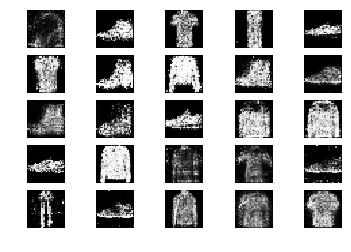

14201 [D loss: 0.625262, acc.: 68.75%] [G loss: 0.916278]
14202 [D loss: 0.734770, acc.: 48.44%] [G loss: 0.877310]
14203 [D loss: 0.563860, acc.: 71.88%] [G loss: 0.845843]
14204 [D loss: 0.645495, acc.: 68.75%] [G loss: 0.833673]
14205 [D loss: 0.619135, acc.: 64.06%] [G loss: 0.903720]
14206 [D loss: 0.621948, acc.: 57.81%] [G loss: 0.961286]
14207 [D loss: 0.699250, acc.: 54.69%] [G loss: 0.921128]
14208 [D loss: 0.641112, acc.: 54.69%] [G loss: 0.934833]
14209 [D loss: 0.610237, acc.: 73.44%] [G loss: 0.944750]
14210 [D loss: 0.658180, acc.: 60.94%] [G loss: 0.959538]
14211 [D loss: 0.661945, acc.: 62.50%] [G loss: 0.843600]
14212 [D loss: 0.604744, acc.: 65.62%] [G loss: 0.990227]
14213 [D loss: 0.674480, acc.: 57.81%] [G loss: 0.890130]
14214 [D loss: 0.657915, acc.: 56.25%] [G loss: 0.997147]
14215 [D loss: 0.689460, acc.: 51.56%] [G loss: 0.953841]
14216 [D loss: 0.654619, acc.: 62.50%] [G loss: 0.925527]
14217 [D loss: 0.675944, acc.: 57.81%] [G loss: 0.948331]
14218 [D loss:

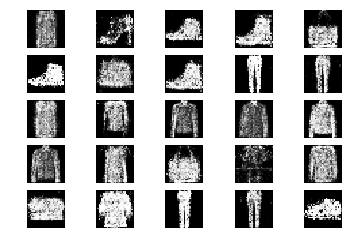

14251 [D loss: 0.662722, acc.: 64.06%] [G loss: 0.891416]
14252 [D loss: 0.662838, acc.: 60.94%] [G loss: 0.855451]
14253 [D loss: 0.626943, acc.: 64.06%] [G loss: 0.835086]
14254 [D loss: 0.659364, acc.: 64.06%] [G loss: 0.873201]
14255 [D loss: 0.689097, acc.: 60.94%] [G loss: 0.851426]
14256 [D loss: 0.615162, acc.: 68.75%] [G loss: 0.983458]
14257 [D loss: 0.690687, acc.: 53.12%] [G loss: 0.936467]
14258 [D loss: 0.602406, acc.: 73.44%] [G loss: 0.900061]
14259 [D loss: 0.675606, acc.: 56.25%] [G loss: 0.875241]
14260 [D loss: 0.668555, acc.: 56.25%] [G loss: 0.980115]
14261 [D loss: 0.681659, acc.: 54.69%] [G loss: 0.953534]
14262 [D loss: 0.648851, acc.: 59.38%] [G loss: 0.891112]
14263 [D loss: 0.717421, acc.: 53.12%] [G loss: 0.955575]
14264 [D loss: 0.762145, acc.: 54.69%] [G loss: 0.906051]
14265 [D loss: 0.606194, acc.: 68.75%] [G loss: 0.941180]
14266 [D loss: 0.657575, acc.: 62.50%] [G loss: 0.947355]
14267 [D loss: 0.652123, acc.: 65.62%] [G loss: 0.949236]
14268 [D loss:

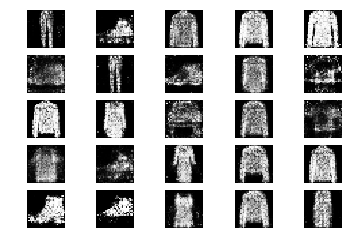

14301 [D loss: 0.670273, acc.: 59.38%] [G loss: 1.061869]
14302 [D loss: 0.620183, acc.: 62.50%] [G loss: 0.959663]
14303 [D loss: 0.666063, acc.: 62.50%] [G loss: 0.952660]
14304 [D loss: 0.685623, acc.: 57.81%] [G loss: 0.810225]
14305 [D loss: 0.633372, acc.: 68.75%] [G loss: 0.866790]
14306 [D loss: 0.638422, acc.: 64.06%] [G loss: 0.852558]
14307 [D loss: 0.586662, acc.: 67.19%] [G loss: 0.921641]
14308 [D loss: 0.684749, acc.: 51.56%] [G loss: 0.903303]
14309 [D loss: 0.624566, acc.: 71.88%] [G loss: 0.894526]
14310 [D loss: 0.629328, acc.: 65.62%] [G loss: 0.906496]
14311 [D loss: 0.632234, acc.: 65.62%] [G loss: 0.855315]
14312 [D loss: 0.662426, acc.: 59.38%] [G loss: 0.870615]
14313 [D loss: 0.598796, acc.: 64.06%] [G loss: 0.783822]
14314 [D loss: 0.619644, acc.: 65.62%] [G loss: 0.780814]
14315 [D loss: 0.709458, acc.: 50.00%] [G loss: 0.882117]
14316 [D loss: 0.622485, acc.: 60.94%] [G loss: 0.926204]
14317 [D loss: 0.601595, acc.: 67.19%] [G loss: 0.930057]
14318 [D loss:

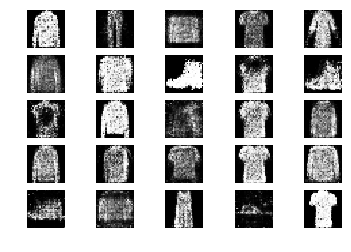

14351 [D loss: 0.728210, acc.: 57.81%] [G loss: 0.931072]
14352 [D loss: 0.665366, acc.: 62.50%] [G loss: 0.880090]
14353 [D loss: 0.693343, acc.: 43.75%] [G loss: 0.831898]
14354 [D loss: 0.629215, acc.: 65.62%] [G loss: 0.895647]
14355 [D loss: 0.637875, acc.: 60.94%] [G loss: 0.883328]
14356 [D loss: 0.674838, acc.: 62.50%] [G loss: 0.902417]
14357 [D loss: 0.657039, acc.: 57.81%] [G loss: 0.862018]
14358 [D loss: 0.624938, acc.: 65.62%] [G loss: 0.904760]
14359 [D loss: 0.667902, acc.: 62.50%] [G loss: 0.905293]
14360 [D loss: 0.679403, acc.: 56.25%] [G loss: 0.982236]
14361 [D loss: 0.668917, acc.: 59.38%] [G loss: 0.979574]
14362 [D loss: 0.596452, acc.: 68.75%] [G loss: 0.978572]
14363 [D loss: 0.763956, acc.: 46.88%] [G loss: 0.881716]
14364 [D loss: 0.662485, acc.: 59.38%] [G loss: 0.854551]
14365 [D loss: 0.720690, acc.: 45.31%] [G loss: 0.931296]
14366 [D loss: 0.710952, acc.: 51.56%] [G loss: 0.929889]
14367 [D loss: 0.632761, acc.: 64.06%] [G loss: 0.880789]
14368 [D loss:

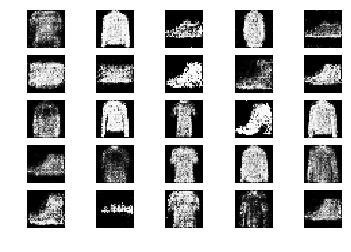

14401 [D loss: 0.638849, acc.: 62.50%] [G loss: 0.863003]
14402 [D loss: 0.688604, acc.: 51.56%] [G loss: 0.882238]
14403 [D loss: 0.658962, acc.: 59.38%] [G loss: 0.932446]
14404 [D loss: 0.725893, acc.: 50.00%] [G loss: 0.883980]
14405 [D loss: 0.662520, acc.: 54.69%] [G loss: 0.820678]
14406 [D loss: 0.628989, acc.: 64.06%] [G loss: 0.835704]
14407 [D loss: 0.612322, acc.: 73.44%] [G loss: 0.843237]
14408 [D loss: 0.632368, acc.: 65.62%] [G loss: 0.908343]
14409 [D loss: 0.621934, acc.: 62.50%] [G loss: 0.894414]
14410 [D loss: 0.652083, acc.: 57.81%] [G loss: 0.901112]
14411 [D loss: 0.606170, acc.: 68.75%] [G loss: 0.934244]
14412 [D loss: 0.636768, acc.: 62.50%] [G loss: 0.897947]
14413 [D loss: 0.738739, acc.: 50.00%] [G loss: 0.909924]
14414 [D loss: 0.658876, acc.: 62.50%] [G loss: 1.050900]
14415 [D loss: 0.684720, acc.: 57.81%] [G loss: 0.874744]
14416 [D loss: 0.676065, acc.: 54.69%] [G loss: 0.935596]
14417 [D loss: 0.631987, acc.: 64.06%] [G loss: 0.870681]
14418 [D loss:

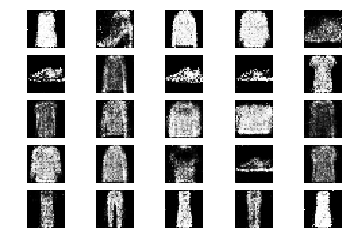

14451 [D loss: 0.701005, acc.: 59.38%] [G loss: 0.882990]
14452 [D loss: 0.673942, acc.: 57.81%] [G loss: 0.838137]
14453 [D loss: 0.673275, acc.: 56.25%] [G loss: 0.892057]
14454 [D loss: 0.669903, acc.: 57.81%] [G loss: 0.873730]
14455 [D loss: 0.581599, acc.: 65.62%] [G loss: 0.904421]
14456 [D loss: 0.680394, acc.: 56.25%] [G loss: 0.917211]
14457 [D loss: 0.674831, acc.: 57.81%] [G loss: 0.890562]
14458 [D loss: 0.636977, acc.: 60.94%] [G loss: 0.971915]
14459 [D loss: 0.639689, acc.: 60.94%] [G loss: 0.926332]
14460 [D loss: 0.635905, acc.: 57.81%] [G loss: 0.900340]
14461 [D loss: 0.663190, acc.: 60.94%] [G loss: 0.905568]
14462 [D loss: 0.657789, acc.: 54.69%] [G loss: 0.888877]
14463 [D loss: 0.625171, acc.: 57.81%] [G loss: 0.918916]
14464 [D loss: 0.620945, acc.: 62.50%] [G loss: 0.905662]
14465 [D loss: 0.669441, acc.: 67.19%] [G loss: 0.915154]
14466 [D loss: 0.607908, acc.: 62.50%] [G loss: 0.901771]
14467 [D loss: 0.630026, acc.: 65.62%] [G loss: 0.948226]
14468 [D loss:

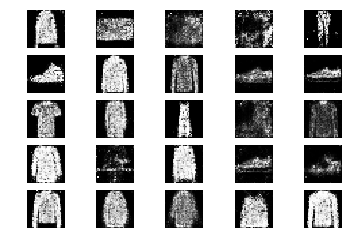

14501 [D loss: 0.672702, acc.: 56.25%] [G loss: 0.854288]
14502 [D loss: 0.675013, acc.: 56.25%] [G loss: 0.845991]
14503 [D loss: 0.653597, acc.: 57.81%] [G loss: 0.912166]
14504 [D loss: 0.694709, acc.: 50.00%] [G loss: 0.947198]
14505 [D loss: 0.664213, acc.: 60.94%] [G loss: 0.839523]
14506 [D loss: 0.667143, acc.: 59.38%] [G loss: 0.814054]
14507 [D loss: 0.653923, acc.: 64.06%] [G loss: 0.885941]
14508 [D loss: 0.701828, acc.: 51.56%] [G loss: 0.863511]
14509 [D loss: 0.613791, acc.: 67.19%] [G loss: 0.776974]
14510 [D loss: 0.643784, acc.: 64.06%] [G loss: 0.812856]
14511 [D loss: 0.726456, acc.: 56.25%] [G loss: 0.891386]
14512 [D loss: 0.660760, acc.: 64.06%] [G loss: 0.800795]
14513 [D loss: 0.671757, acc.: 54.69%] [G loss: 0.873727]
14514 [D loss: 0.674749, acc.: 57.81%] [G loss: 0.902650]
14515 [D loss: 0.632615, acc.: 64.06%] [G loss: 0.883903]
14516 [D loss: 0.621525, acc.: 62.50%] [G loss: 0.990870]
14517 [D loss: 0.638717, acc.: 59.38%] [G loss: 0.982205]
14518 [D loss:

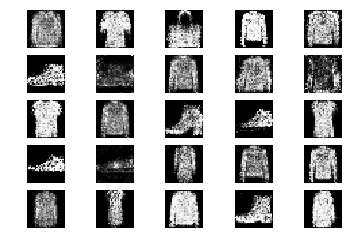

14551 [D loss: 0.603930, acc.: 64.06%] [G loss: 0.863684]
14552 [D loss: 0.691482, acc.: 59.38%] [G loss: 0.900840]
14553 [D loss: 0.645825, acc.: 59.38%] [G loss: 0.886875]
14554 [D loss: 0.637817, acc.: 59.38%] [G loss: 0.902042]
14555 [D loss: 0.688137, acc.: 53.12%] [G loss: 0.846081]
14556 [D loss: 0.642560, acc.: 64.06%] [G loss: 0.902861]
14557 [D loss: 0.697208, acc.: 59.38%] [G loss: 0.841846]
14558 [D loss: 0.648774, acc.: 60.94%] [G loss: 0.874001]
14559 [D loss: 0.644386, acc.: 68.75%] [G loss: 0.928788]
14560 [D loss: 0.633089, acc.: 60.94%] [G loss: 0.922776]
14561 [D loss: 0.651926, acc.: 68.75%] [G loss: 0.824114]
14562 [D loss: 0.664913, acc.: 65.62%] [G loss: 0.891076]
14563 [D loss: 0.649776, acc.: 57.81%] [G loss: 0.927468]
14564 [D loss: 0.662435, acc.: 53.12%] [G loss: 0.871158]
14565 [D loss: 0.695996, acc.: 53.12%] [G loss: 0.965865]
14566 [D loss: 0.705145, acc.: 60.94%] [G loss: 0.852908]
14567 [D loss: 0.634300, acc.: 62.50%] [G loss: 0.995960]
14568 [D loss:

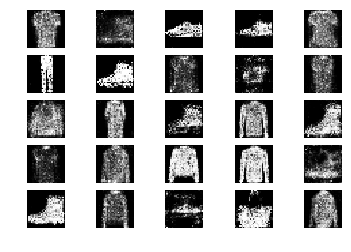

14601 [D loss: 0.671890, acc.: 51.56%] [G loss: 0.871416]
14602 [D loss: 0.702952, acc.: 56.25%] [G loss: 0.979062]
14603 [D loss: 0.630022, acc.: 65.62%] [G loss: 1.018380]
14604 [D loss: 0.651511, acc.: 59.38%] [G loss: 0.954670]
14605 [D loss: 0.677888, acc.: 56.25%] [G loss: 0.913103]
14606 [D loss: 0.657707, acc.: 57.81%] [G loss: 0.874168]
14607 [D loss: 0.640456, acc.: 65.62%] [G loss: 0.830465]
14608 [D loss: 0.670328, acc.: 48.44%] [G loss: 0.804025]
14609 [D loss: 0.626522, acc.: 64.06%] [G loss: 0.911935]
14610 [D loss: 0.645897, acc.: 67.19%] [G loss: 0.934516]
14611 [D loss: 0.626862, acc.: 67.19%] [G loss: 0.885552]
14612 [D loss: 0.703502, acc.: 50.00%] [G loss: 0.833459]
14613 [D loss: 0.615873, acc.: 67.19%] [G loss: 0.866515]
14614 [D loss: 0.687899, acc.: 57.81%] [G loss: 0.867426]
14615 [D loss: 0.689220, acc.: 57.81%] [G loss: 0.906283]
14616 [D loss: 0.660965, acc.: 62.50%] [G loss: 0.930879]
14617 [D loss: 0.730452, acc.: 43.75%] [G loss: 0.897891]
14618 [D loss:

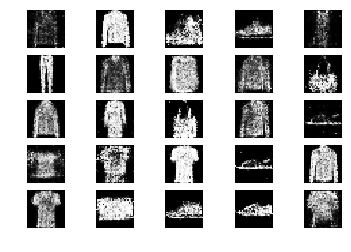

14651 [D loss: 0.677000, acc.: 56.25%] [G loss: 0.825793]
14652 [D loss: 0.652203, acc.: 59.38%] [G loss: 0.928016]
14653 [D loss: 0.635661, acc.: 70.31%] [G loss: 0.890324]
14654 [D loss: 0.656603, acc.: 60.94%] [G loss: 0.916631]
14655 [D loss: 0.592954, acc.: 76.56%] [G loss: 0.836476]
14656 [D loss: 0.591532, acc.: 71.88%] [G loss: 0.847761]
14657 [D loss: 0.641462, acc.: 62.50%] [G loss: 0.862224]
14658 [D loss: 0.691374, acc.: 60.94%] [G loss: 0.931429]
14659 [D loss: 0.676721, acc.: 54.69%] [G loss: 0.871446]
14660 [D loss: 0.657785, acc.: 67.19%] [G loss: 0.906235]
14661 [D loss: 0.695034, acc.: 51.56%] [G loss: 0.939137]
14662 [D loss: 0.701770, acc.: 54.69%] [G loss: 0.901160]
14663 [D loss: 0.651988, acc.: 57.81%] [G loss: 0.818372]
14664 [D loss: 0.672170, acc.: 54.69%] [G loss: 0.886029]
14665 [D loss: 0.703405, acc.: 56.25%] [G loss: 0.945390]
14666 [D loss: 0.614966, acc.: 73.44%] [G loss: 0.994376]
14667 [D loss: 0.653254, acc.: 65.62%] [G loss: 0.966546]
14668 [D loss:

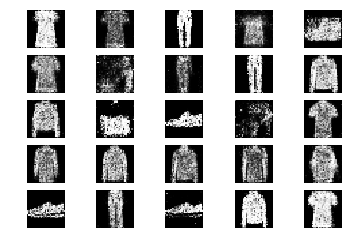

14701 [D loss: 0.655782, acc.: 62.50%] [G loss: 0.943218]
14702 [D loss: 0.616618, acc.: 70.31%] [G loss: 0.917037]
14703 [D loss: 0.708253, acc.: 53.12%] [G loss: 0.817831]
14704 [D loss: 0.638334, acc.: 67.19%] [G loss: 0.818298]
14705 [D loss: 0.660785, acc.: 60.94%] [G loss: 0.876528]
14706 [D loss: 0.653425, acc.: 57.81%] [G loss: 0.914628]
14707 [D loss: 0.632742, acc.: 65.62%] [G loss: 0.899302]
14708 [D loss: 0.601480, acc.: 70.31%] [G loss: 0.949244]
14709 [D loss: 0.567471, acc.: 78.12%] [G loss: 0.903441]
14710 [D loss: 0.605060, acc.: 64.06%] [G loss: 0.950131]
14711 [D loss: 0.661131, acc.: 59.38%] [G loss: 0.901466]
14712 [D loss: 0.602533, acc.: 64.06%] [G loss: 0.975657]
14713 [D loss: 0.587179, acc.: 70.31%] [G loss: 0.969270]
14714 [D loss: 0.581869, acc.: 71.88%] [G loss: 0.929124]
14715 [D loss: 0.677262, acc.: 57.81%] [G loss: 0.907085]
14716 [D loss: 0.669748, acc.: 59.38%] [G loss: 0.829060]
14717 [D loss: 0.727105, acc.: 50.00%] [G loss: 0.874744]
14718 [D loss:

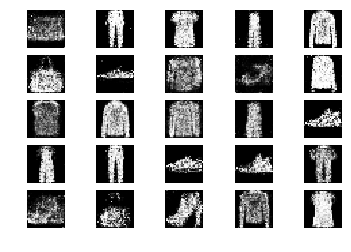

14751 [D loss: 0.627075, acc.: 59.38%] [G loss: 1.033177]
14752 [D loss: 0.644859, acc.: 65.62%] [G loss: 0.922439]
14753 [D loss: 0.648602, acc.: 64.06%] [G loss: 0.886802]
14754 [D loss: 0.614354, acc.: 70.31%] [G loss: 0.886997]
14755 [D loss: 0.699373, acc.: 45.31%] [G loss: 0.949911]
14756 [D loss: 0.554417, acc.: 76.56%] [G loss: 0.917515]
14757 [D loss: 0.607519, acc.: 62.50%] [G loss: 0.878300]
14758 [D loss: 0.693061, acc.: 45.31%] [G loss: 0.865491]
14759 [D loss: 0.719950, acc.: 54.69%] [G loss: 0.844126]
14760 [D loss: 0.635062, acc.: 65.62%] [G loss: 0.892673]
14761 [D loss: 0.645341, acc.: 64.06%] [G loss: 0.925705]
14762 [D loss: 0.706264, acc.: 48.44%] [G loss: 0.925088]
14763 [D loss: 0.613821, acc.: 56.25%] [G loss: 0.911443]
14764 [D loss: 0.672004, acc.: 59.38%] [G loss: 0.998843]
14765 [D loss: 0.645625, acc.: 64.06%] [G loss: 0.958143]
14766 [D loss: 0.649914, acc.: 62.50%] [G loss: 0.947114]
14767 [D loss: 0.685492, acc.: 54.69%] [G loss: 0.852900]
14768 [D loss:

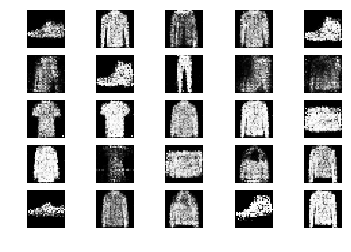

14801 [D loss: 0.677864, acc.: 60.94%] [G loss: 0.980077]
14802 [D loss: 0.671074, acc.: 59.38%] [G loss: 0.852808]
14803 [D loss: 0.652501, acc.: 60.94%] [G loss: 0.893596]
14804 [D loss: 0.709588, acc.: 56.25%] [G loss: 0.942047]
14805 [D loss: 0.637471, acc.: 60.94%] [G loss: 0.895801]
14806 [D loss: 0.679831, acc.: 51.56%] [G loss: 0.936662]
14807 [D loss: 0.686846, acc.: 56.25%] [G loss: 0.817369]
14808 [D loss: 0.602021, acc.: 76.56%] [G loss: 0.880449]
14809 [D loss: 0.735570, acc.: 59.38%] [G loss: 0.937658]
14810 [D loss: 0.706270, acc.: 62.50%] [G loss: 0.898403]
14811 [D loss: 0.649540, acc.: 56.25%] [G loss: 0.918730]
14812 [D loss: 0.647789, acc.: 64.06%] [G loss: 0.925988]
14813 [D loss: 0.643552, acc.: 68.75%] [G loss: 0.845844]
14814 [D loss: 0.640818, acc.: 64.06%] [G loss: 0.957754]
14815 [D loss: 0.651052, acc.: 59.38%] [G loss: 0.912445]
14816 [D loss: 0.636966, acc.: 60.94%] [G loss: 0.807494]
14817 [D loss: 0.741781, acc.: 43.75%] [G loss: 0.845011]
14818 [D loss:

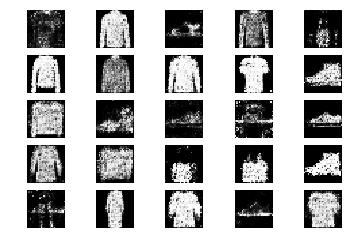

14851 [D loss: 0.648667, acc.: 64.06%] [G loss: 0.877308]
14852 [D loss: 0.626008, acc.: 67.19%] [G loss: 0.771143]
14853 [D loss: 0.626589, acc.: 59.38%] [G loss: 0.882944]
14854 [D loss: 0.615300, acc.: 71.88%] [G loss: 0.988081]
14855 [D loss: 0.678129, acc.: 53.12%] [G loss: 0.923856]
14856 [D loss: 0.642885, acc.: 65.62%] [G loss: 0.846177]
14857 [D loss: 0.683507, acc.: 54.69%] [G loss: 0.882506]
14858 [D loss: 0.637502, acc.: 67.19%] [G loss: 0.831664]
14859 [D loss: 0.669395, acc.: 53.12%] [G loss: 0.948211]
14860 [D loss: 0.663964, acc.: 57.81%] [G loss: 0.836692]
14861 [D loss: 0.714210, acc.: 57.81%] [G loss: 0.895804]
14862 [D loss: 0.644181, acc.: 62.50%] [G loss: 0.908792]
14863 [D loss: 0.603909, acc.: 70.31%] [G loss: 0.916511]
14864 [D loss: 0.726625, acc.: 53.12%] [G loss: 0.877045]
14865 [D loss: 0.700273, acc.: 53.12%] [G loss: 0.934483]
14866 [D loss: 0.678937, acc.: 57.81%] [G loss: 0.949380]
14867 [D loss: 0.622493, acc.: 65.62%] [G loss: 1.027030]
14868 [D loss:

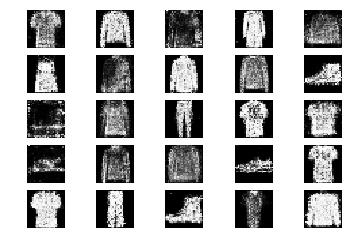

14901 [D loss: 0.674675, acc.: 53.12%] [G loss: 0.851676]
14902 [D loss: 0.616577, acc.: 62.50%] [G loss: 0.858875]
14903 [D loss: 0.763691, acc.: 56.25%] [G loss: 0.919102]
14904 [D loss: 0.631015, acc.: 60.94%] [G loss: 0.966414]
14905 [D loss: 0.709042, acc.: 54.69%] [G loss: 0.915938]
14906 [D loss: 0.692981, acc.: 54.69%] [G loss: 0.902749]
14907 [D loss: 0.642749, acc.: 62.50%] [G loss: 0.822388]
14908 [D loss: 0.568134, acc.: 81.25%] [G loss: 0.855648]
14909 [D loss: 0.658669, acc.: 56.25%] [G loss: 0.899360]
14910 [D loss: 0.690260, acc.: 53.12%] [G loss: 0.865979]
14911 [D loss: 0.667365, acc.: 59.38%] [G loss: 0.881053]
14912 [D loss: 0.678896, acc.: 56.25%] [G loss: 0.879971]
14913 [D loss: 0.653085, acc.: 57.81%] [G loss: 0.828639]
14914 [D loss: 0.707704, acc.: 54.69%] [G loss: 0.870783]
14915 [D loss: 0.630345, acc.: 65.62%] [G loss: 0.900104]
14916 [D loss: 0.683392, acc.: 50.00%] [G loss: 0.853810]
14917 [D loss: 0.608370, acc.: 67.19%] [G loss: 0.873519]
14918 [D loss:

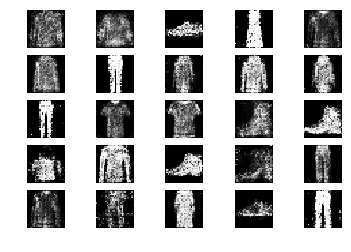

14951 [D loss: 0.623834, acc.: 60.94%] [G loss: 0.924886]
14952 [D loss: 0.672503, acc.: 57.81%] [G loss: 0.809477]
14953 [D loss: 0.654476, acc.: 62.50%] [G loss: 0.967181]
14954 [D loss: 0.698410, acc.: 57.81%] [G loss: 0.882557]
14955 [D loss: 0.661327, acc.: 57.81%] [G loss: 0.870971]
14956 [D loss: 0.679855, acc.: 59.38%] [G loss: 0.868222]
14957 [D loss: 0.727655, acc.: 53.12%] [G loss: 0.897763]
14958 [D loss: 0.623298, acc.: 57.81%] [G loss: 0.933997]
14959 [D loss: 0.613330, acc.: 70.31%] [G loss: 0.933802]
14960 [D loss: 0.662424, acc.: 60.94%] [G loss: 0.831128]
14961 [D loss: 0.655475, acc.: 59.38%] [G loss: 0.934498]
14962 [D loss: 0.615558, acc.: 67.19%] [G loss: 0.888542]
14963 [D loss: 0.700591, acc.: 57.81%] [G loss: 0.892999]
14964 [D loss: 0.664877, acc.: 62.50%] [G loss: 0.893871]
14965 [D loss: 0.654475, acc.: 62.50%] [G loss: 0.963776]
14966 [D loss: 0.599379, acc.: 67.19%] [G loss: 0.892195]
14967 [D loss: 0.716983, acc.: 59.38%] [G loss: 0.865680]
14968 [D loss:

In [10]:
epochs = 15000
batch_size = 32

valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):
  
  # Train discriminator
  idx = np.random.randint(0, X_train.shape[0], batch_size)
  imgs = X_train[idx]

  noise = np.random.normal(0, 1, (batch_size, 100))

  gen_imgs = generator.predict(noise)

  d_loss_real = discriminator.train_on_batch(imgs, valid)
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

  # Train generator
  noise = np.random.normal(0, 1, (batch_size, 100))

  g_loss = combined.train_on_batch(noise, valid)

  print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

  if epoch % 50 == 0:
    sample_images(epoch)

**Examples of generated images**

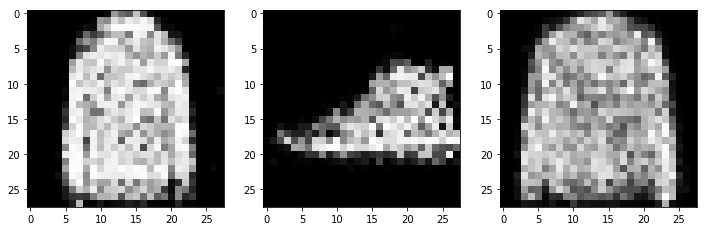

In [15]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r*c, 100))
gen_imgs = generator.predict(noise)

gen_imgs = 0.5*gen_imgs+0.5

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
plt.subplot(132)
plt.imshow(gen_imgs[1, :, :, 0], cmap='gray')
plt.subplot(133)
plt.imshow(gen_imgs[2, :, :, 0], cmap='gray')
plt.show()
plt.close()